# Spectra with Fe K$\alpha$ line

Loop over selected sources from the NXSA (e.g. all PN-LW after revolution 1500) and extract the spectrum products, plot the source spectrum.

In [168]:
import os, io
import requests
import gzip
import tarfile
import numpy as np

from astropy.io import fits, ascii
from astropy.table import Table
from astropy.convolution import convolve, Box1DKernel, Gaussian1DKernel

%matplotlib inline
import matplotlib.pylab as plt
import seaborn as sns
sns.set(style="white")

plt.rc('text', usetex=False)
plt.rc('font', family='serif')


In [87]:
def get_pn_spectrum(obsid, cache=True, cache_dir=".",verbose=True):
    #
    # Download the XMM PPS and extract the spectrum of the first/brightest source
    #
    #
    instrument = 'PN'
    substr = 'SRSPEC0001' # the first/brightest source spectrum
    ext = 'FTZ'
    #
    nxsa_url = f'https://nxsa.esac.esa.int/nxsa-sl/servlet/data-action-aio?obsno={obsid}&level=PPS'
    #
    pps_tarfile = f'{cache_dir}/{obsid}_PPS_nxsa.tar'
    if (cache and os.path.isfile(pps_tarfile)):
            print ("Found an already existing PPS tar file: {}. Will reuse it.".format(pps_tarfile))
    else:
        print (f"Downloading PPS for {obsid} from NXSA. Please wait...")
        with requests.post(nxsa_url, auth=('ivaltcha', 'Q1.2019.abc')) as r:
        #with requests.post(nxsa_url) as r:
            r.raise_for_status()
            with open(pps_tarfile, "wb") as tmp:
                tmp.write(r.content)
        print (f"Saved to {pps_tarfile}")
    #
    hdu = None
    with tarfile.open(pps_tarfile,'r') as tar:
        for member in tar.getmembers():
                if ((instrument in member.name) and (ext in member.name) and (substr in member.name)):
                    f=tar.extractfile(member)
                    hdu = fits.open(gzip.open(io.BytesIO(f.read())))
                    print (f"Extracted {member.name}")
                #
            #
        #
    return hdu

In [158]:
def get_pn_spectrum_pdf(obsid, cache=True, cache_dir=".",outdir=".",verbose=True):
    #
    # Download the XMM PPS and extract the PDF spectrum of the first/brightest source in PN
    #
    #
    instrument = 'PN'
    substr = 'SPCPLT0001' # the first/brightest source spectrum
    ext = 'PDF'
    #
    nxsa_url = f'https://nxsa.esac.esa.int/nxsa-sl/servlet/data-action-aio?obsno={obsid}&level=PPS'
    #
    pps_tarfile = f'{cache_dir}/{obsid}_PPS_nxsa.tar'
    if (cache and os.path.isfile(pps_tarfile)):
            print ("Found an already existing PPS tar file: {}. Will reuse it.".format(pps_tarfile))
    else:
        print (f"Downloading PPS for {obsid} from NXSA. Please wait...")
        with requests.post(nxsa_url, auth=('ivaltcha', 'Q1.2019.abc')) as r:
        #with requests.post(nxsa_url) as r:
            r.raise_for_status()
            with open(pps_tarfile, "wb") as tmp:
                tmp.write(r.content)
        print (f"Saved to {pps_tarfile}")
    #
    with tarfile.open(pps_tarfile,'r') as tar:
        for member in tar.getmembers():
                if ((instrument in member.name) and (ext in member.name) and (substr in member.name)):
                    f=tar.extract(member,path=outdir)
                    print (f"Extracted {member.name} to {outdir}")
                #
            #
        #
    return

In [184]:
def plot_spectrum(spec_hdu,what='energy',xlim=(0.2,12.0),counts_lim = 100, smooth = None, sigma = None,
                  annotation="",loglog=True,pngName=""):
    #
    # ann is an annotation to pass
    # sigma is the Gaussian1D kernel sigma in eV
    # count_lim is the lower number of counts in [2,10] keV
    #
    spec_ext = spec_hdu['SPECTRUM']
    obsx = spec_hdu[0].header['OBS_ID']
    target = spec_hdu[0].header['OBJECT']
    #
    ebin = spec_ext.header['SPECDELT'] # the binning
    expo = spec_ext.header['EXPOSURE']/1000.0 # in ksec
    #
    channel = spec_ext.data['CHANNEL']
    energy  = channel*ebin/1000.0 # in keV
    if (what == 'energy'):
        x = energy
    else:
        x = channel
    #
    counts = spec_ext.data['COUNTS']
    #
    counts2_10 = np.sum(counts[np.where((energy <= 10.0) & (energy >= 2.0))])
    if (counts2_10 < counts_lim):
        return None
    #
    fig,ax = plt.subplots(figsize=(15,10))
    if (loglog):
        ax.loglog(x,counts,drawstyle='steps-mid')
    else:
        ax.plot(x,counts,drawstyle='steps-mid')
    if (smooth != None):
        y = convolve(counts, Box1DKernel(smooth),boundary='wrap')
        if (loglog):
            ax.loglog(x,y,color='red')
        else:
            ax.plot(x,y,color='red')
    if (sigma != None):
        sig_chan = sigma/ebin
        y = convolve(counts, Gaussian1DKernel(sig_chan),boundary='wrap')
        if (loglog):
            ax.loglog(x,y,color='green')
        else:
            ax.plot(x,y,color='green')
    ymax = np.max(y[np.where((x <= xlim[1]) & (x >= xlim[0]))])
    ax.text(0.1,0.1,annotation,transform=ax.transAxes)
    ax.axvline(6.4,linewidth=10.0,color='pink',alpha=0.3)
    ax.set_xlim(xlim)
    ax.set_ylim((0.1,ymax))
    ax.set_title(f"OBS_ID: {obsx}, expo: {expo:.1f} ks counts 2-10 keV: {counts2_10}\n {target}")
    ax.set_xlabel("Energy (keV)")
    ax.set_ylabel("Counts")
    ax.grid()
    # save the plot
    if (pngName != ""):
        plt.savefig(pngName)
    plt.show()
    plt.close()
#

In [108]:
wdir = os.path.expanduser('~') + '/IVAN/PN_LW'
t = Table.read(f'{wdir}/PN-LW_rev1500.csv',delimiter=",")
rev = t['OBSERVATION.REVOLUTION']
ttype = t['TARGET_TYPE.DESCRIPTION']
ann = [f"Rev: {i}, Type: {j}" for i,j in zip(rev,ttype)]

In [132]:
obsid = [f"{x:010}" for x in t['OBSERVATION.OBSERVATION_ID']]
pngNames = [f"{i}_{j}_src01_pn_specplot.png" for i,j in zip(rev,obsid)]

In [157]:
#
# this is the folder where the PPS tar files will be stored
#
tmpDir = "/lhome/ivaltchanov/XMM-data/cache"
if (not os.path.isdir(tmpDir)):
    print (f"Cache folder {tmpDir} does not exist. Will create it.")
    os.mkdir(tmpDir)
pdfDir = "/lhome/ivaltchanov/XMM-data/PDF"
if (not os.path.isdir(pdfDir)):
    print (f"Cache folder {pdfDir} does not exist. Will create it.")
    os.mkdir(pdfDir)

Cache folder /lhome/ivaltchanov/XMM-data/PDF does not exist. Will create it.


In [ ]:
for i,j in enumerate(obsid):
    get_pn_spectrum_pdf(j,cache_dir=tmpDir,outdir=pdfDir)

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0502060901_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0502630201_PPS_nxsa.tar. Will reuse it.
Extracted 0502630201/pps/P0502630201PNS001SRSPEC0001.FTZ


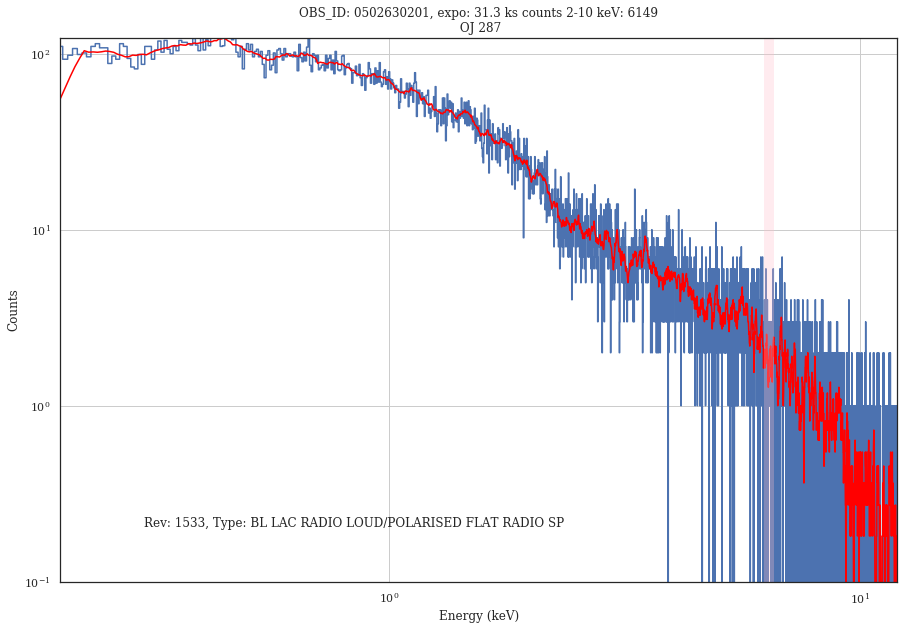

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0502061101_PPS_nxsa.tar. Will reuse it.
Extracted 0502061101/pps/P0502061101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0502061001_PPS_nxsa.tar. Will reuse it.
Extracted 0502061001/pps/P0502061001PNS003SRSPEC0001.FTZ


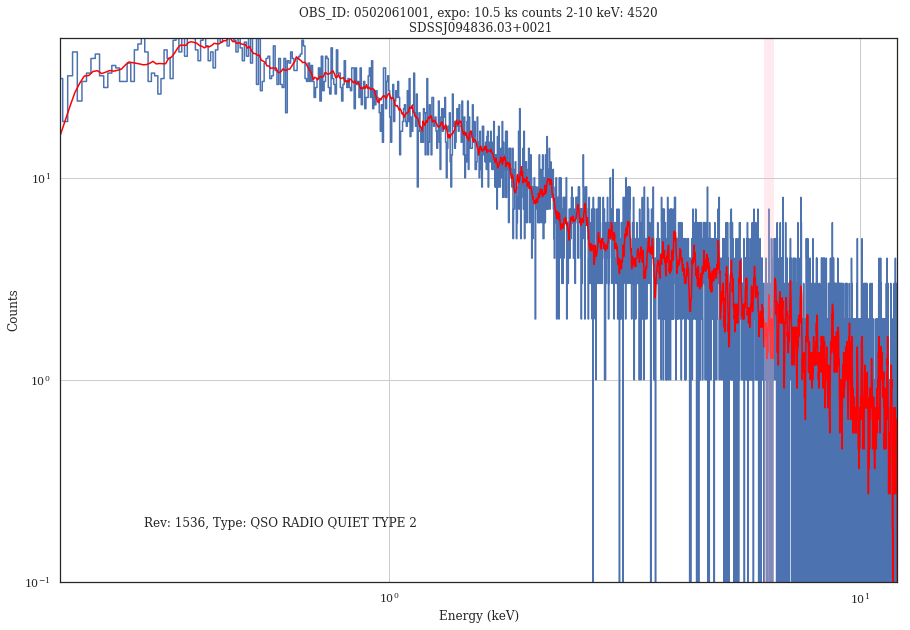

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0556050101_PPS_nxsa.tar. Will reuse it.
Extracted 0556050101/pps/P0556050101PNS003SRSPEC0001.FTZ


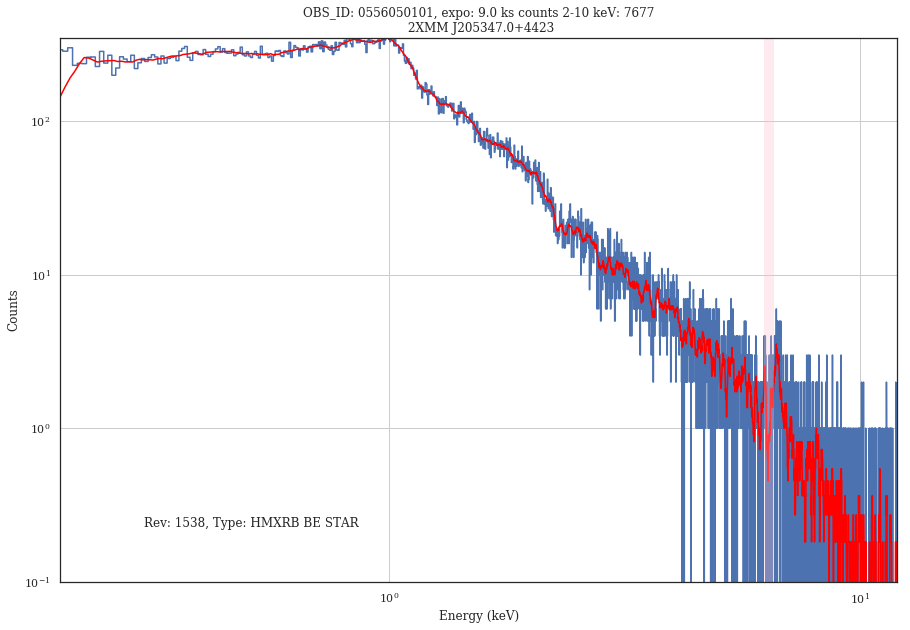

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0551200301_PPS_nxsa.tar. Will reuse it.
Extracted 0551200301/pps/P0551200301PNS006SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0555321001_PPS_nxsa.tar. Will reuse it.
Extracted 0555321001/pps/P0555321001PNS003SRSPEC0001.FTZ


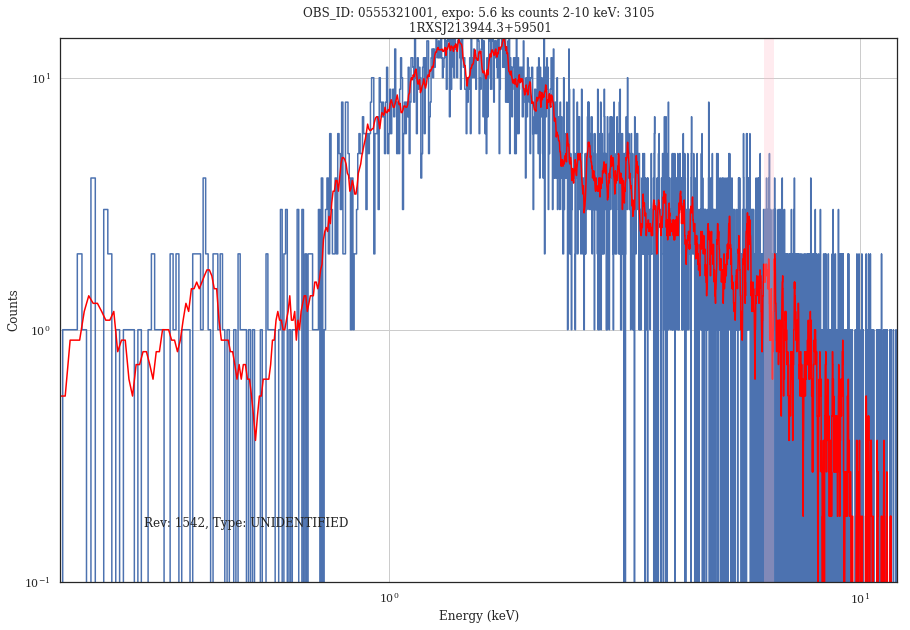

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0411082701_PPS_nxsa.tar. Will reuse it.
Extracted 0411082701/pps/P0411082701PNU002SRSPEC0001.FTZ


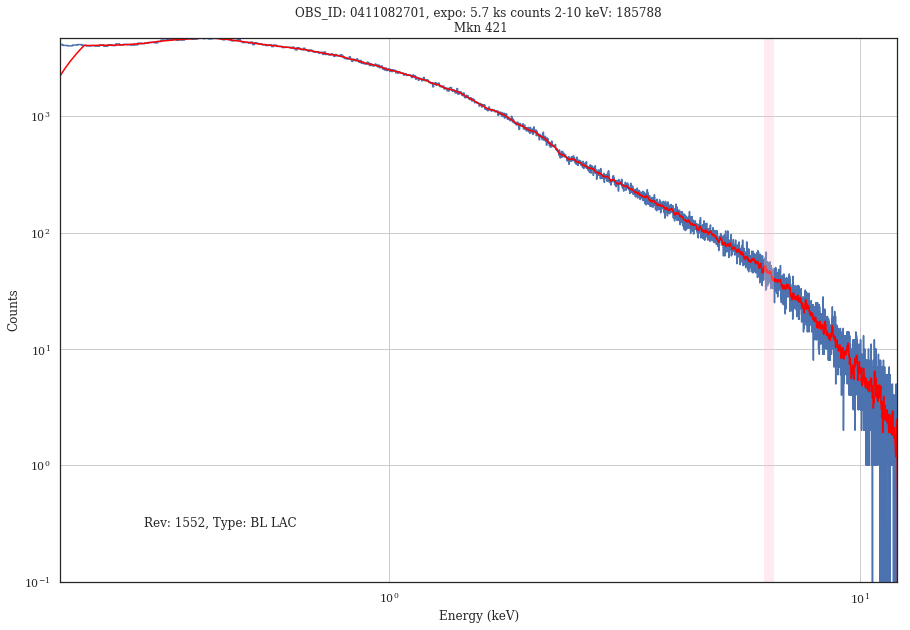

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0555320601_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0551200101_PPS_nxsa.tar. Will reuse it.
Extracted 0551200101/pps/P0551200101PNS006SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0550940201_PPS_nxsa.tar. Will reuse it.
Extracted 0550940201/pps/P0550940201PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0555321401_PPS_nxsa.tar. Will reuse it.
Extracted 0555321401/pps/P0555321401PNS003SRSPEC0001.FTZ


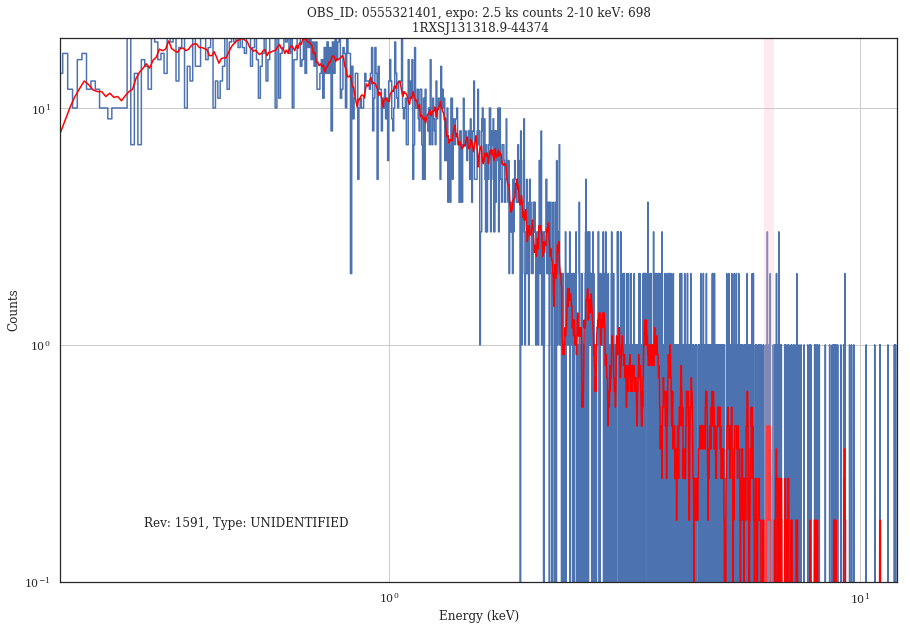

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0555350101_PPS_nxsa.tar. Will reuse it.
Extracted 0555350101/pps/P0555350101PNS003SRSPEC0001.FTZ


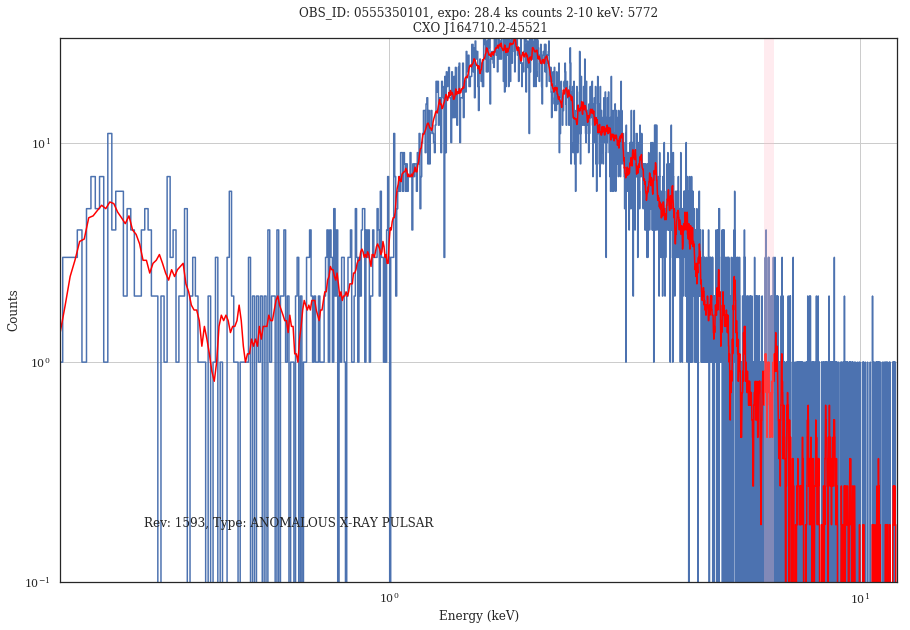

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0552971401_PPS_nxsa.tar. Will reuse it.
Extracted 0552971401/pps/P0552971401PNS003SRSPEC0001.FTZ


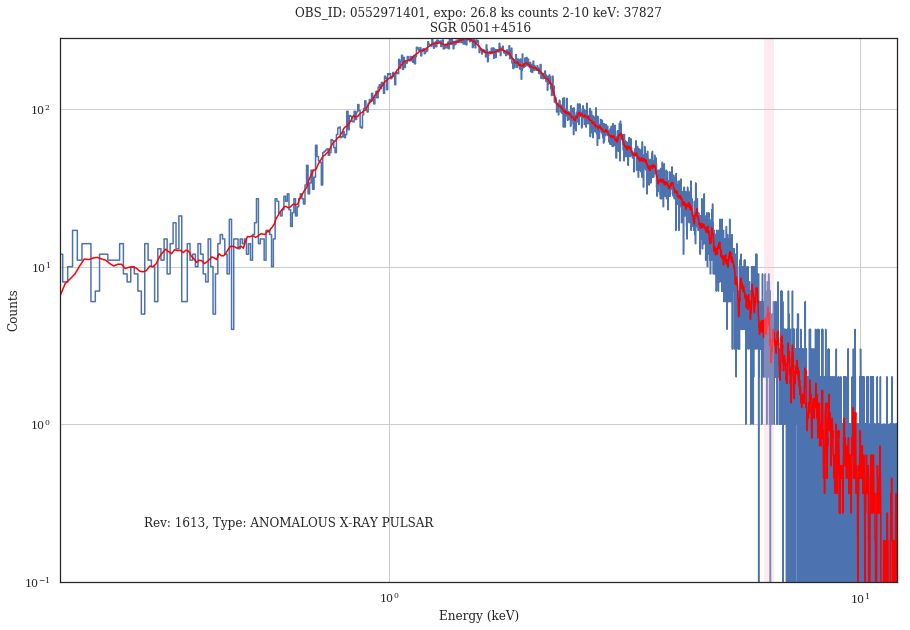

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0554720101_PPS_nxsa.tar. Will reuse it.
Extracted 0554720101/pps/P0554720101PNS003SRSPEC0001.FTZ


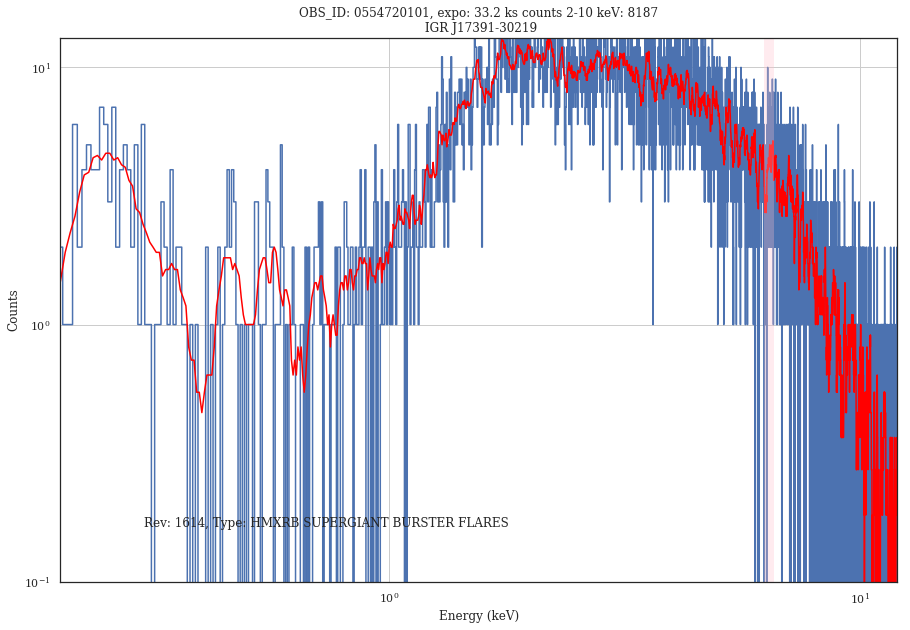

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0555470801_PPS_nxsa.tar. Will reuse it.
Extracted 0555470801/pps/P0555470801PNS003SRSPEC0001.FTZ


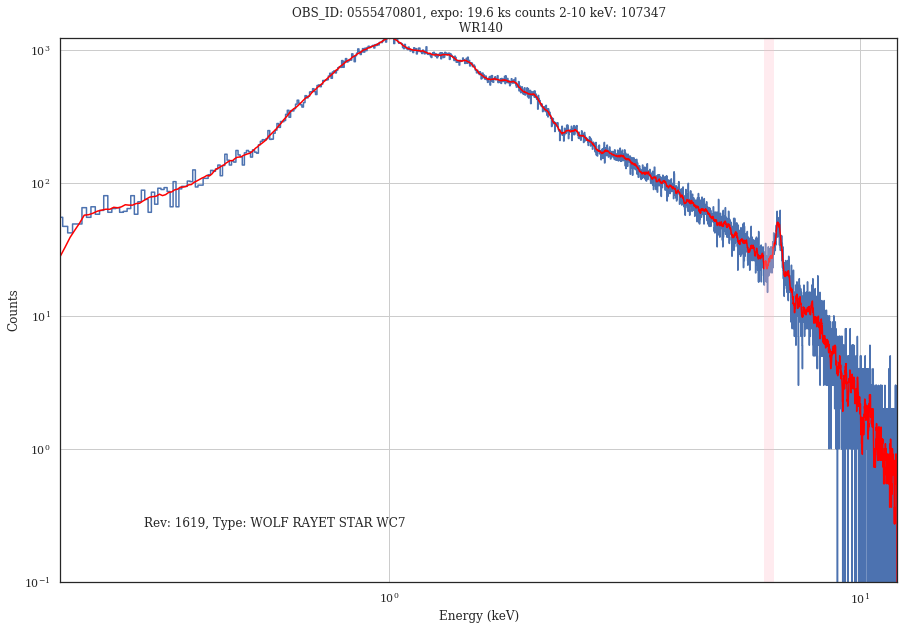

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0551201001_PPS_nxsa.tar. Will reuse it.
Extracted 0551201001/pps/P0551201001PNS006SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0560980101_PPS_nxsa.tar. Will reuse it.
Extracted 0560980101/pps/P0560980101PNS600SRSPEC0001.FTZ


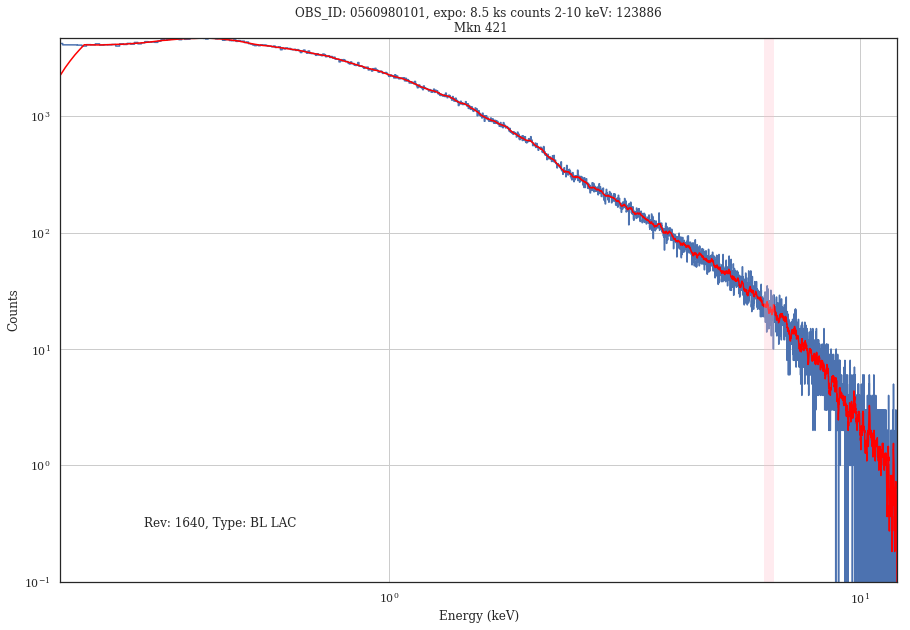

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0555870201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0555470901_PPS_nxsa.tar. Will reuse it.
Extracted 0555470901/pps/P0555470901PNU002SRSPEC0001.FTZ


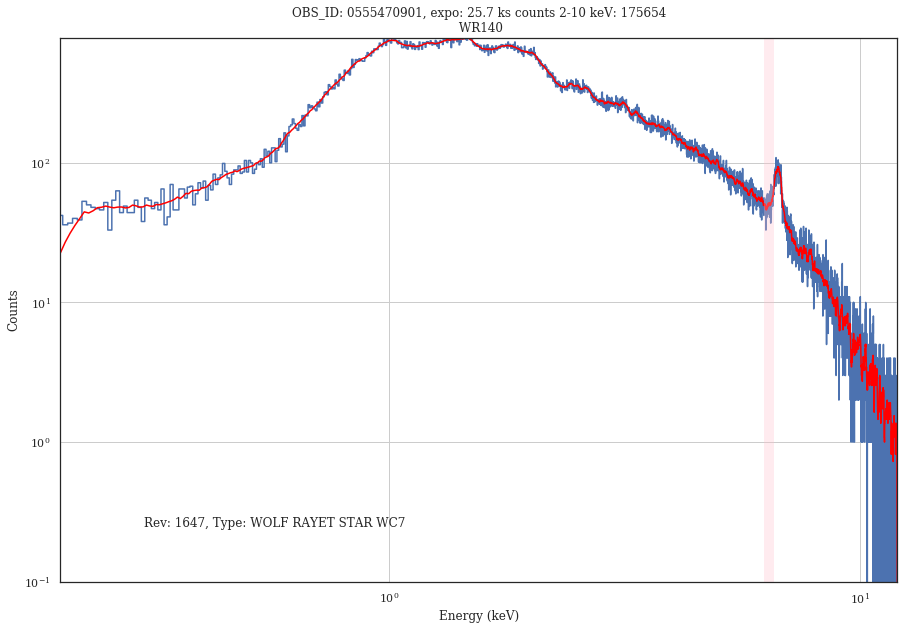

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0550950101_PPS_nxsa.tar. Will reuse it.
Extracted 0550950101/pps/P0550950101PNU002SRSPEC0001.FTZ


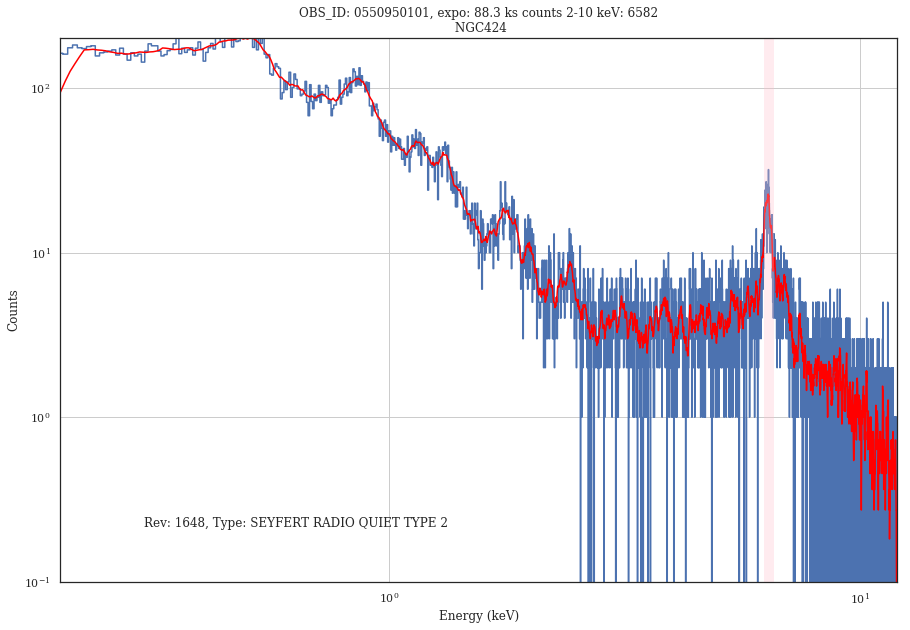

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0550190501_PPS_nxsa.tar. Will reuse it.
Extracted 0550190501/pps/P0550190501PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0555471001_PPS_nxsa.tar. Will reuse it.
Extracted 0555471001/pps/P0555471001PNS003SRSPEC0001.FTZ


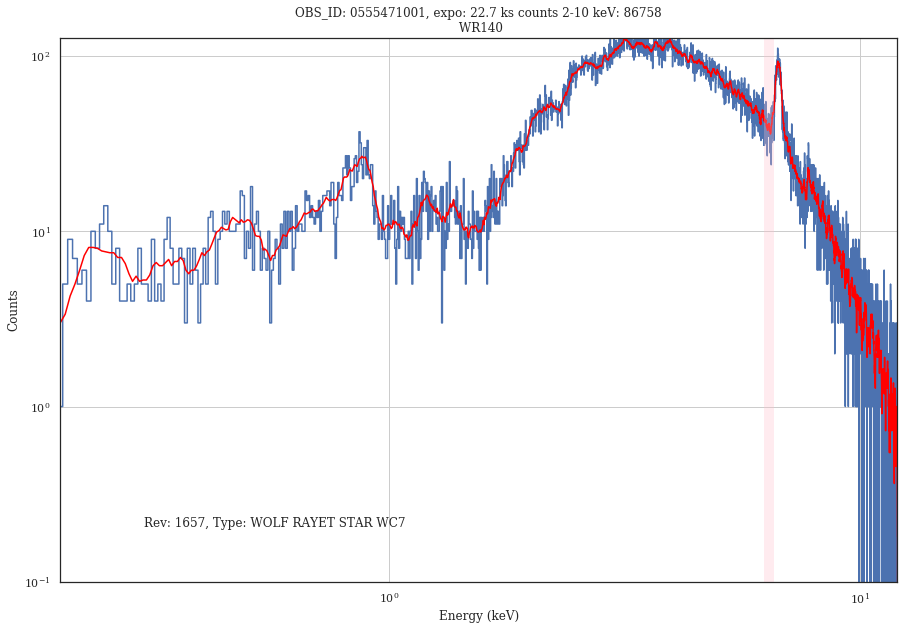

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0553230401_PPS_nxsa.tar. Will reuse it.
Extracted 0553230401/pps/P0553230401PNS003SRSPEC0001.FTZ


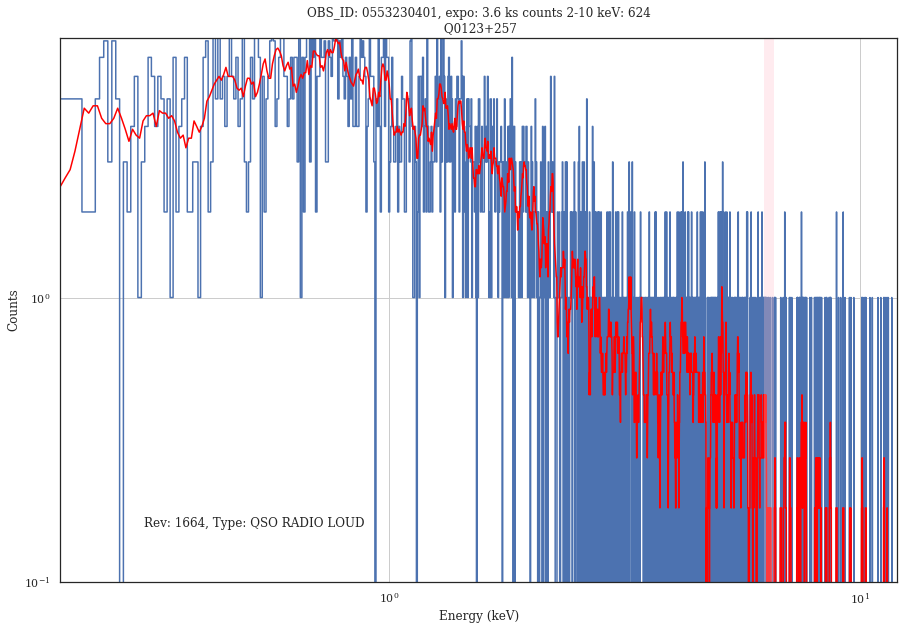

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0560580401_PPS_nxsa.tar. Will reuse it.
Extracted 0560580401/pps/P0560580401PNS001SRSPEC0001.FTZ


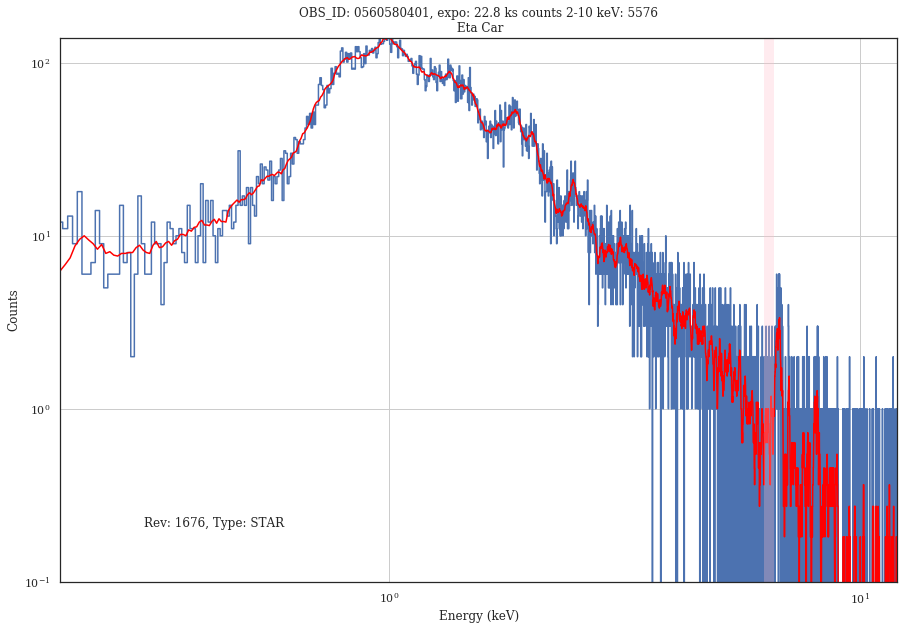

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0554990101_PPS_nxsa.tar. Will reuse it.
Extracted 0554990101/pps/P0554990101PNS001SRSPEC0001.FTZ


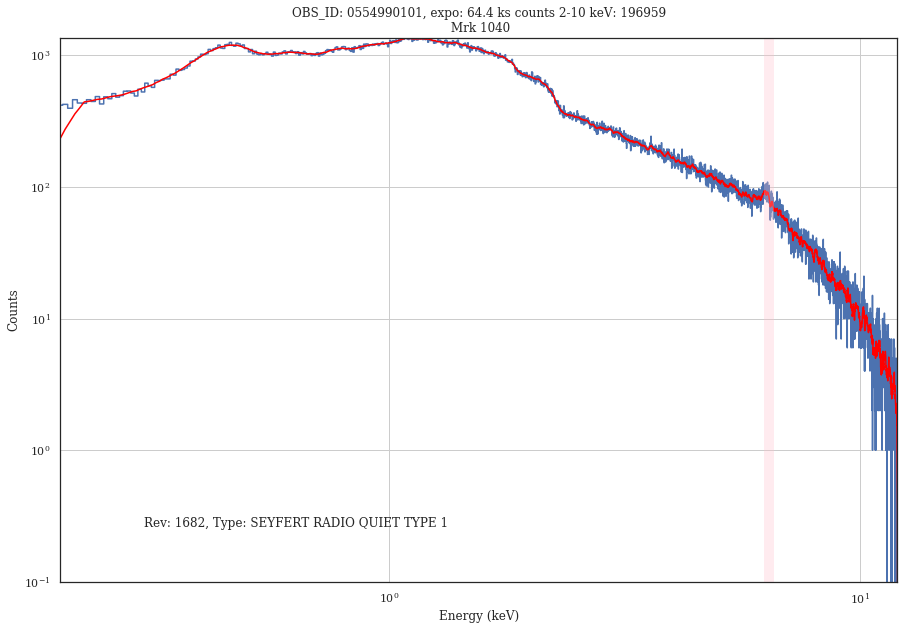

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0550640101_PPS_nxsa.tar. Will reuse it.
Extracted 0550640101/pps/P0550640101PNS003SRSPEC0001.FTZ


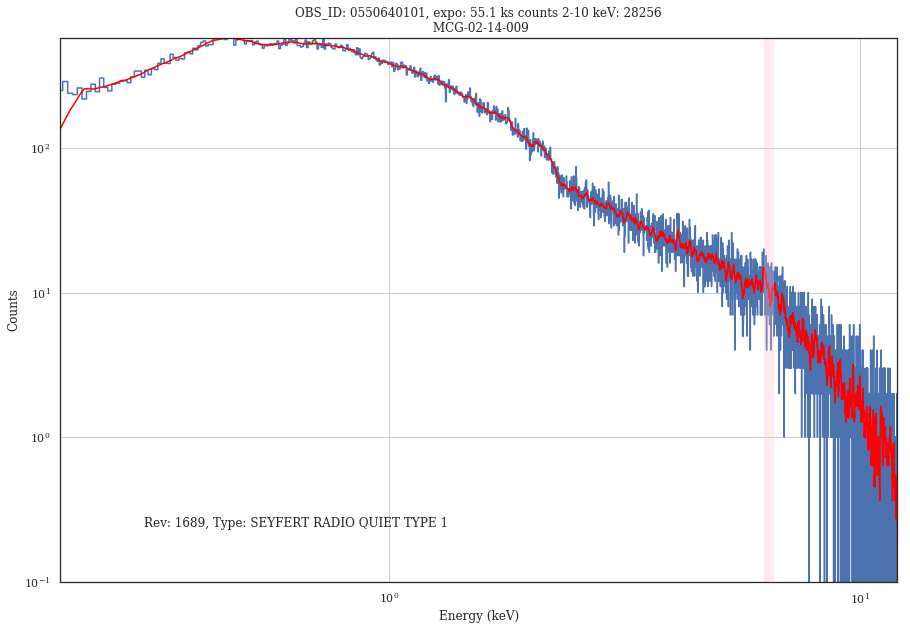

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0551000201_PPS_nxsa.tar. Will reuse it.
Extracted 0551000201/pps/P0551000201PNS003SRSPEC0001.FTZ


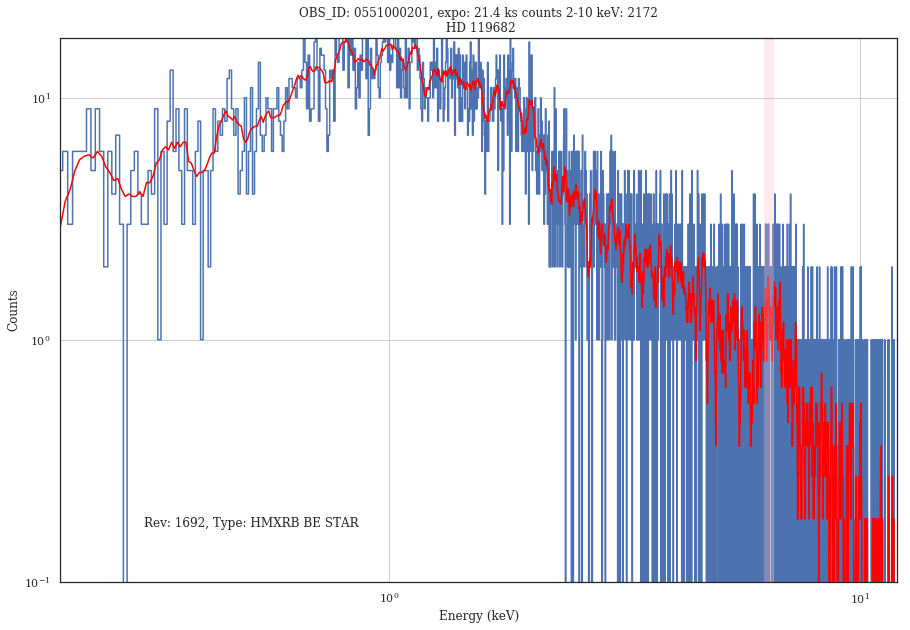

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0552800201_PPS_nxsa.tar. Will reuse it.
Extracted 0552800201/pps/P0552800201PNS001SRSPEC0001.FTZ


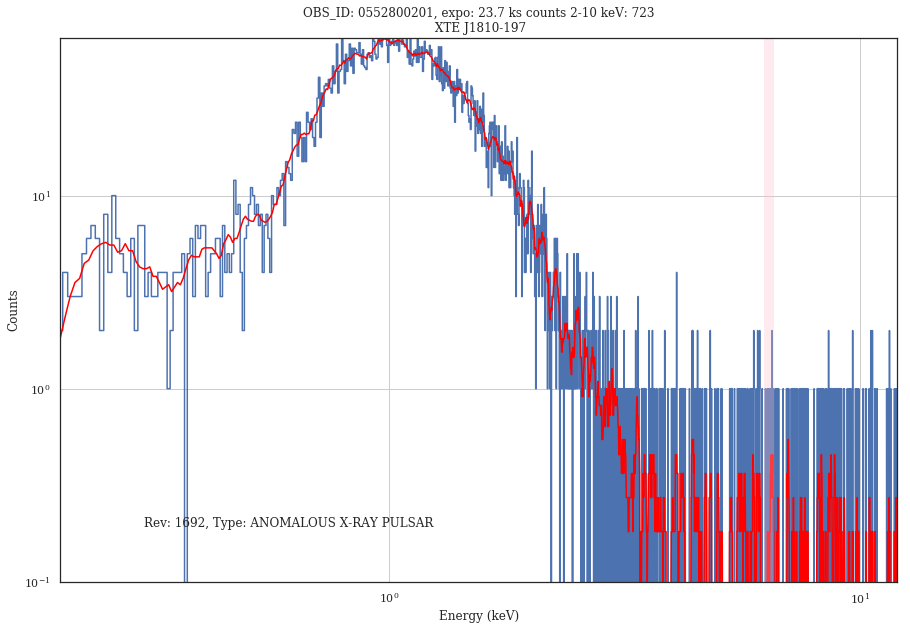

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0551120301_PPS_nxsa.tar. Will reuse it.
Extracted 0551120301/pps/P0551120301PNS003SRSPEC0001.FTZ


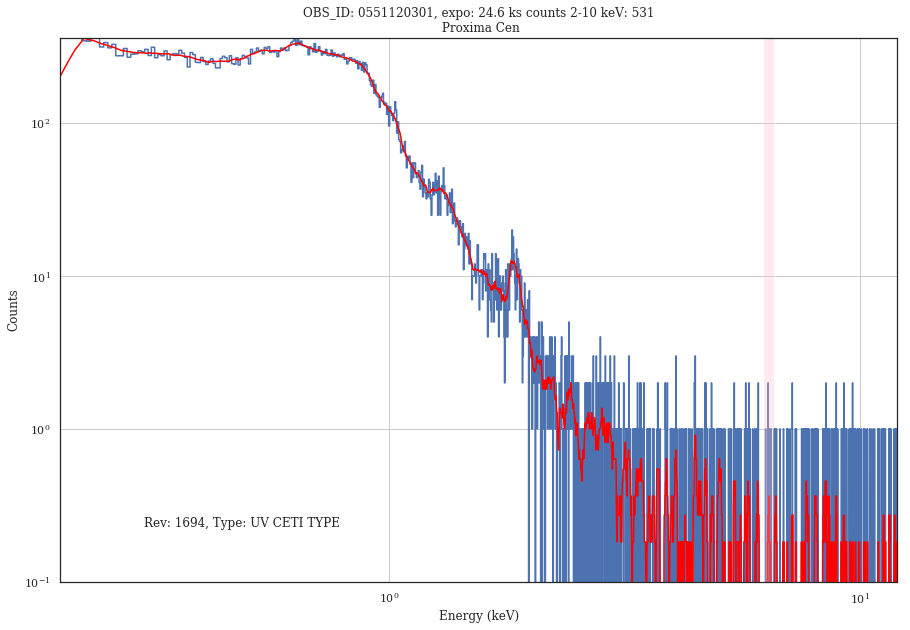

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0553850101_PPS_nxsa.tar. Will reuse it.
Extracted 0553850101/pps/P0553850101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0551120201_PPS_nxsa.tar. Will reuse it.
Extracted 0551120201/pps/P0551120201PNS003SRSPEC0001.FTZ


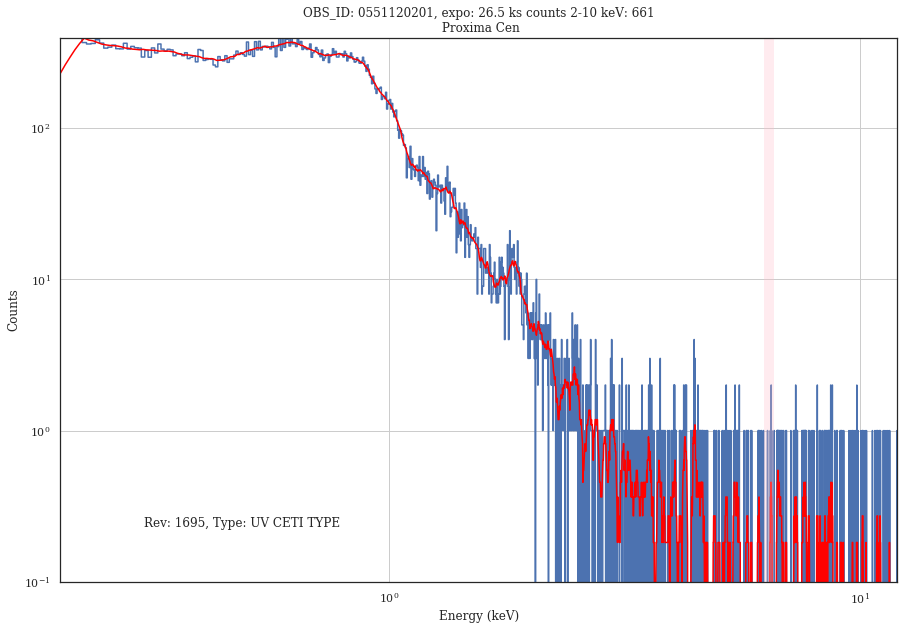

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0551120401_PPS_nxsa.tar. Will reuse it.
Extracted 0551120401/pps/P0551120401PNS003SRSPEC0001.FTZ


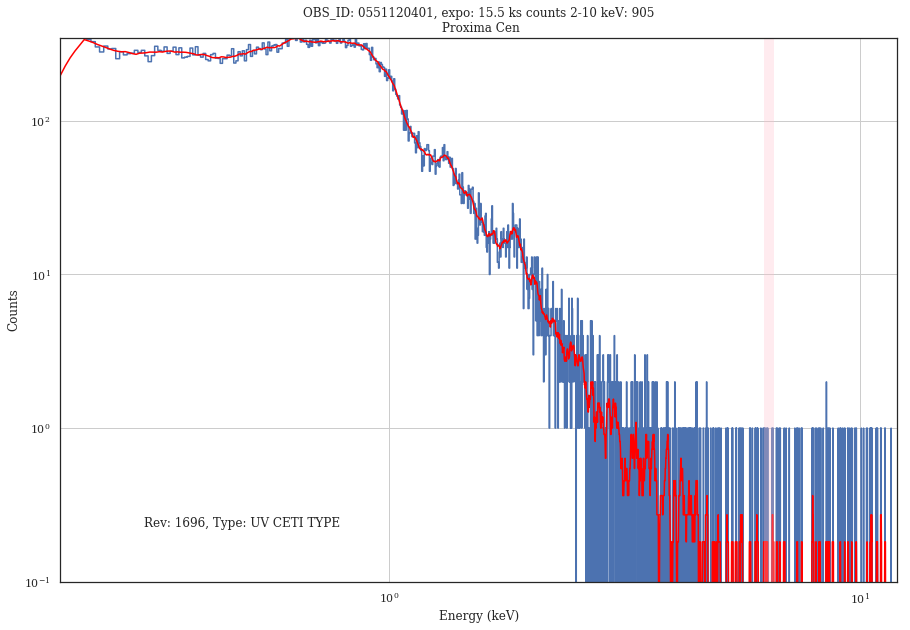

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0554140401_PPS_nxsa.tar. Will reuse it.
Extracted 0554140401/pps/P0554140401PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0550190201_PPS_nxsa.tar. Will reuse it.
Extracted 0550190201/pps/P0550190201PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0555471101_PPS_nxsa.tar. Will reuse it.
Extracted 0555471101/pps/P0555471101PNS003SRSPEC0001.FTZ


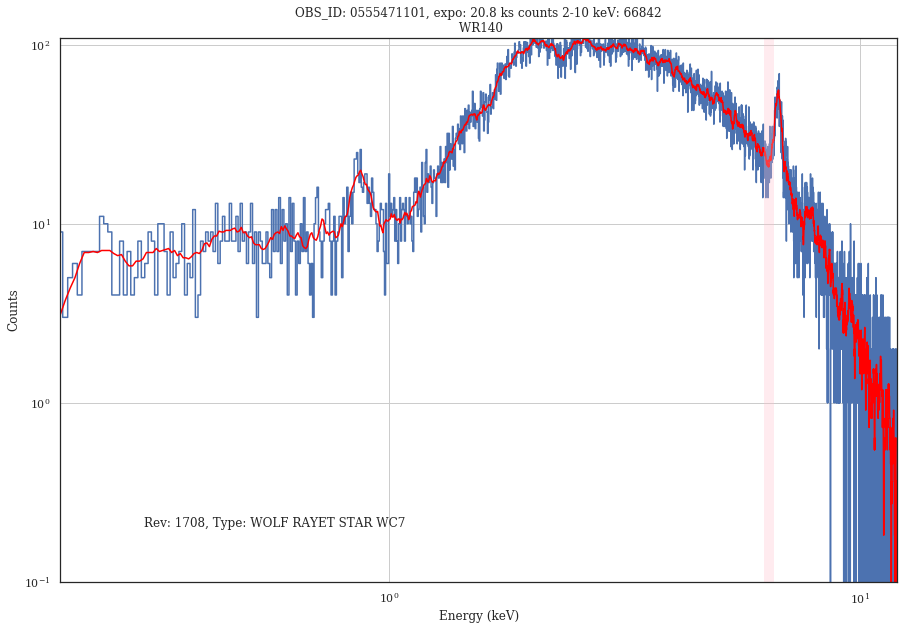

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0555471201_PPS_nxsa.tar. Will reuse it.
Extracted 0555471201/pps/P0555471201PNS003SRSPEC0001.FTZ


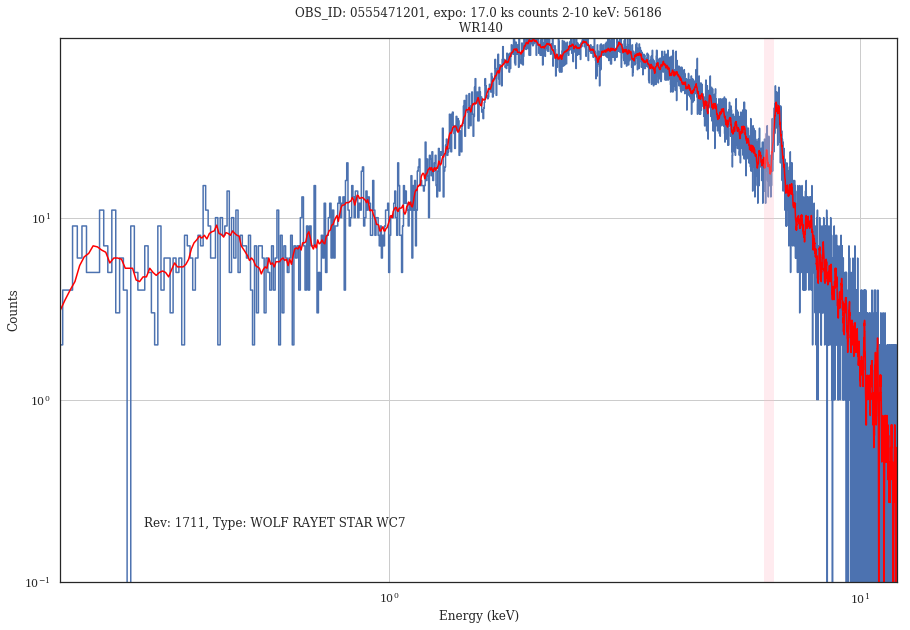

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0554710101_PPS_nxsa.tar. Will reuse it.
Extracted 0554710101/pps/P0554710101PNS003SRSPEC0001.FTZ


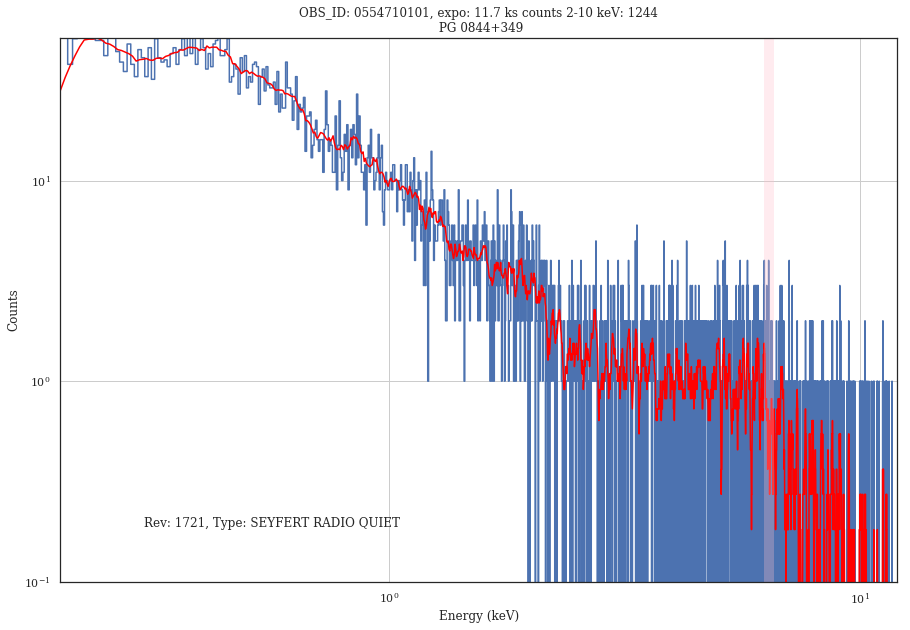

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0601780501_PPS_nxsa.tar. Will reuse it.
Extracted 0601780501/pps/P0601780501PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0560983301_PPS_nxsa.tar. Will reuse it.
Extracted 0560983301/pps/P0560983301PNS600SRSPEC0001.FTZ


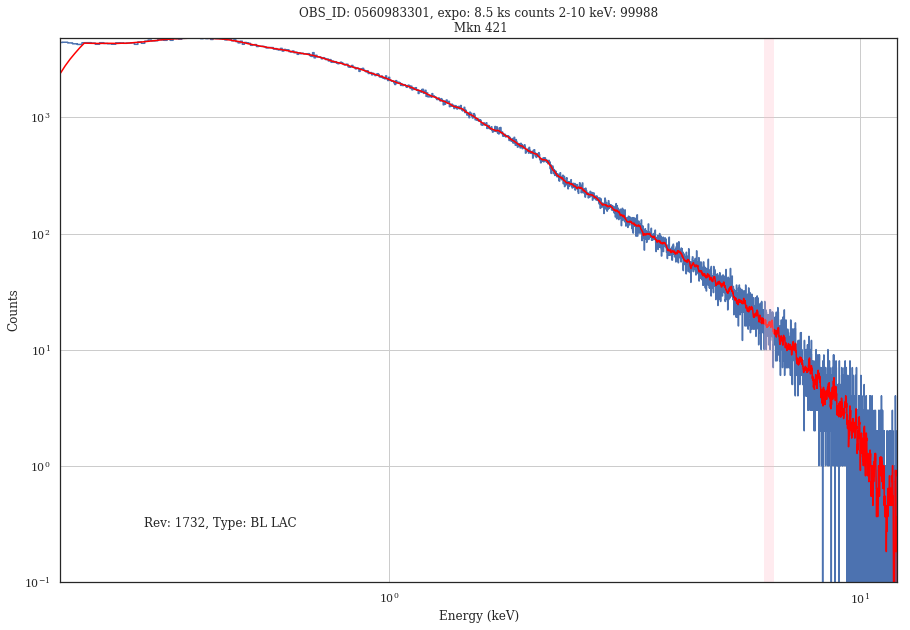

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0601560201_PPS_nxsa.tar. Will reuse it.
Extracted 0601560201/pps/P0601560201PNS003SRSPEC0001.FTZ


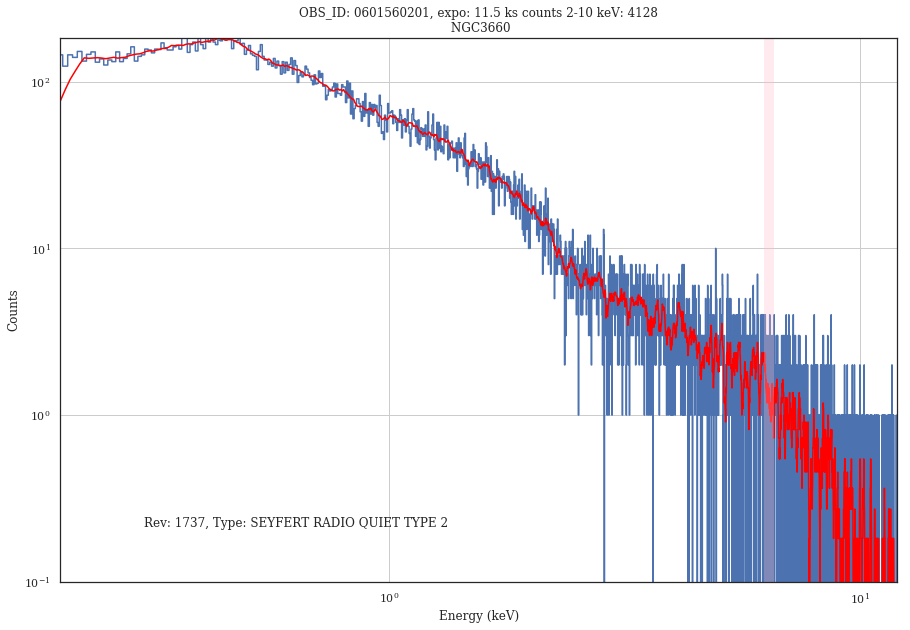

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0602490101_PPS_nxsa.tar. Will reuse it.
Extracted 0602490101/pps/P0602490101PNS003SRSPEC0001.FTZ


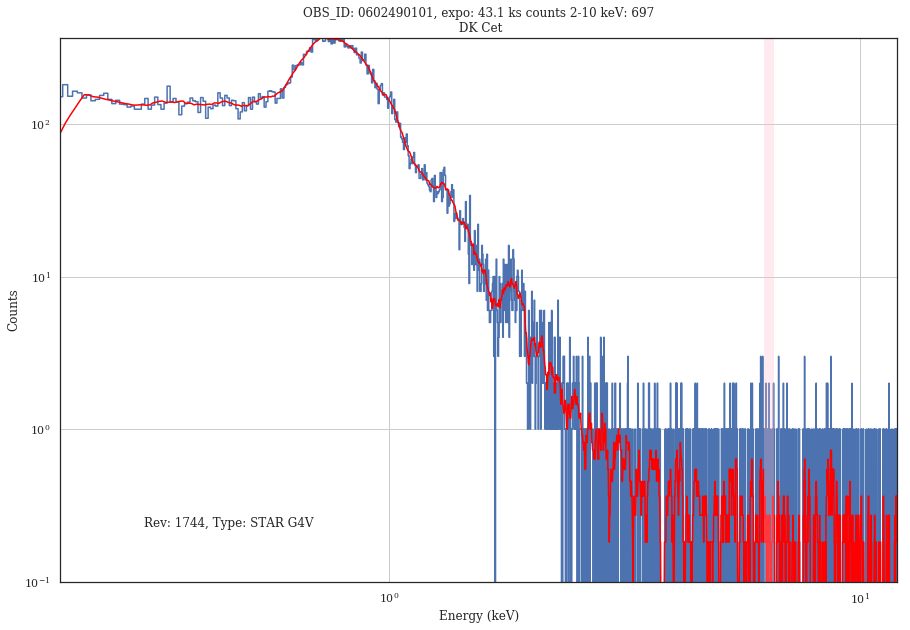

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0412380401_PPS_nxsa.tar. Will reuse it.
Extracted 0412380401/pps/P0412380401PNS003SRSPEC0001.FTZ


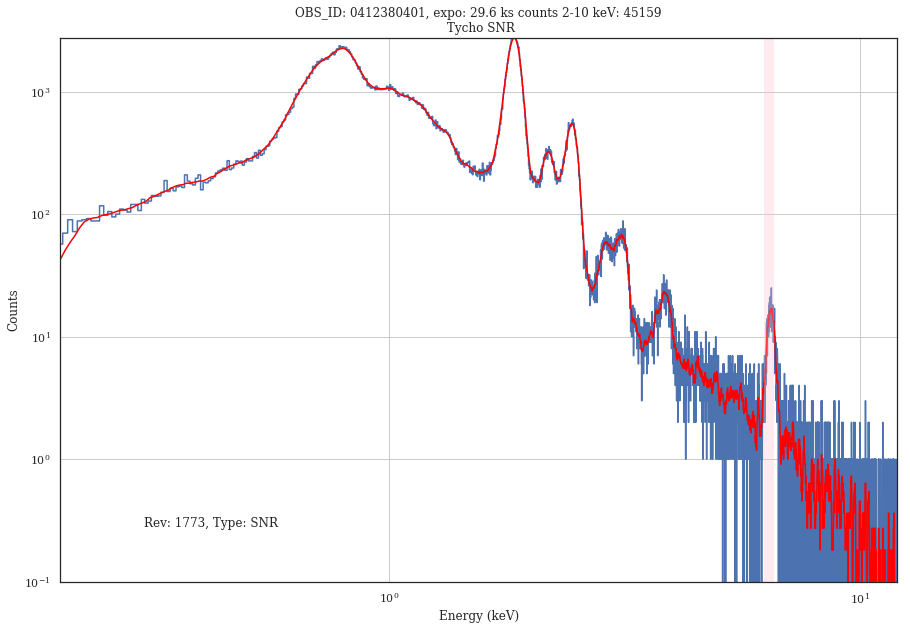

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0604380101_PPS_nxsa.tar. Will reuse it.
Extracted 0604380101/pps/P0604380101PNS001SRSPEC0001.FTZ


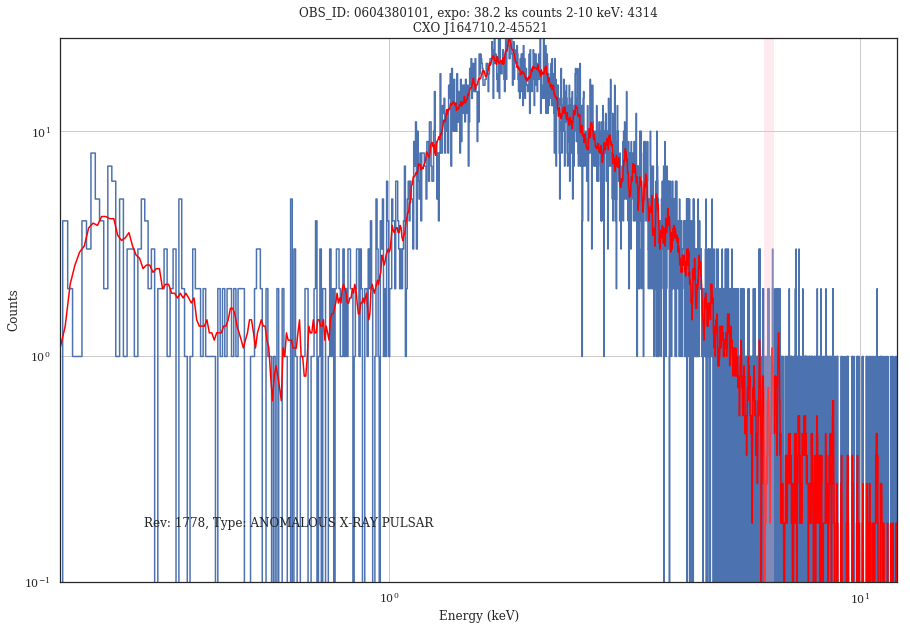

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0605990201_PPS_nxsa.tar. Will reuse it.
Extracted 0605990201/pps/P0605990201PNS001SRSPEC0001.FTZ


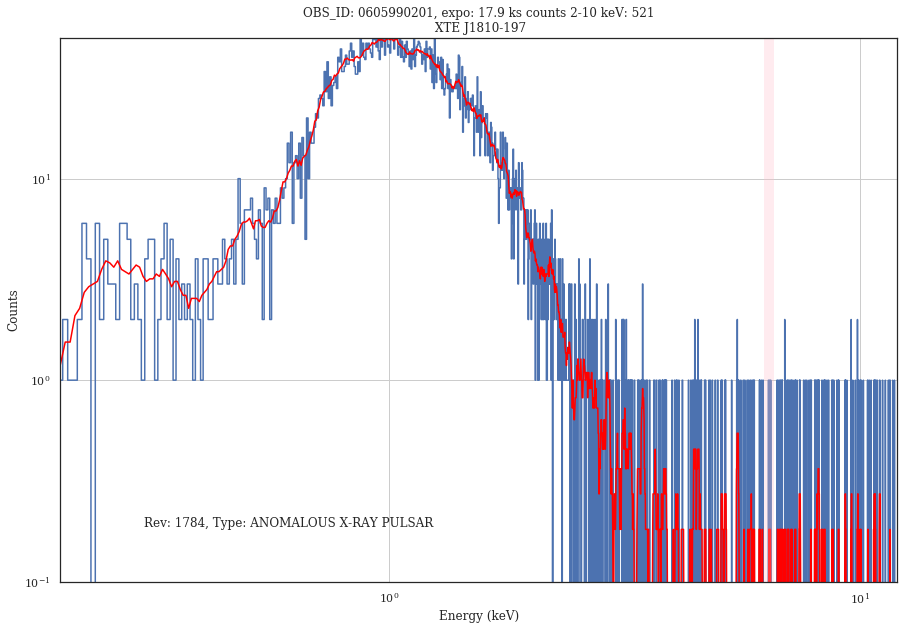

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0605990301_PPS_nxsa.tar. Will reuse it.
Extracted 0605990301/pps/P0605990301PNS001SRSPEC0001.FTZ


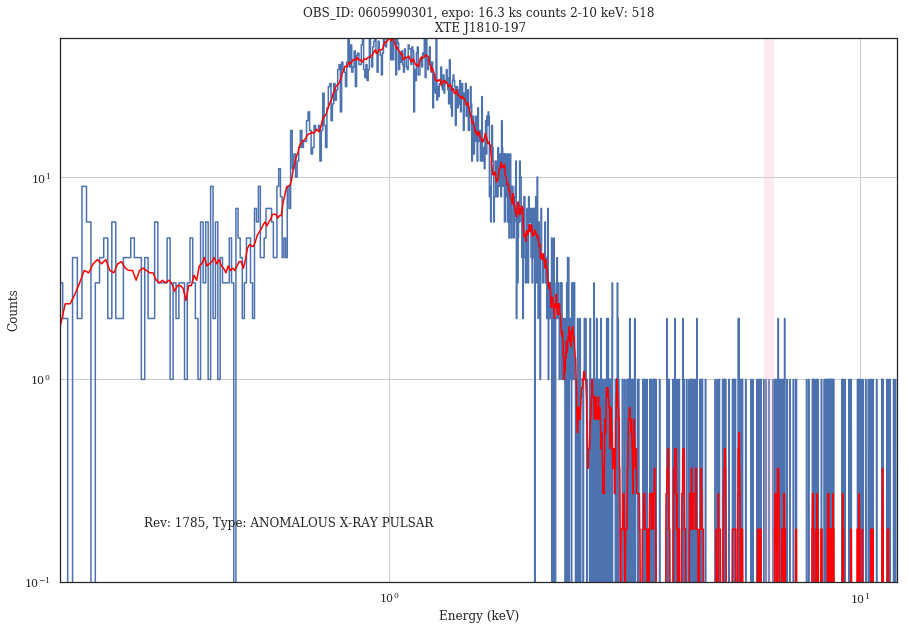

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0605990401_PPS_nxsa.tar. Will reuse it.
Extracted 0605990401/pps/P0605990401PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0604680201_PPS_nxsa.tar. Will reuse it.
Extracted 0604680201/pps/P0604680201PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0510390301_PPS_nxsa.tar. Will reuse it.
Extracted 0510390301/pps/P0510390301PNS005SRSPEC0001.FTZ


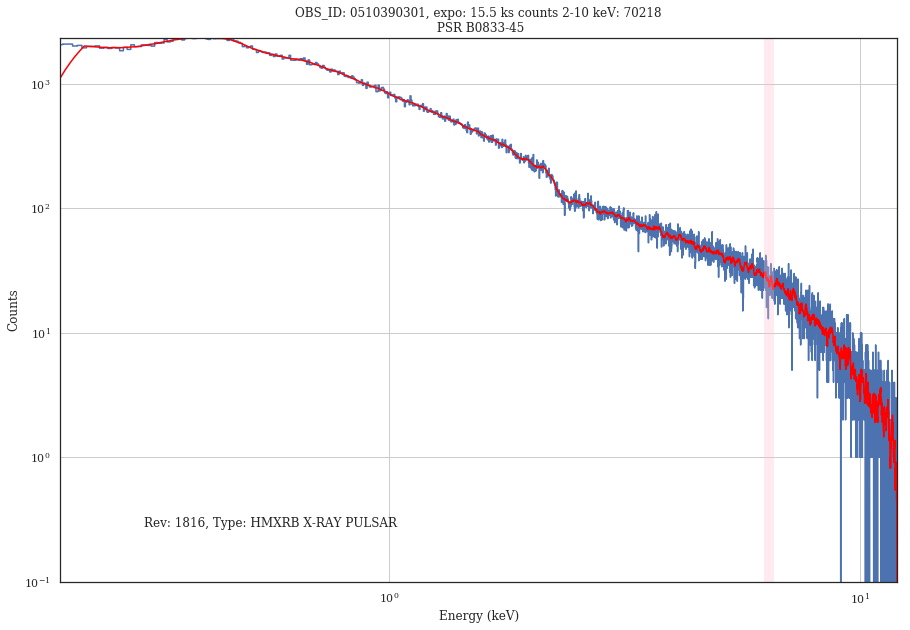

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0411083201_PPS_nxsa.tar. Will reuse it.
Extracted 0411083201/pps/P0411083201PNS600SRSPEC0001.FTZ


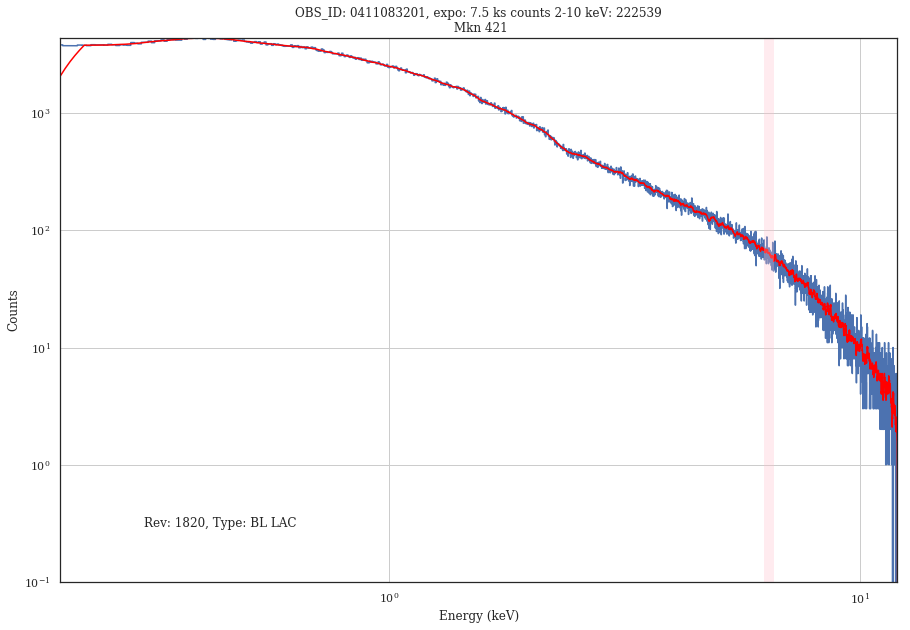

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0600460201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0600460231_PPS_nxsa.tar. Will reuse it.
Extracted 0600460231/pps/P0600460231PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0600460232_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0600460233_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0600460234_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0600460235_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0600460236_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0600460237_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS t

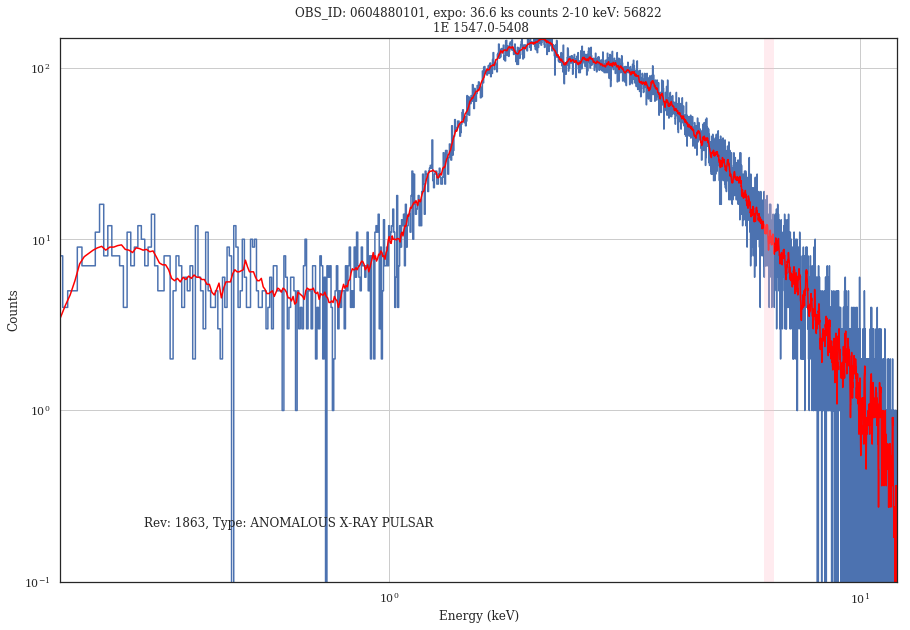

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0656780101_PPS_nxsa.tar. Will reuse it.
Extracted 0656780101/pps/P0656780101PNS003SRSPEC0001.FTZ


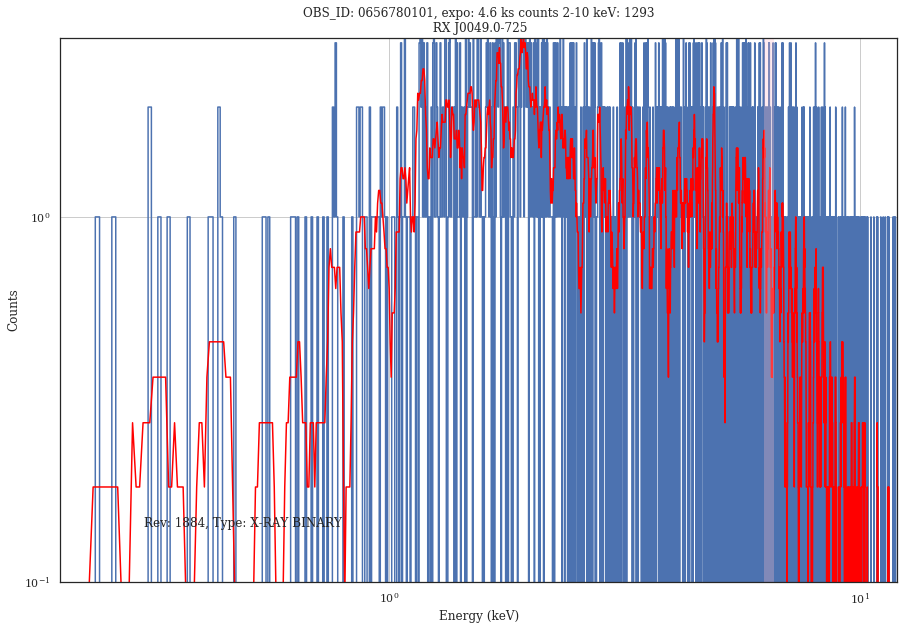

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0656780201_PPS_nxsa.tar. Will reuse it.
Extracted 0656780201/pps/P0656780201PNS003SRSPEC0001.FTZ


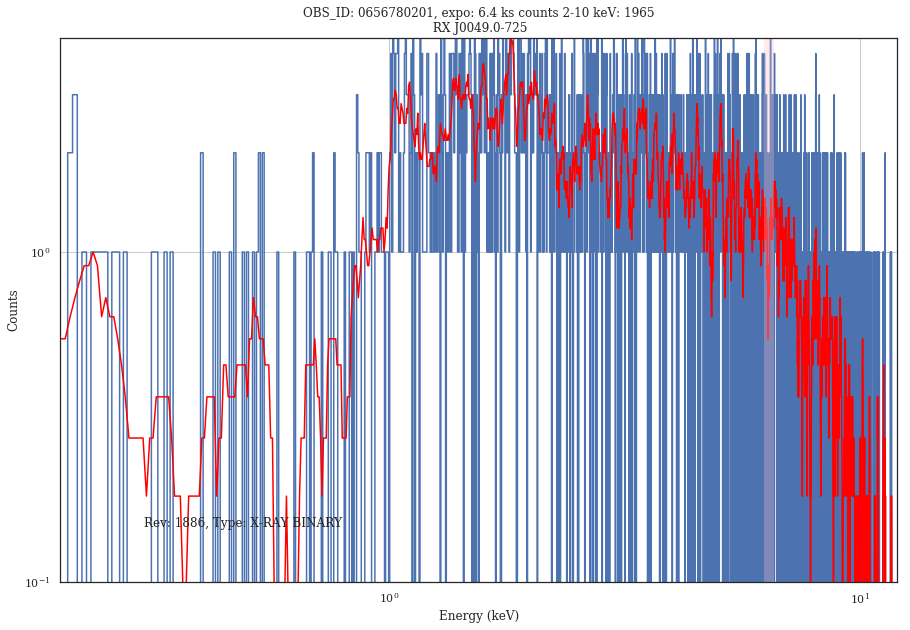

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0656780301_PPS_nxsa.tar. Will reuse it.
Extracted 0656780301/pps/P0656780301PNS003SRSPEC0001.FTZ


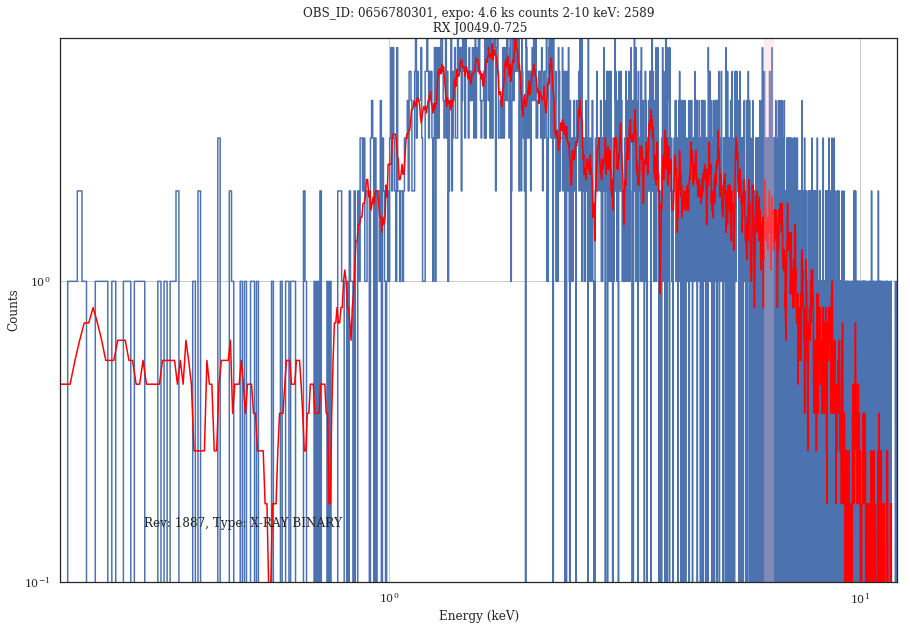

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0605990501_PPS_nxsa.tar. Will reuse it.
Extracted 0605990501/pps/P0605990501PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0656380101_PPS_nxsa.tar. Will reuse it.
Extracted 0656380101/pps/P0656380101PNS600SRSPEC0001.FTZ


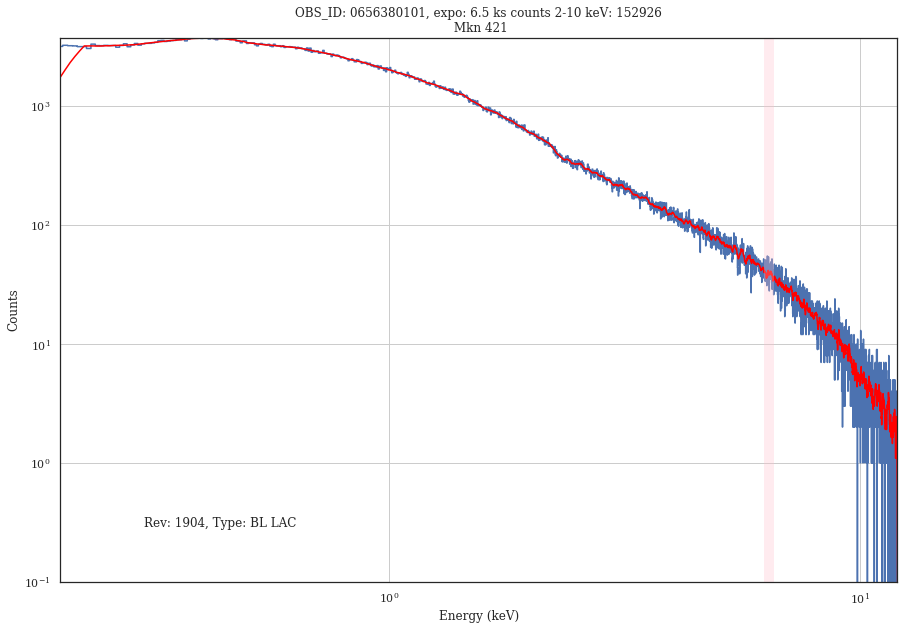

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651300301_PPS_nxsa.tar. Will reuse it.
Extracted 0651300301/pps/P0651300301PNS001SRSPEC0001.FTZ


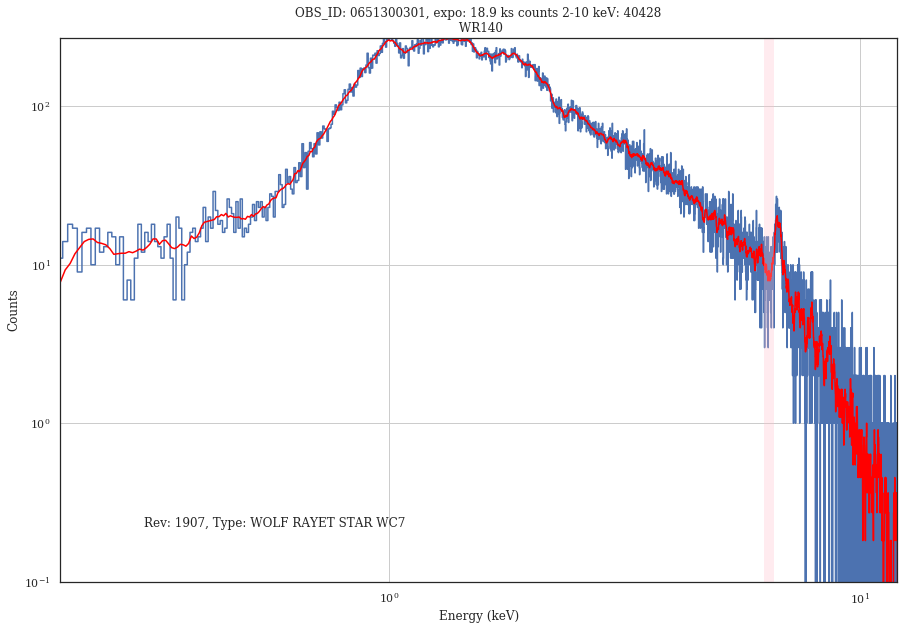

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651360301_PPS_nxsa.tar. Will reuse it.
Extracted 0651360301/pps/P0651360301PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651360501_PPS_nxsa.tar. Will reuse it.
Extracted 0651360501/pps/P0651360501PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651360601_PPS_nxsa.tar. Will reuse it.
Extracted 0651360601/pps/P0651360601PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651330101_PPS_nxsa.tar. Will reuse it.
Extracted 0651330101/pps/P0651330101PNS003SRSPEC0001.FTZ


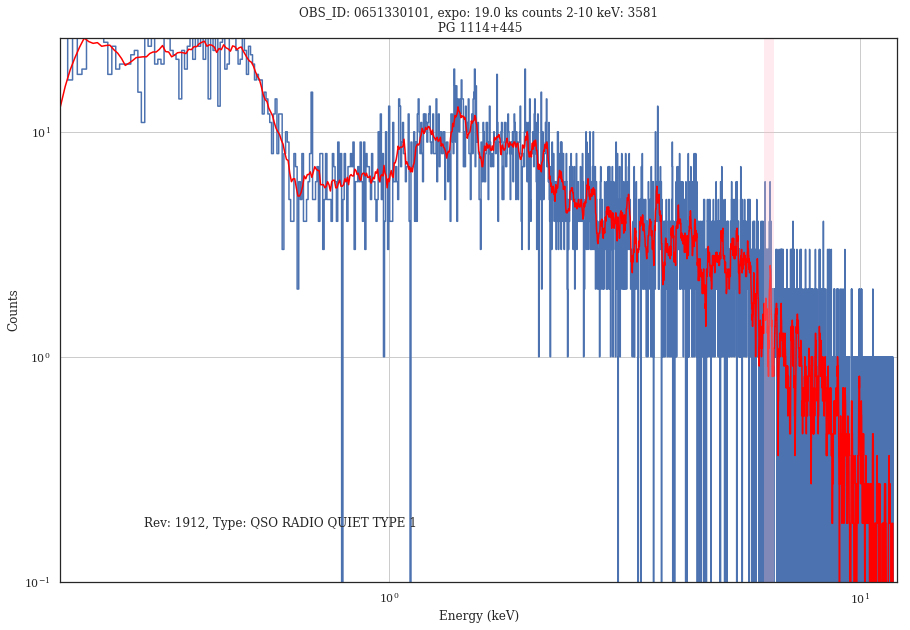

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651330201_PPS_nxsa.tar. Will reuse it.
Extracted 0651330201/pps/P0651330201PNS003SRSPEC0001.FTZ


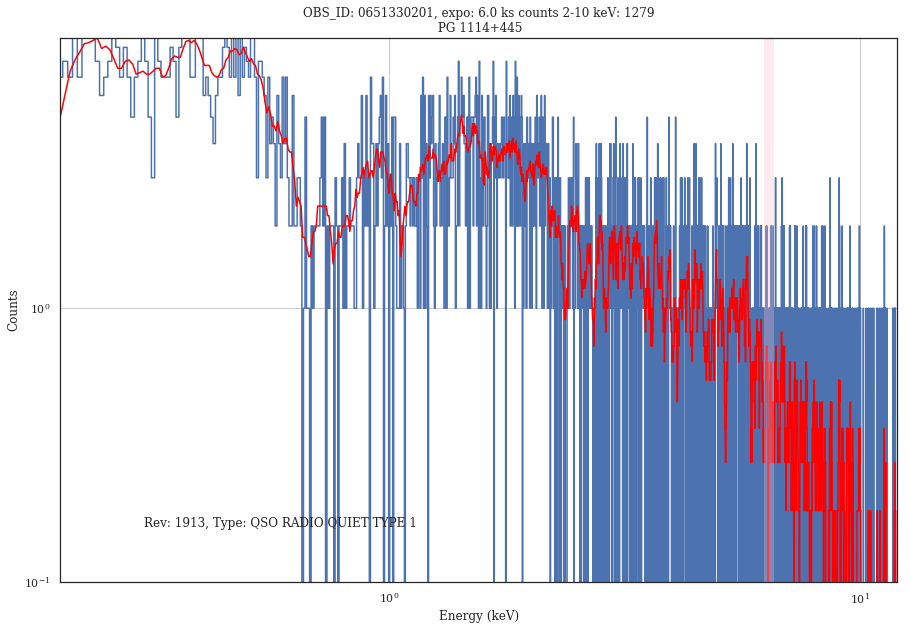

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651330301_PPS_nxsa.tar. Will reuse it.
Extracted 0651330301/pps/P0651330301PNS003SRSPEC0001.FTZ


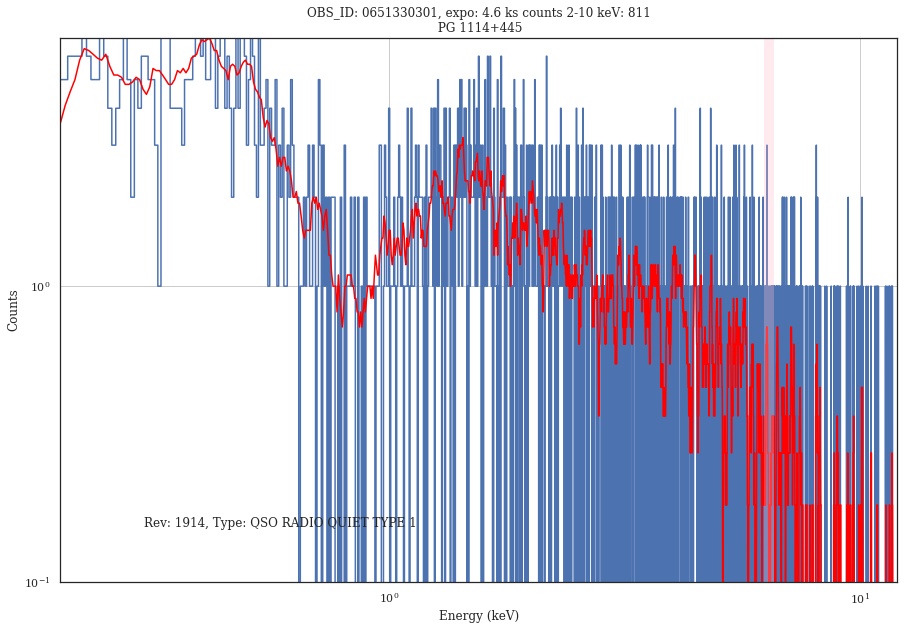

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651330401_PPS_nxsa.tar. Will reuse it.
Extracted 0651330401/pps/P0651330401PNS003SRSPEC0001.FTZ


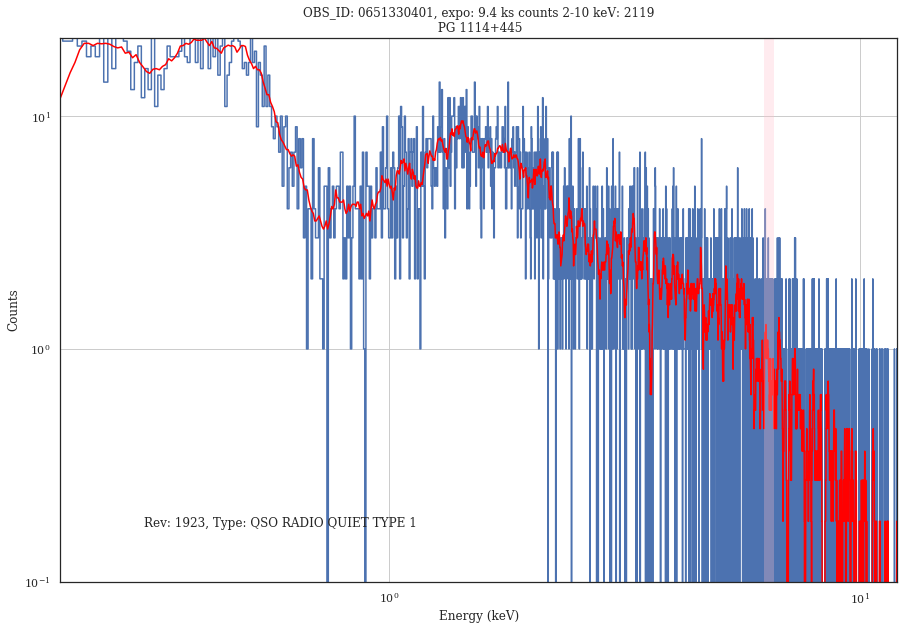

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651360401_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651330501_PPS_nxsa.tar. Will reuse it.
Extracted 0651330501/pps/P0651330501PNS003SRSPEC0001.FTZ


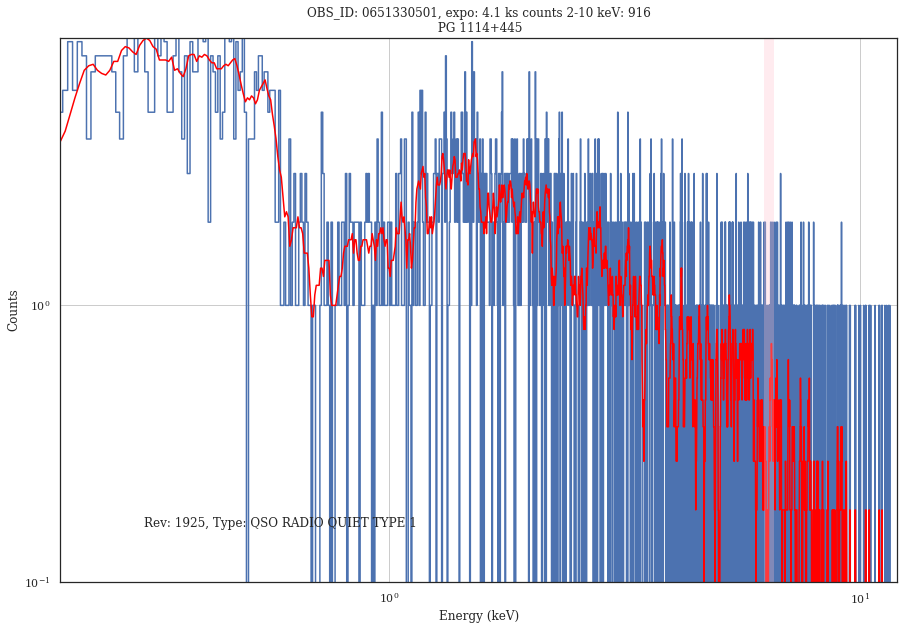

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651140201_PPS_nxsa.tar. Will reuse it.
Extracted 0651140201/pps/P0651140201PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651140301_PPS_nxsa.tar. Will reuse it.
Extracted 0651140301/pps/P0651140301PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0652550201_PPS_nxsa.tar. Will reuse it.
Extracted 0652550201/pps/P0652550201PNS013SRSPEC0001.FTZ


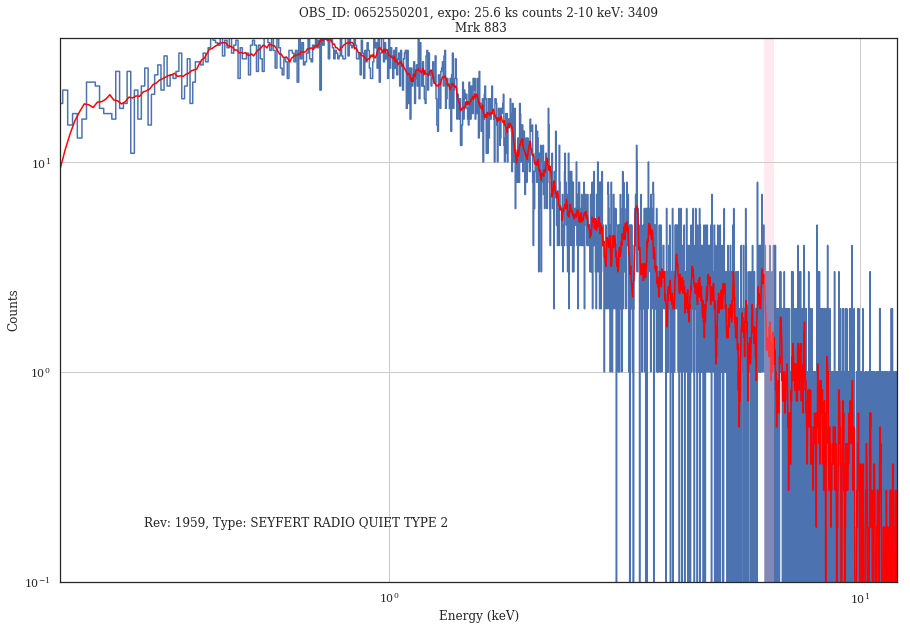

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0605990601_PPS_nxsa.tar. Will reuse it.
Extracted 0605990601/pps/P0605990601PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0405182701_PPS_nxsa.tar. Will reuse it.
Extracted 0405182701/pps/P0405182701PNS003SRSPEC0001.FTZ


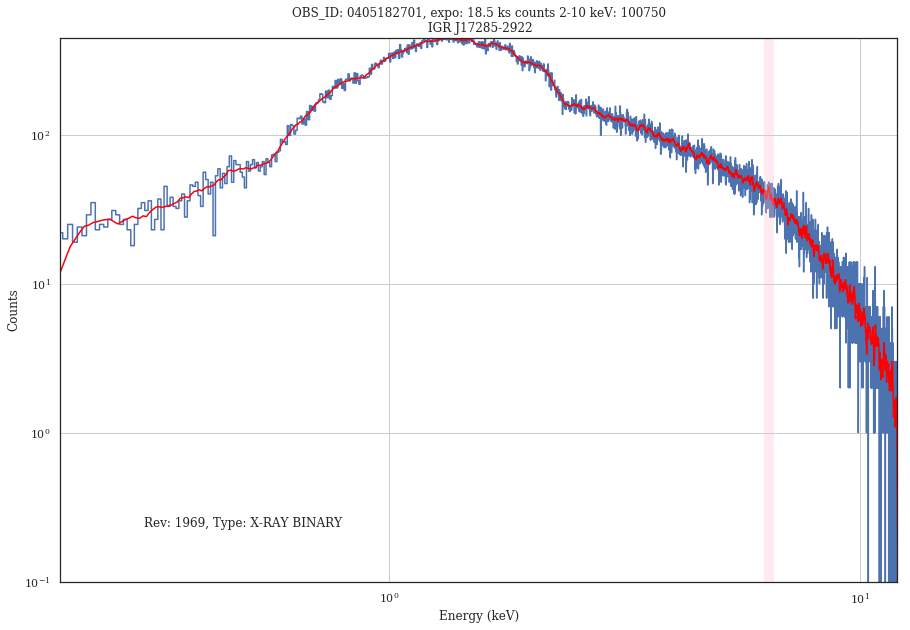

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0653510301_PPS_nxsa.tar. Will reuse it.
Extracted 0653510301/pps/P0653510301PNS003SRSPEC0001.FTZ


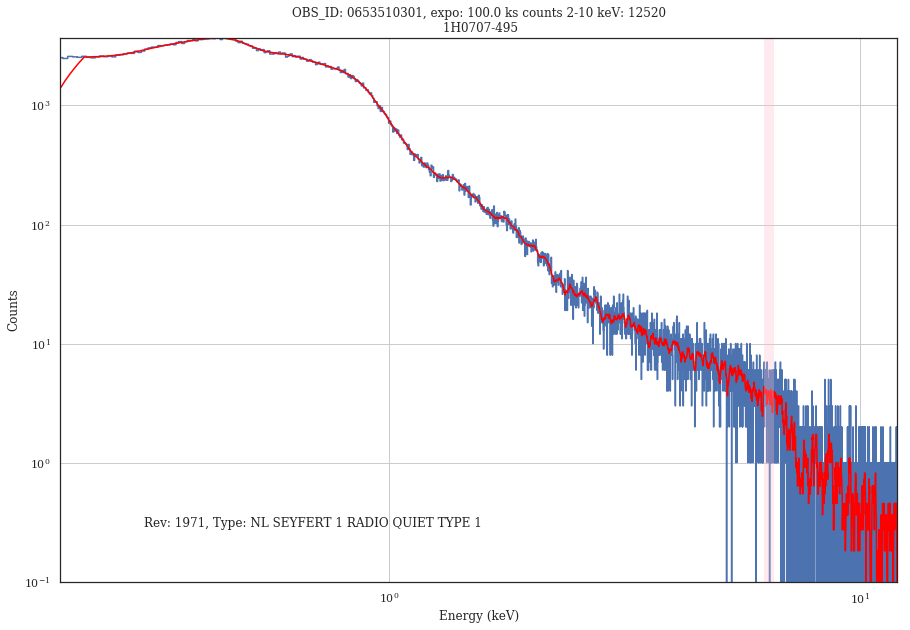

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0653510401_PPS_nxsa.tar. Will reuse it.
Extracted 0653510401/pps/P0653510401PNS003SRSPEC0001.FTZ


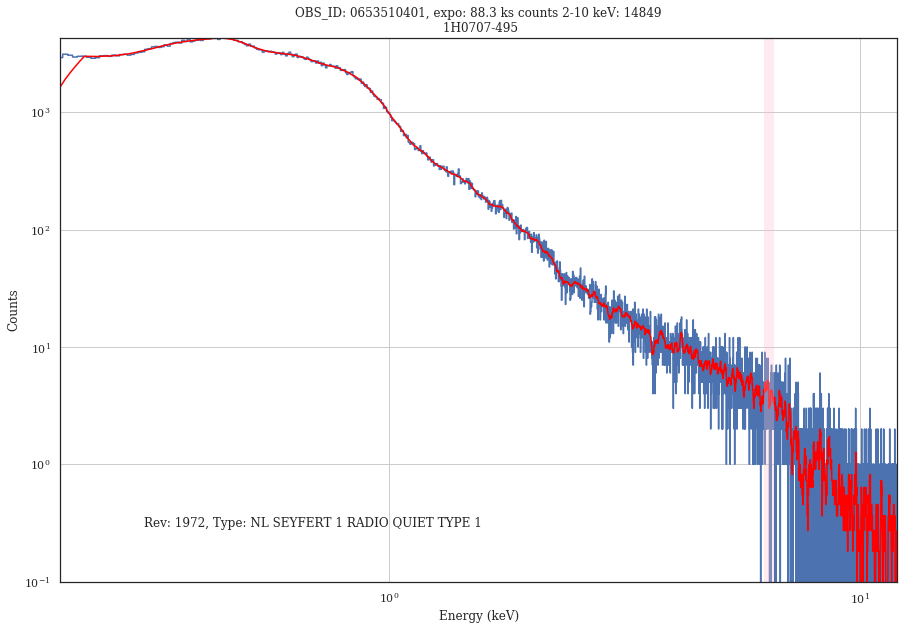

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0653510501_PPS_nxsa.tar. Will reuse it.
Extracted 0653510501/pps/P0653510501PNS003SRSPEC0001.FTZ


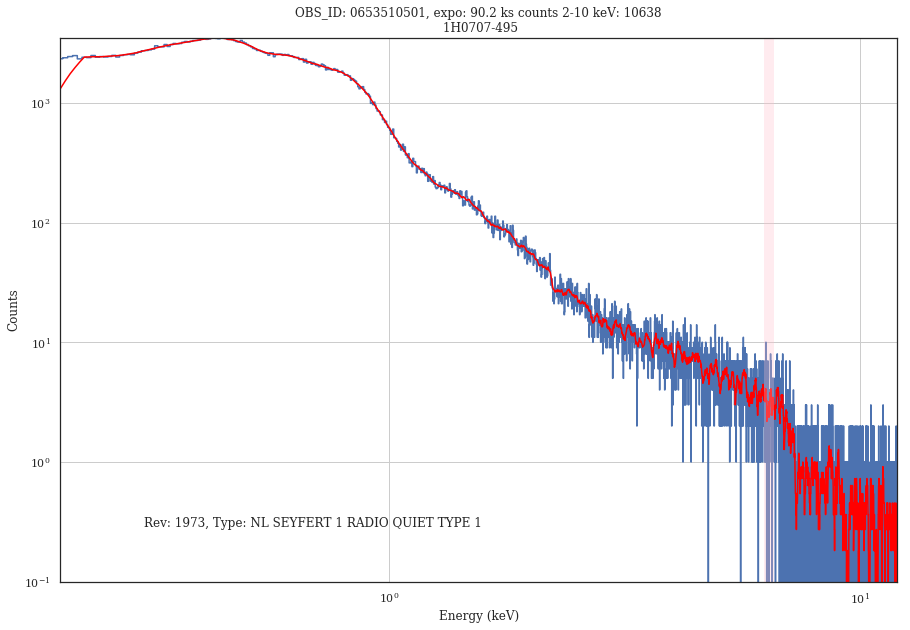

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0653510601_PPS_nxsa.tar. Will reuse it.
Extracted 0653510601/pps/P0653510601PNS003SRSPEC0001.FTZ


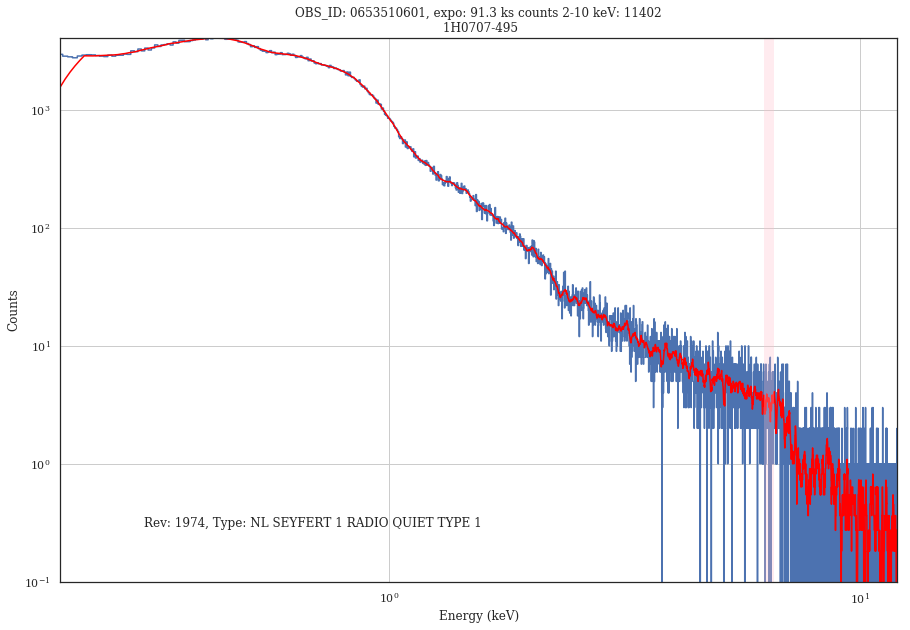

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0652640201_PPS_nxsa.tar. Will reuse it.
Extracted 0652640201/pps/P0652640201PNU002SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651330601_PPS_nxsa.tar. Will reuse it.
Extracted 0651330601/pps/P0651330601PNS003SRSPEC0001.FTZ


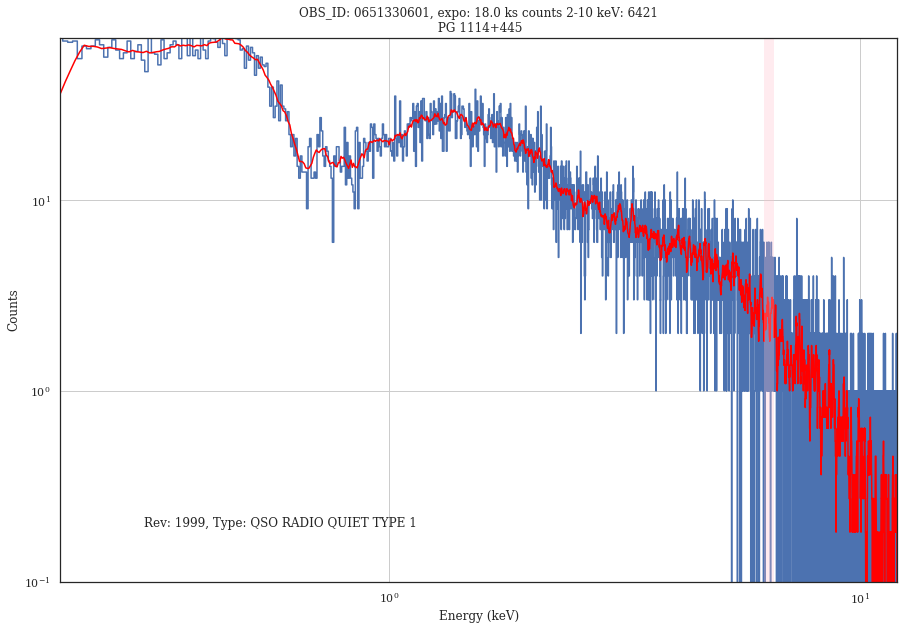

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0656380801_PPS_nxsa.tar. Will reuse it.
Extracted 0656380801/pps/P0656380801PNS600SRSPEC0001.FTZ


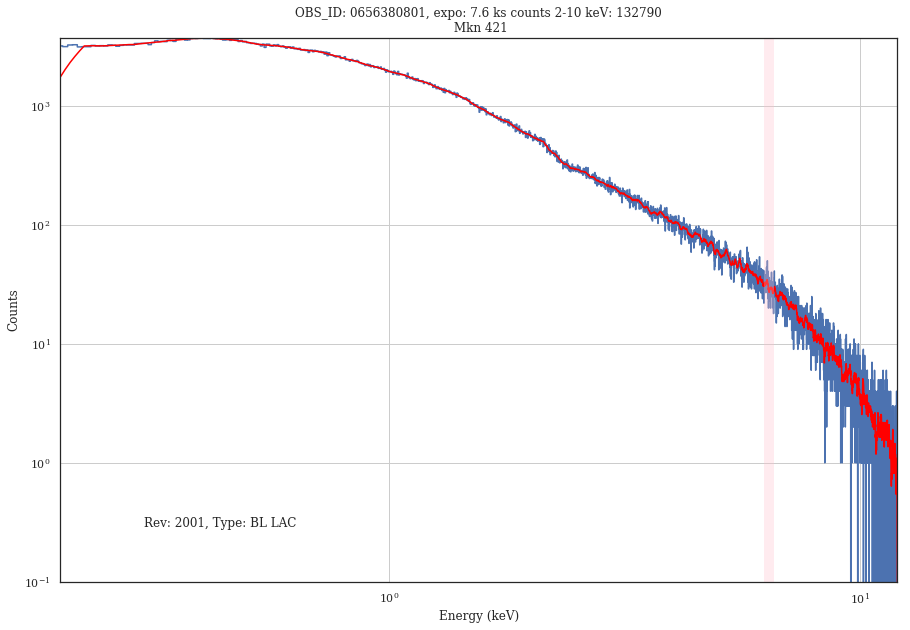

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0656381301_PPS_nxsa.tar. Will reuse it.
Extracted 0656381301/pps/P0656381301PNS600SRSPEC0001.FTZ


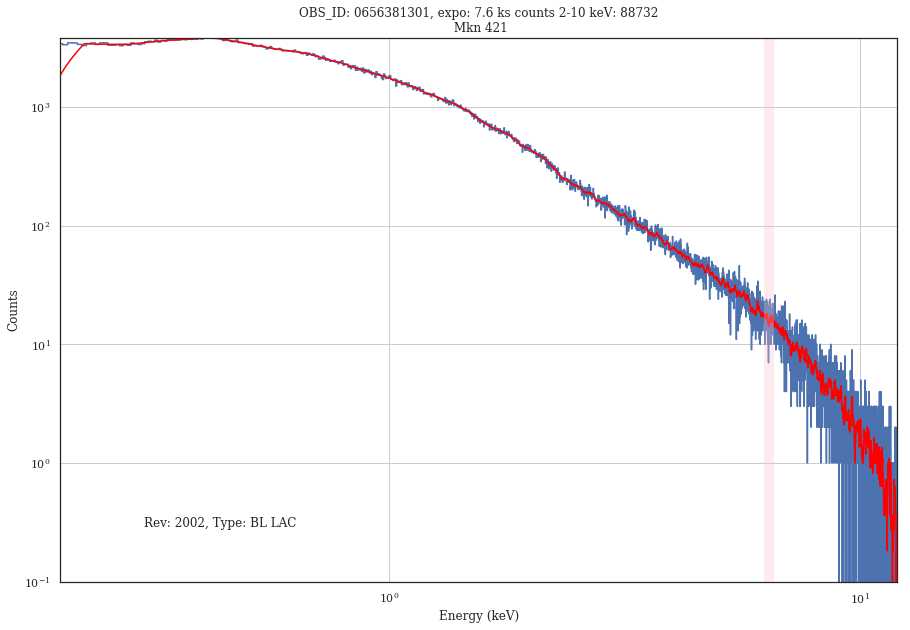

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651330701_PPS_nxsa.tar. Will reuse it.
Extracted 0651330701/pps/P0651330701PNS003SRSPEC0001.FTZ


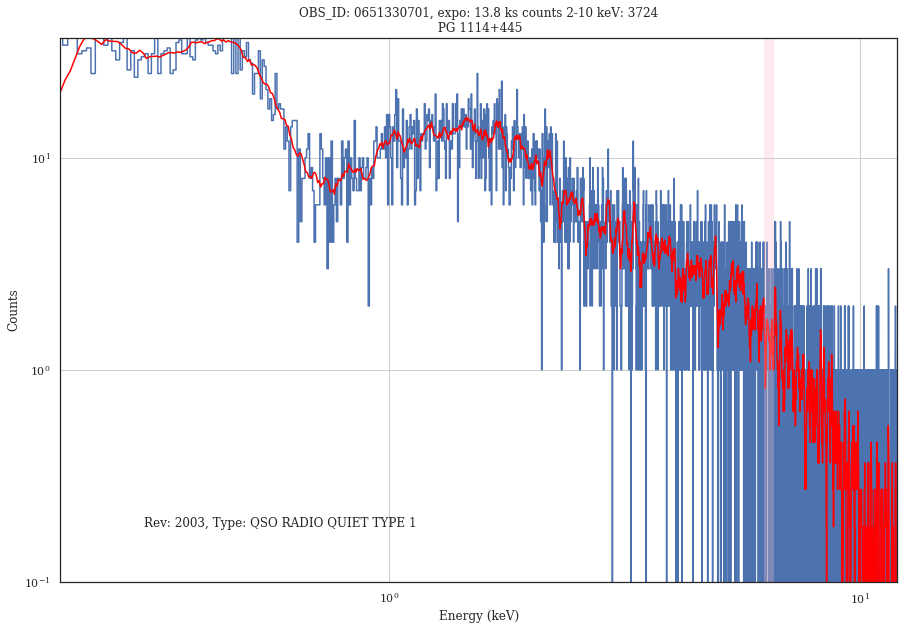

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651330801_PPS_nxsa.tar. Will reuse it.
Extracted 0651330801/pps/P0651330801PNS003SRSPEC0001.FTZ


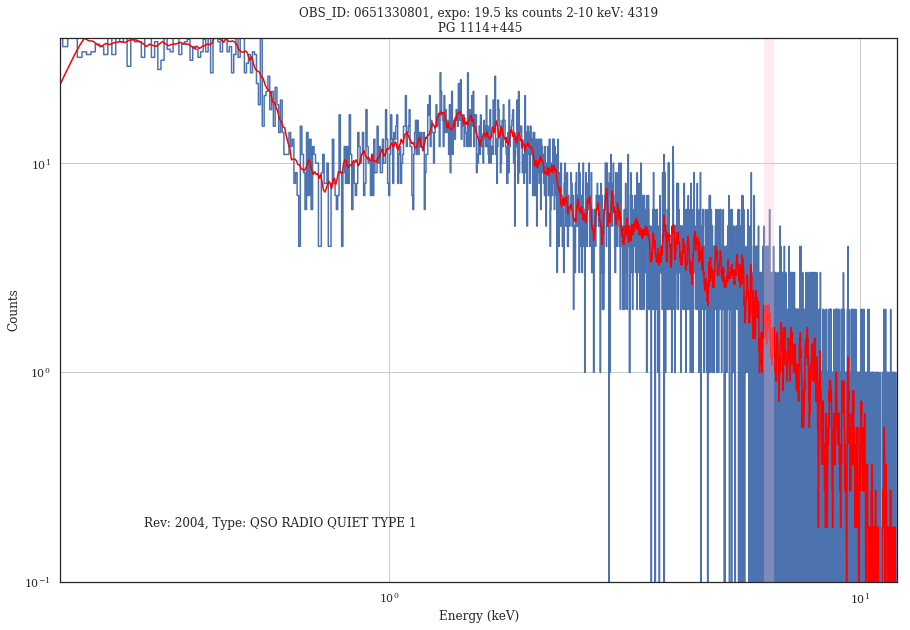

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651330901_PPS_nxsa.tar. Will reuse it.
Extracted 0651330901/pps/P0651330901PNS003SRSPEC0001.FTZ


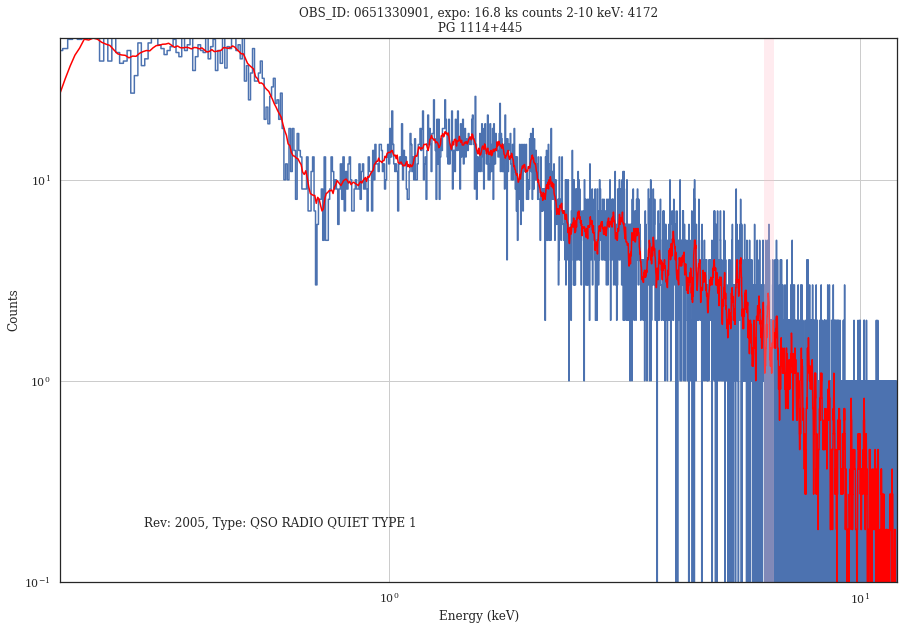

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651331001_PPS_nxsa.tar. Will reuse it.
Extracted 0651331001/pps/P0651331001PNS003SRSPEC0001.FTZ


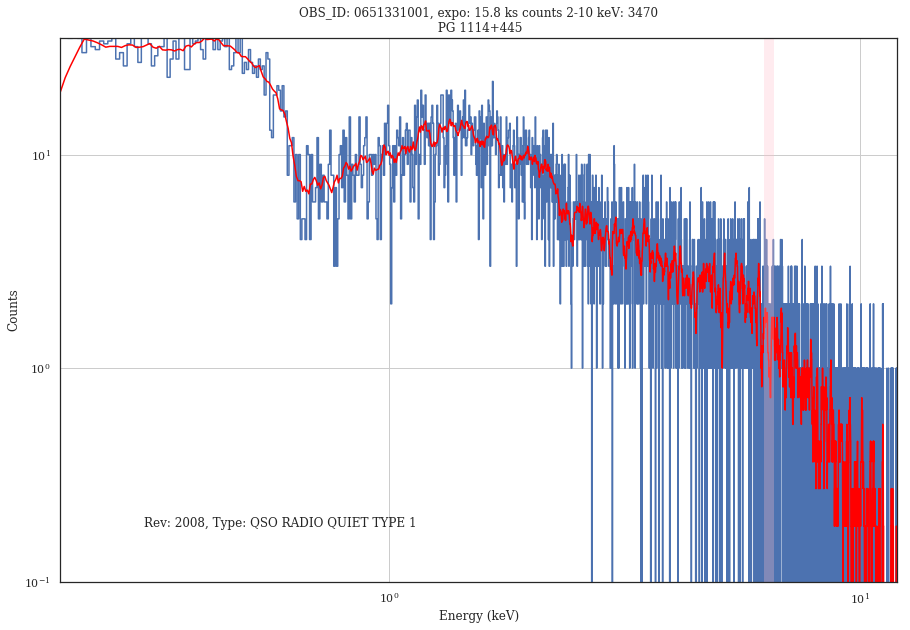

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651331101_PPS_nxsa.tar. Will reuse it.
Extracted 0651331101/pps/P0651331101PNS003SRSPEC0001.FTZ


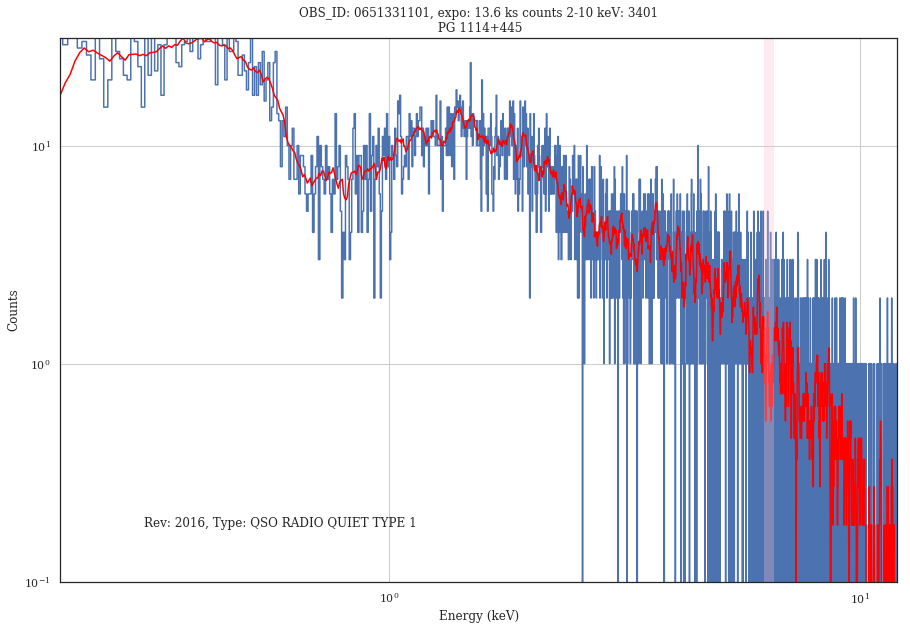

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651140401_PPS_nxsa.tar. Will reuse it.
Extracted 0651140401/pps/P0651140401PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0554710801_PPS_nxsa.tar. Will reuse it.
Extracted 0554710801/pps/P0554710801PNS003SRSPEC0001.FTZ


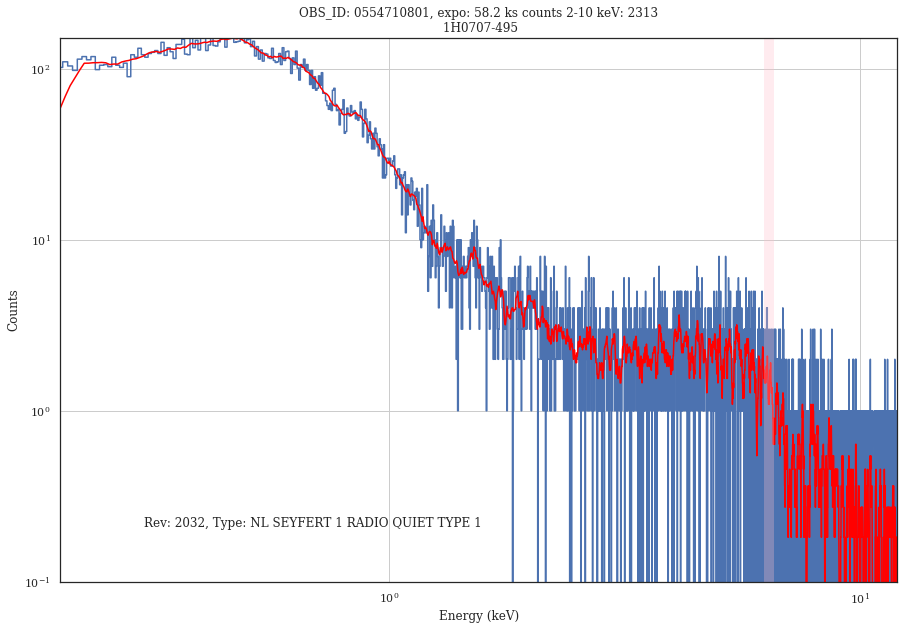

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651140501_PPS_nxsa.tar. Will reuse it.
Extracted 0651140501/pps/P0651140501PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0650640101_PPS_nxsa.tar. Will reuse it.
Extracted 0650640101/pps/P0650640101PNS003SRSPEC0001.FTZ


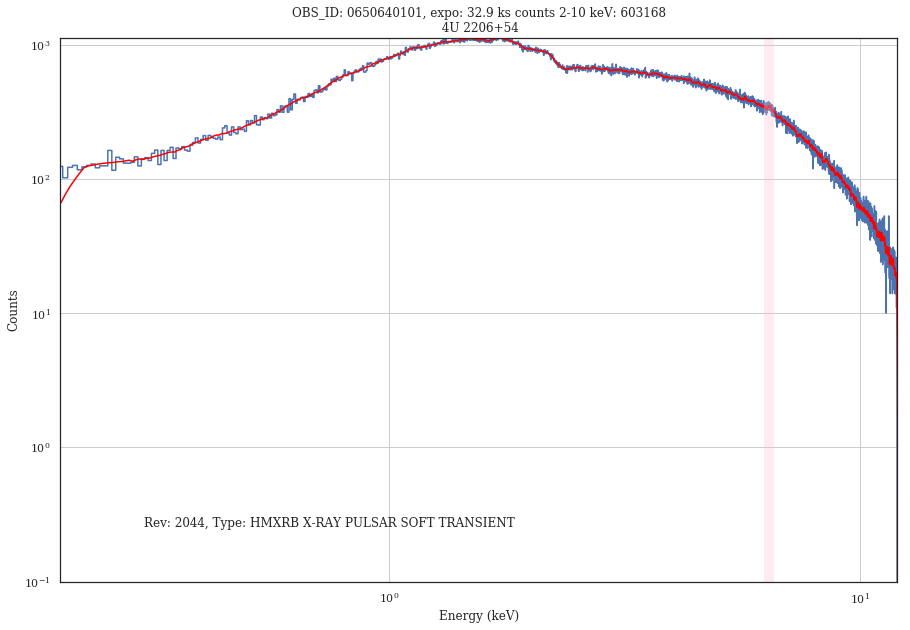

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651850501_PPS_nxsa.tar. Will reuse it.
Extracted 0651850501/pps/P0651850501PNS003SRSPEC0001.FTZ


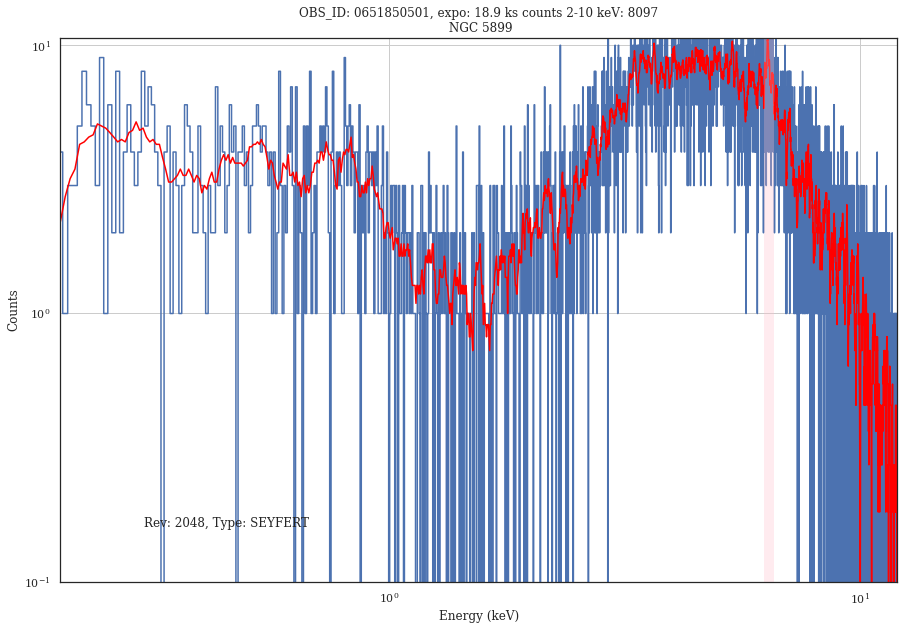

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0672670201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0653320101_PPS_nxsa.tar. Will reuse it.
Extracted 0653320101/pps/P0653320101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0653300101_PPS_nxsa.tar. Will reuse it.
Extracted 0653300101/pps/P0653300101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0653660101_PPS_nxsa.tar. Will reuse it.
Extracted 0653660101/pps/P0653660101PNS003SRSPEC0001.FTZ


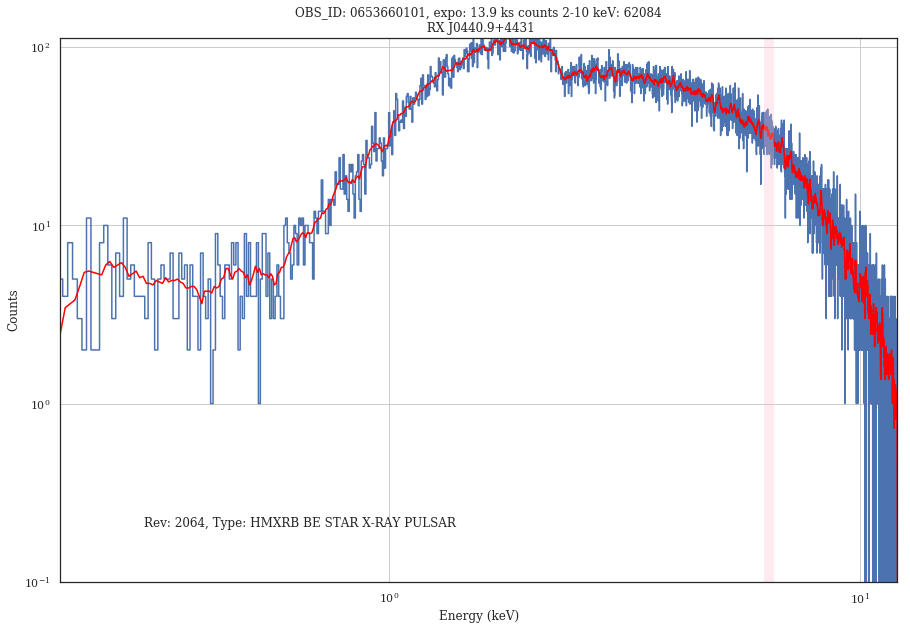

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0677980101_PPS_nxsa.tar. Will reuse it.
Extracted 0677980101/pps/P0677980101PNU002SRSPEC0001.FTZ


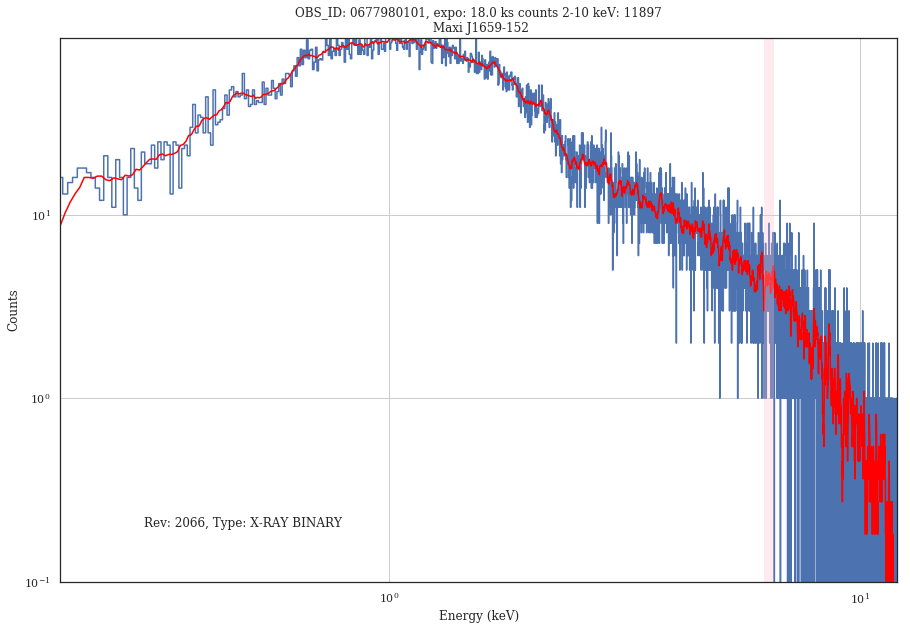

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0671060101_PPS_nxsa.tar. Will reuse it.
Extracted 0671060101/pps/P0671060101PNU002SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0651300401_PPS_nxsa.tar. Will reuse it.
Extracted 0651300401/pps/P0651300401PNS001SRSPEC0001.FTZ


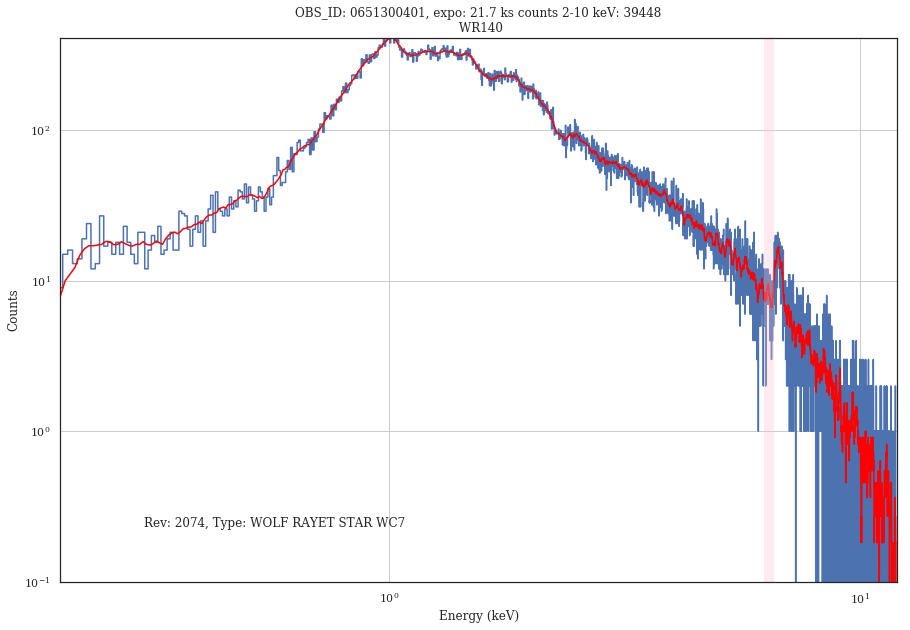

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678380101_PPS_nxsa.tar. Will reuse it.
Extracted 0678380101/pps/P0678380101PNS001SRSPEC0001.FTZ


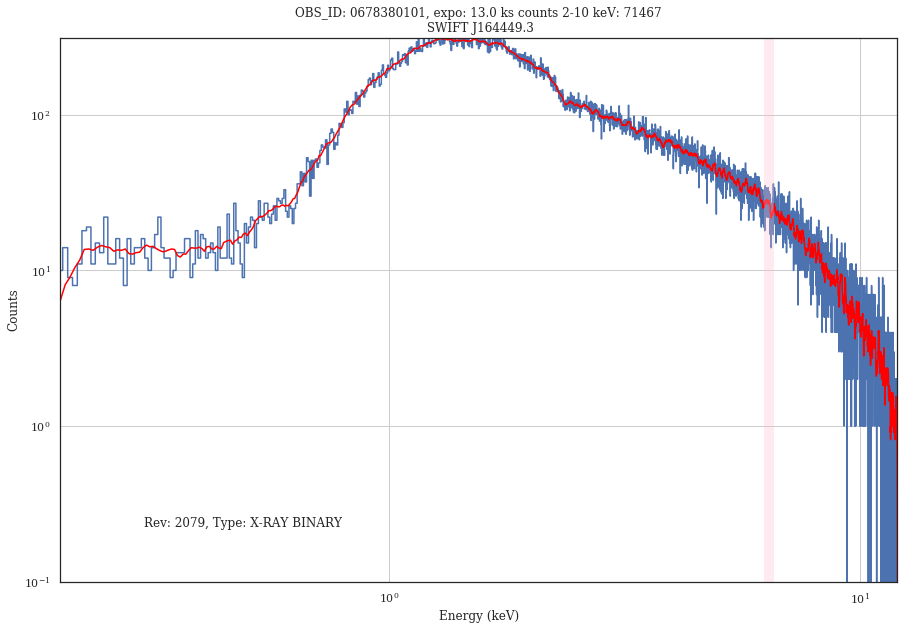

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0510390501_PPS_nxsa.tar. Will reuse it.
Extracted 0510390501/pps/P0510390501PNS005SRSPEC0001.FTZ


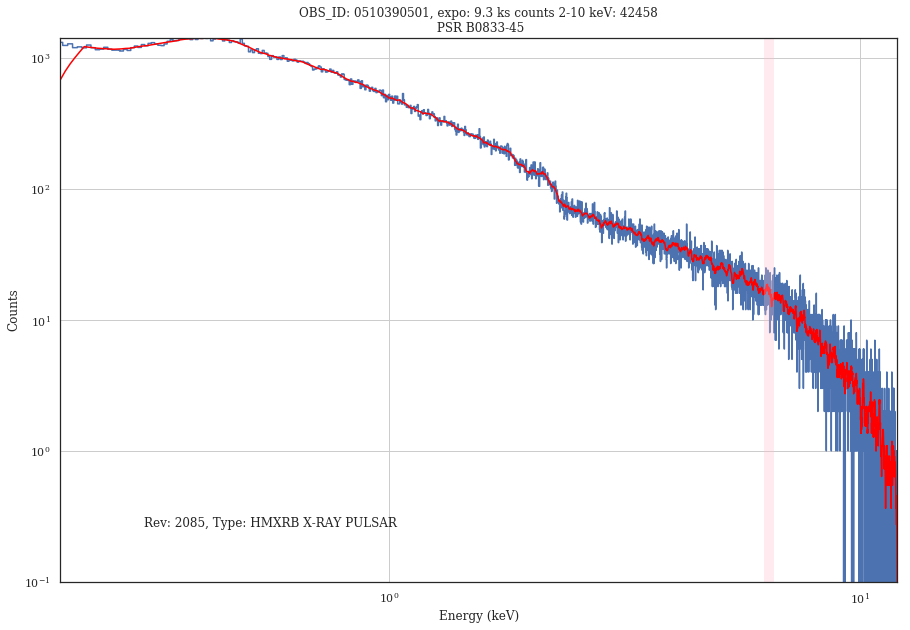

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678380201_PPS_nxsa.tar. Will reuse it.
Extracted 0678380201/pps/P0678380201PNS001SRSPEC0001.FTZ


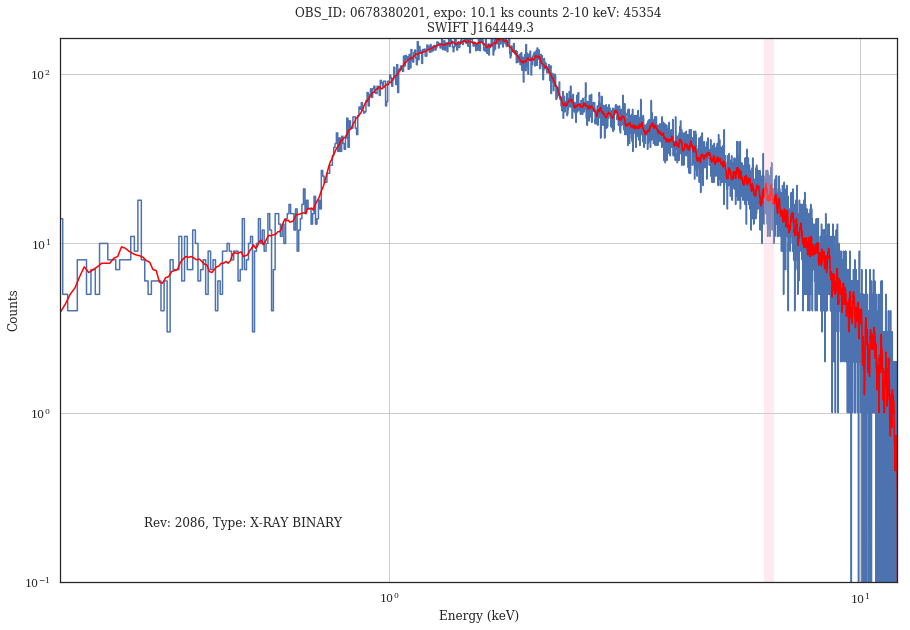

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0658800101_PPS_nxsa.tar. Will reuse it.
Extracted 0658800101/pps/P0658800101PNS600SRSPEC0001.FTZ


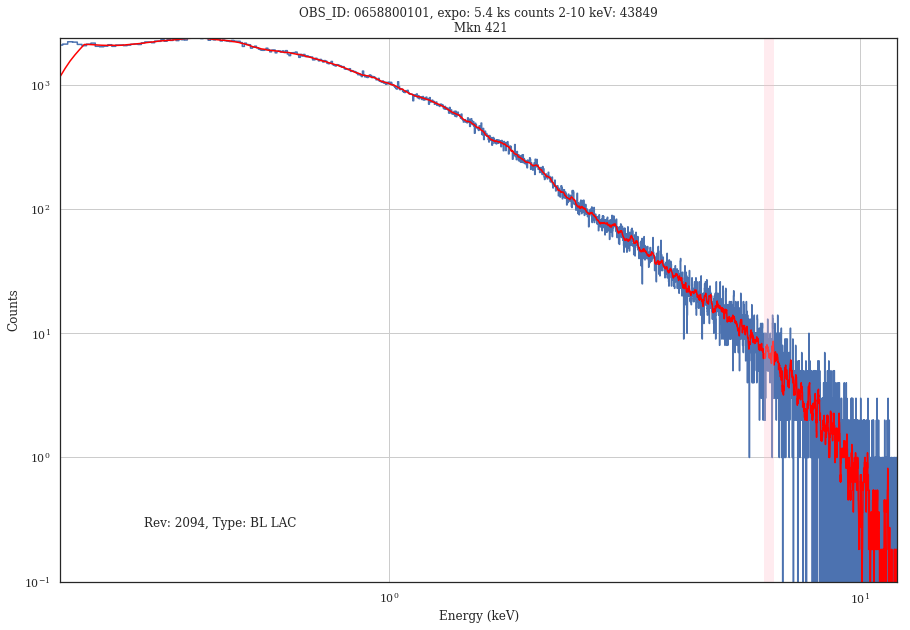

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678380301_PPS_nxsa.tar. Will reuse it.
Extracted 0678380301/pps/P0678380301PNS001SRSPEC0001.FTZ


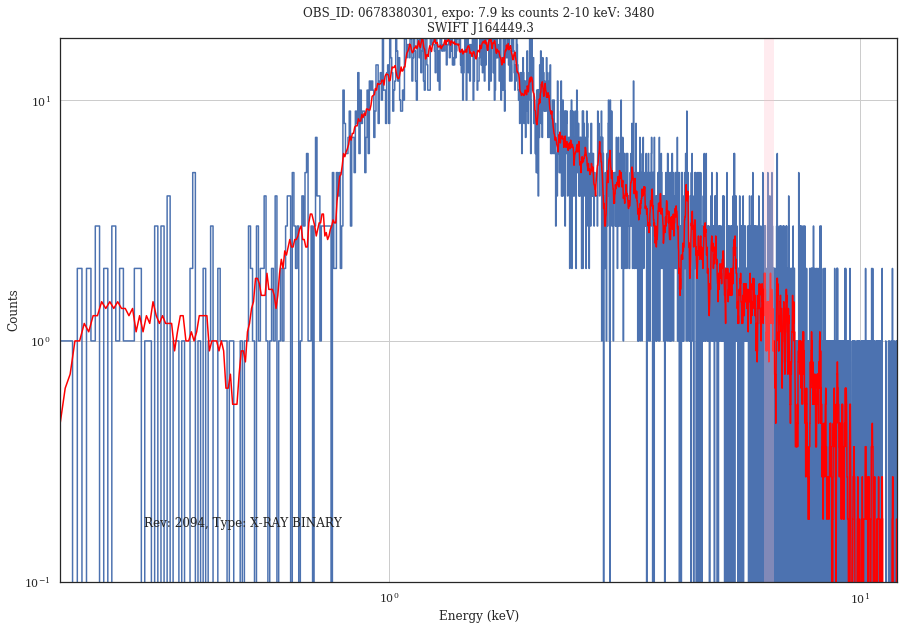

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673730101_PPS_nxsa.tar. Will reuse it.
Extracted 0673730101/pps/P0673730101PNS003SRSPEC0001.FTZ


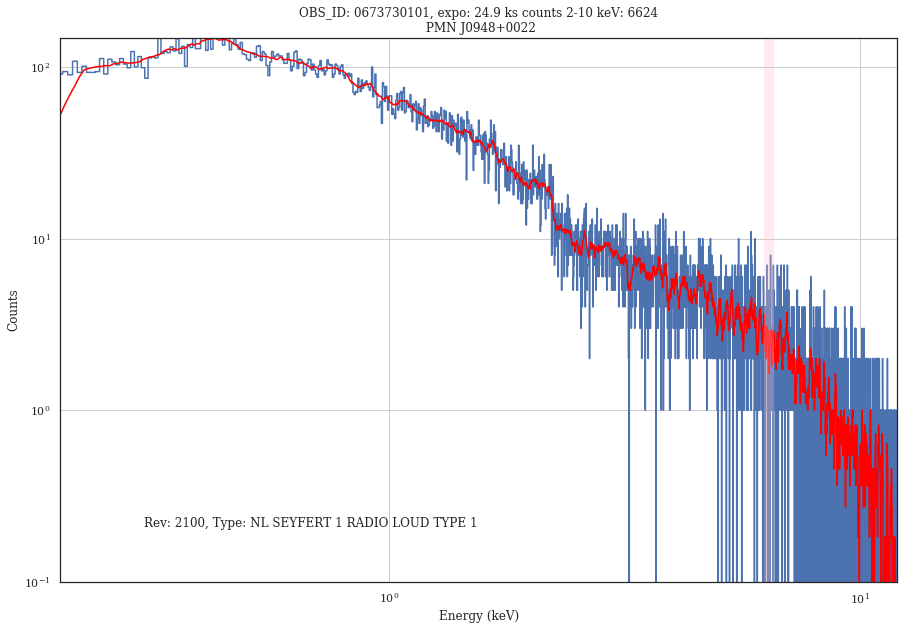

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678380401_PPS_nxsa.tar. Will reuse it.
Extracted 0678380401/pps/P0678380401PNS001SRSPEC0001.FTZ


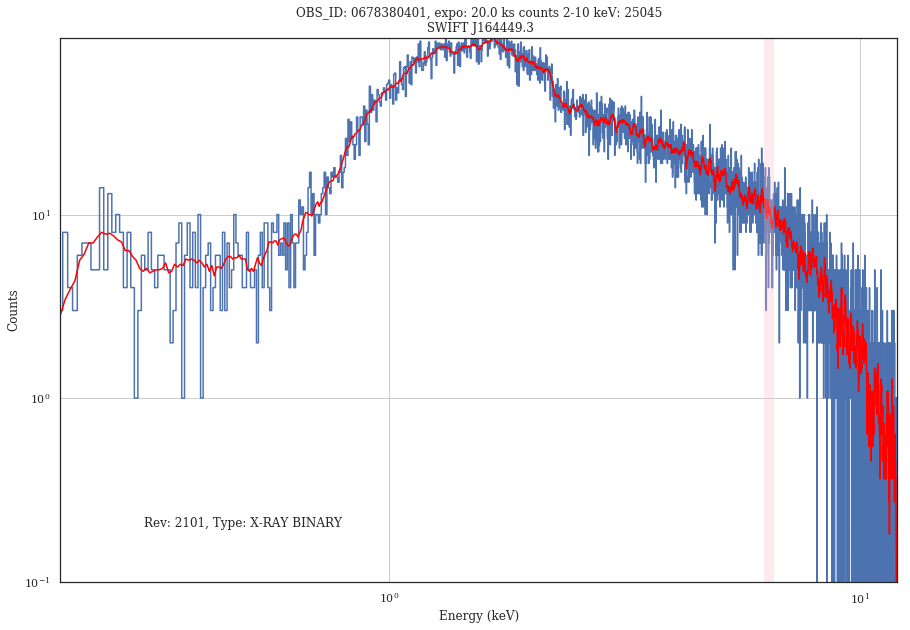

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0672530301_PPS_nxsa.tar. Will reuse it.
Extracted 0672530301/pps/P0672530301PNS003SRSPEC0001.FTZ


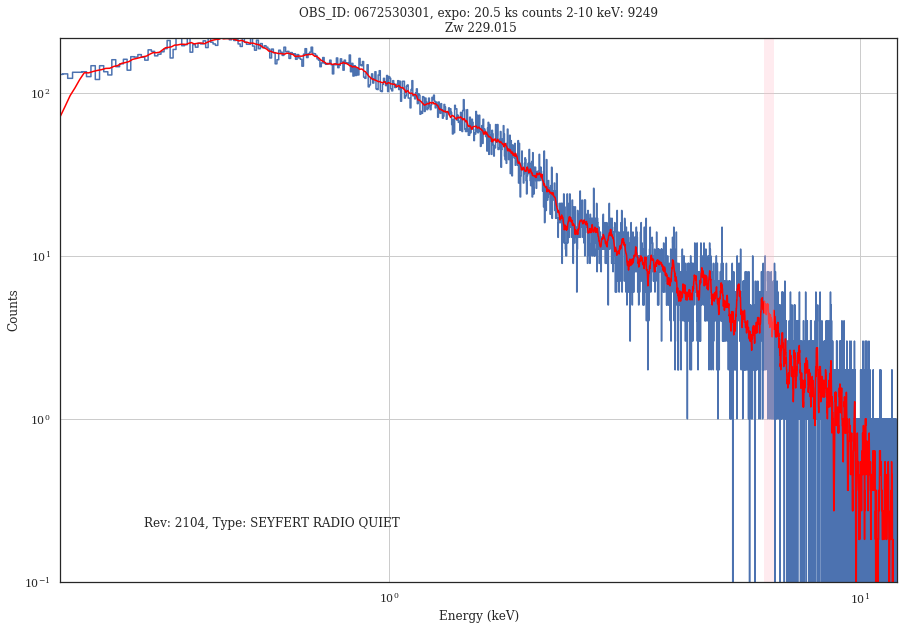

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0672790101_PPS_nxsa.tar. Will reuse it.
Extracted 0672790101/pps/P0672790101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0671150501_PPS_nxsa.tar. Will reuse it.
Extracted 0671150501/pps/P0671150501PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0672790201_PPS_nxsa.tar. Will reuse it.
Extracted 0672790201/pps/P0672790201PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678380501_PPS_nxsa.tar. Will reuse it.
Extracted 0678380501/pps/P0678380501PNS001SRSPEC0001.FTZ


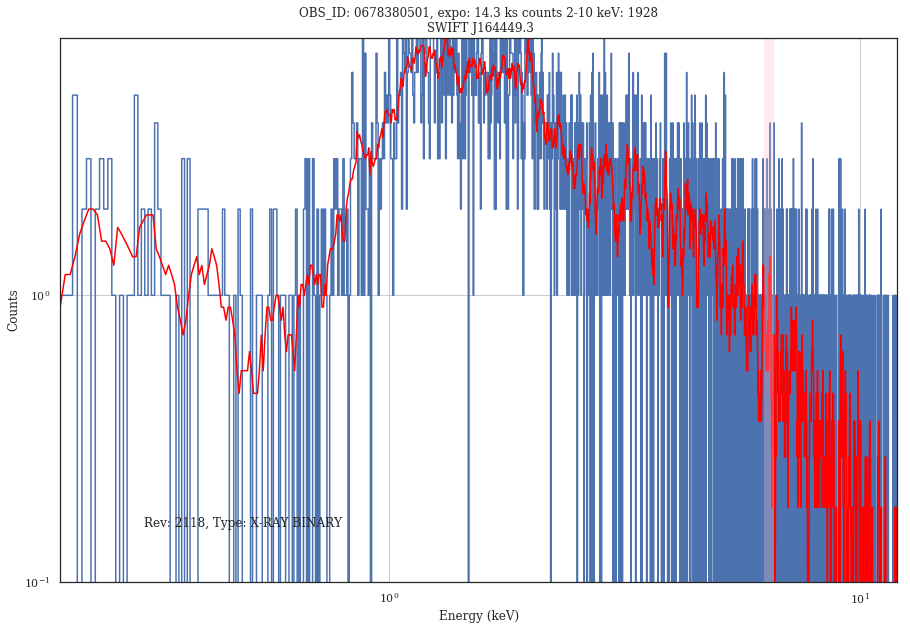

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673270101_PPS_nxsa.tar. Will reuse it.
Extracted 0673270101/pps/P0673270101PNS003SRSPEC0001.FTZ


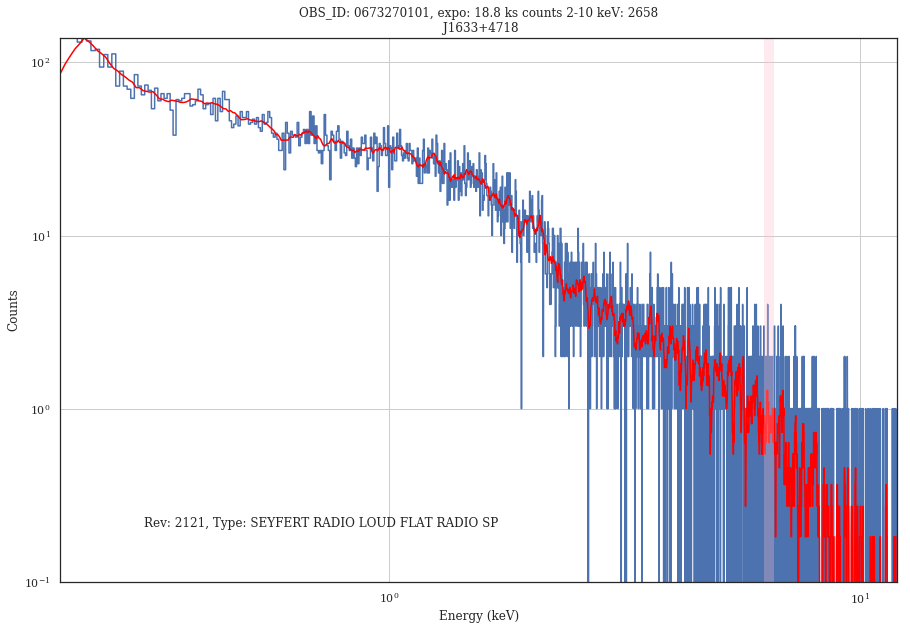

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0671150601_PPS_nxsa.tar. Will reuse it.
Extracted 0671150601/pps/P0671150601PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678380601_PPS_nxsa.tar. Will reuse it.
Extracted 0678380601/pps/P0678380601PNS001SRSPEC0001.FTZ


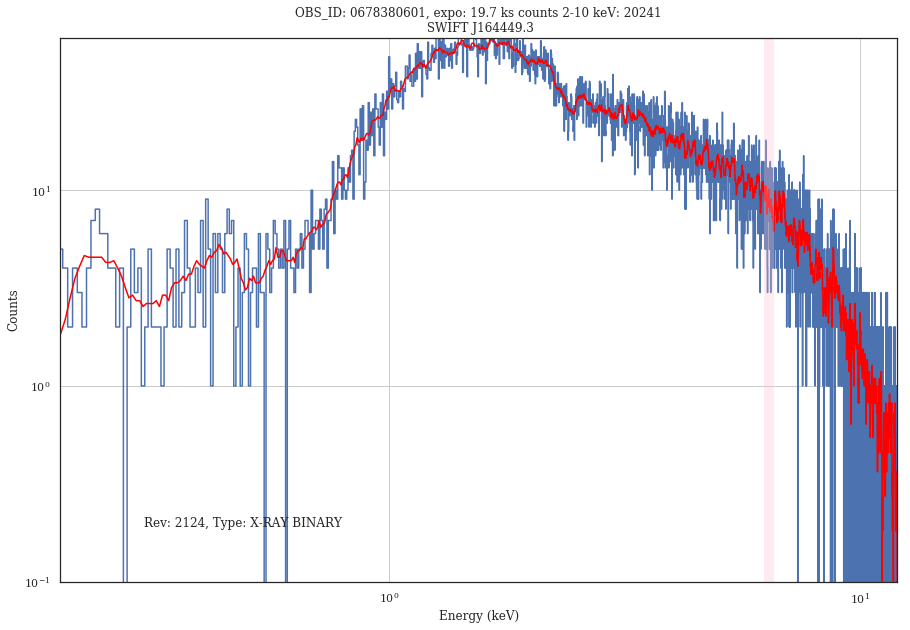

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673580201_PPS_nxsa.tar. Will reuse it.
Extracted 0673580201/pps/P0673580201PNS003SRSPEC0001.FTZ


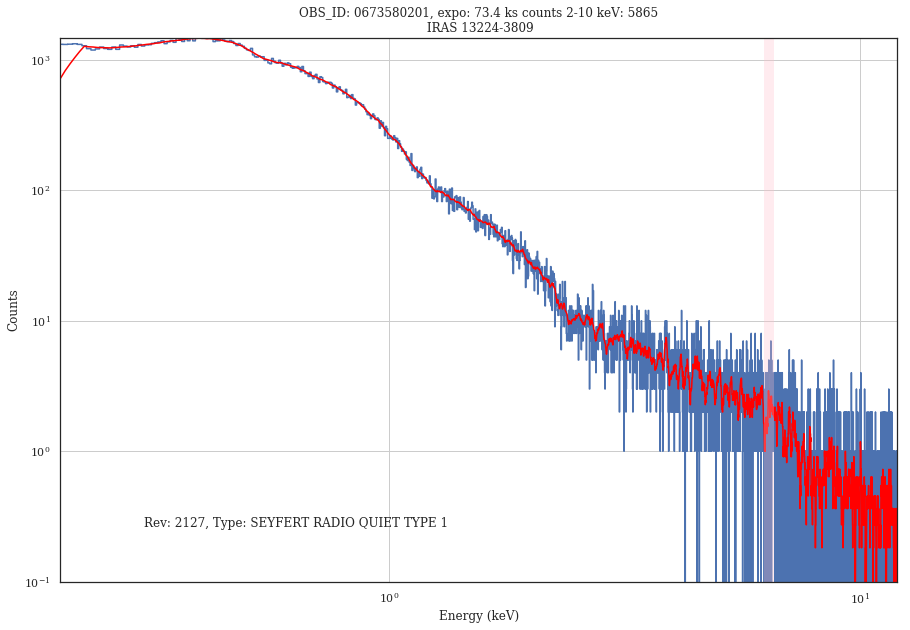

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673580301_PPS_nxsa.tar. Will reuse it.
Extracted 0673580301/pps/P0673580301PNS003SRSPEC0001.FTZ


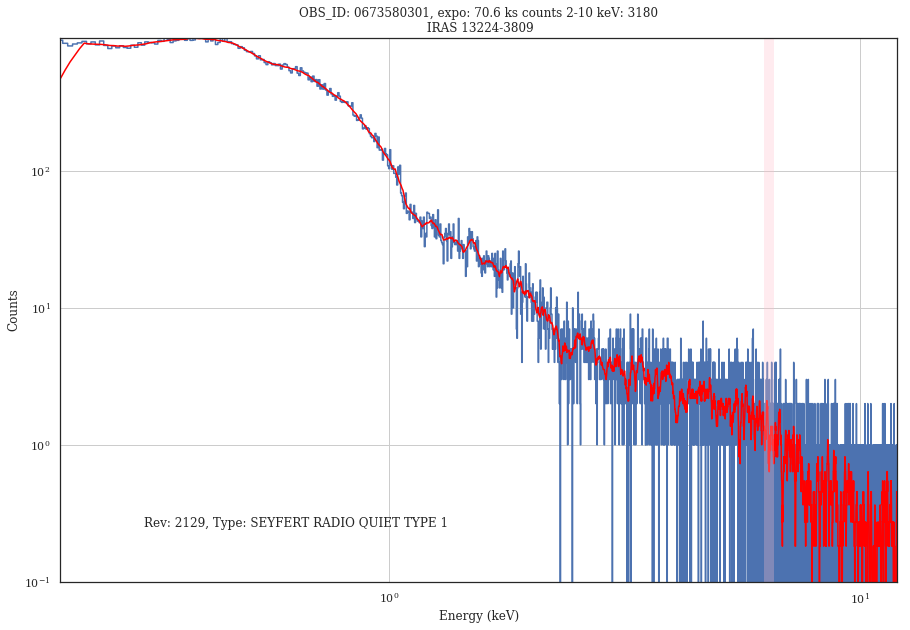

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678380701_PPS_nxsa.tar. Will reuse it.
Extracted 0678380701/pps/P0678380701PNS001SRSPEC0001.FTZ


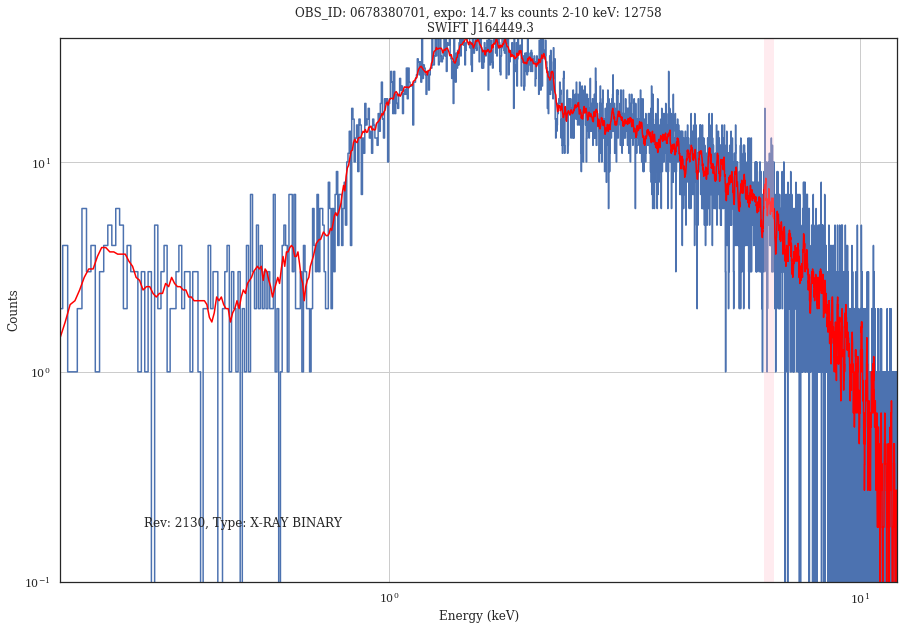

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673580401_PPS_nxsa.tar. Will reuse it.
Extracted 0673580401/pps/P0673580401PNS003SRSPEC0001.FTZ


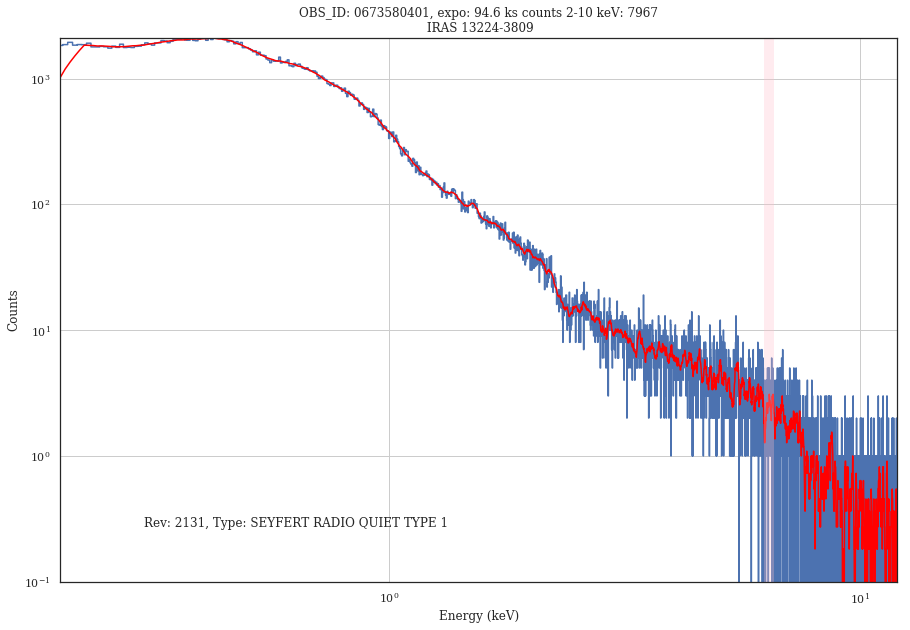

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678380801_PPS_nxsa.tar. Will reuse it.
Extracted 0678380801/pps/P0678380801PNS001SRSPEC0001.FTZ


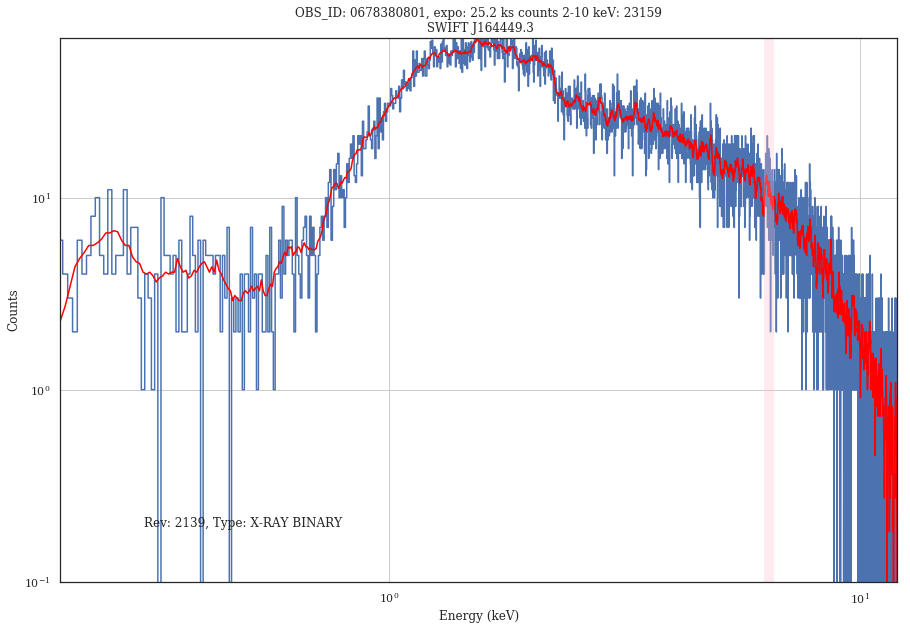

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678380901_PPS_nxsa.tar. Will reuse it.
Extracted 0678380901/pps/P0678380901PNS001SRSPEC0001.FTZ


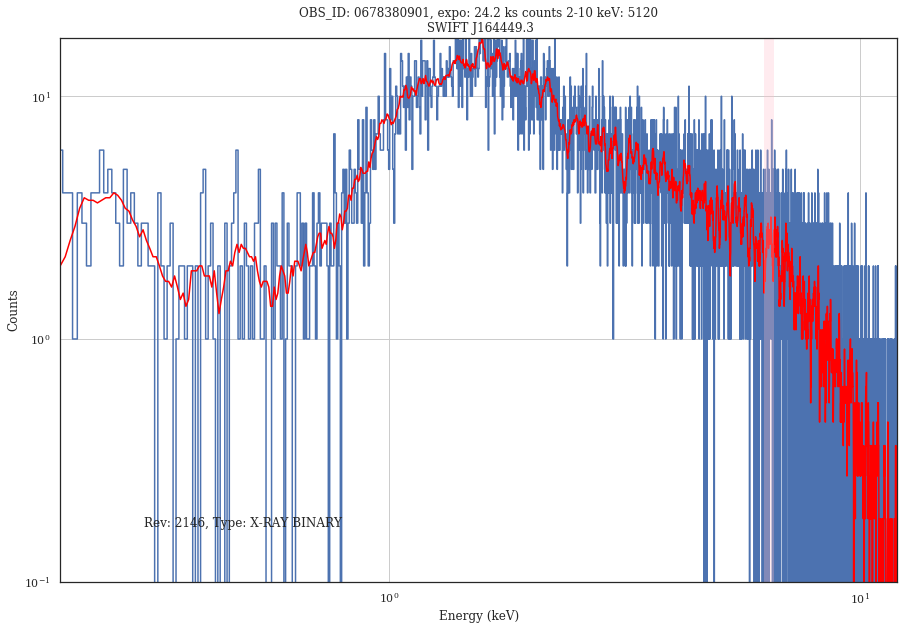

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673540201_PPS_nxsa.tar. Will reuse it.
Extracted 0673540201/pps/P0673540201PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673540901_PPS_nxsa.tar. Will reuse it.
Extracted 0673540901/pps/P0673540901PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673540501_PPS_nxsa.tar. Will reuse it.
Extracted 0673540501/pps/P0673540501PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678381001_PPS_nxsa.tar. Will reuse it.
Extracted 0678381001/pps/P0678381001PNS001SRSPEC0001.FTZ


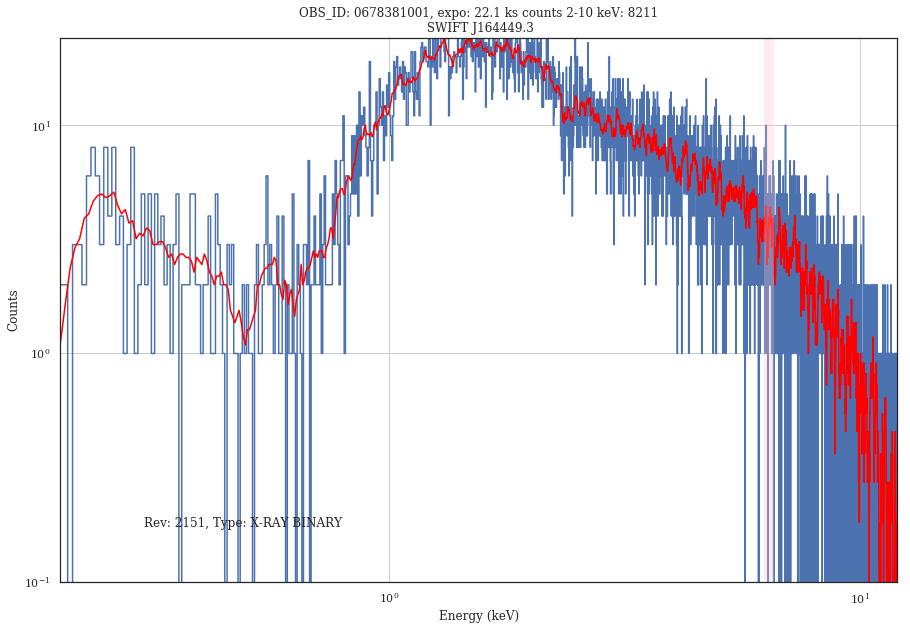

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0671060201_PPS_nxsa.tar. Will reuse it.
Extracted 0671060201/pps/P0671060201PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0672670401_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0672670501_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673720201_PPS_nxsa.tar. Will reuse it.
Extracted 0673720201/pps/P0673720201PNS008SRSPEC0001.FTZ


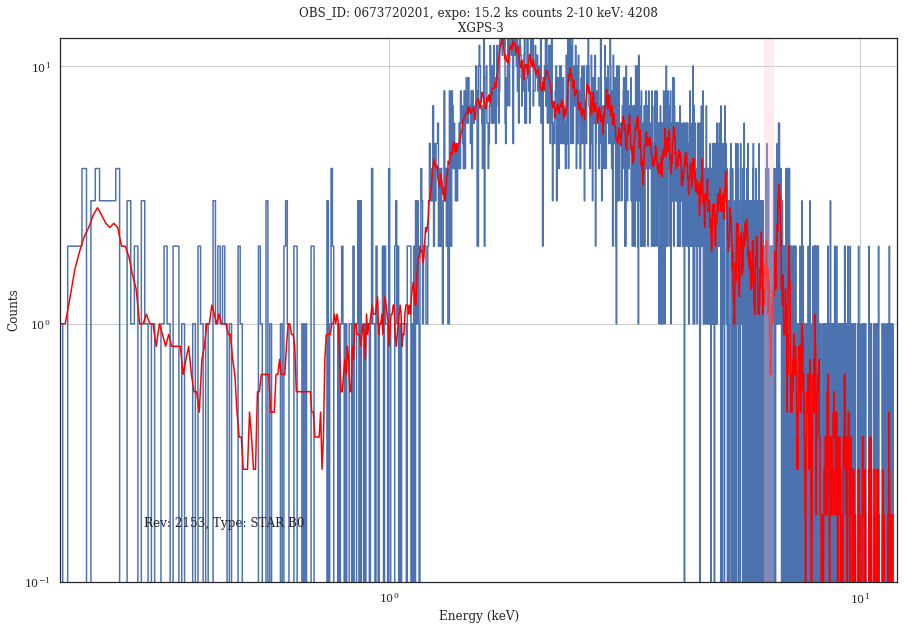

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673270201_PPS_nxsa.tar. Will reuse it.
Extracted 0673270201/pps/P0673270201PNS003SRSPEC0001.FTZ


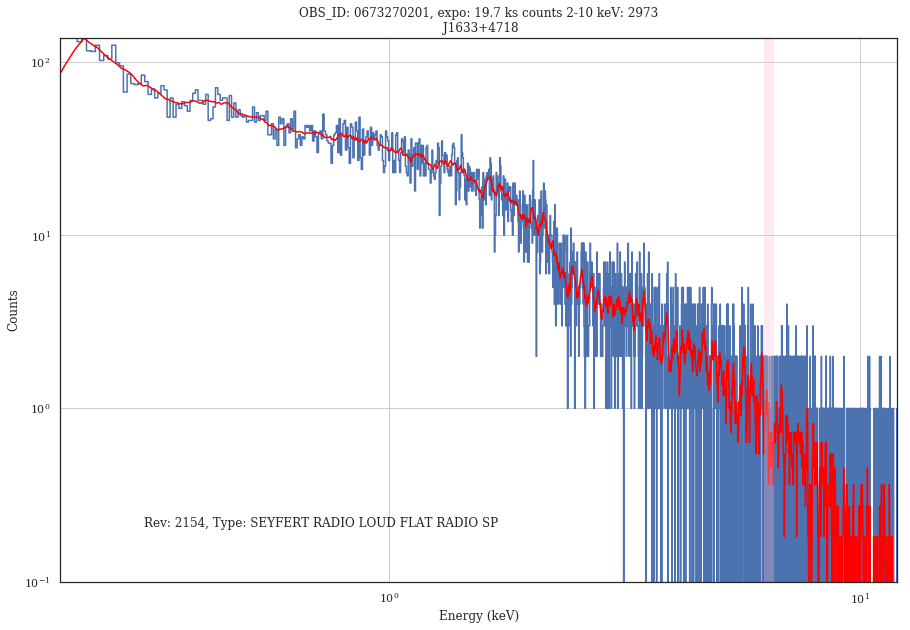

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0674440101_PPS_nxsa.tar. Will reuse it.
Extracted 0674440101/pps/P0674440101PNS003SRSPEC0001.FTZ


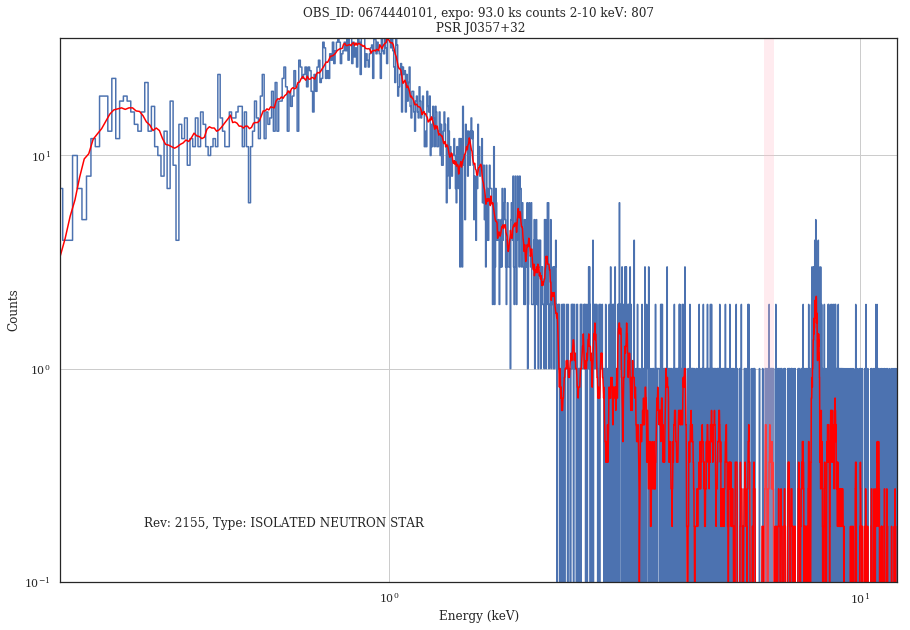

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673540301_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678381101_PPS_nxsa.tar. Will reuse it.
Extracted 0678381101/pps/P0678381101PNU002SRSPEC0001.FTZ


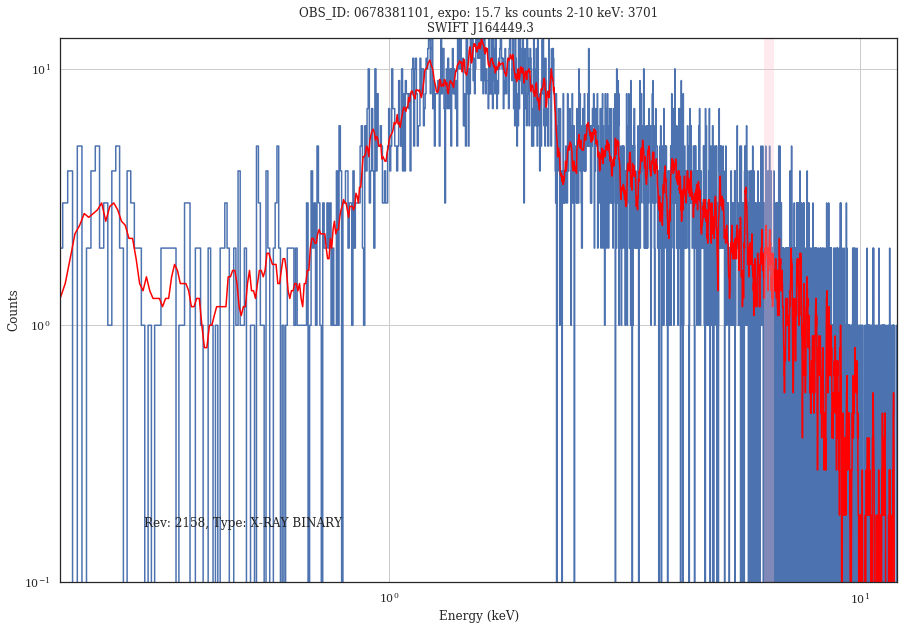

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0672281801_PPS_nxsa.tar. Will reuse it.
Extracted 0672281801/pps/P0672281801PNS003SRSPEC0001.FTZ


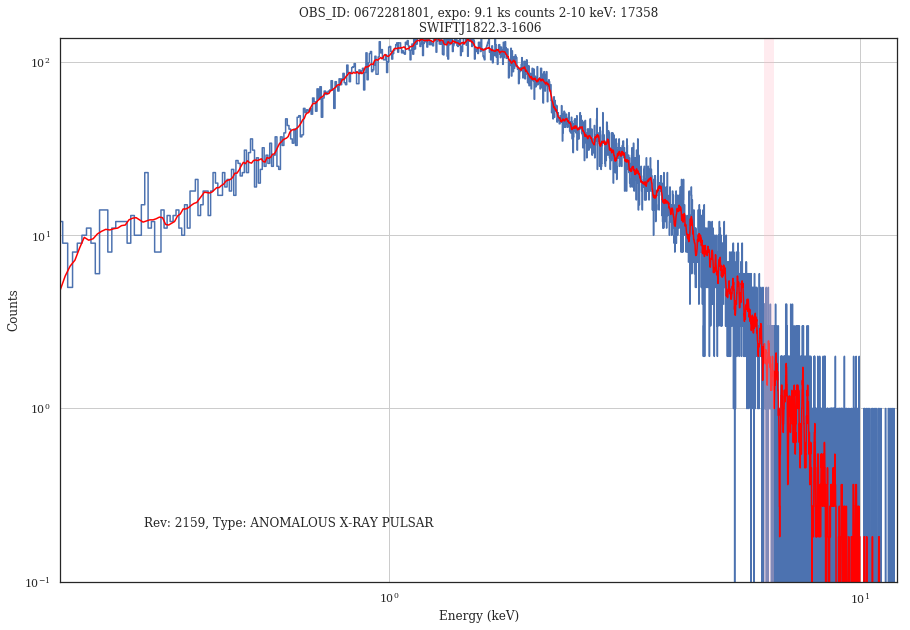

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0679380501_PPS_nxsa.tar. Will reuse it.
Extracted 0679380501/pps/P0679380501PNS001SRSPEC0001.FTZ


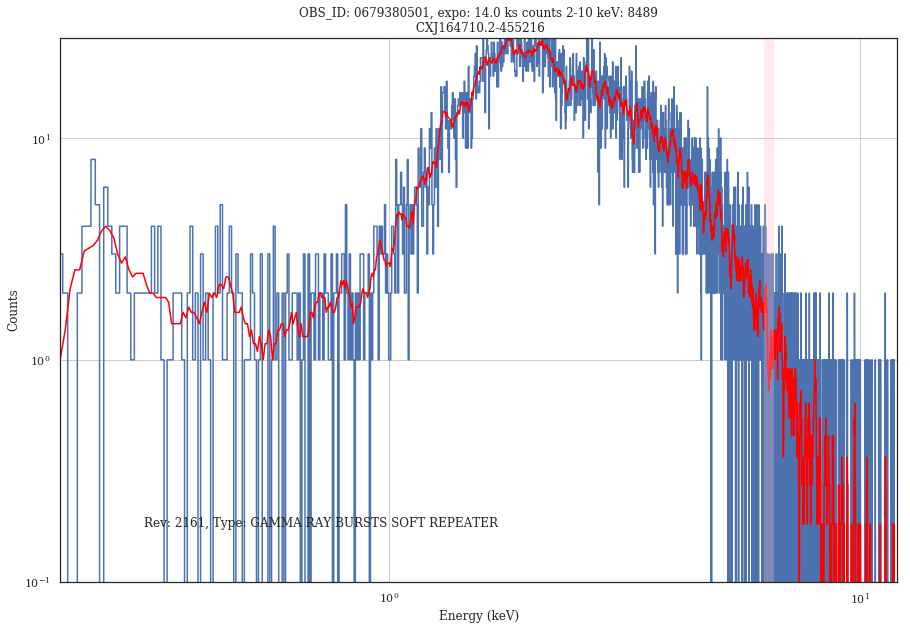

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0678381201_PPS_nxsa.tar. Will reuse it.
Extracted 0678381201/pps/P0678381201PNS001SRSPEC0001.FTZ


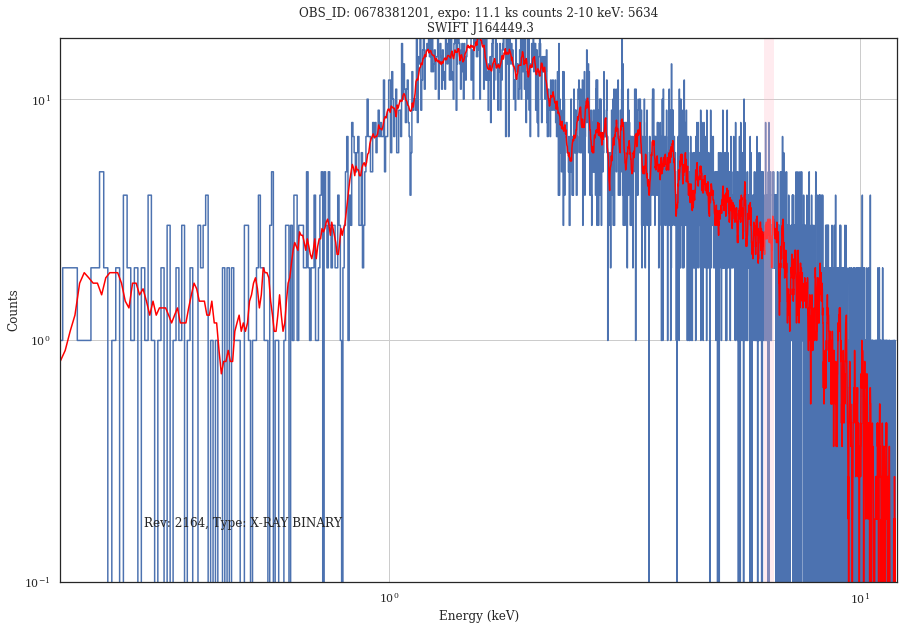

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673540601_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0672282701_PPS_nxsa.tar. Will reuse it.
Extracted 0672282701/pps/P0672282701PNS003SRSPEC0001.FTZ


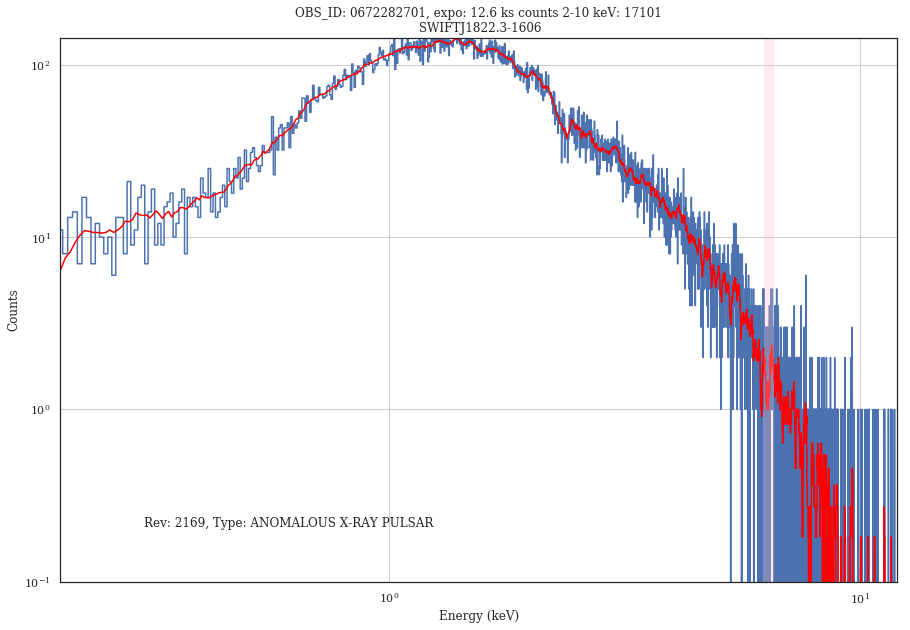

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0679380701_PPS_nxsa.tar. Will reuse it.
Extracted 0679380701/pps/P0679380701PNS003SRSPEC0001.FTZ


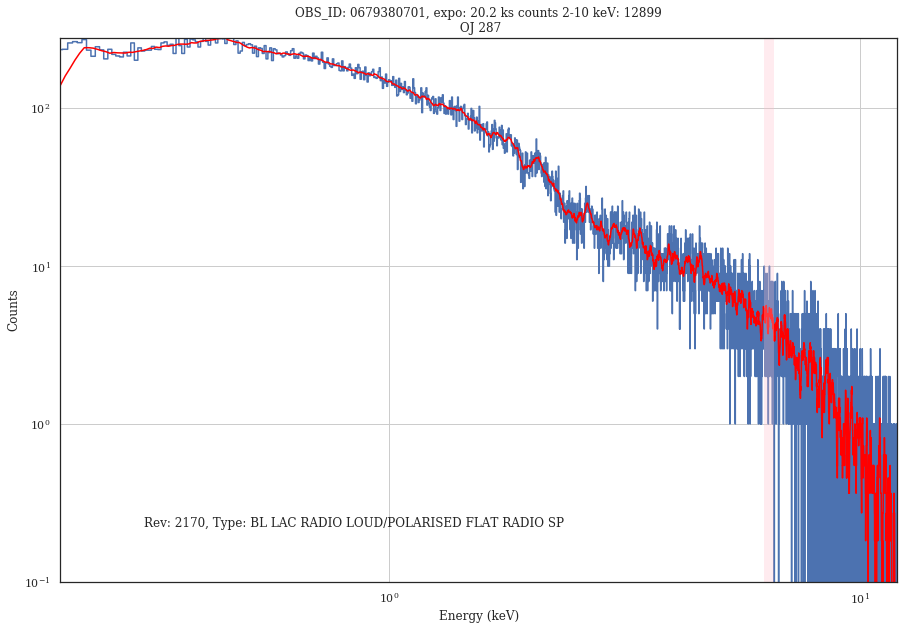

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0679381001_PPS_nxsa.tar. Will reuse it.
Extracted 0679381001/pps/P0679381001PNS001SRSPEC0001.FTZ


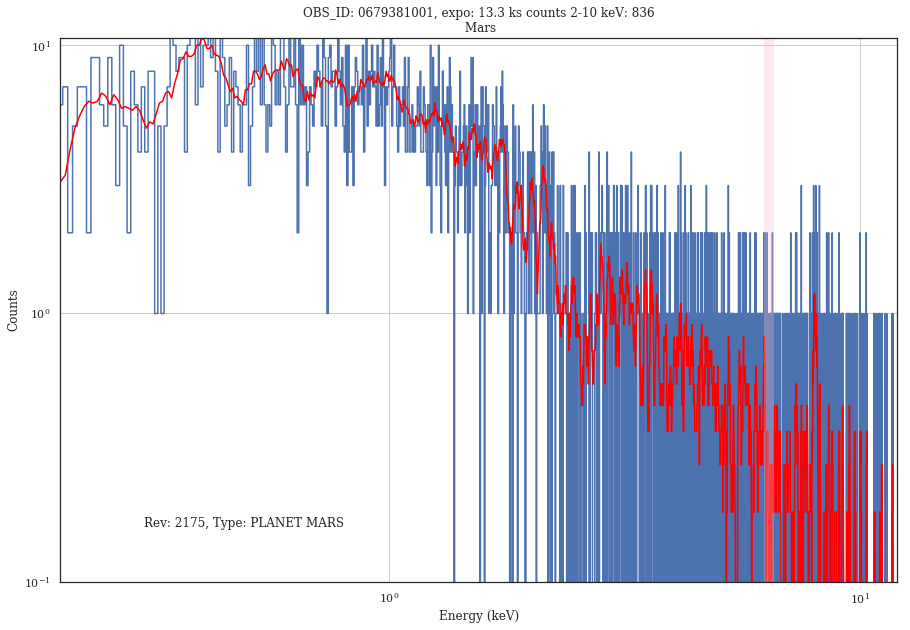

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673140401_PPS_nxsa.tar. Will reuse it.
Extracted 0673140401/pps/P0673140401PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0671150701_PPS_nxsa.tar. Will reuse it.
Extracted 0671150701/pps/P0671150701PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673140501_PPS_nxsa.tar. Will reuse it.
Extracted 0673140501/pps/P0673140501PNS003SRSPEC0001.FTZ


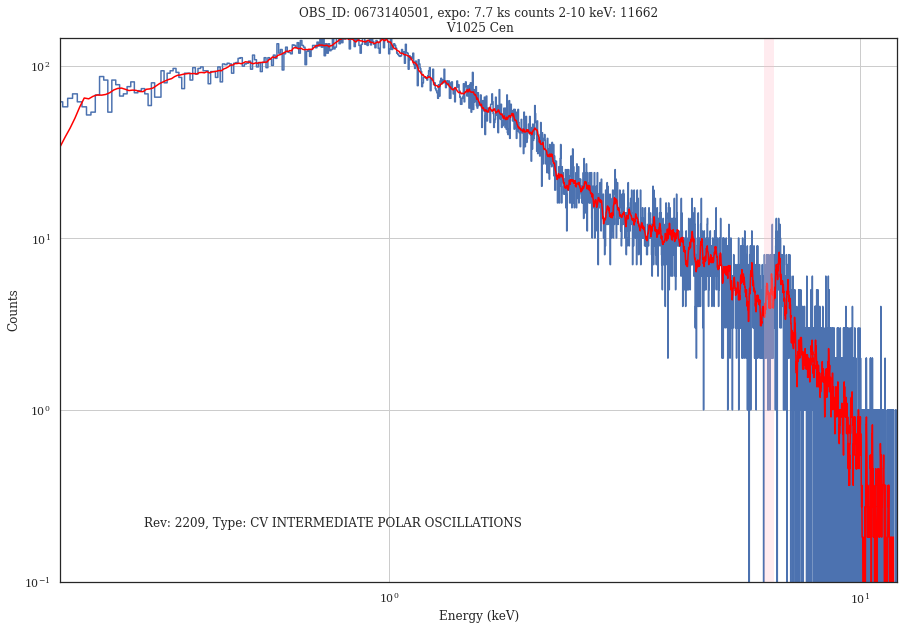

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673270301_PPS_nxsa.tar. Will reuse it.
Extracted 0673270301/pps/P0673270301PNS003SRSPEC0001.FTZ


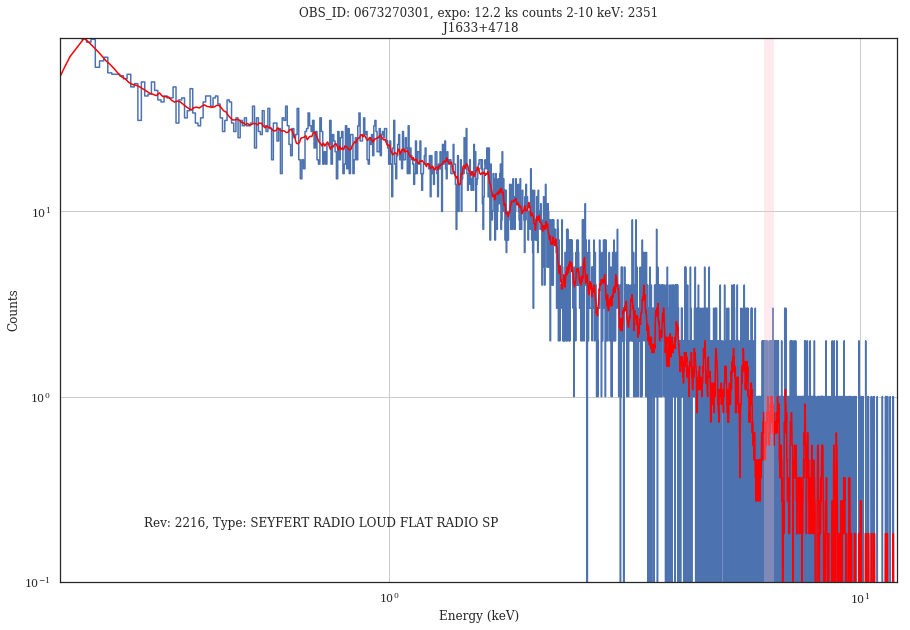

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0671150801_PPS_nxsa.tar. Will reuse it.
Extracted 0671150801/pps/P0671150801PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673540401_PPS_nxsa.tar. Will reuse it.
Extracted 0673540401/pps/P0673540401PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673540801_PPS_nxsa.tar. Will reuse it.
Extracted 0673540801/pps/P0673540801PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673540701_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673270401_PPS_nxsa.tar. Will reuse it.
Extracted 0673270401/pps/P0673270401PNS003SRSPEC0001.FTZ


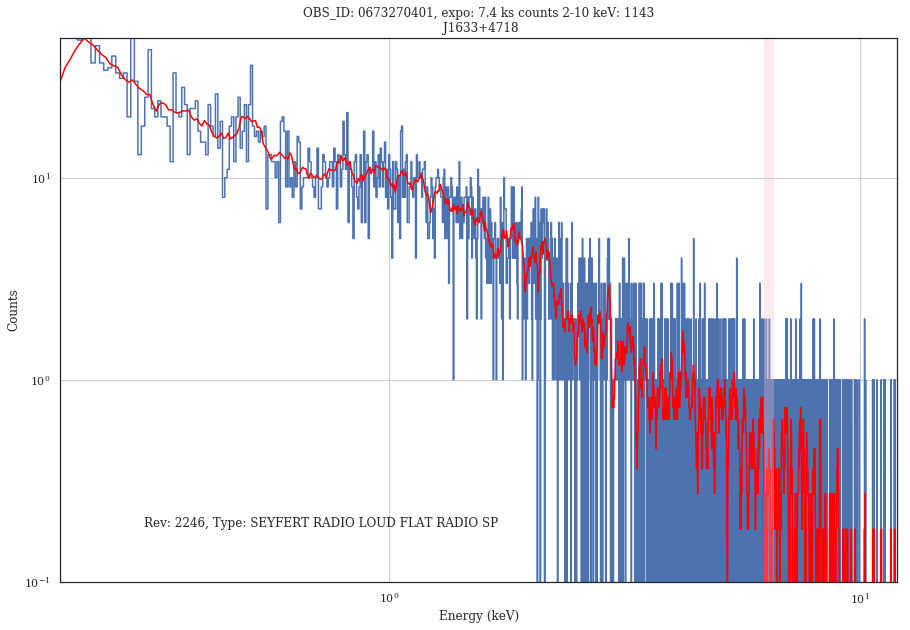

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673720401_PPS_nxsa.tar. Will reuse it.
Extracted 0673720401/pps/P0673720401PNS008SRSPEC0001.FTZ


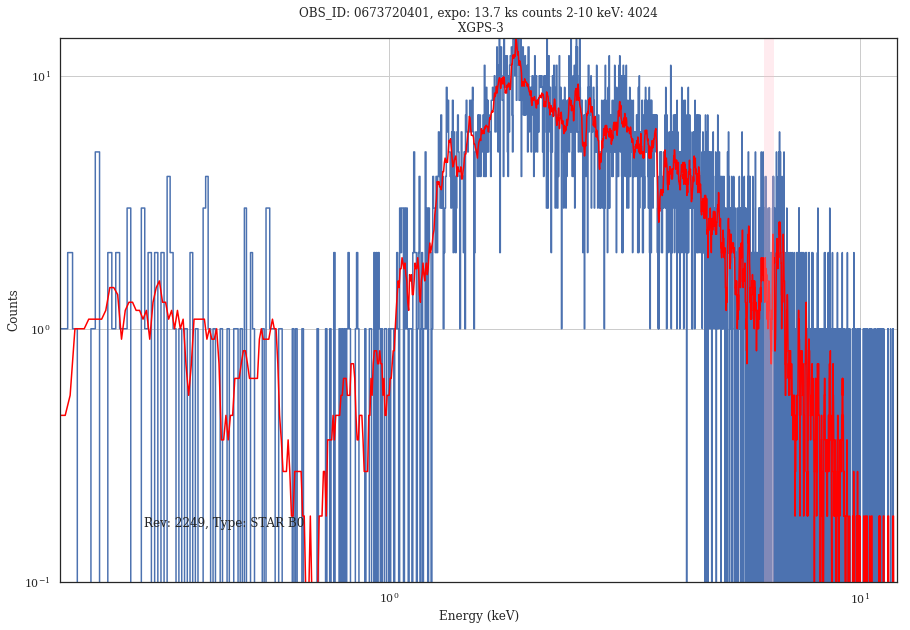

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0673140101_PPS_nxsa.tar. Will reuse it.
Extracted 0673140101/pps/P0673140101PNS003SRSPEC0001.FTZ


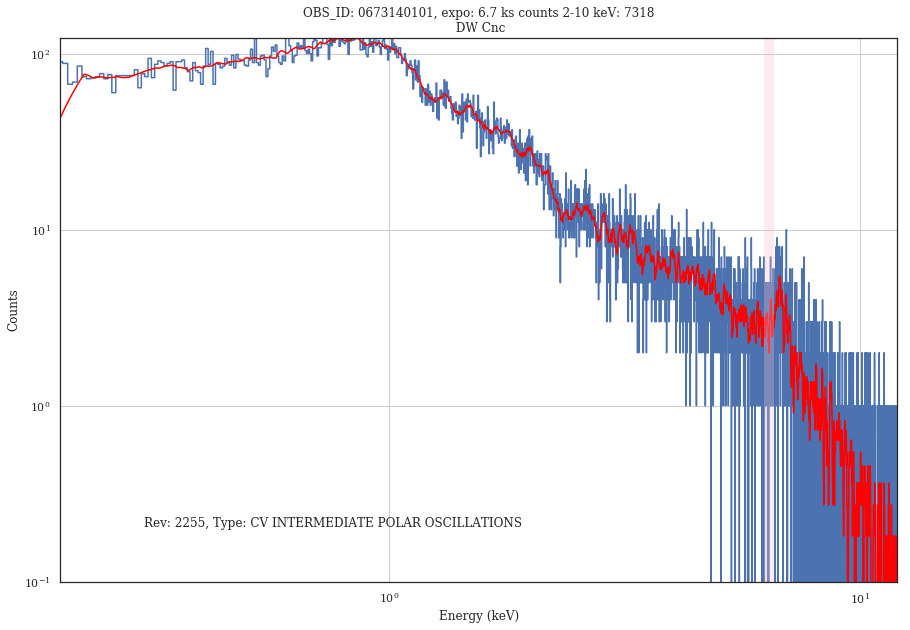

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0672282901_PPS_nxsa.tar. Will reuse it.
Extracted 0672282901/pps/P0672282901PNS003SRSPEC0001.FTZ


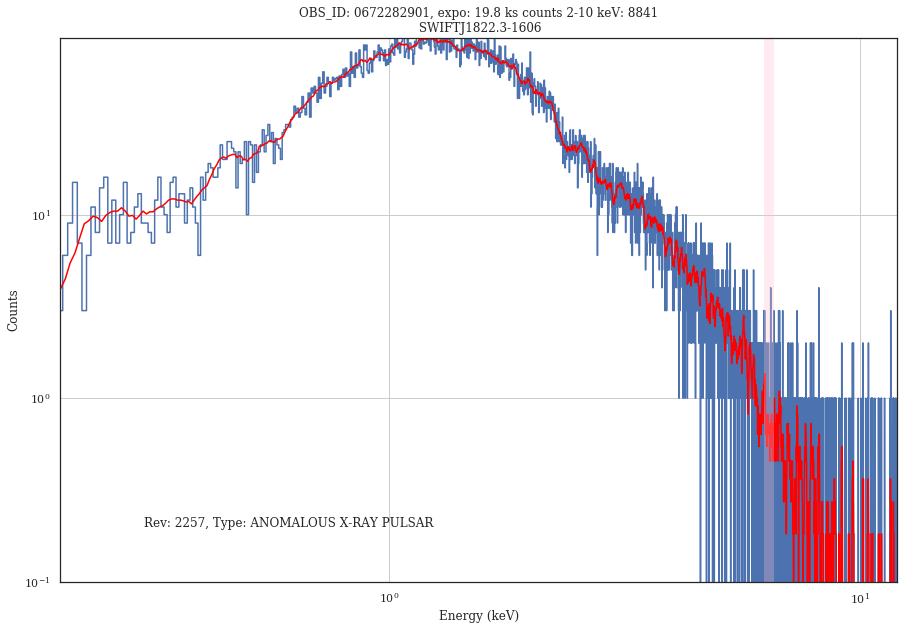

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0510390601_PPS_nxsa.tar. Will reuse it.
Extracted 0510390601/pps/P0510390601PNS005SRSPEC0001.FTZ


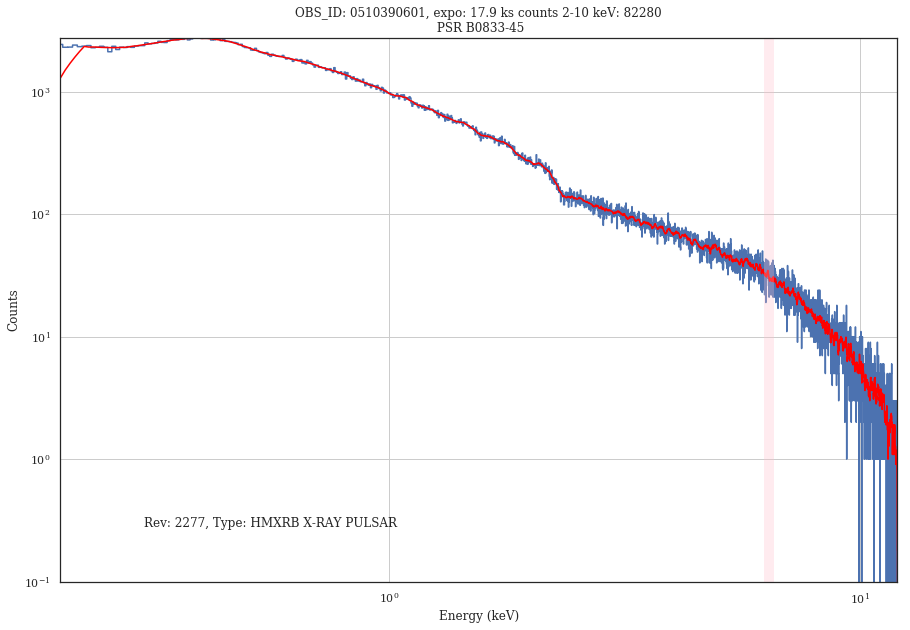

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0679810301_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0693100101_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0679810101_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0679810201_PPS_nxsa.tar. Will reuse it.
Extracted 0679810201/pps/P0679810201PNS001SRSPEC0001.FTZ


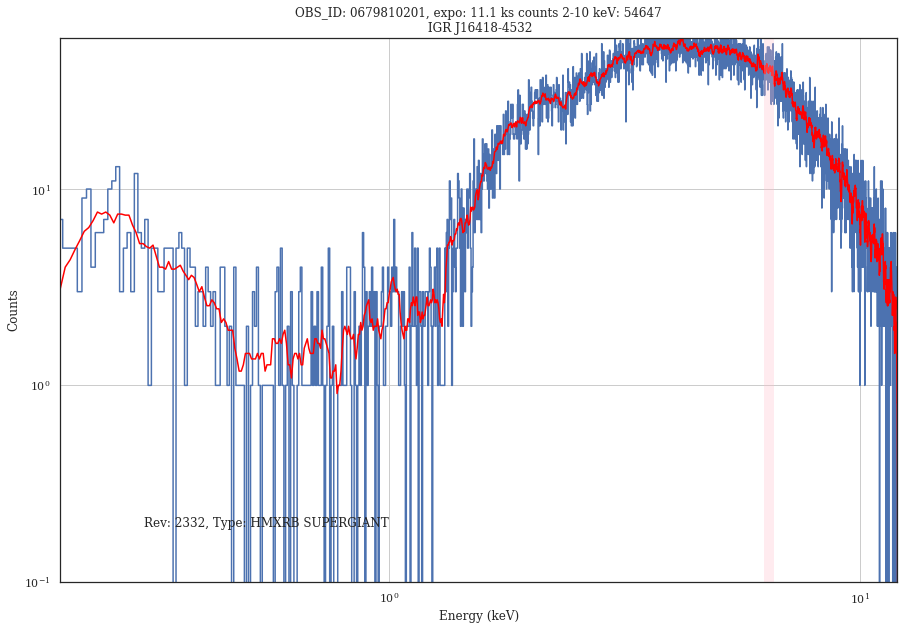

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0691070301_PPS_nxsa.tar. Will reuse it.
Extracted 0691070301/pps/P0691070301PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0672283001_PPS_nxsa.tar. Will reuse it.
Extracted 0672283001/pps/P0672283001PNS003SRSPEC0001.FTZ


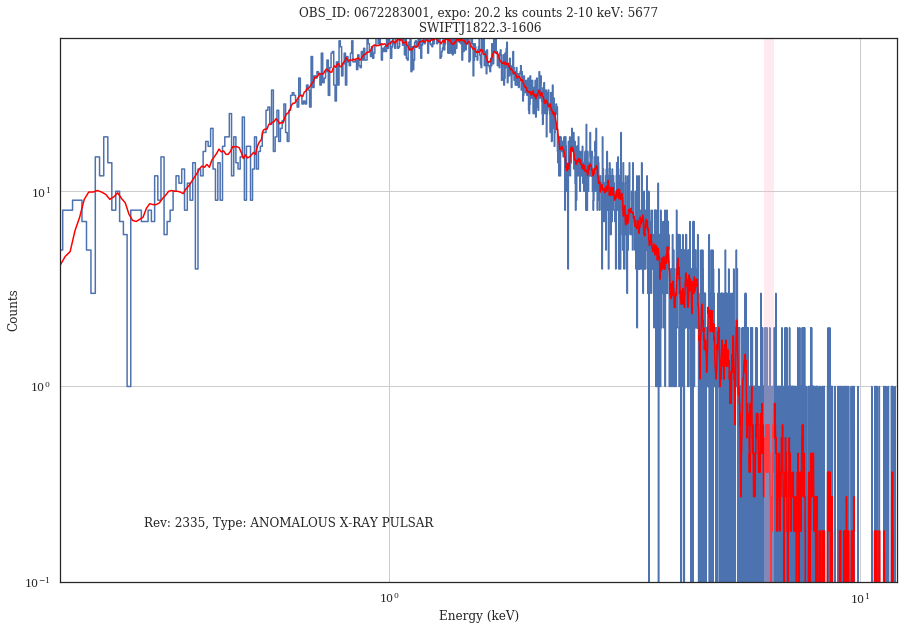

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0691760101_PPS_nxsa.tar. Will reuse it.
Extracted 0691760101/pps/P0691760101PNS003SRSPEC0001.FTZ


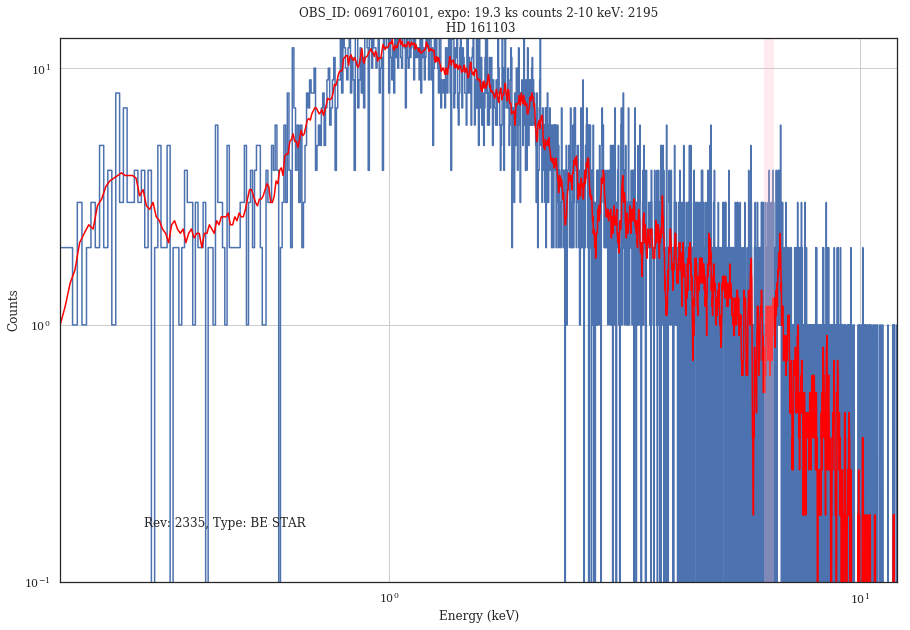

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0691070401_PPS_nxsa.tar. Will reuse it.
Extracted 0691070401/pps/P0691070401PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0692960101_PPS_nxsa.tar. Will reuse it.
Extracted 0692960101/pps/P0692960101PNS003SRSPEC0001.FTZ


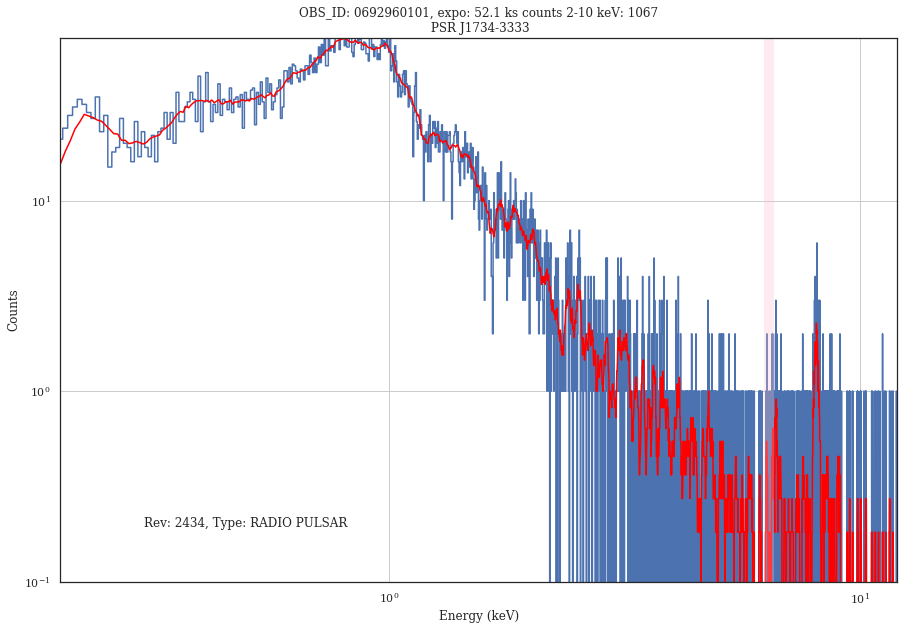

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0701230101_PPS_nxsa.tar. Will reuse it.
Extracted 0701230101/pps/P0701230101PNS001SRSPEC0001.FTZ


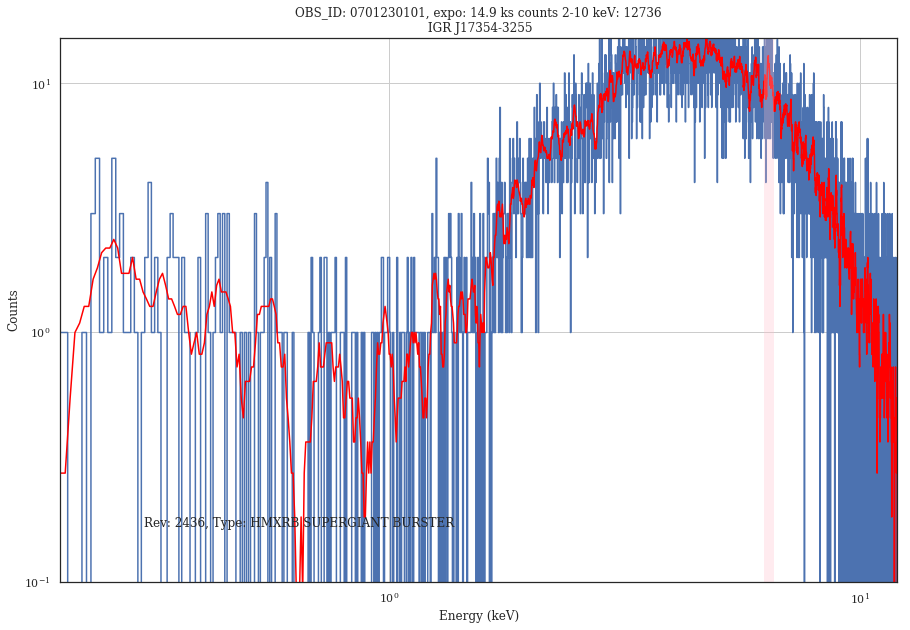

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0701230701_PPS_nxsa.tar. Will reuse it.
Extracted 0701230701/pps/P0701230701PNS001SRSPEC0001.FTZ


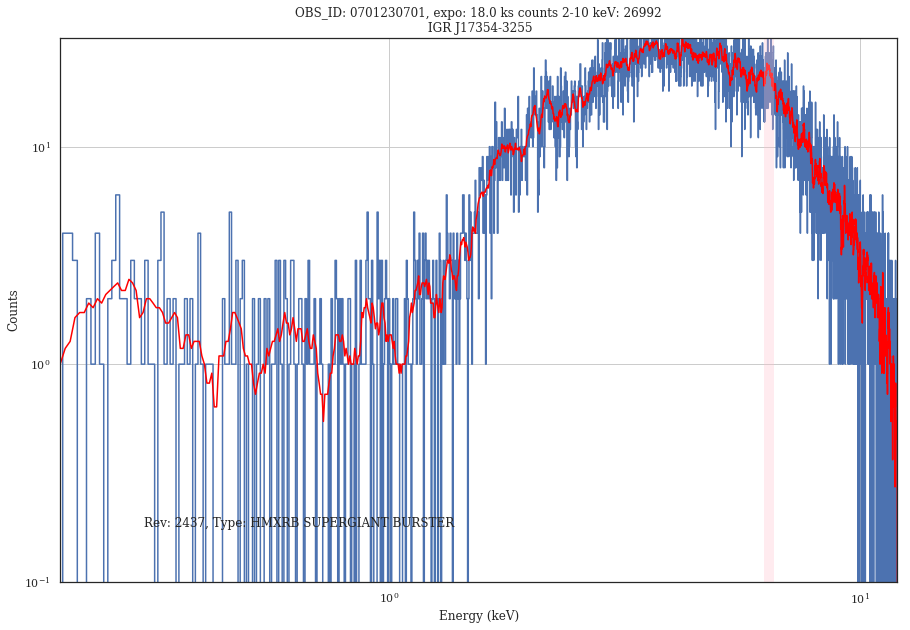

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0510390701_PPS_nxsa.tar. Will reuse it.
Extracted 0510390701/pps/P0510390701PNS005SRSPEC0001.FTZ


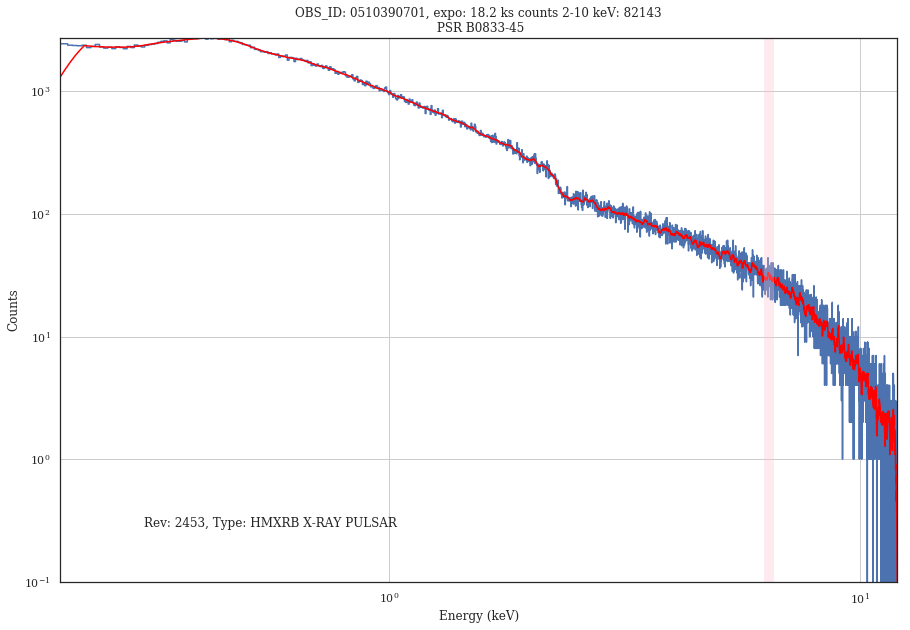

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0724090101_PPS_nxsa.tar. Will reuse it.
Extracted 0724090101/pps/P0724090101PNS003SRSPEC0001.FTZ


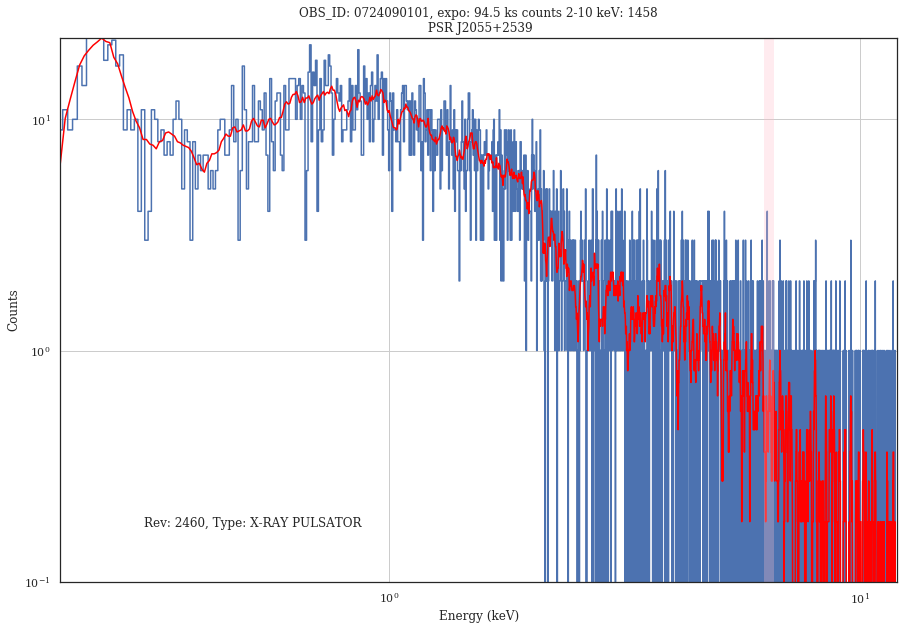

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0725060301_PPS_nxsa.tar. Will reuse it.
Extracted 0725060301/pps/P0725060301PNS003SRSPEC0001.FTZ


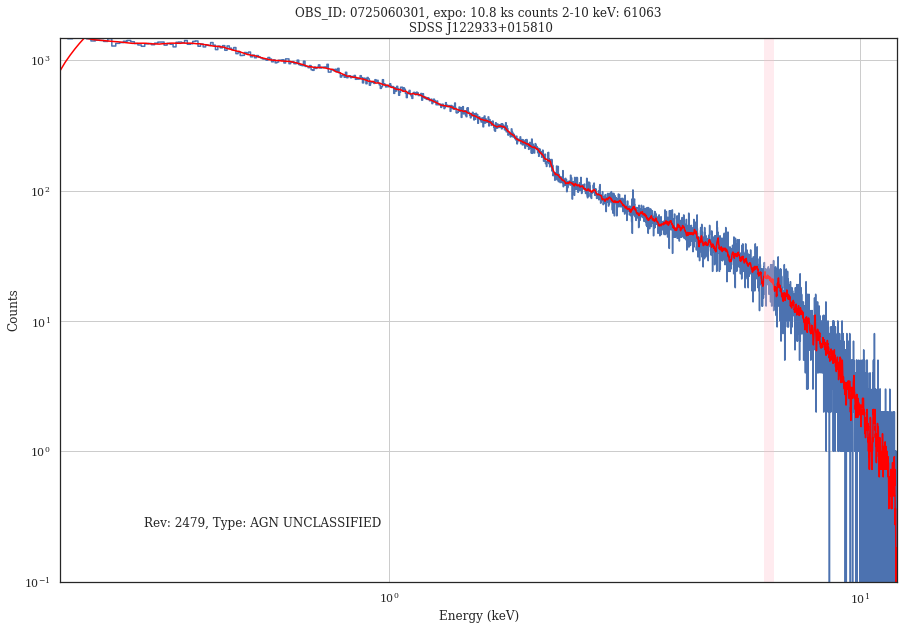

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0725060401_PPS_nxsa.tar. Will reuse it.
Extracted 0725060401/pps/P0725060401PNS003SRSPEC0001.FTZ


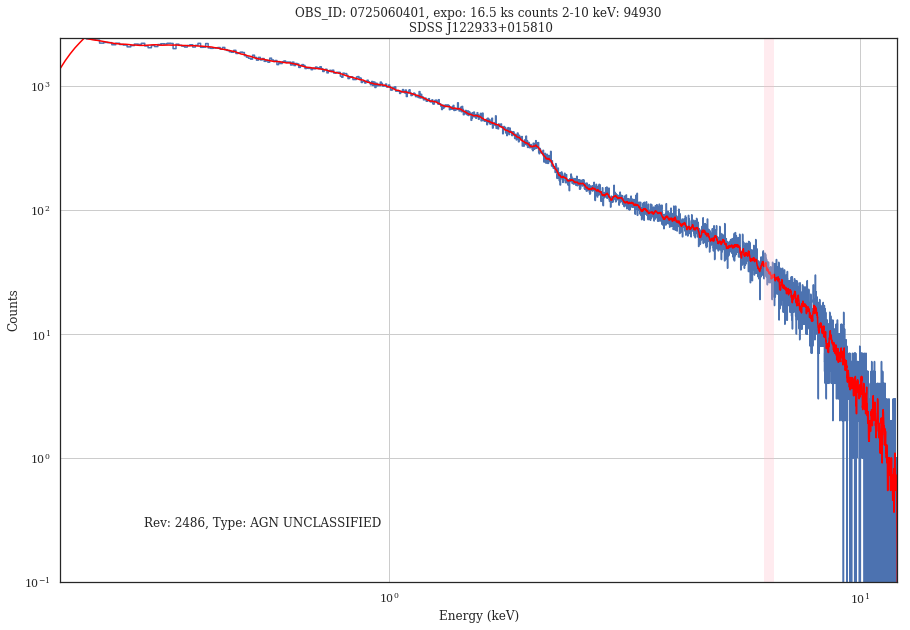

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0723810101_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0723810201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0721010201_PPS_nxsa.tar. Will reuse it.
Extracted 0721010201/pps/P0721010201PNS003SRSPEC0001.FTZ


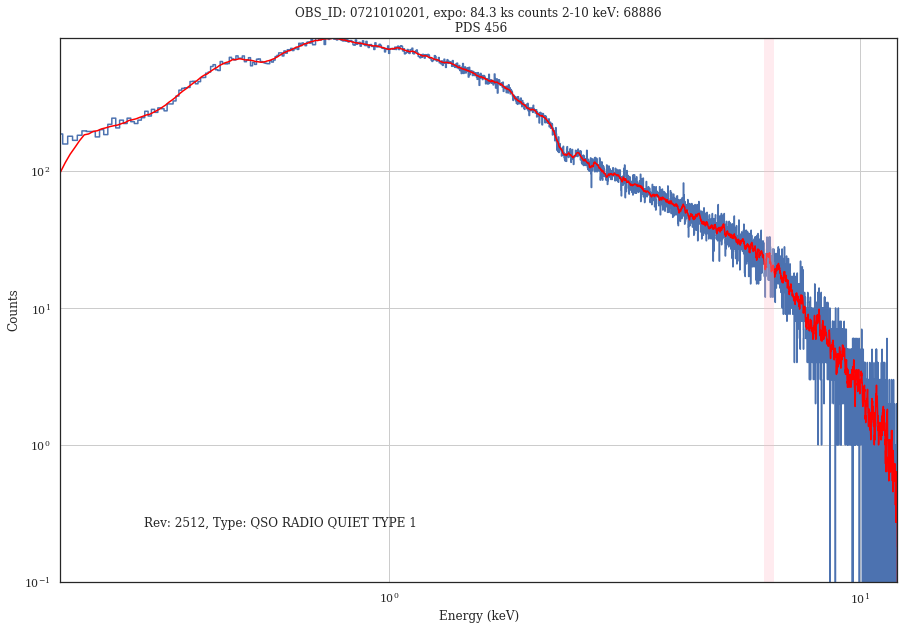

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0720780201_PPS_nxsa.tar. Will reuse it.
Extracted 0720780201/pps/P0720780201PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0721010301_PPS_nxsa.tar. Will reuse it.
Extracted 0721010301/pps/P0721010301PNS003SRSPEC0001.FTZ


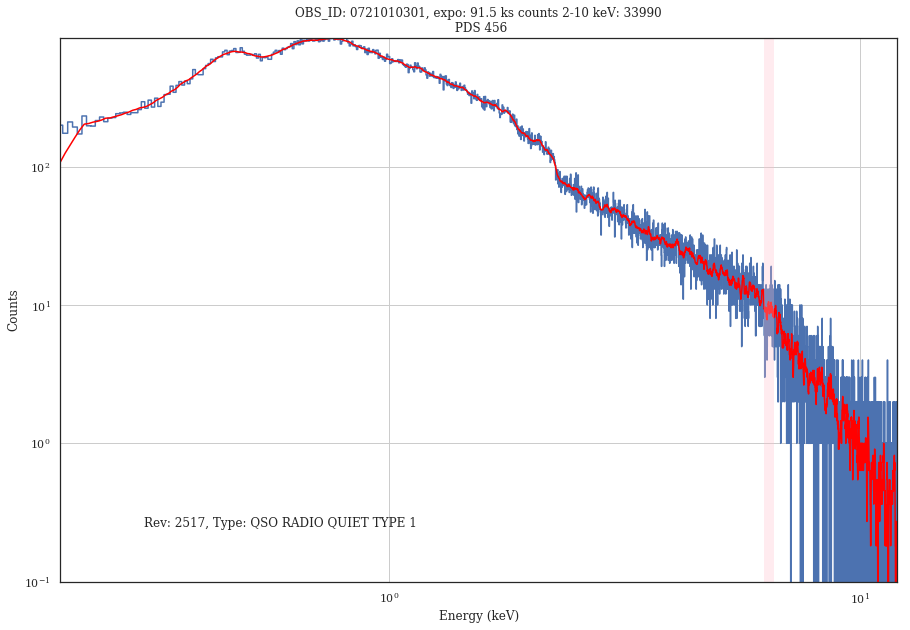

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0720730901_PPS_nxsa.tar. Will reuse it.
Extracted 0720730901/pps/P0720730901PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0721010401_PPS_nxsa.tar. Will reuse it.
Extracted 0721010401/pps/P0721010401PNS003SRSPEC0001.FTZ


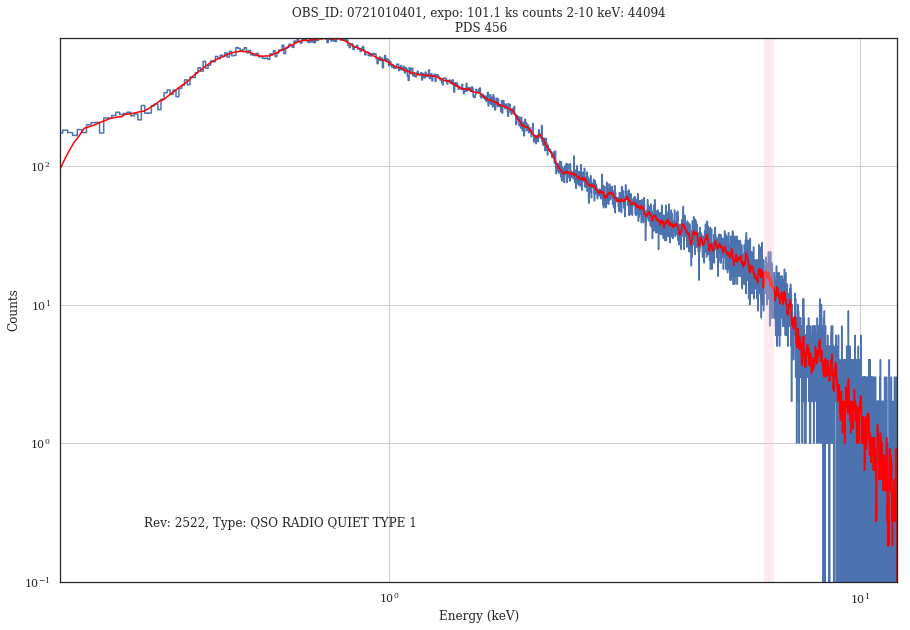

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0720731001_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0721010501_PPS_nxsa.tar. Will reuse it.
Extracted 0721010501/pps/P0721010501PNS003SRSPEC0001.FTZ


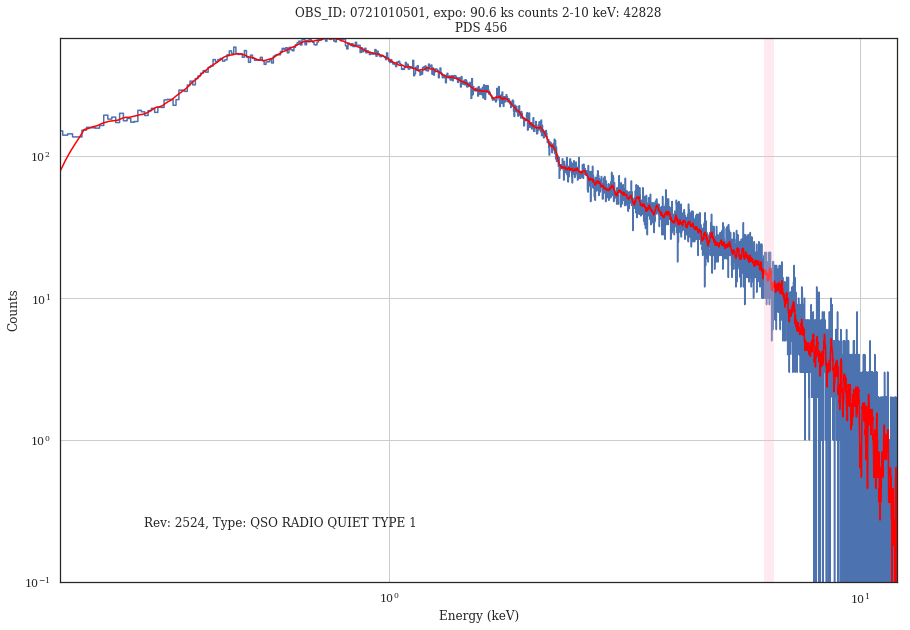

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0720731101_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0720731201_PPS_nxsa.tar. Will reuse it.
Extracted 0720731201/pps/P0720731201PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0720731301_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0720731601_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0725060501_PPS_nxsa.tar. Will reuse it.
Extracted 0725060501/pps/P0725060501PNS003SRSPEC0001.FTZ


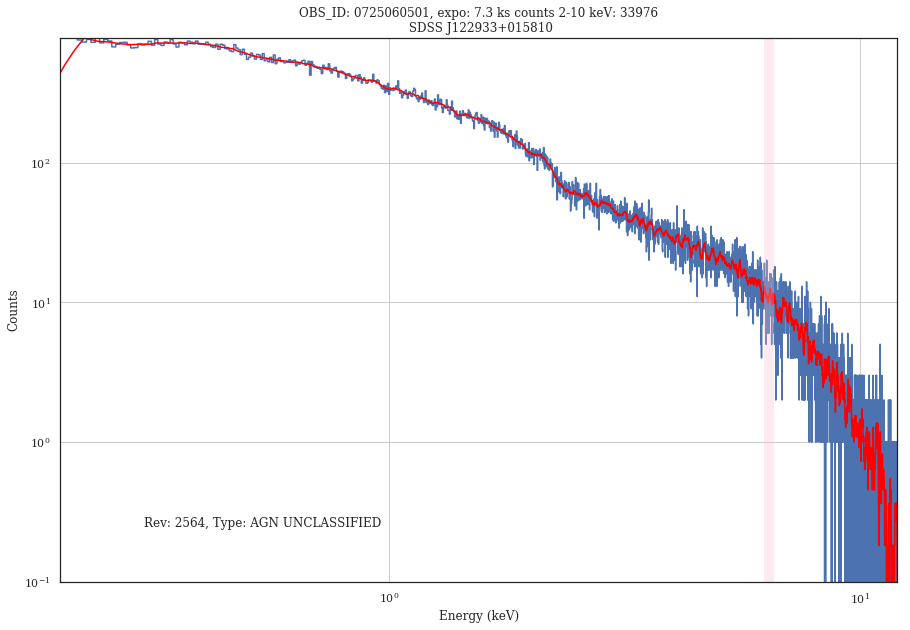

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0721730301_PPS_nxsa.tar. Will reuse it.
Extracted 0721730301/pps/P0721730301PNS003SRSPEC0001.FTZ


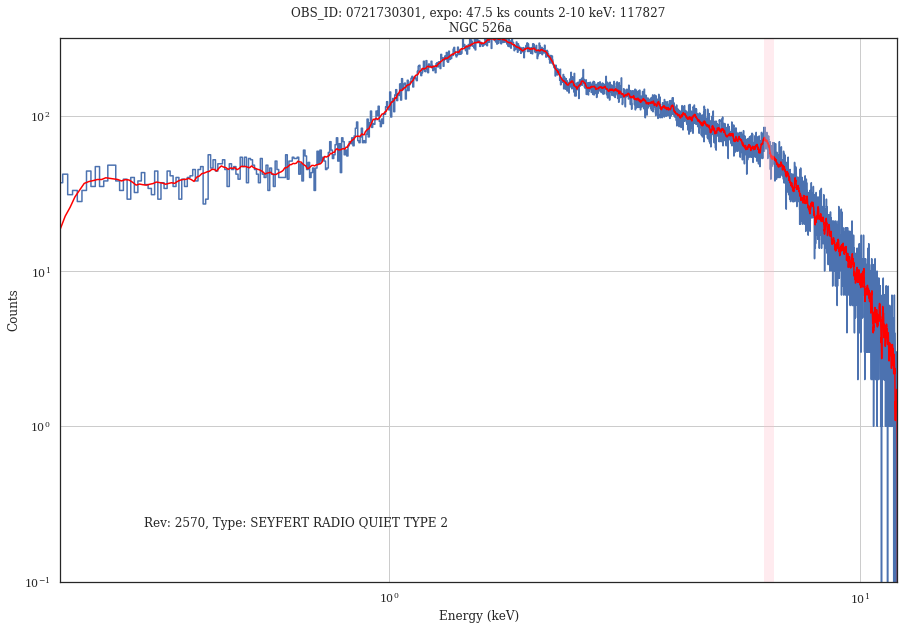

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0721730401_PPS_nxsa.tar. Will reuse it.
Extracted 0721730401/pps/P0721730401PNS003SRSPEC0001.FTZ


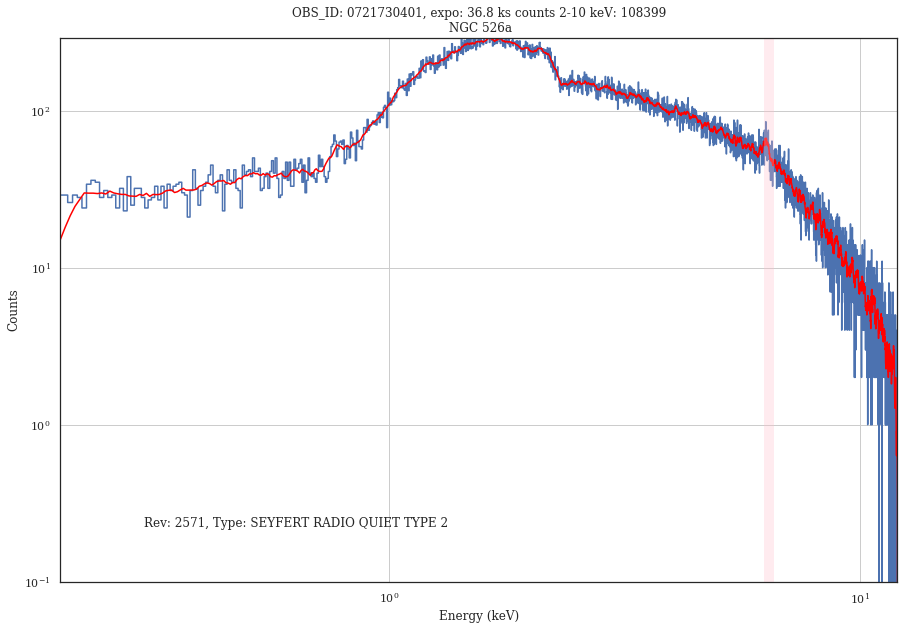

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0725060601_PPS_nxsa.tar. Will reuse it.
Extracted 0725060601/pps/P0725060601PNS003SRSPEC0001.FTZ


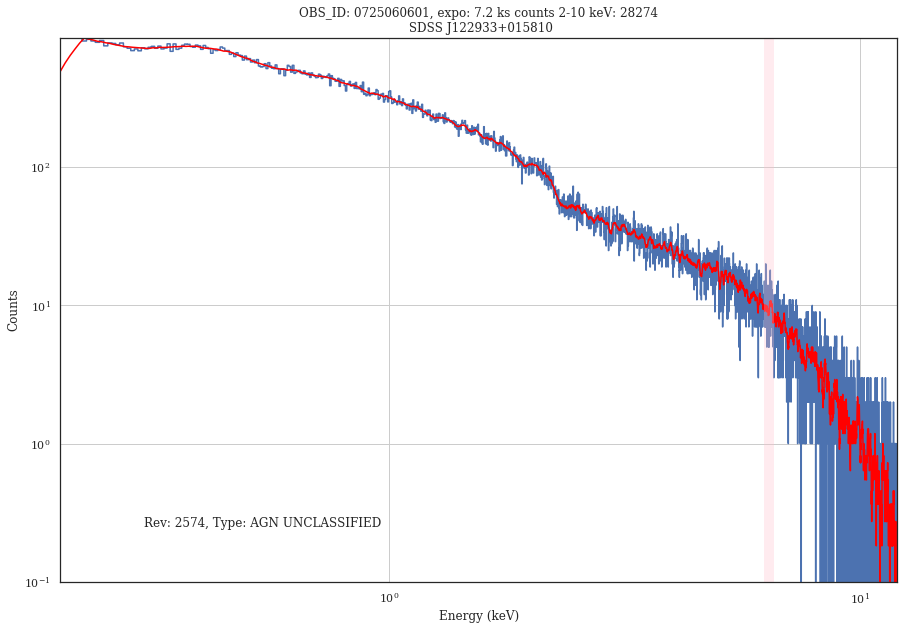

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0723100401_PPS_nxsa.tar. Will reuse it.
Extracted 0723100401/pps/P0723100401PNS007SRSPEC0001.FTZ


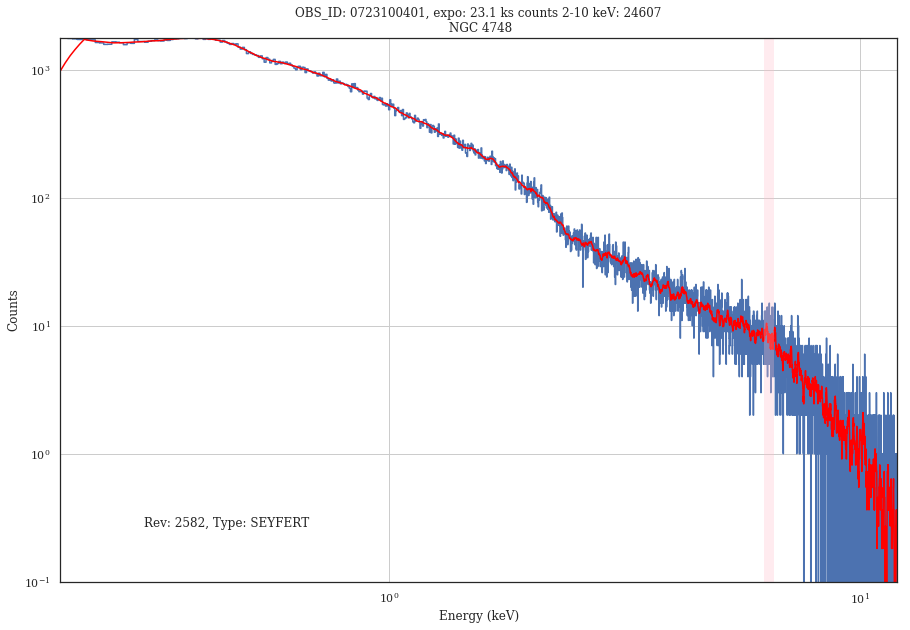

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0729560101_PPS_nxsa.tar. Will reuse it.
Extracted 0729560101/pps/P0729560101PNS003SRSPEC0001.FTZ


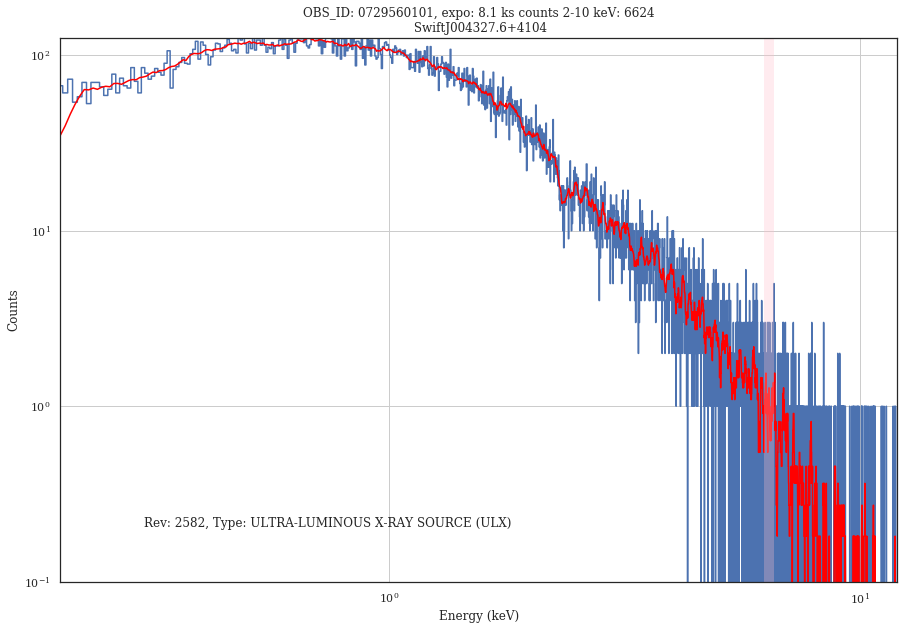

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0721010601_PPS_nxsa.tar. Will reuse it.
Extracted 0721010601/pps/P0721010601PNS003SRSPEC0001.FTZ


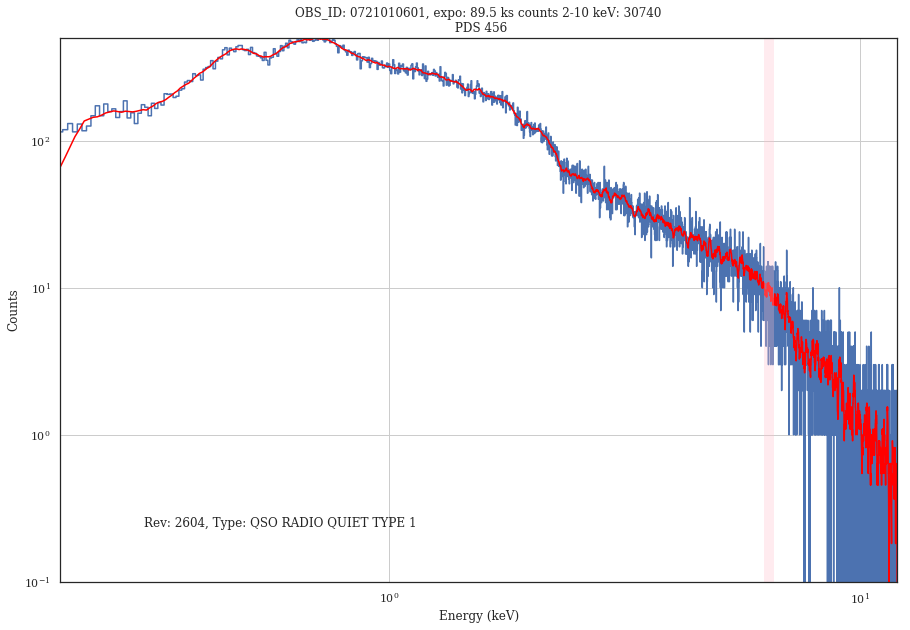

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0720780301_PPS_nxsa.tar. Will reuse it.
Extracted 0720780301/pps/P0720780301PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0720731401_PPS_nxsa.tar. Will reuse it.
Extracted 0720731401/pps/P0720731401PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0720731501_PPS_nxsa.tar. Will reuse it.
Extracted 0720731501/pps/P0720731501PNS003SRSPEC0001.FTZ


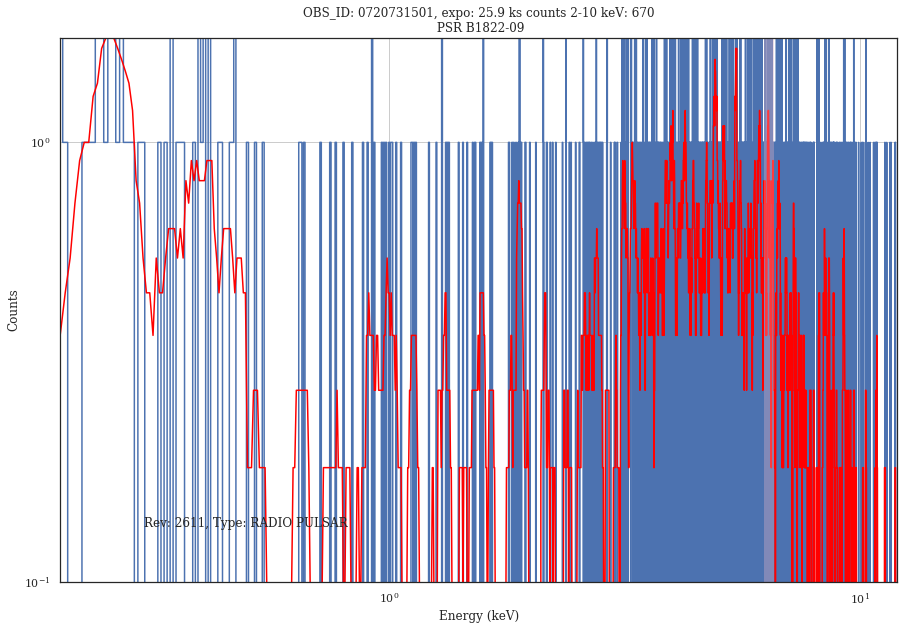

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0510390801_PPS_nxsa.tar. Will reuse it.
Extracted 0510390801/pps/P0510390801PNS005SRSPEC0001.FTZ


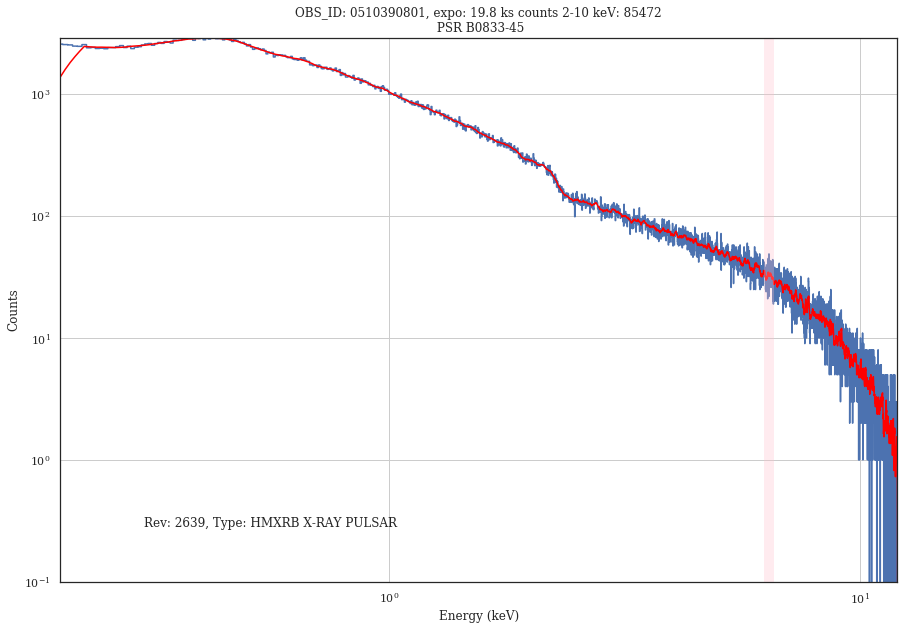

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0745110101_PPS_nxsa.tar. Will reuse it.
Extracted 0745110101/pps/P0745110101PNS003SRSPEC0001.FTZ


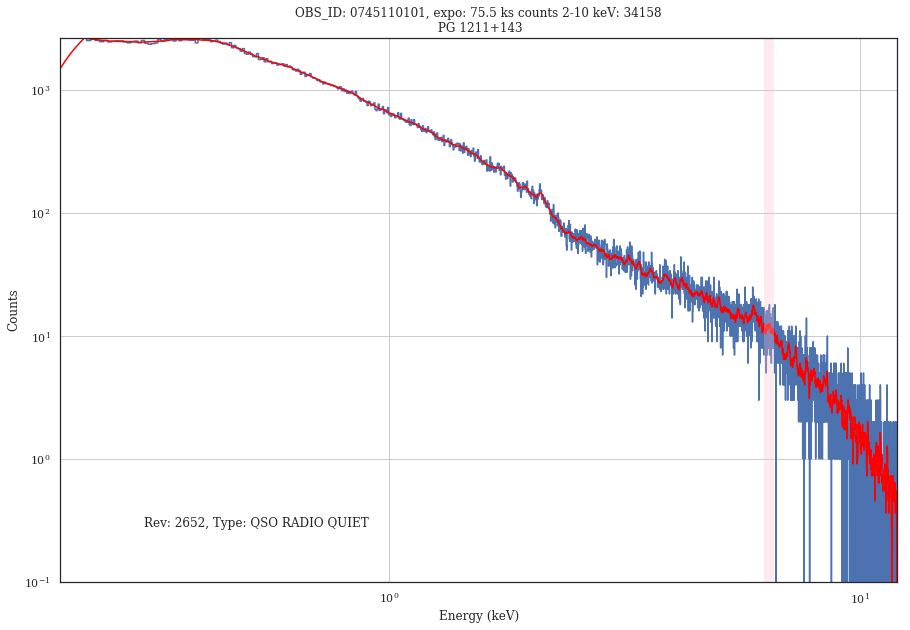

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0745110201_PPS_nxsa.tar. Will reuse it.
Extracted 0745110201/pps/P0745110201PNS003SRSPEC0001.FTZ


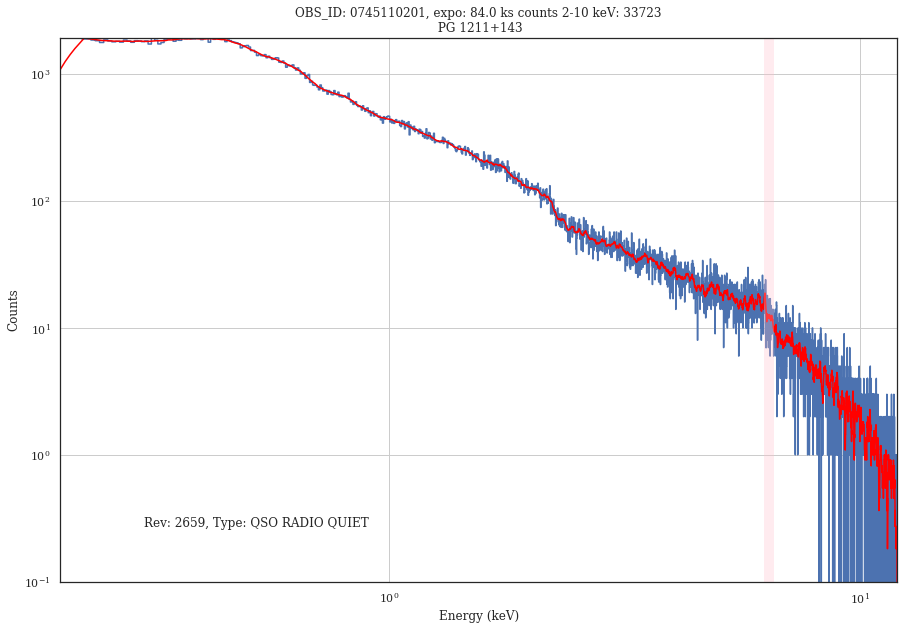

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0743470201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0743470231_PPS_nxsa.tar. Will reuse it.
Extracted 0743470231/pps/P0743470231PNU002SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0743470232_PPS_nxsa.tar. Will reuse it.
Extracted 0743470232/pps/P0743470232PNU002SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0743470233_PPS_nxsa.tar. Will reuse it.
Extracted 0743470233/pps/P0743470233PNU002SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0743470234_PPS_nxsa.tar. Will reuse it.
Extracted 0743470234/pps/P0743470234PNU002SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0743470235_PPS_nxsa.tar. Will reuse it.
Extracted 0743470235/pps/P0743470235PNU002SRSPEC0001.FTZ
Found an already existing PPS t

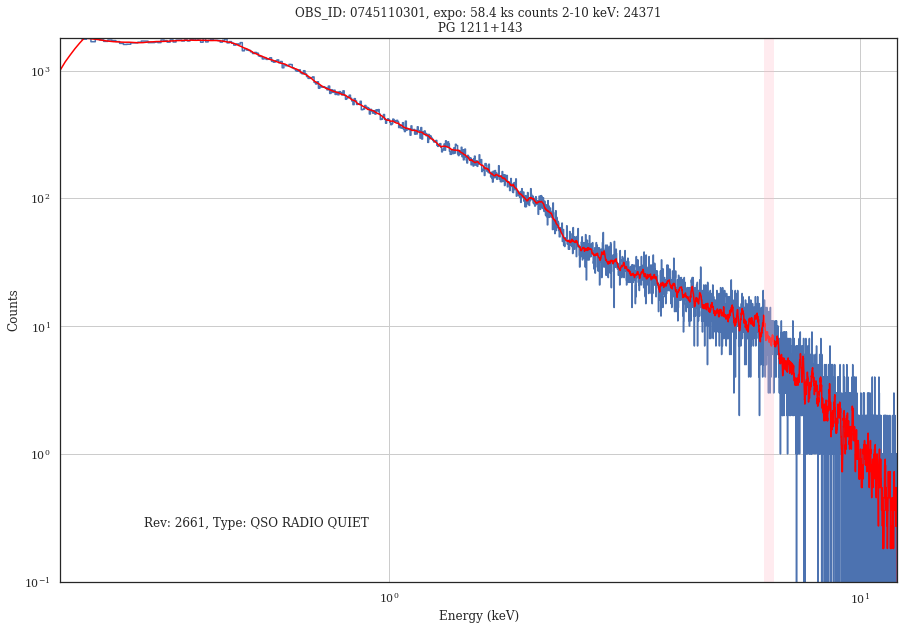

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0745110401_PPS_nxsa.tar. Will reuse it.
Extracted 0745110401/pps/P0745110401PNS003SRSPEC0001.FTZ


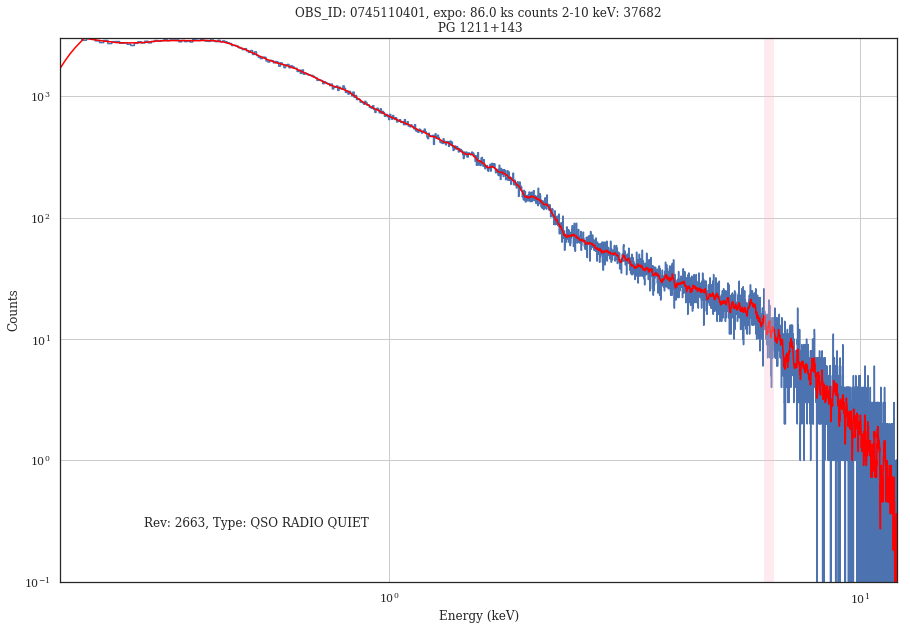

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0745110501_PPS_nxsa.tar. Will reuse it.
Extracted 0745110501/pps/P0745110501PNS003SRSPEC0001.FTZ


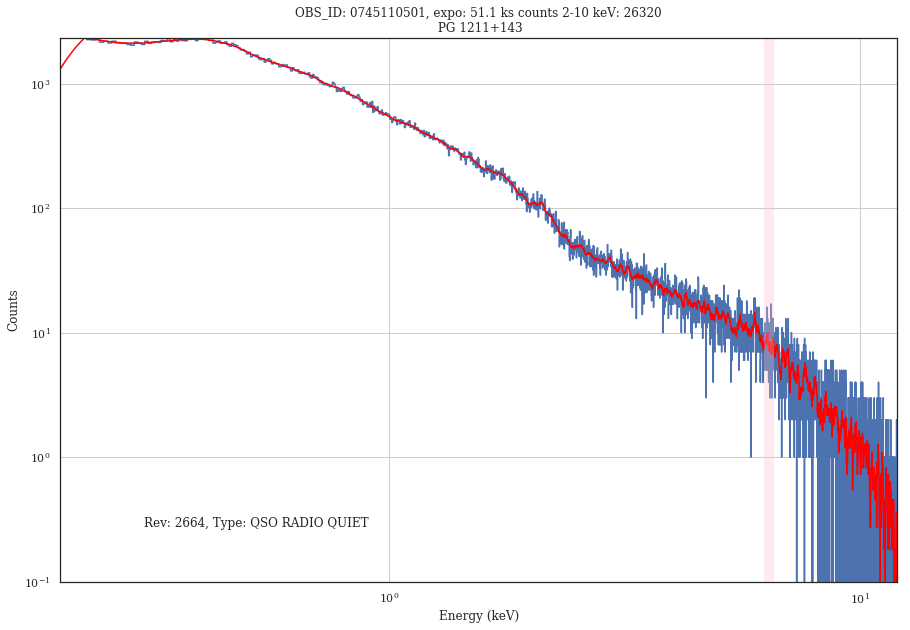

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0745110601_PPS_nxsa.tar. Will reuse it.
Extracted 0745110601/pps/P0745110601PNS003SRSPEC0001.FTZ


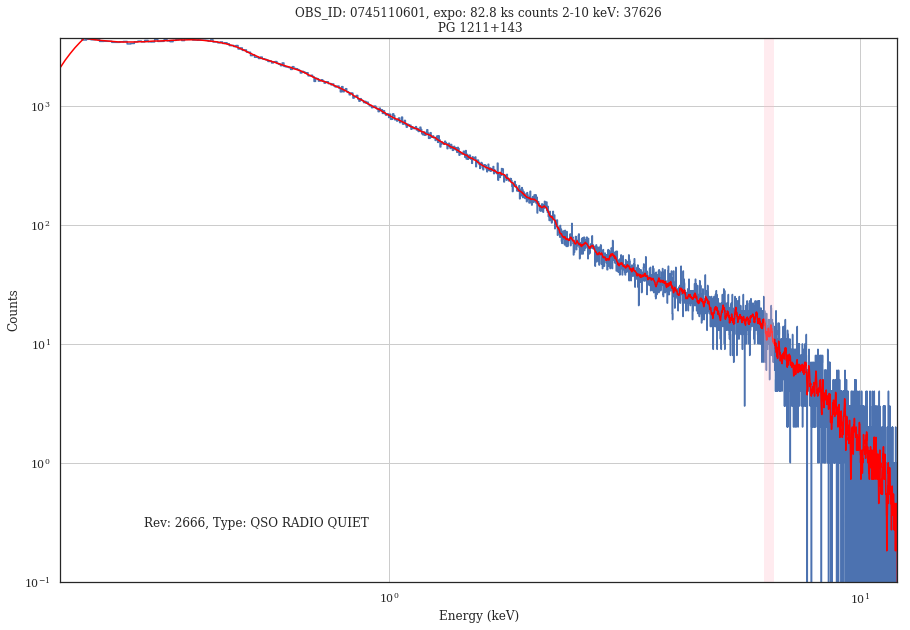

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0745110701_PPS_nxsa.tar. Will reuse it.
Extracted 0745110701/pps/P0745110701PNS003SRSPEC0001.FTZ


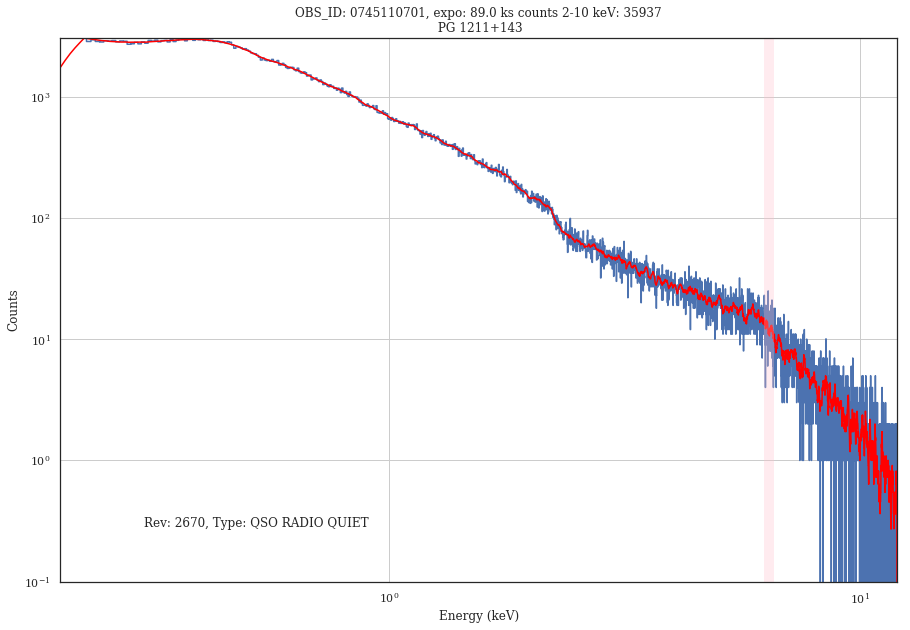

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0744450101_PPS_nxsa.tar. Will reuse it.
Extracted 0744450101/pps/P0744450101PNS003SRSPEC0001.FTZ


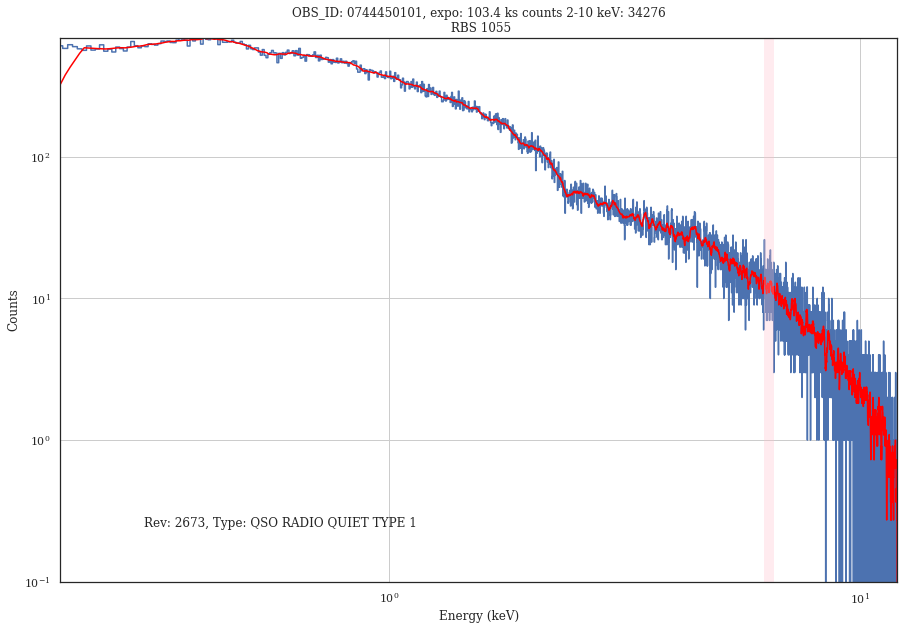

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0744450401_PPS_nxsa.tar. Will reuse it.
Extracted 0744450401/pps/P0744450401PNS003SRSPEC0001.FTZ


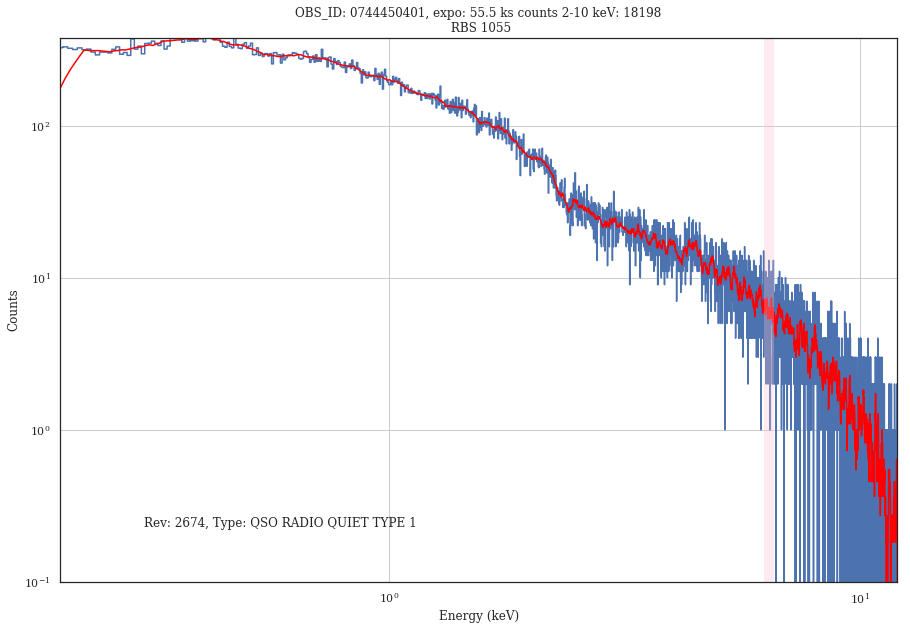

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0741970201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0741970301_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0741970401_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0743460301_PPS_nxsa.tar. Will reuse it.
Extracted 0743460301/pps/P0743460301PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0743460201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0743460101_PPS_nxsa.tar. Will reuse it.
Extracted 0743460101/pps/P0743460101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0740620201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0744490401_PPS

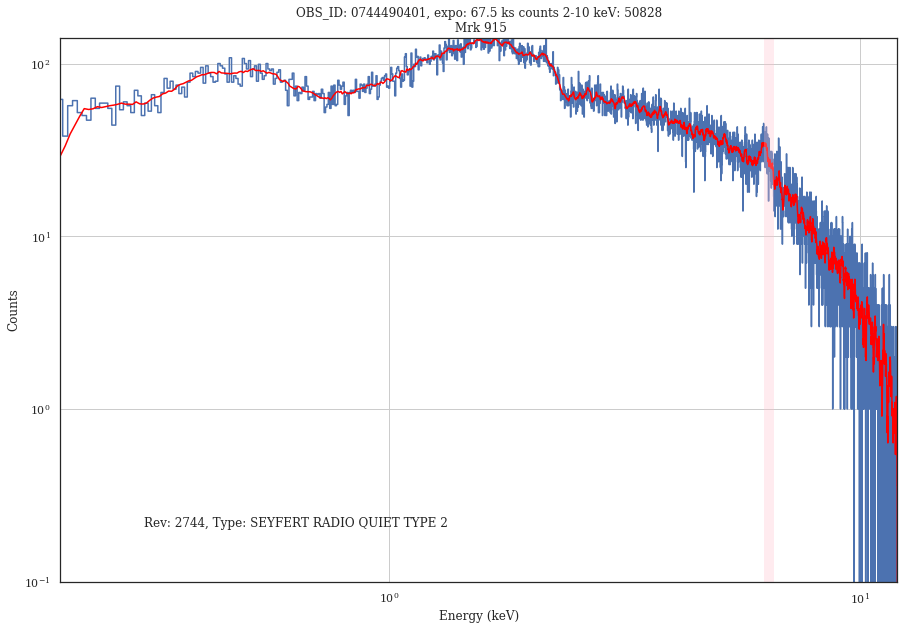

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0744220301_PPS_nxsa.tar. Will reuse it.
Extracted 0744220301/pps/P0744220301PNS003SRSPEC0001.FTZ


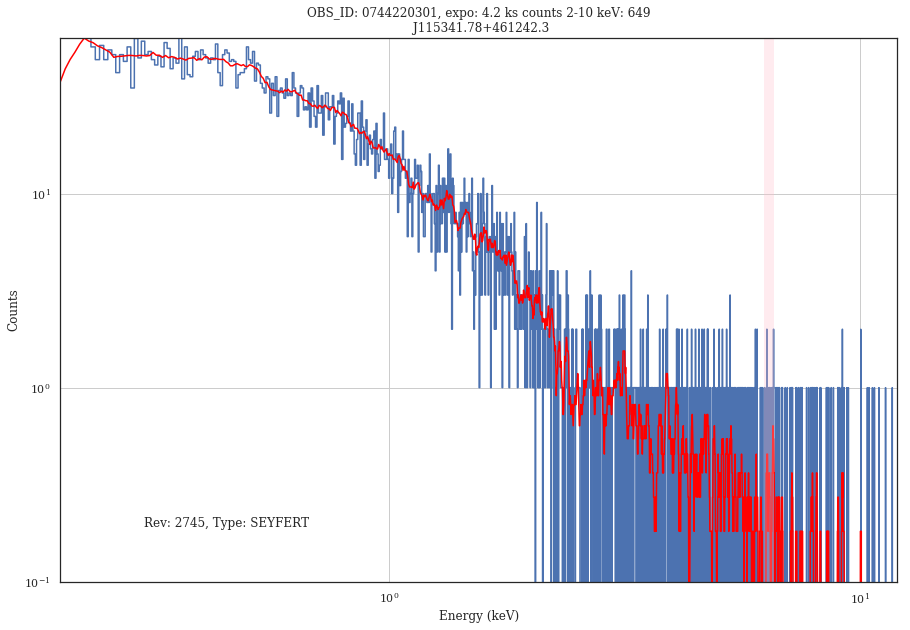

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0744490501_PPS_nxsa.tar. Will reuse it.
Extracted 0744490501/pps/P0744490501PNS003SRSPEC0001.FTZ


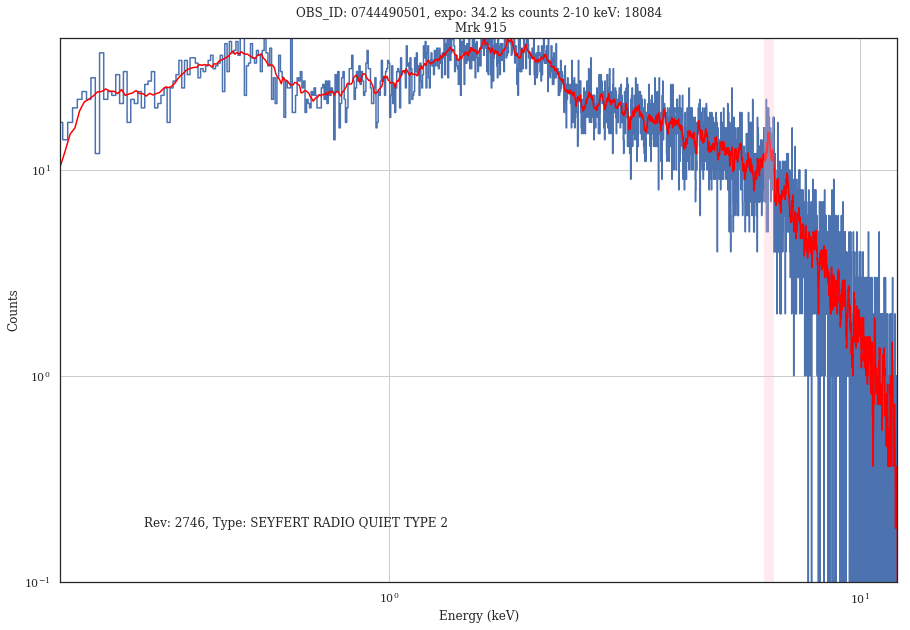

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0744490601_PPS_nxsa.tar. Will reuse it.
Extracted 0744490601/pps/P0744490601PNS003SRSPEC0001.FTZ


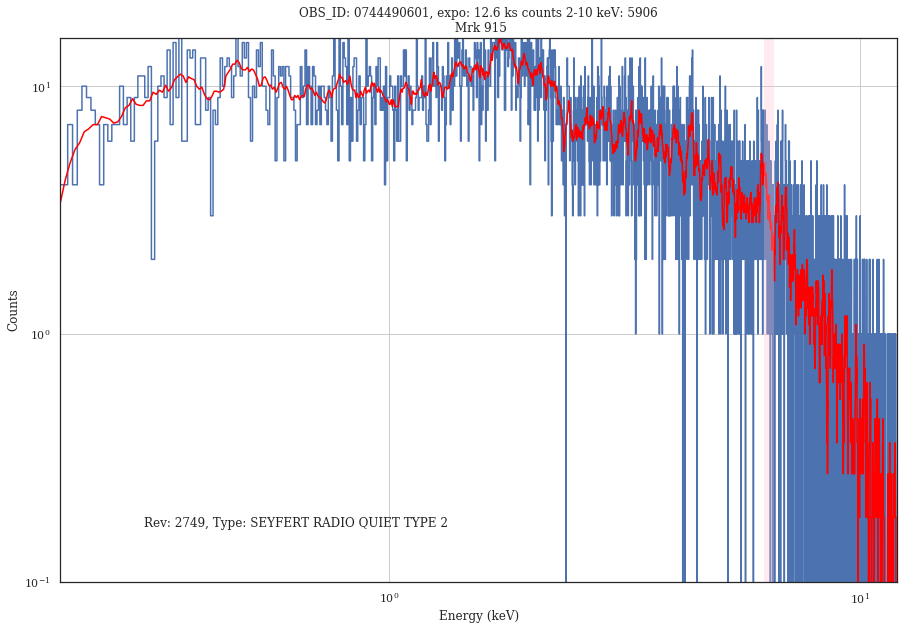

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0744450301_PPS_nxsa.tar. Will reuse it.
Extracted 0744450301/pps/P0744450301PNS003SRSPEC0001.FTZ


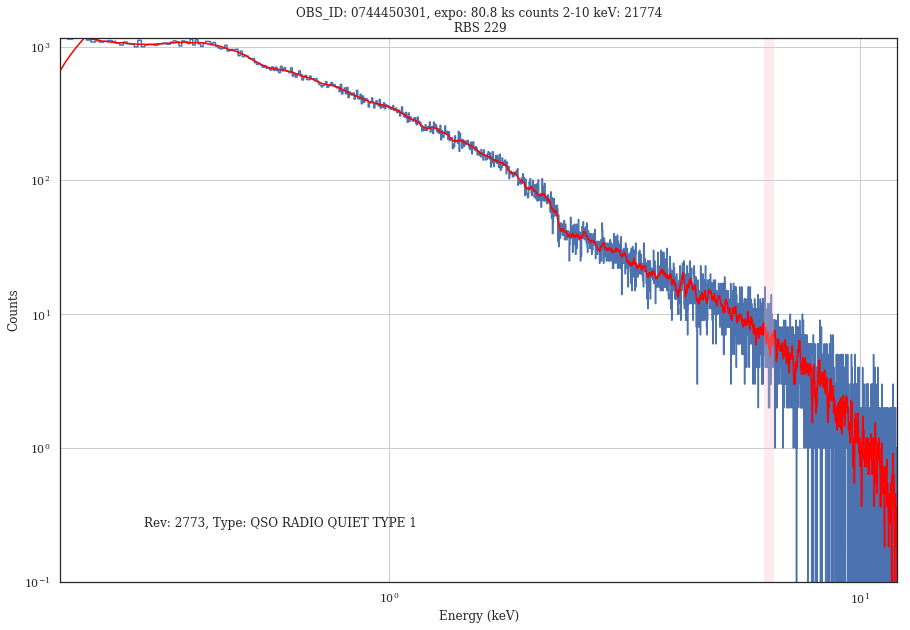

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0744220401_PPS_nxsa.tar. Will reuse it.
Extracted 0744220401/pps/P0744220401PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0748010101_PPS_nxsa.tar. Will reuse it.
Extracted 0748010101/pps/P0748010101PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0764700501_PPS_nxsa.tar. Will reuse it.
Extracted 0764700501/pps/P0764700501PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0764700101_PPS_nxsa.tar. Will reuse it.
Extracted 0764700101/pps/P0764700101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0761500201_PPS_nxsa.tar. Will reuse it.
Extracted 0761500201/pps/P0761500201PNS003SRSPEC0001.FTZ


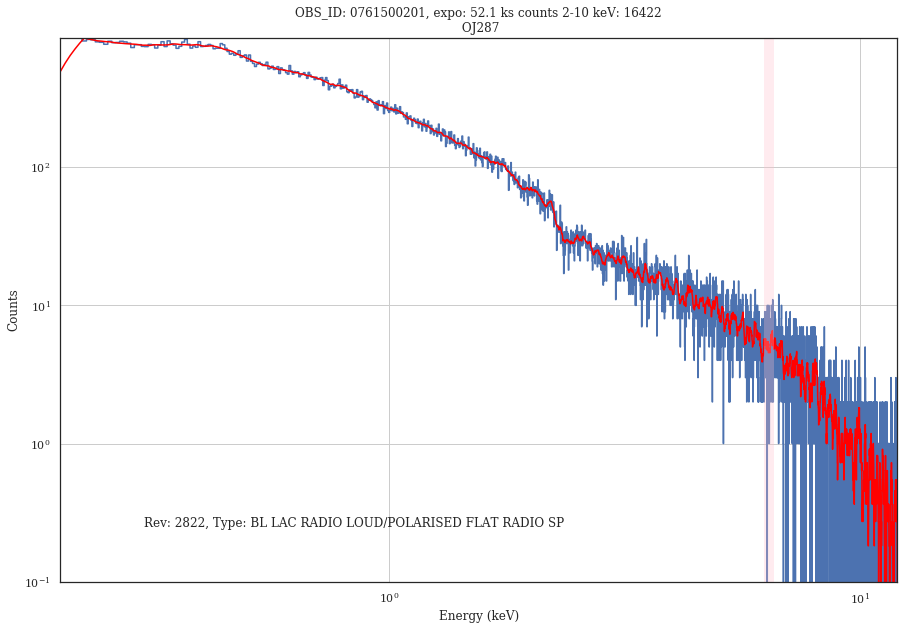

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0764700201_PPS_nxsa.tar. Will reuse it.
Extracted 0764700201/pps/P0764700201PNS003SRSPEC0001.FTZ


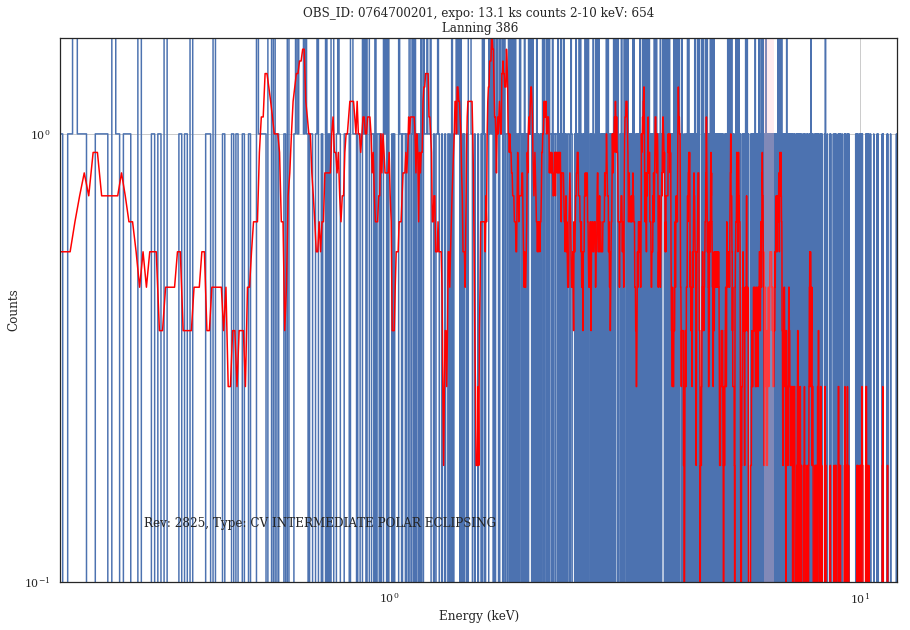

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0764700301_PPS_nxsa.tar. Will reuse it.
Extracted 0764700301/pps/P0764700301PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0764700401_PPS_nxsa.tar. Will reuse it.
Extracted 0764700401/pps/P0764700401PNS003SRSPEC0001.FTZ


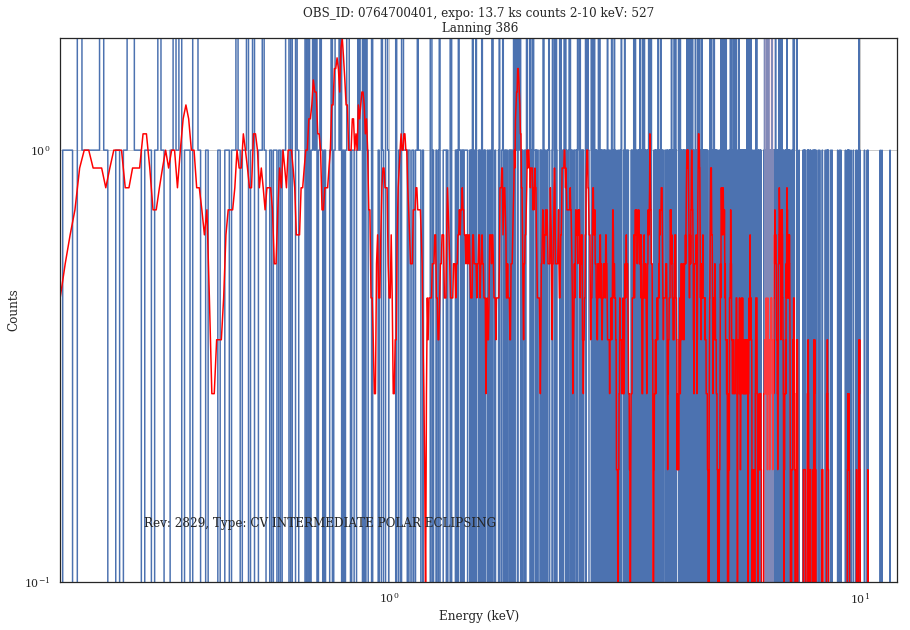

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0510390901_PPS_nxsa.tar. Will reuse it.
Extracted 0510390901/pps/P0510390901PNS005SRSPEC0001.FTZ


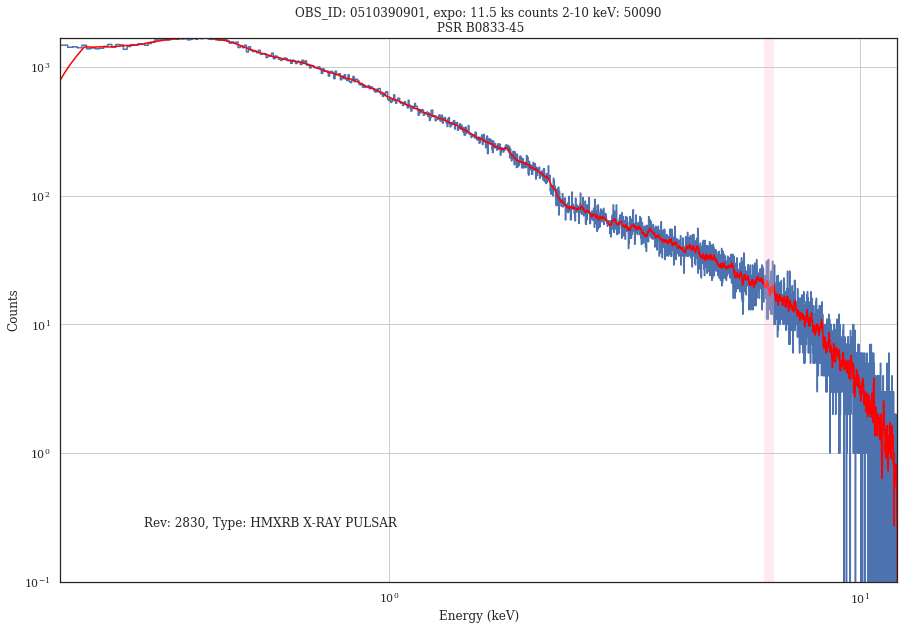

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0763610501_PPS_nxsa.tar. Will reuse it.
Extracted 0763610501/pps/P0763610501PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0760530201_PPS_nxsa.tar. Will reuse it.
Extracted 0760530201/pps/P0760530201PNS001SRSPEC0001.FTZ


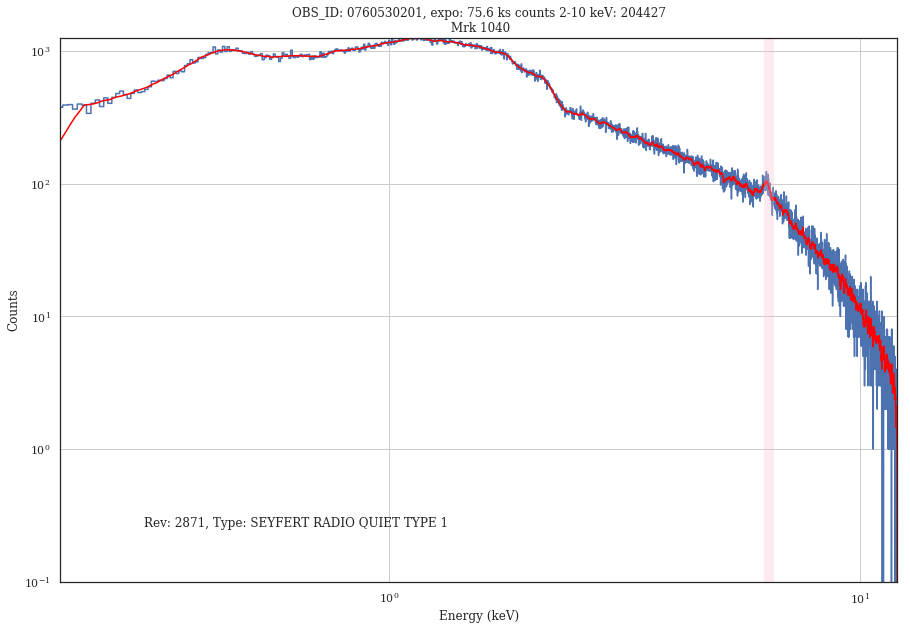

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0760530301_PPS_nxsa.tar. Will reuse it.
Extracted 0760530301/pps/P0760530301PNS001SRSPEC0001.FTZ


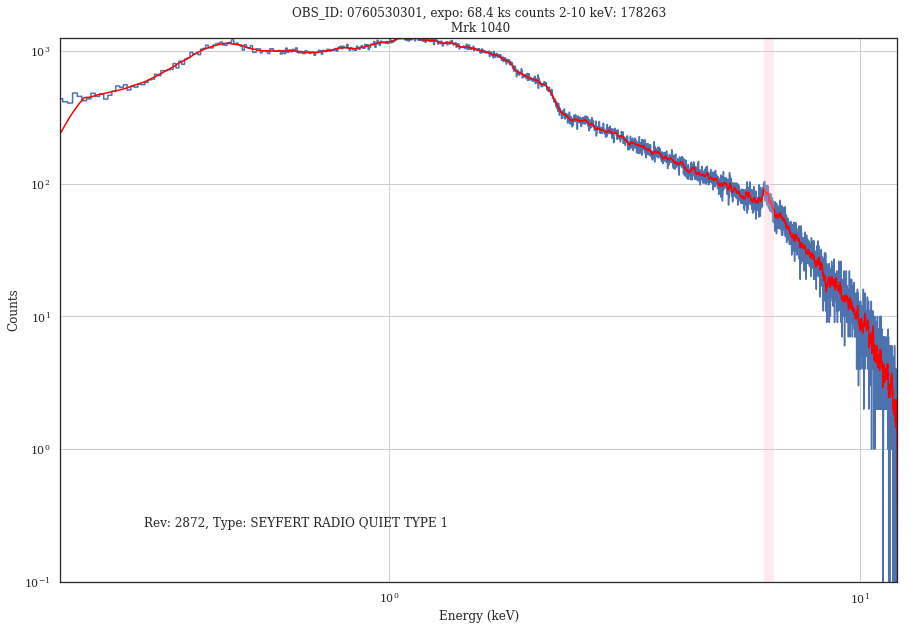

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0763460301_PPS_nxsa.tar. Will reuse it.
Extracted 0763460301/pps/P0763460301PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0764670101_PPS_nxsa.tar. Will reuse it.
Extracted 0764670101/pps/P0764670101PNS003SRSPEC0001.FTZ


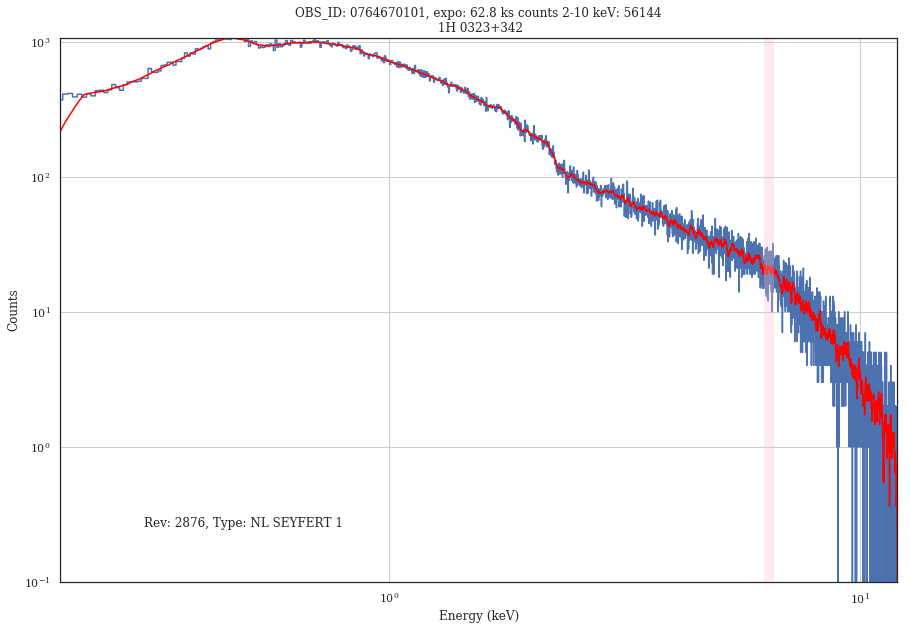

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0763610101_PPS_nxsa.tar. Will reuse it.
Extracted 0763610101/pps/P0763610101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0764420101_PPS_nxsa.tar. Will reuse it.
Extracted 0764420101/pps/P0764420101PNS001SRSPEC0001.FTZ


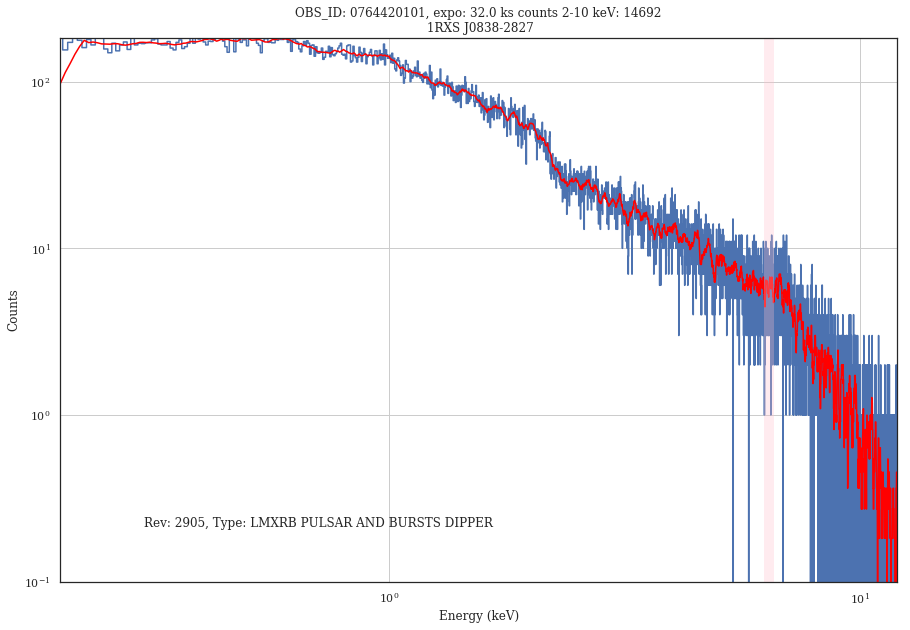

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0790180101_PPS_nxsa.tar. Will reuse it.
Extracted 0790180101/pps/P0790180101PNS001SRSPEC0001.FTZ


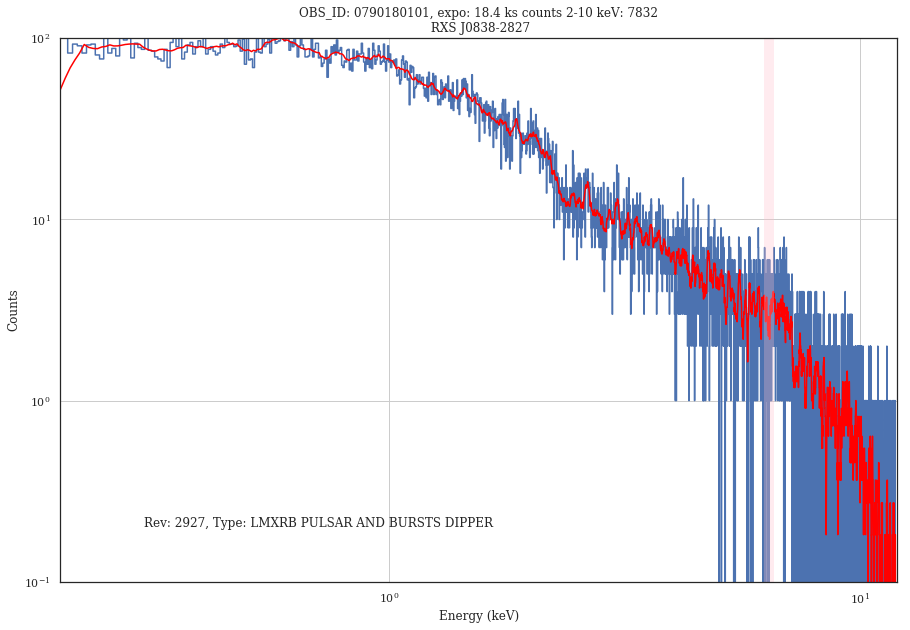

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0763480101_PPS_nxsa.tar. Will reuse it.
Extracted 0763480101/pps/P0763480101PNS003SRSPEC0001.FTZ


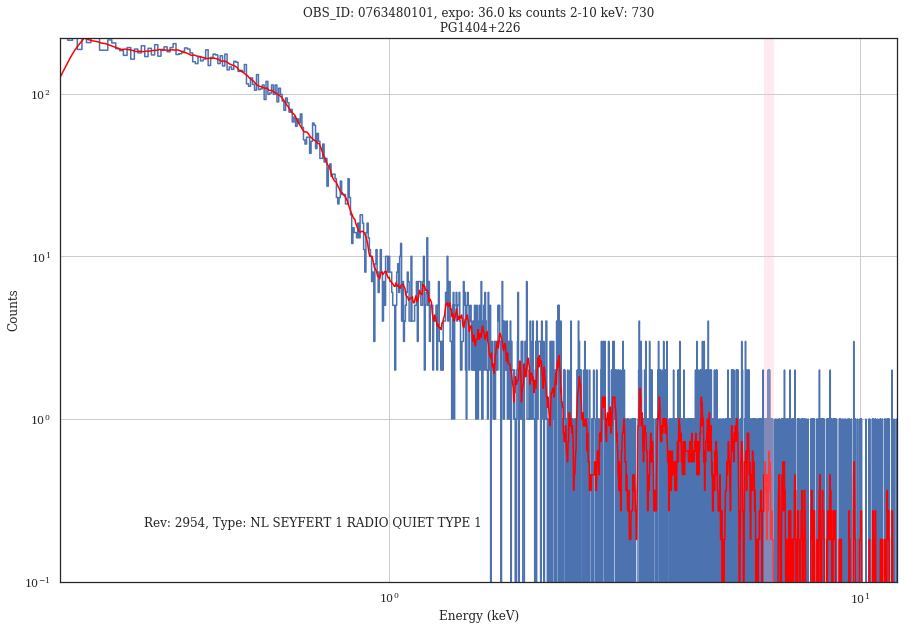

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0764530101_PPS_nxsa.tar. Will reuse it.
Extracted 0764530101/pps/P0764530101PNS003SRSPEC0001.FTZ


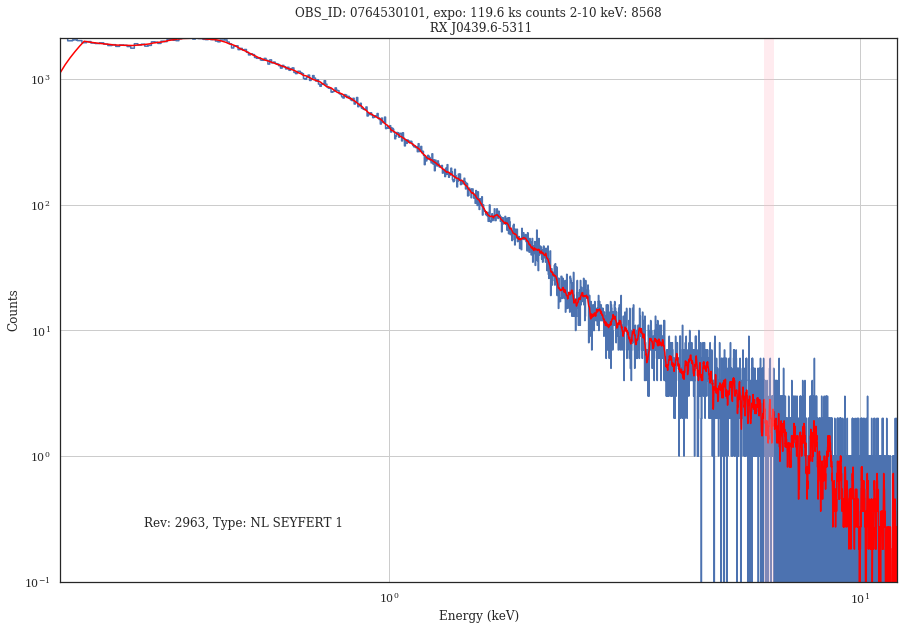

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0790180201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0763180101_PPS_nxsa.tar. Will reuse it.
Extracted 0763180101/pps/P0763180101PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0790180501_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0764620101_PPS_nxsa.tar. Will reuse it.
Extracted 0764620101/pps/P0764620101PNS001SRSPEC0001.FTZ


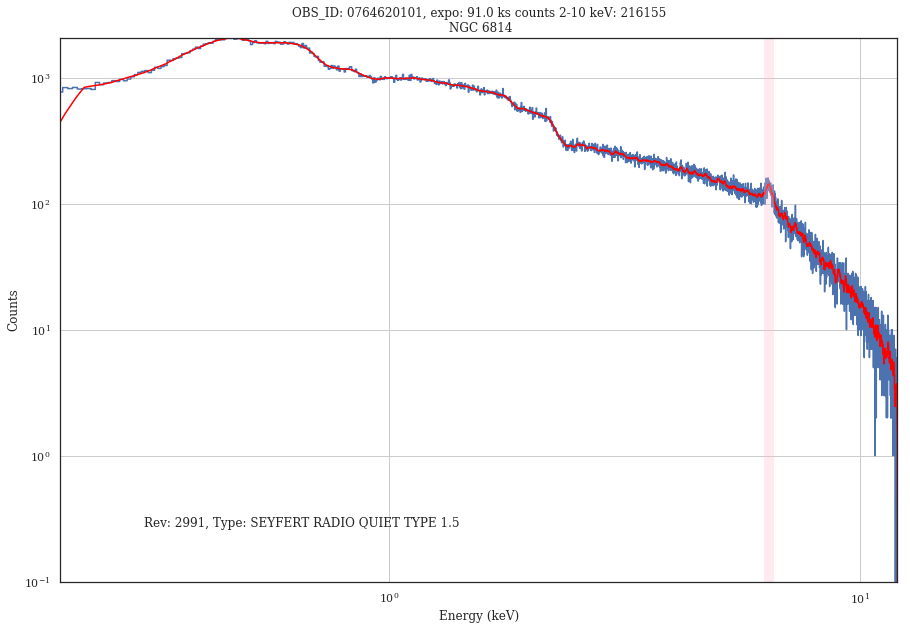

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0510391001_PPS_nxsa.tar. Will reuse it.
Extracted 0510391001/pps/P0510391001PNS005SRSPEC0001.FTZ


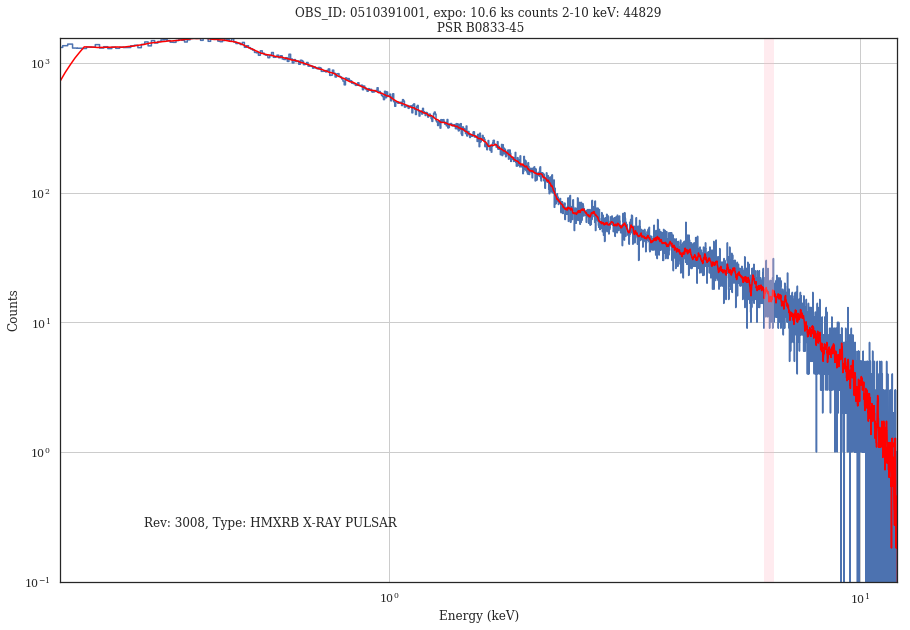

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0780560101_PPS_nxsa.tar. Will reuse it.
Extracted 0780560101/pps/P0780560101PNU002SRSPEC0001.FTZ
Extracted 0780560101/pps/P0780560101PNS002SRSPEC0001.FTZ


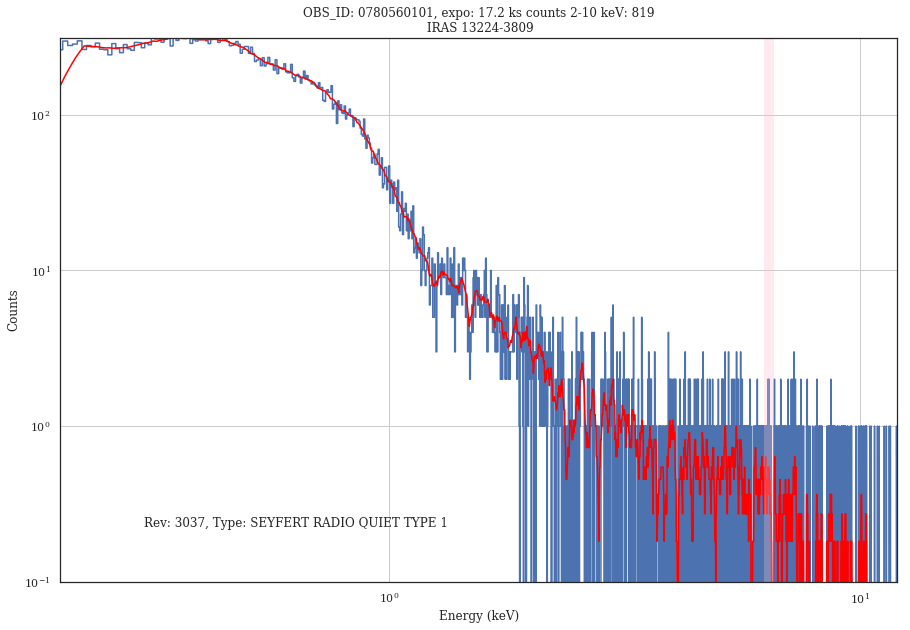

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0780561301_PPS_nxsa.tar. Will reuse it.
Extracted 0780561301/pps/P0780561301PNS002SRSPEC0001.FTZ


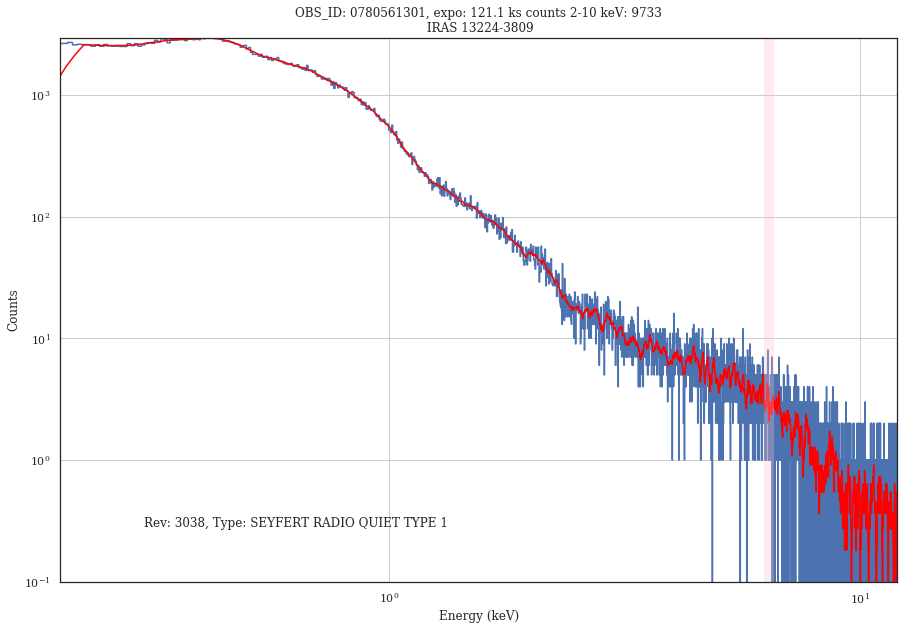

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0780561401_PPS_nxsa.tar. Will reuse it.
Extracted 0780561401/pps/P0780561401PNS002SRSPEC0001.FTZ
Extracted 0780561401/pps/P0780561401PNU002SRSPEC0001.FTZ


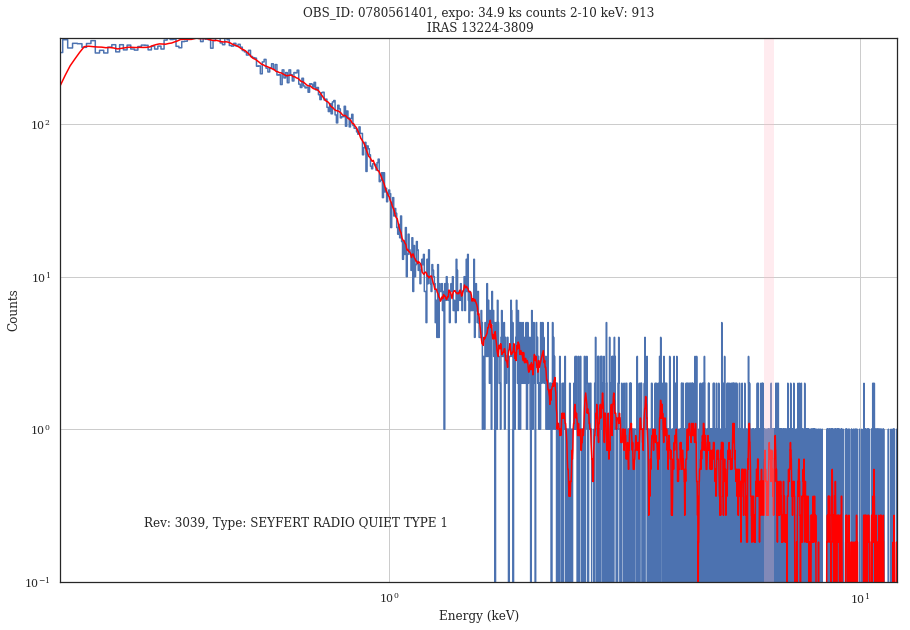

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0780561501_PPS_nxsa.tar. Will reuse it.
Extracted 0780561501/pps/P0780561501PNS002SRSPEC0001.FTZ


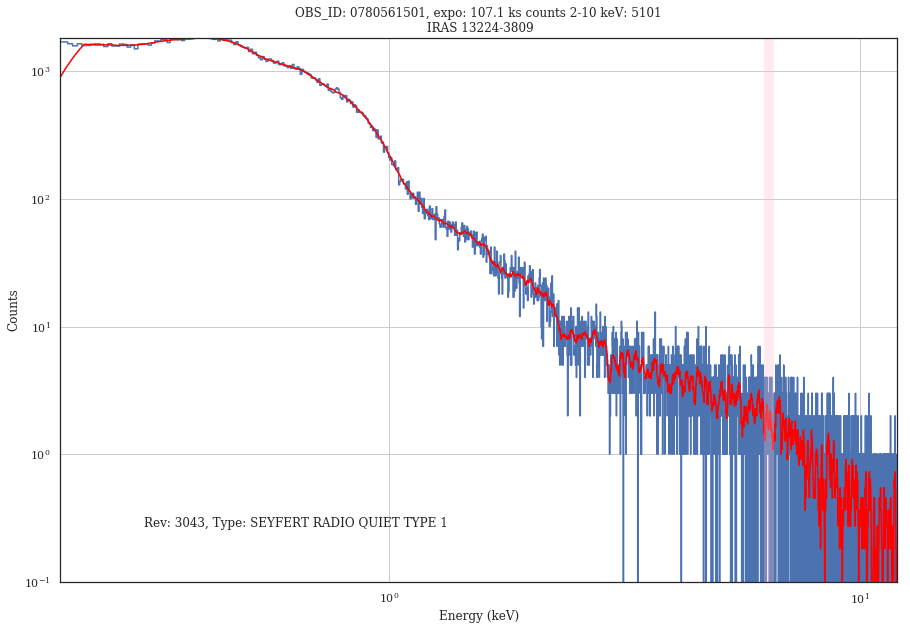

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0780561601_PPS_nxsa.tar. Will reuse it.
Extracted 0780561601/pps/P0780561601PNS002SRSPEC0001.FTZ


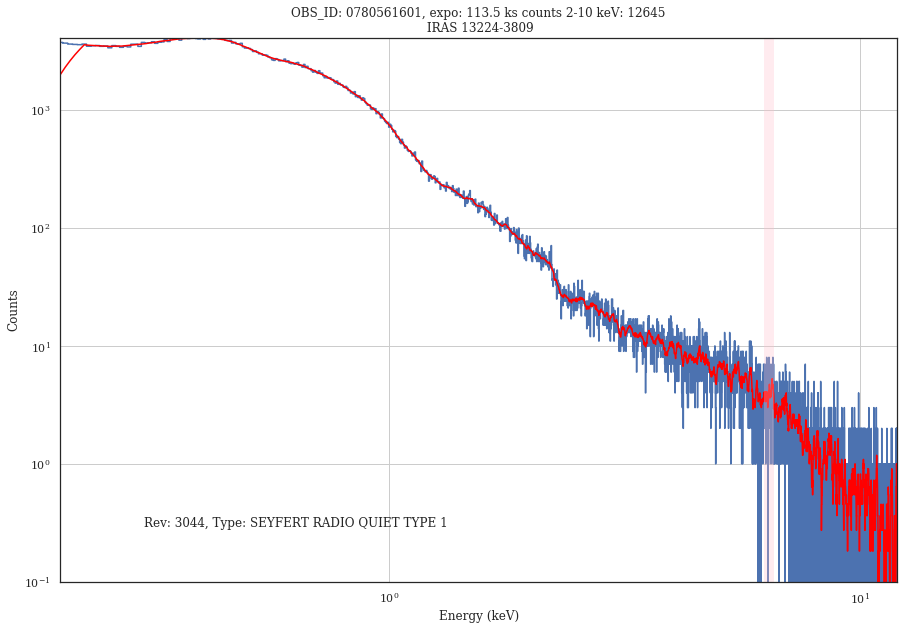

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0780561701_PPS_nxsa.tar. Will reuse it.
Extracted 0780561701/pps/P0780561701PNS002SRSPEC0001.FTZ


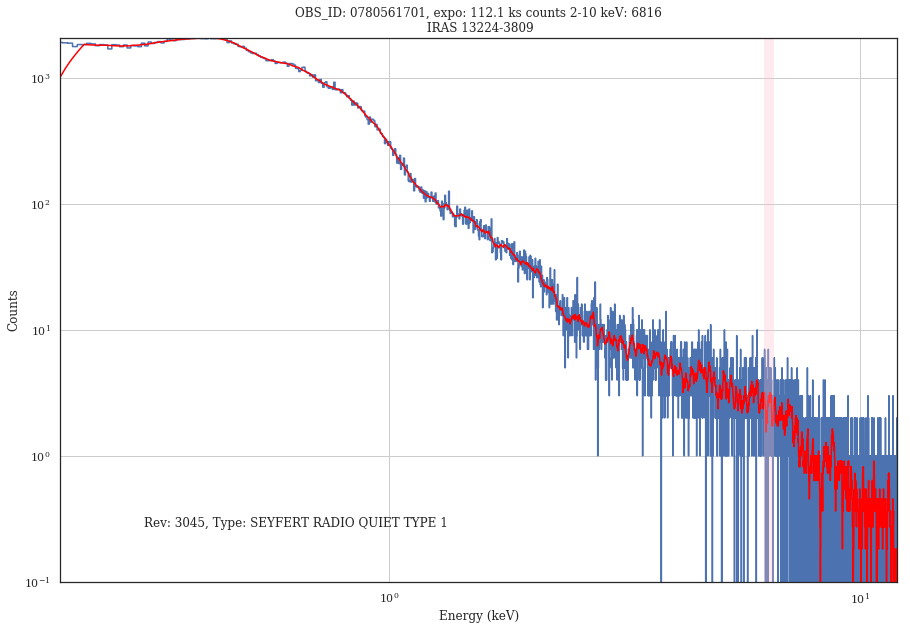

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0792180101_PPS_nxsa.tar. Will reuse it.
Extracted 0792180101/pps/P0792180101PNS002SRSPEC0001.FTZ


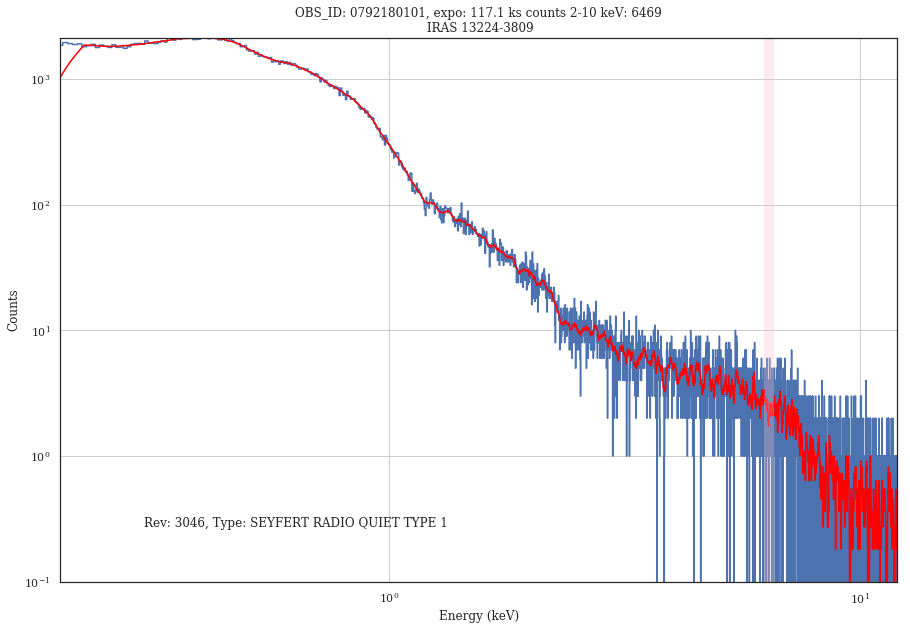

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0792180201_PPS_nxsa.tar. Will reuse it.
Extracted 0792180201/pps/P0792180201PNS002SRSPEC0001.FTZ


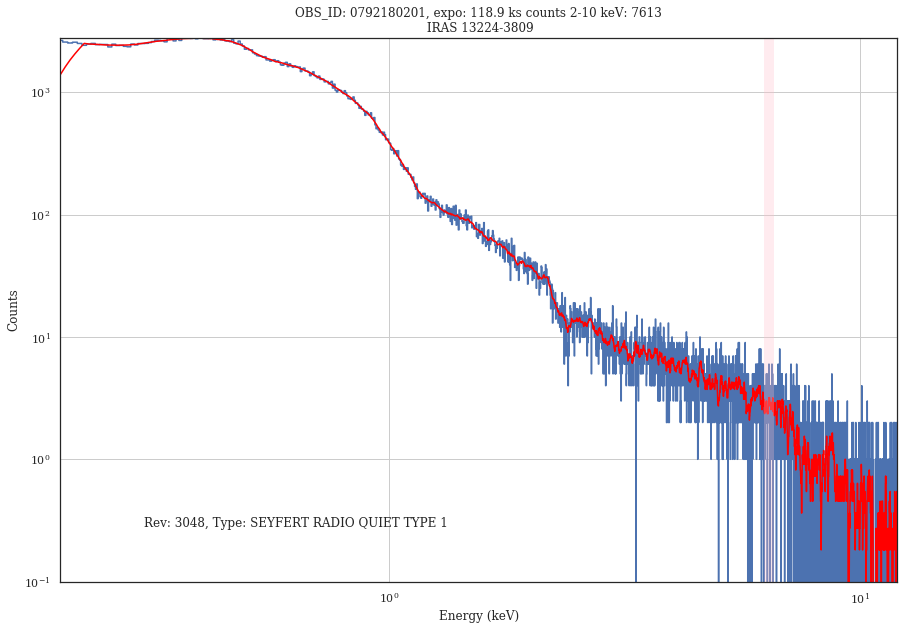

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0792180301_PPS_nxsa.tar. Will reuse it.
Extracted 0792180301/pps/P0792180301PNU014SRSPEC0001.FTZ
Extracted 0792180301/pps/P0792180301PNS002SRSPEC0001.FTZ


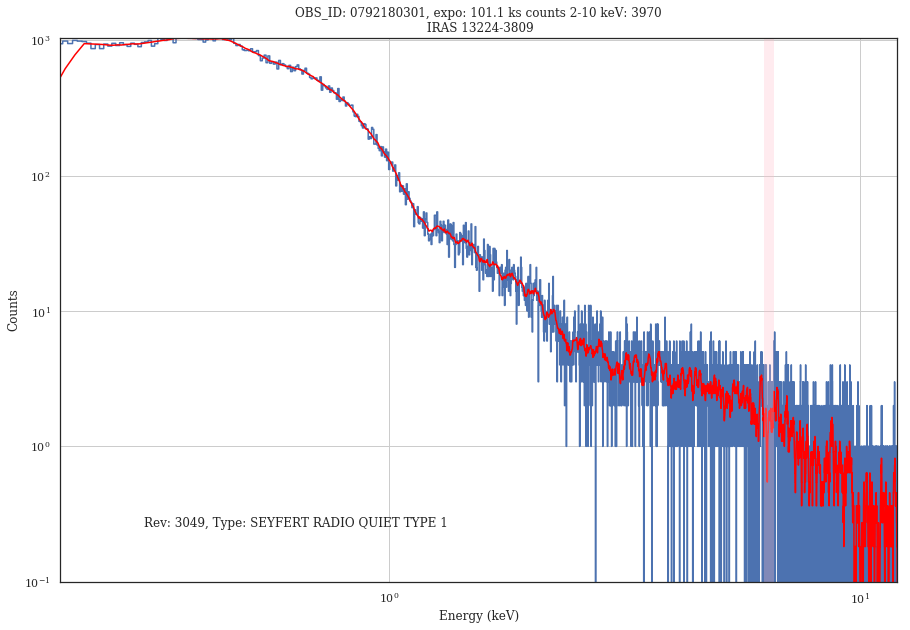

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0792180401_PPS_nxsa.tar. Will reuse it.
Extracted 0792180401/pps/P0792180401PNS002SRSPEC0001.FTZ


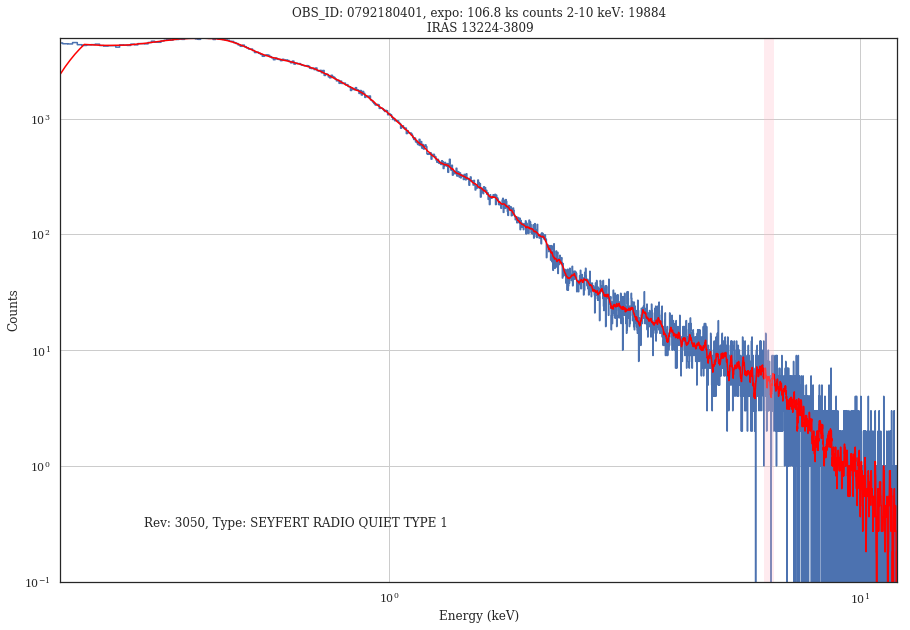

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0792380101_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0792382201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0792180501_PPS_nxsa.tar. Will reuse it.
Extracted 0792180501/pps/P0792180501PNS002SRSPEC0001.FTZ


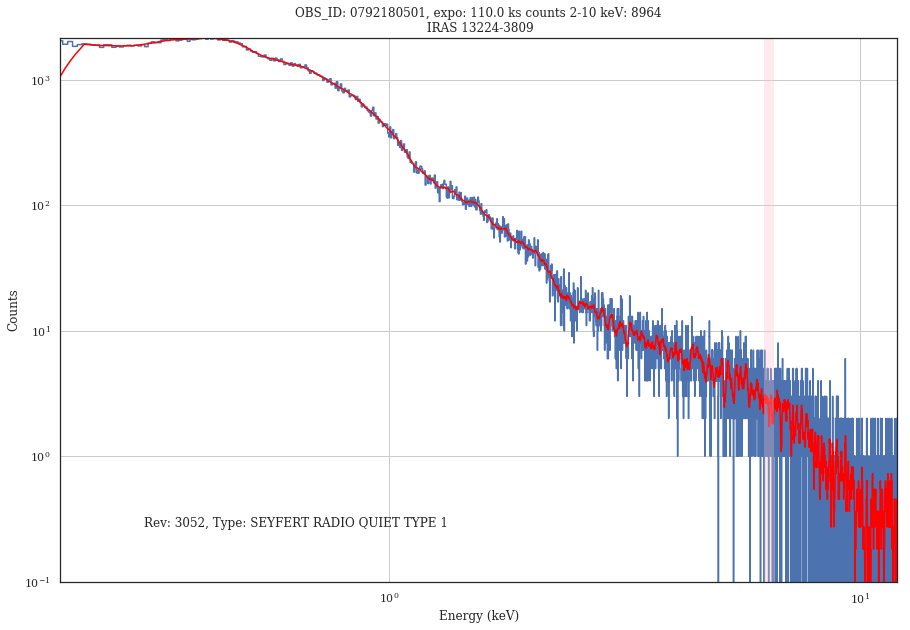

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0792180601_PPS_nxsa.tar. Will reuse it.
Extracted 0792180601/pps/P0792180601PNS002SRSPEC0001.FTZ


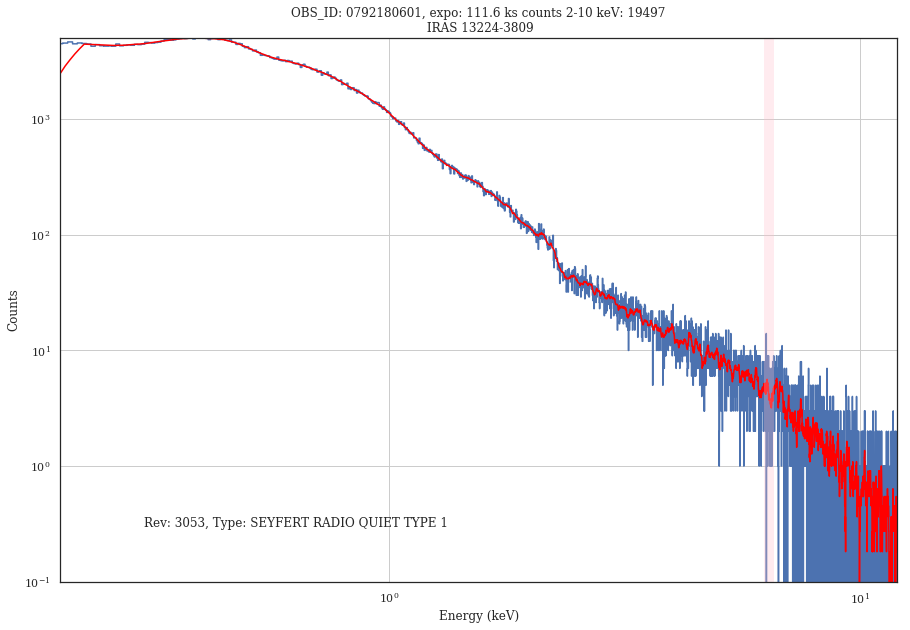

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0781710401_PPS_nxsa.tar. Will reuse it.
Extracted 0781710401/pps/P0781710401PNS003SRSPEC0001.FTZ


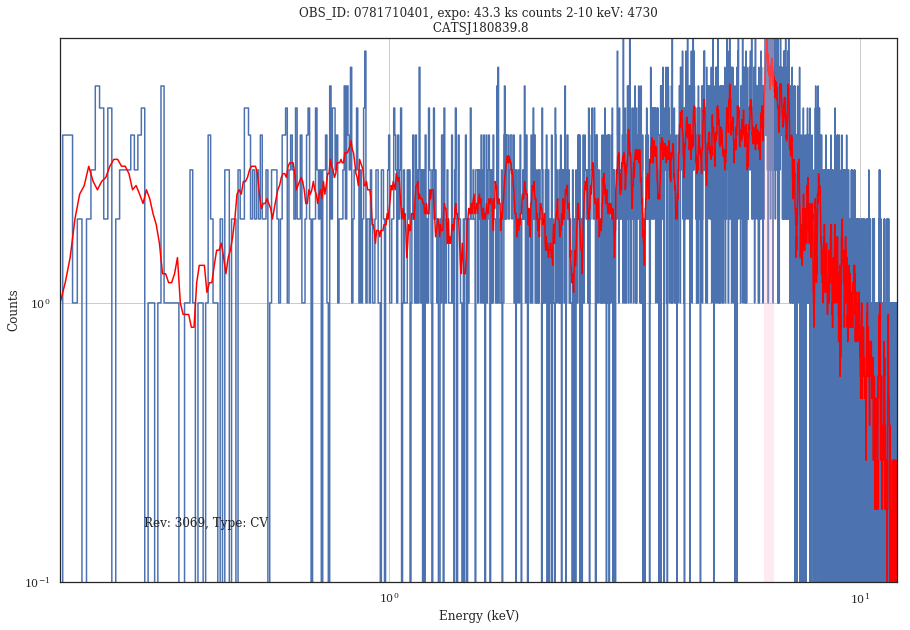

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0783940101_PPS_nxsa.tar. Will reuse it.
Extracted 0783940101/pps/P0783940101PNS006SRSPEC0001.FTZ


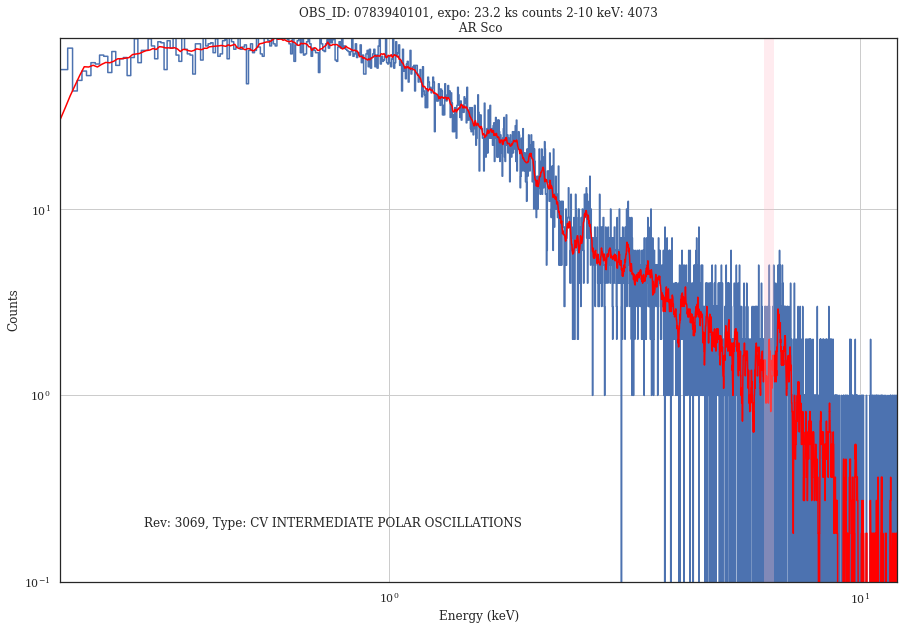

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0780510101_PPS_nxsa.tar. Will reuse it.
Extracted 0780510101/pps/P0780510101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0783272701_PPS_nxsa.tar. Will reuse it.
Extracted 0783272701/pps/P0783272701PNS003SRSPEC0001.FTZ


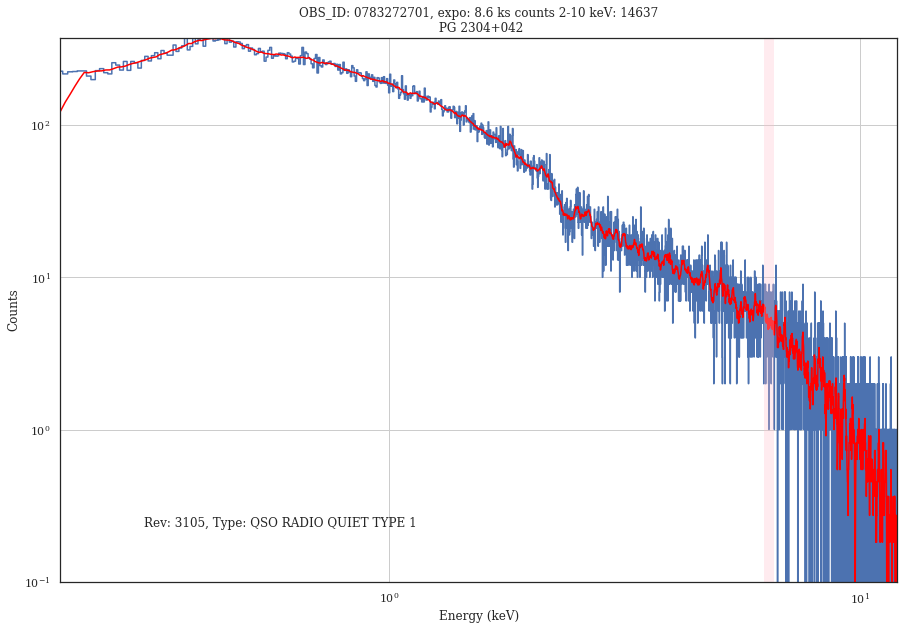

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0783272801_PPS_nxsa.tar. Will reuse it.
Extracted 0783272801/pps/P0783272801PNU002SRSPEC0001.FTZ


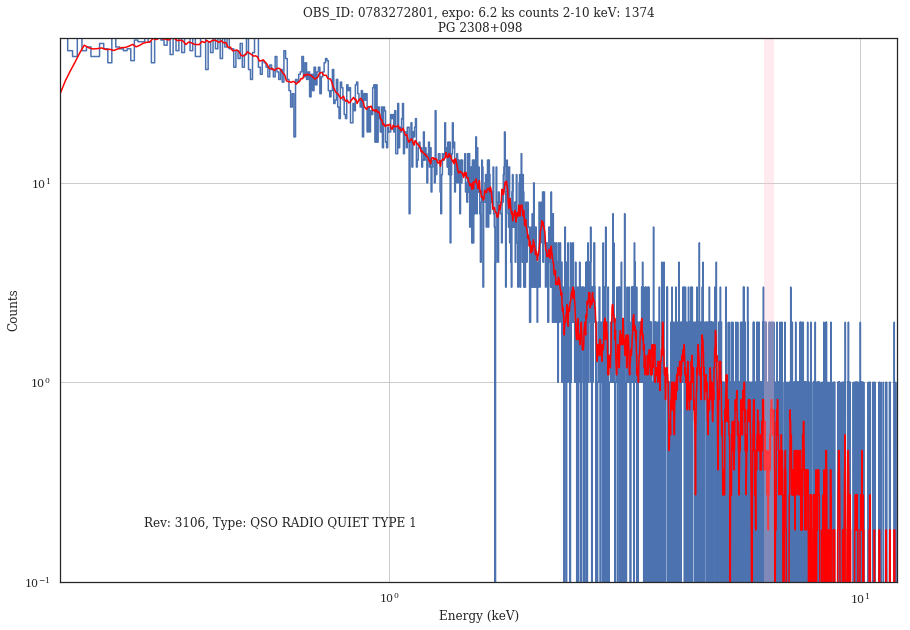

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0783270101_PPS_nxsa.tar. Will reuse it.
Extracted 0783270101/pps/P0783270101PNS003SRSPEC0001.FTZ
Extracted 0783270101/pps/P0783270101PNU002SRSPEC0001.FTZ


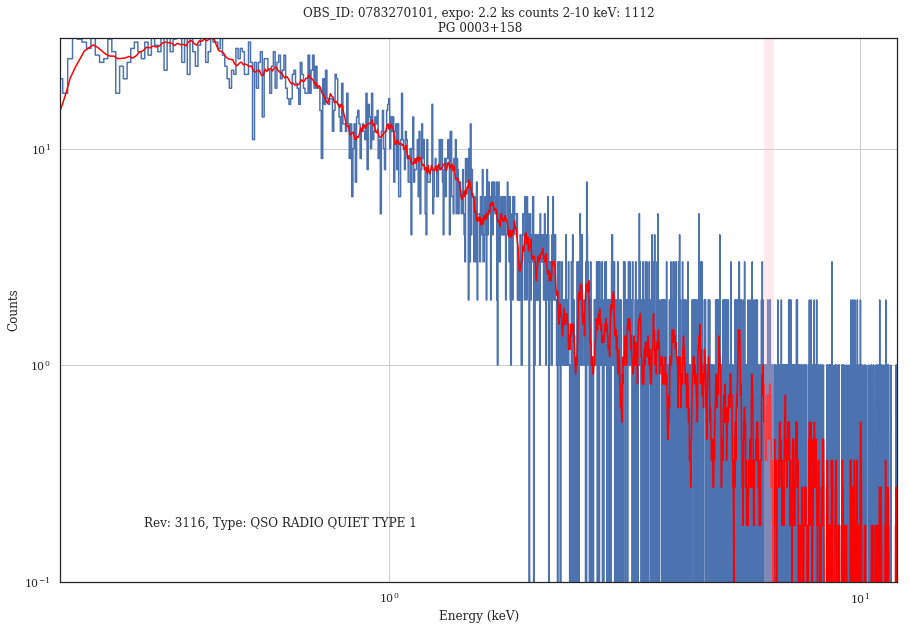

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0790850201_PPS_nxsa.tar. Will reuse it.
Extracted 0790850201/pps/P0790850201PNS003SRSPEC0001.FTZ


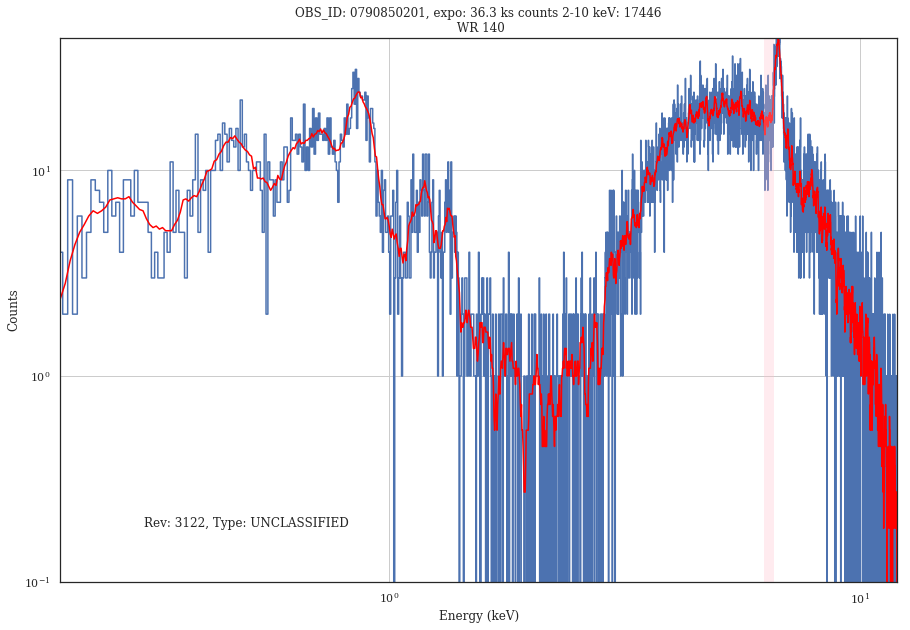

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0783230101_PPS_nxsa.tar. Will reuse it.
Extracted 0783230101/pps/P0783230101PNS003SRSPEC0001.FTZ


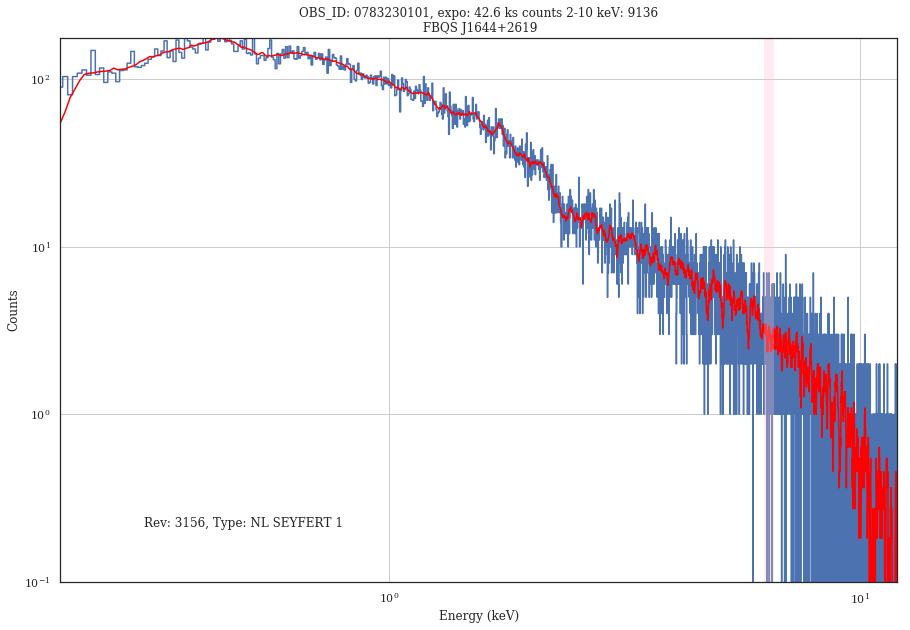

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0784530201_PPS_nxsa.tar. Will reuse it.
Extracted 0784530201/pps/P0784530201PNS010SRSPEC0001.FTZ


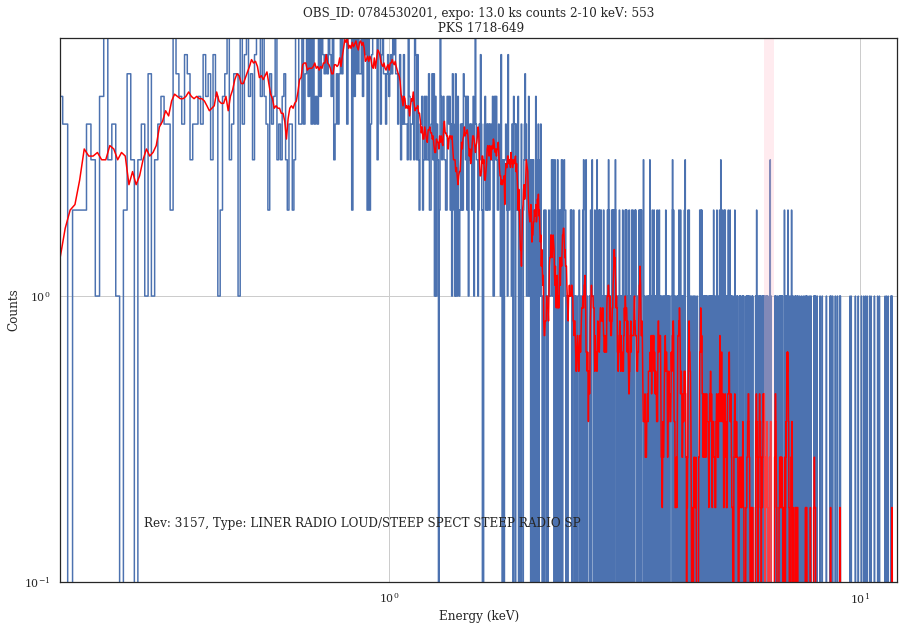

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0780690201_PPS_nxsa.tar. Will reuse it.
Extracted 0780690201/pps/P0780690201PNS003SRSPEC0001.FTZ


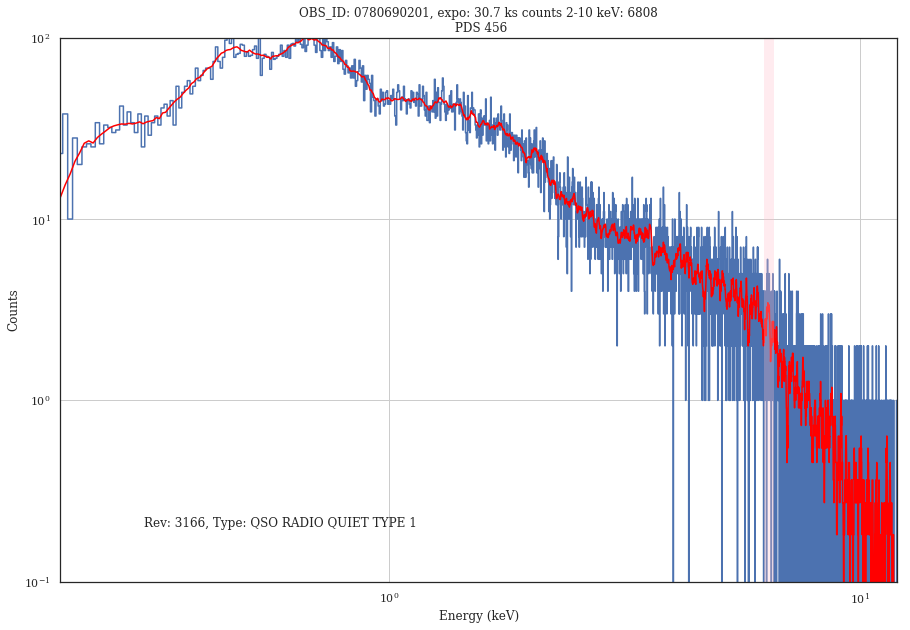

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0780690301_PPS_nxsa.tar. Will reuse it.
Extracted 0780690301/pps/P0780690301PNS003SRSPEC0001.FTZ


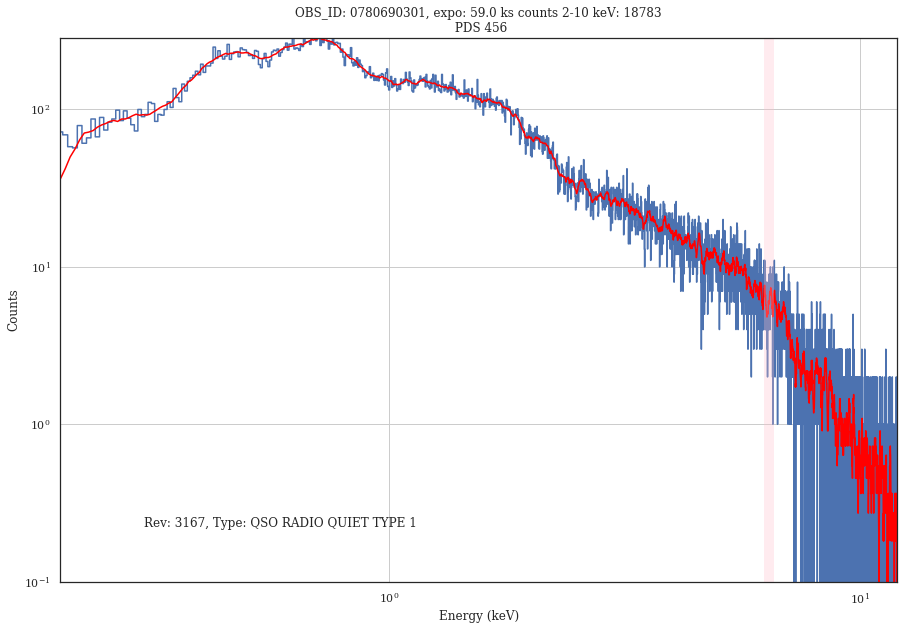

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804690101_PPS_nxsa.tar. Will reuse it.
Extracted 0804690101/pps/P0804690101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0802200201_PPS_nxsa.tar. Will reuse it.
Extracted 0802200201/pps/P0802200201PNS003SRSPEC0001.FTZ


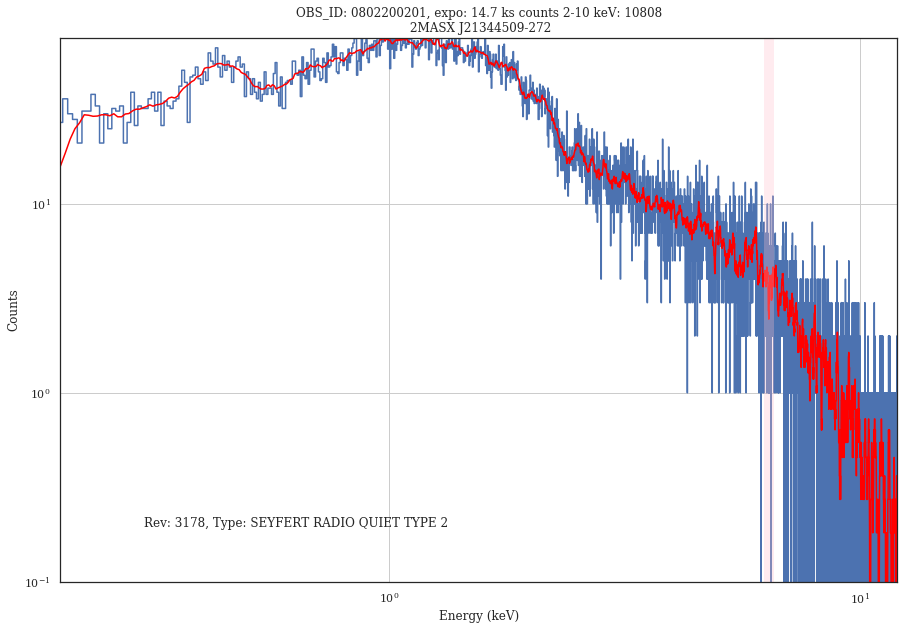

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0784400701_PPS_nxsa.tar. Will reuse it.
Extracted 0784400701/pps/P0784400701PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0784400801_PPS_nxsa.tar. Will reuse it.
Extracted 0784400801/pps/P0784400801PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0784400901_PPS_nxsa.tar. Will reuse it.
Extracted 0784400901/pps/P0784400901PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0784401001_PPS_nxsa.tar. Will reuse it.
Extracted 0784401001/pps/P0784401001PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0784401101_PPS_nxsa.tar. Will reuse it.
Extracted 0784401101/pps/P0784401101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0784401201_PPS_nxsa.tar. Will reuse it.
Extracted 0784401201/pps/P07844

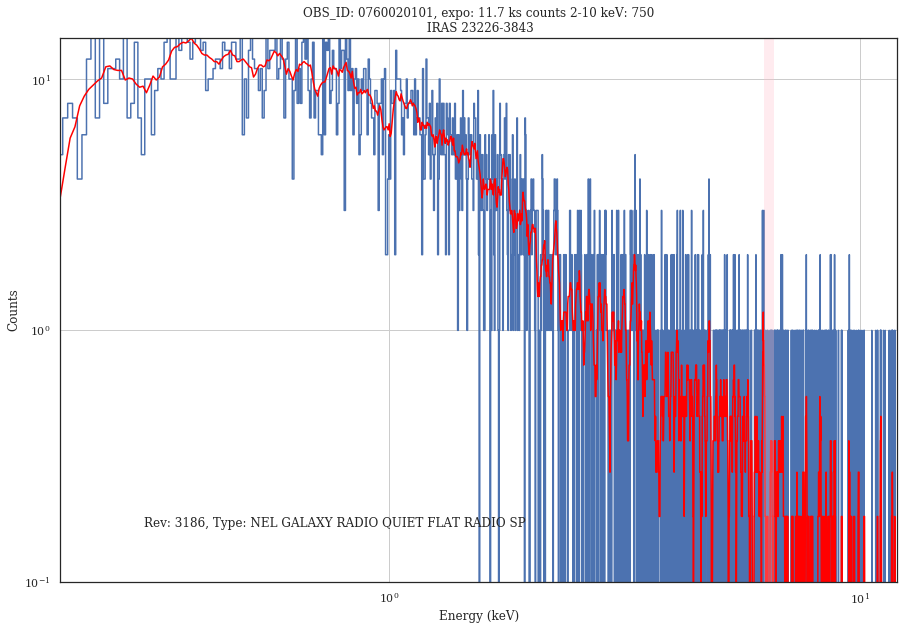

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804560101_PPS_nxsa.tar. Will reuse it.
Extracted 0804560101/pps/P0804560101PNS003SRSPEC0001.FTZ


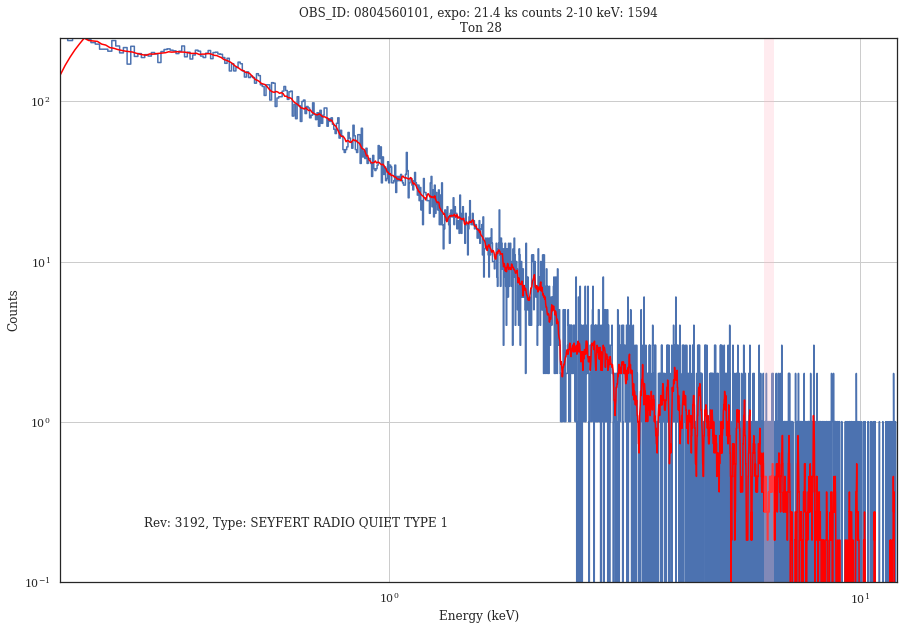

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804560201_PPS_nxsa.tar. Will reuse it.
Extracted 0804560201/pps/P0804560201PNU002SRSPEC0001.FTZ


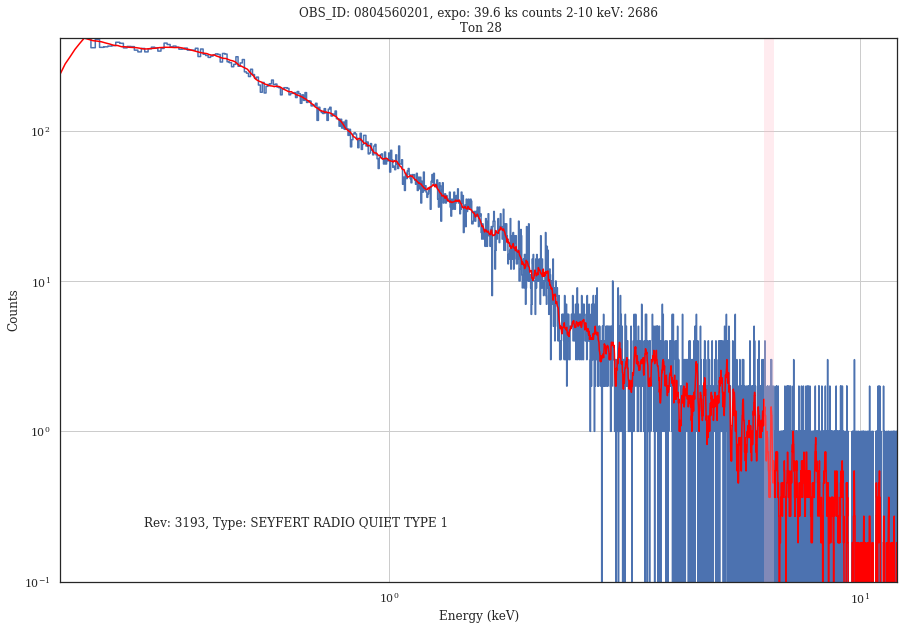

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0510391201_PPS_nxsa.tar. Will reuse it.
Extracted 0510391201/pps/P0510391201PNS005SRSPEC0001.FTZ


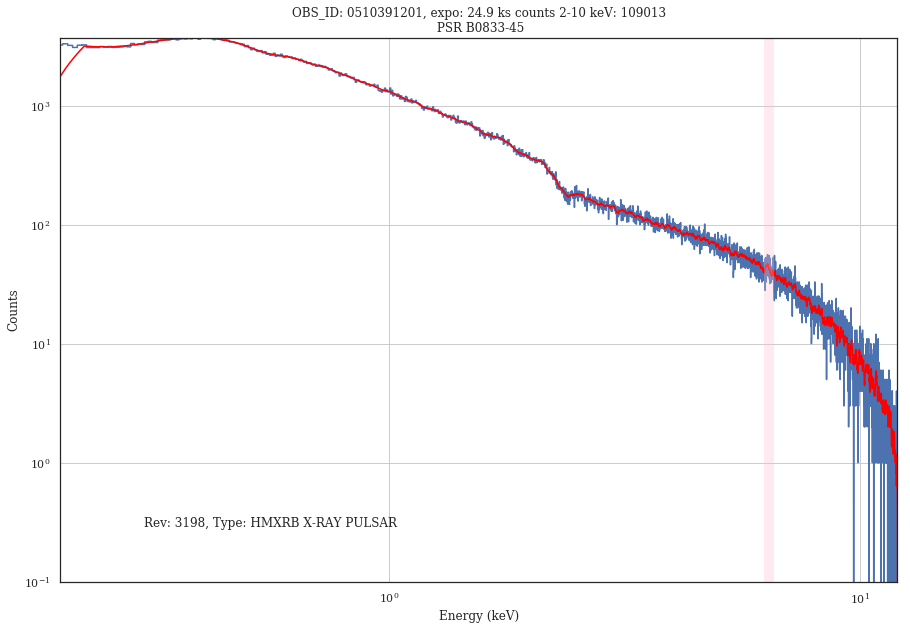

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0802560101_PPS_nxsa.tar. Will reuse it.
Extracted 0802560101/pps/P0802560101PNS003SRSPEC0001.FTZ


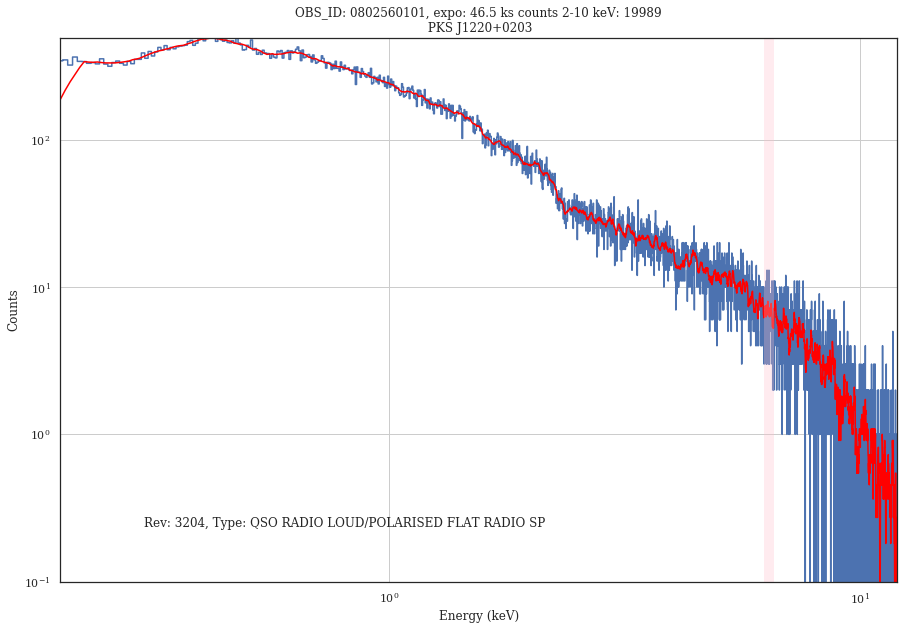

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0760020401_PPS_nxsa.tar. Will reuse it.
Extracted 0760020401/pps/P0760020401PNS003SRSPEC0001.FTZ


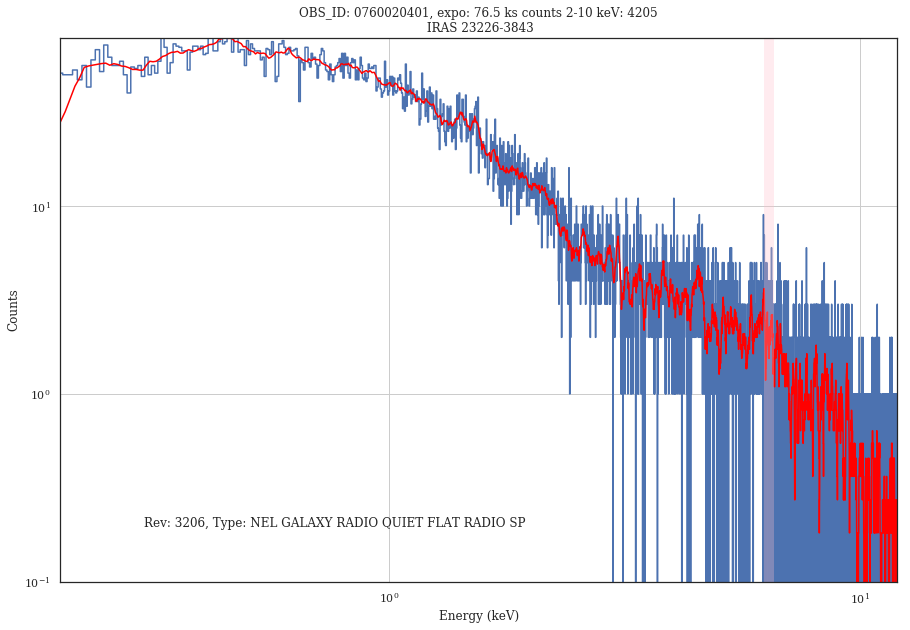

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0802200301_PPS_nxsa.tar. Will reuse it.
Extracted 0802200301/pps/P0802200301PNS003SRSPEC0001.FTZ


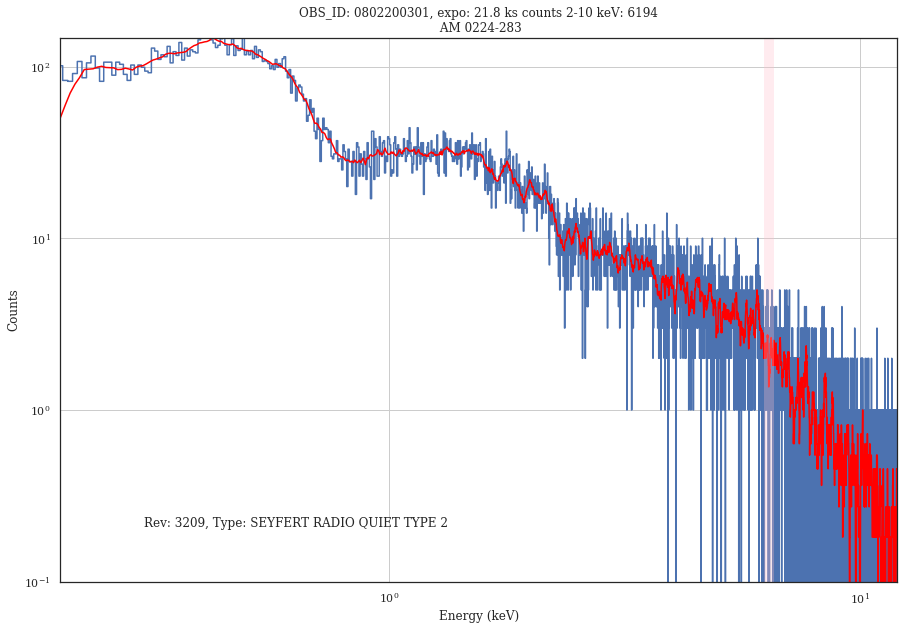

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0802200101_PPS_nxsa.tar. Will reuse it.
Extracted 0802200101/pps/P0802200101PNS003SRSPEC0001.FTZ


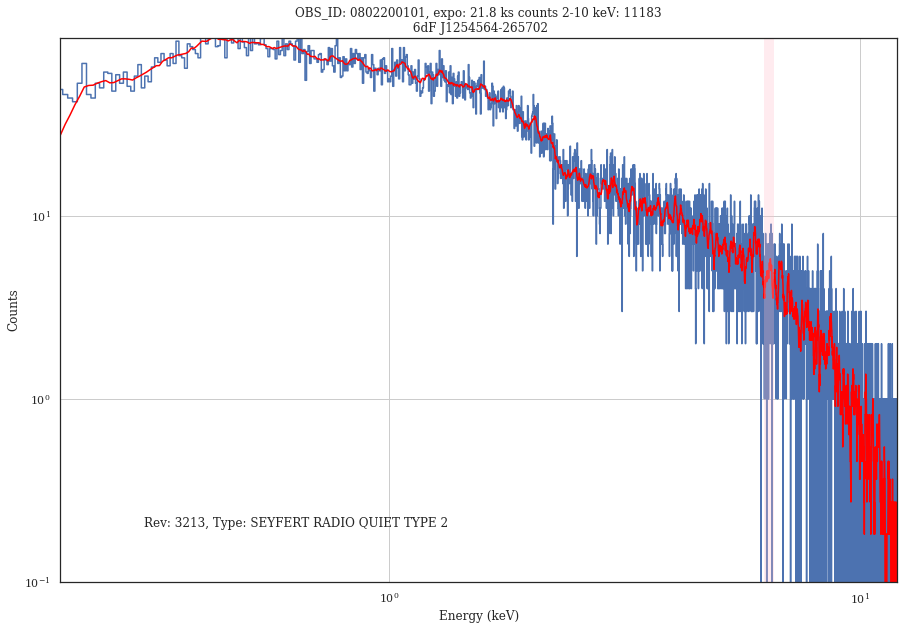

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0802200401_PPS_nxsa.tar. Will reuse it.
Extracted 0802200401/pps/P0802200401PNS003SRSPEC0001.FTZ


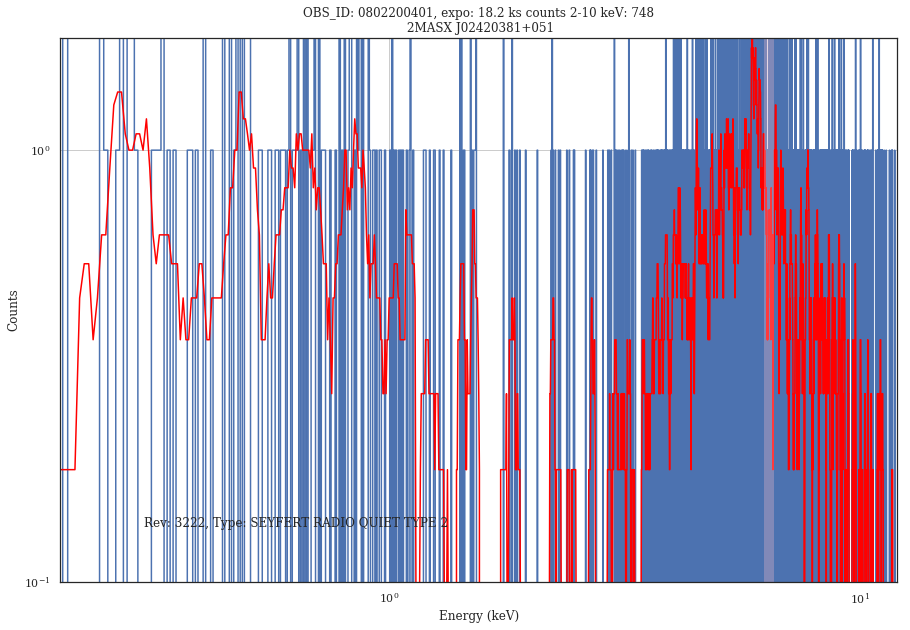

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0801880201_PPS_nxsa.tar. Will reuse it.
Extracted 0801880201/pps/P0801880201PNS003SRSPEC0001.FTZ


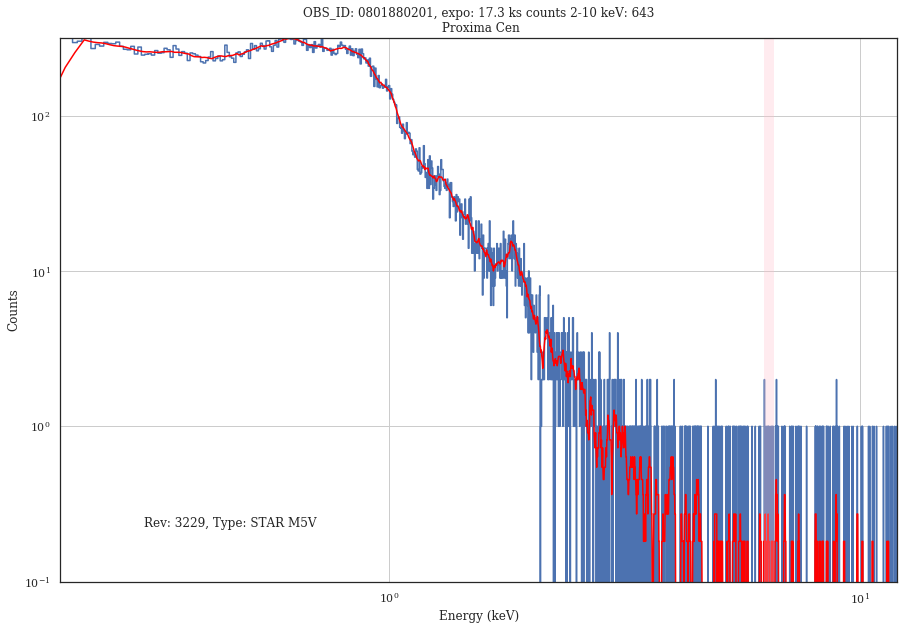

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0803510201_PPS_nxsa.tar. Will reuse it.
Extracted 0803510201/pps/P0803510201PNS003SRSPEC0001.FTZ


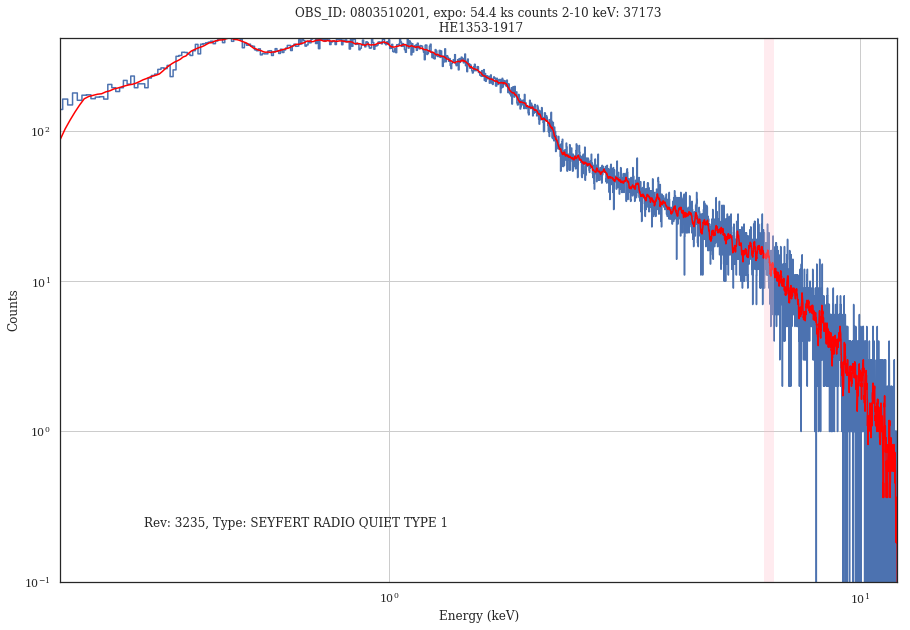

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0801880301_PPS_nxsa.tar. Will reuse it.
Extracted 0801880301/pps/P0801880301PNS003SRSPEC0001.FTZ


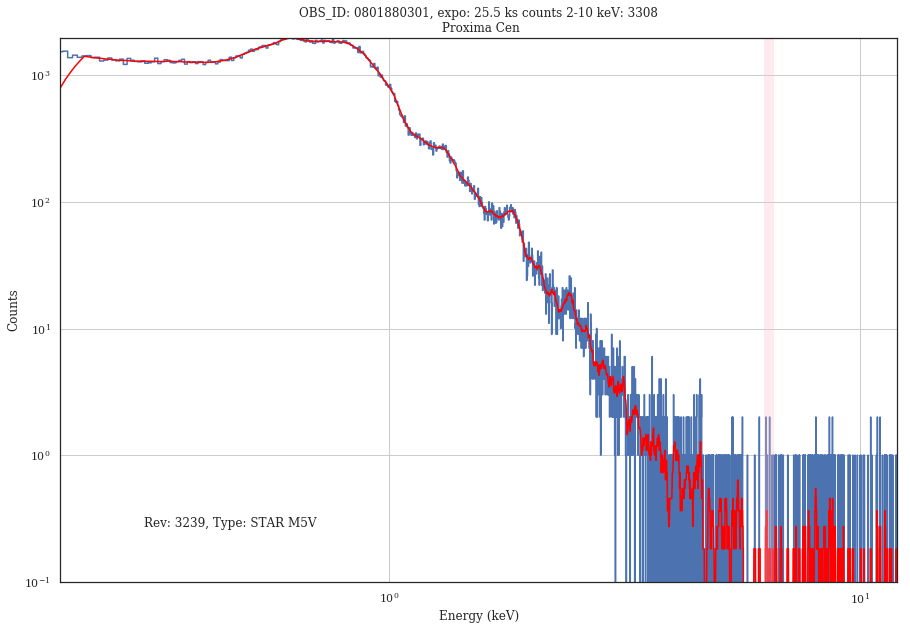

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0795711501_PPS_nxsa.tar. Will reuse it.
Extracted 0795711501/pps/P0795711501PNS001SRSPEC0001.FTZ


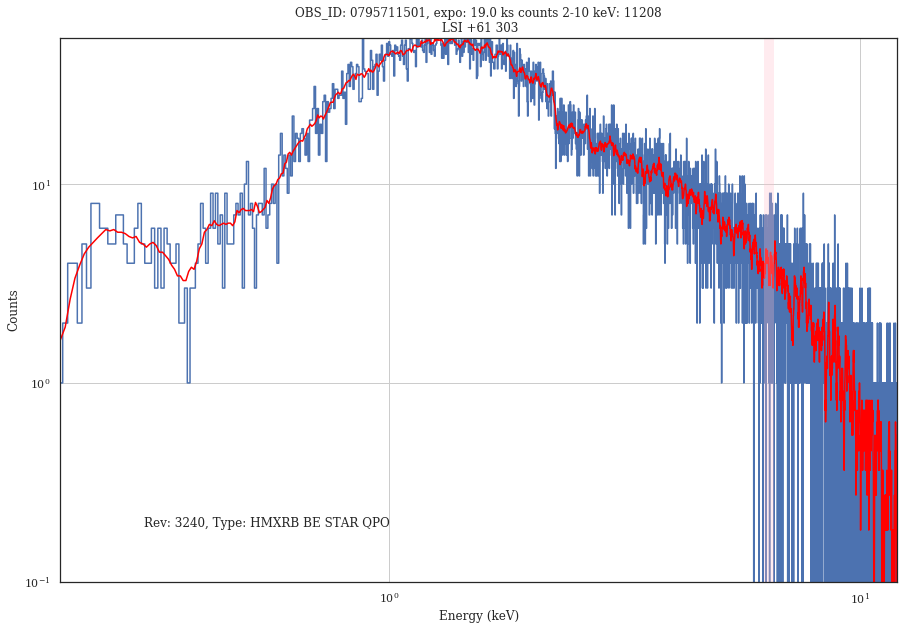

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0795600101_PPS_nxsa.tar. Will reuse it.
Extracted 0795600101/pps/P0795600101PNS003SRSPEC0001.FTZ


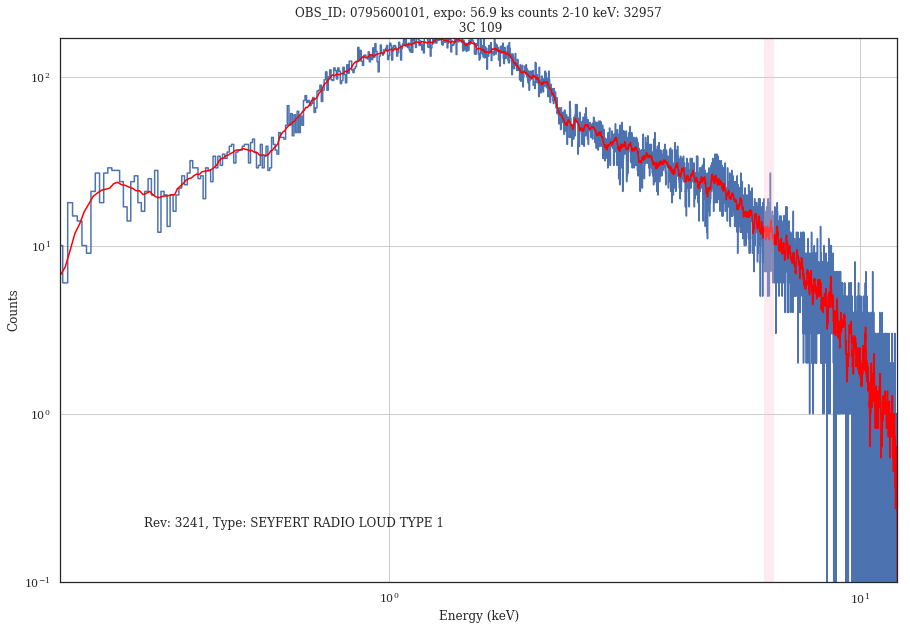

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804590201_PPS_nxsa.tar. Will reuse it.
Extracted 0804590201/pps/P0804590201PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0801880401_PPS_nxsa.tar. Will reuse it.
Extracted 0801880401/pps/P0801880401PNS003SRSPEC0001.FTZ


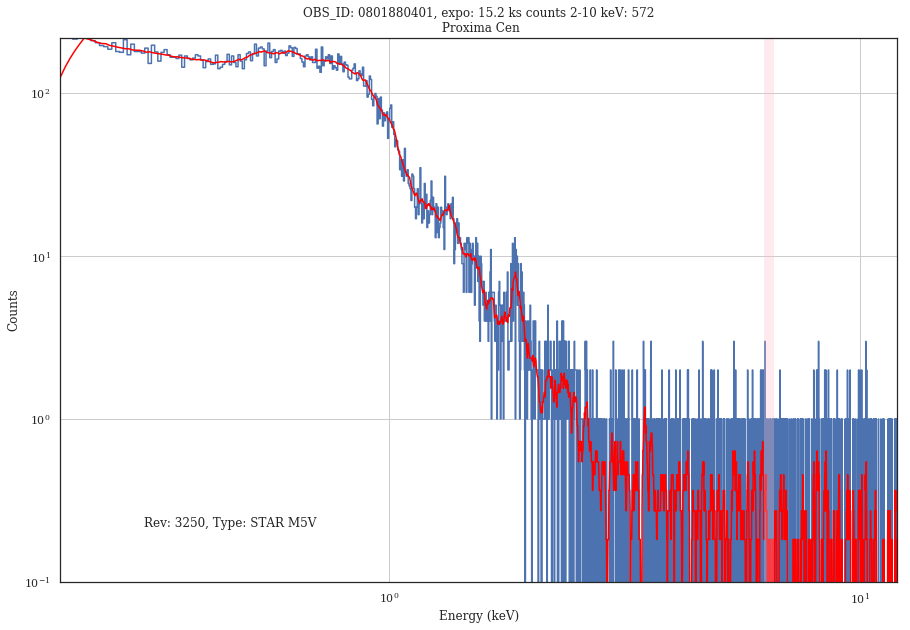

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804590301_PPS_nxsa.tar. Will reuse it.
Extracted 0804590301/pps/P0804590301PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804590401_PPS_nxsa.tar. Will reuse it.
Extracted 0804590401/pps/P0804590401PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804590501_PPS_nxsa.tar. Will reuse it.
Extracted 0804590501/pps/P0804590501PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804590601_PPS_nxsa.tar. Will reuse it.
Extracted 0804590601/pps/P0804590601PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804930101_PPS_nxsa.tar. Will reuse it.
Extracted 0804930101/pps/P0804930101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0760020501_PPS_nxsa.tar. Will reuse it.
Extracted 0760020501/pps/P07600

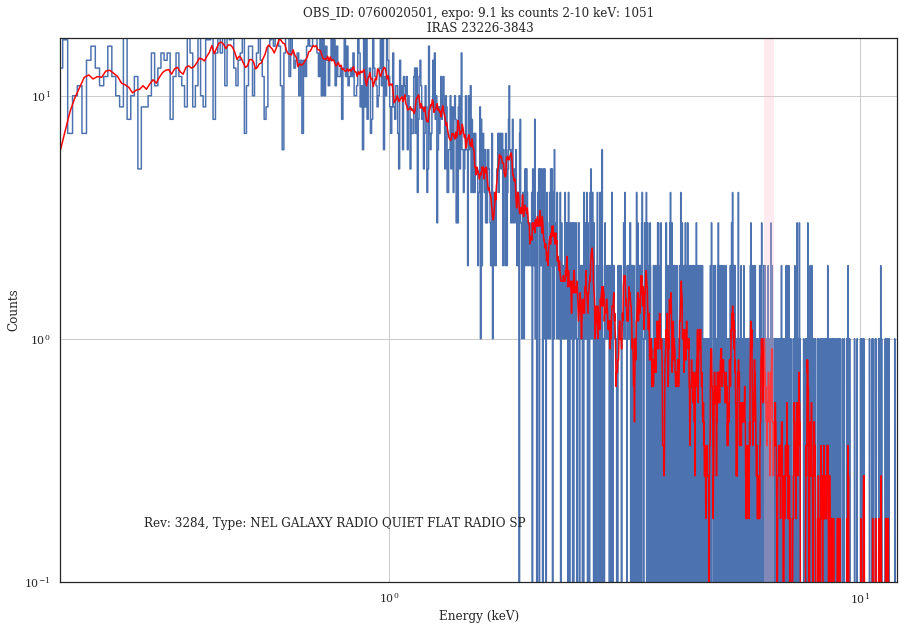

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810230201_PPS_nxsa.tar. Will reuse it.
Extracted 0810230201/pps/P0810230201PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804580101_PPS_nxsa.tar. Will reuse it.
Extracted 0804580101/pps/P0804580101PNS001SRSPEC0001.FTZ


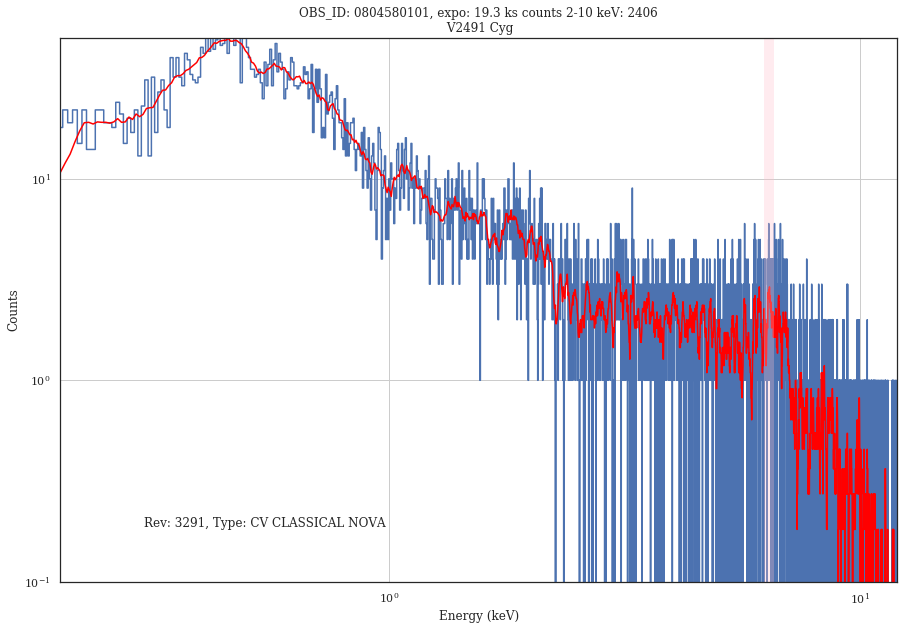

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0801893301_PPS_nxsa.tar. Will reuse it.
Extracted 0801893301/pps/P0801893301PNS003SRSPEC0001.FTZ


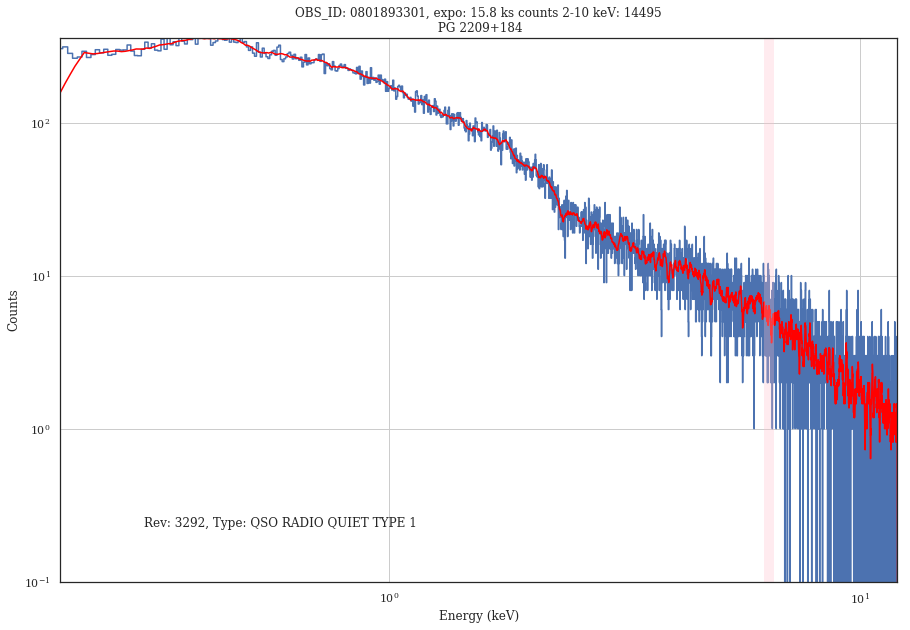

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810230401_PPS_nxsa.tar. Will reuse it.
Extracted 0810230401/pps/P0810230401PNS001SRSPEC0001.FTZ


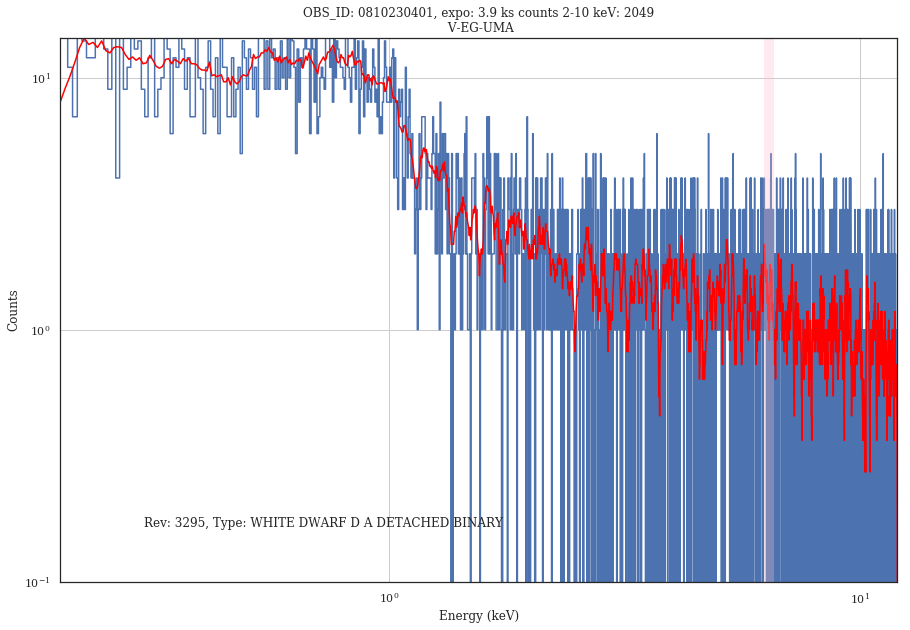

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810231201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810230301_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0801892901_PPS_nxsa.tar. Will reuse it.
Extracted 0801892901/pps/P0801892901PNS003SRSPEC0001.FTZ


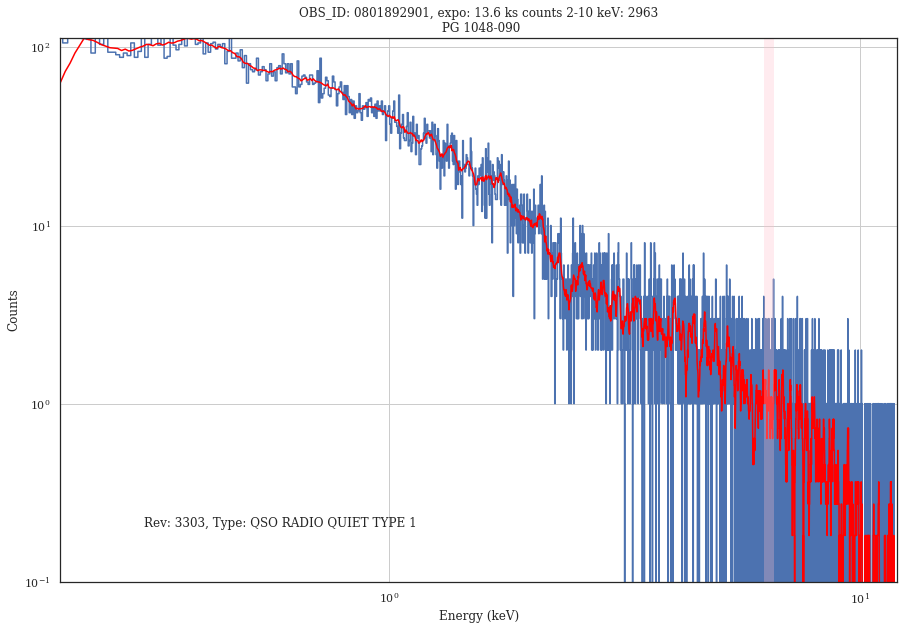

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804680101_PPS_nxsa.tar. Will reuse it.
Extracted 0804680101/pps/P0804680101PNS003SRSPEC0001.FTZ


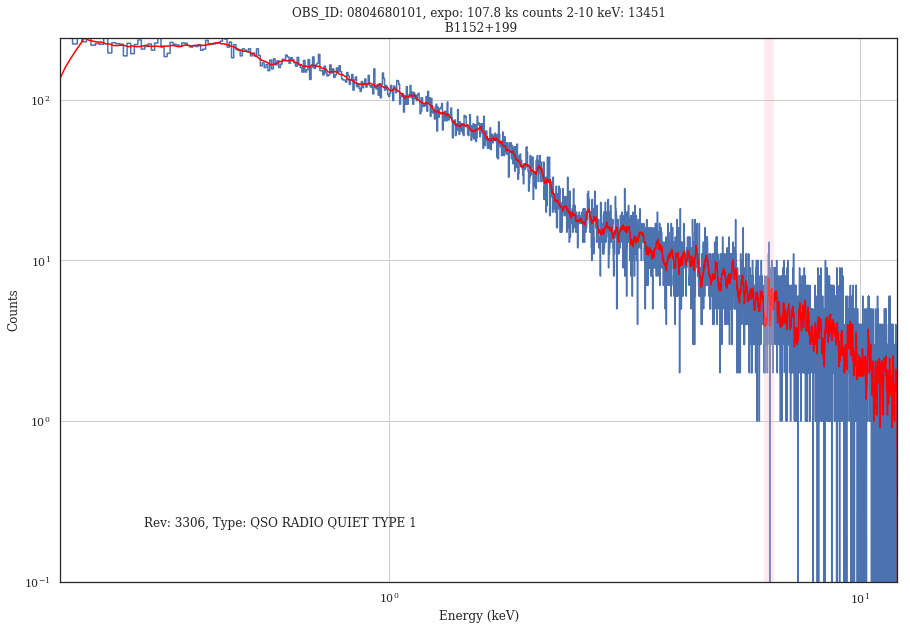

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810230701_PPS_nxsa.tar. Will reuse it.
Extracted 0810230701/pps/P0810230701PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0801400301_PPS_nxsa.tar. Will reuse it.
Extracted 0801400301/pps/P0801400301PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810231101_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0801891601_PPS_nxsa.tar. Will reuse it.
Extracted 0801891601/pps/P0801891601PNS003SRSPEC0001.FTZ


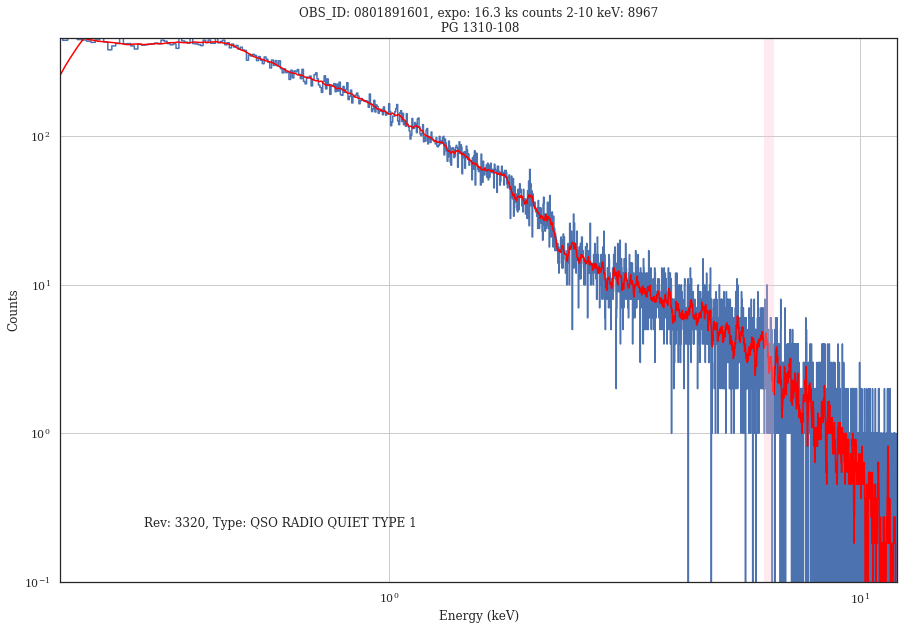

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810231001_PPS_nxsa.tar. Will reuse it.
Extracted 0810231001/pps/P0810231001PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810230101_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810220101_PPS_nxsa.tar. Will reuse it.
Extracted 0810220101/pps/P0810220101PNS002SRSPEC0001.FTZ


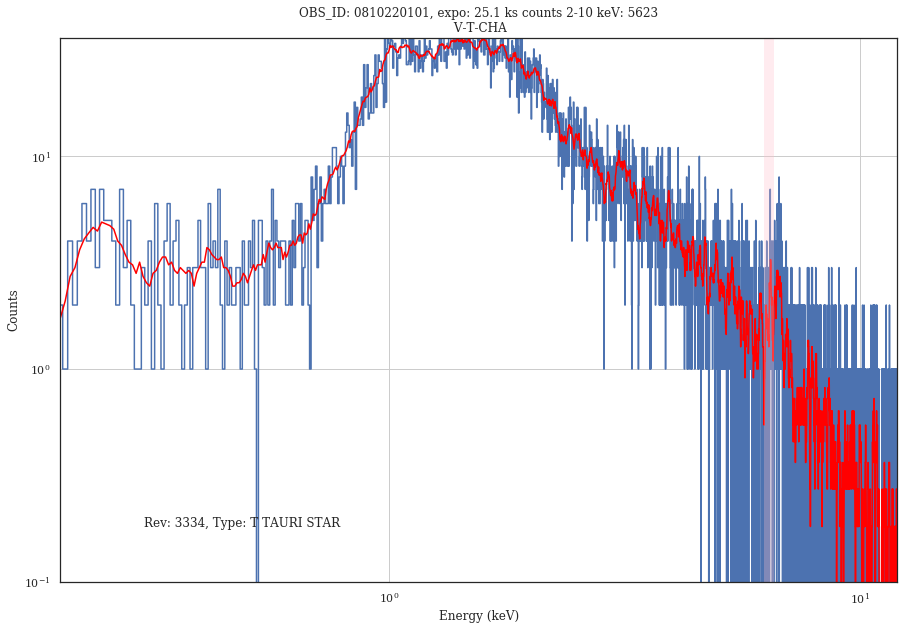

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0811213301_PPS_nxsa.tar. Will reuse it.
Extracted 0811213301/pps/P0811213301PNS003SRSPEC0001.FTZ


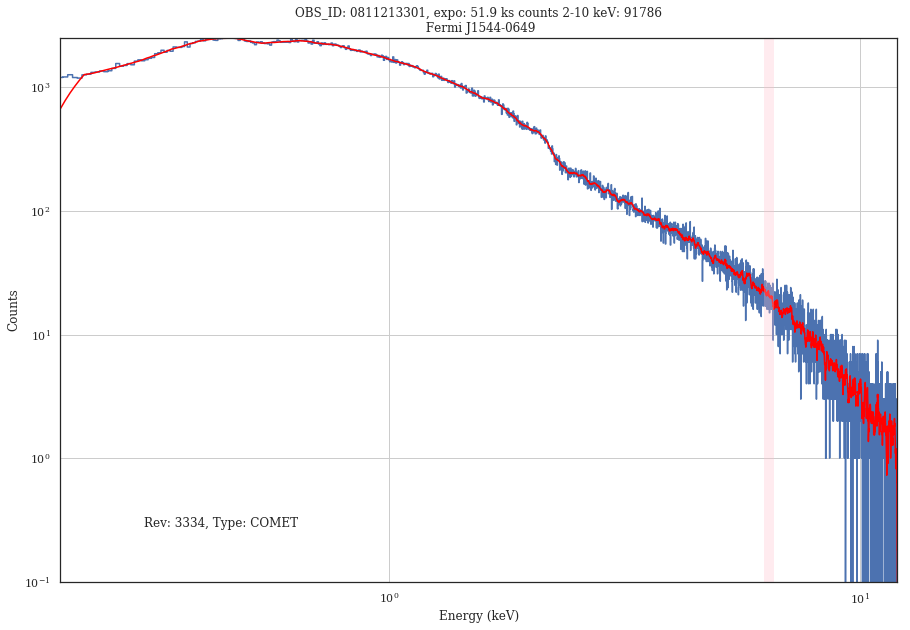

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810220401_PPS_nxsa.tar. Will reuse it.
Extracted 0810220401/pps/P0810220401PNS002SRSPEC0001.FTZ


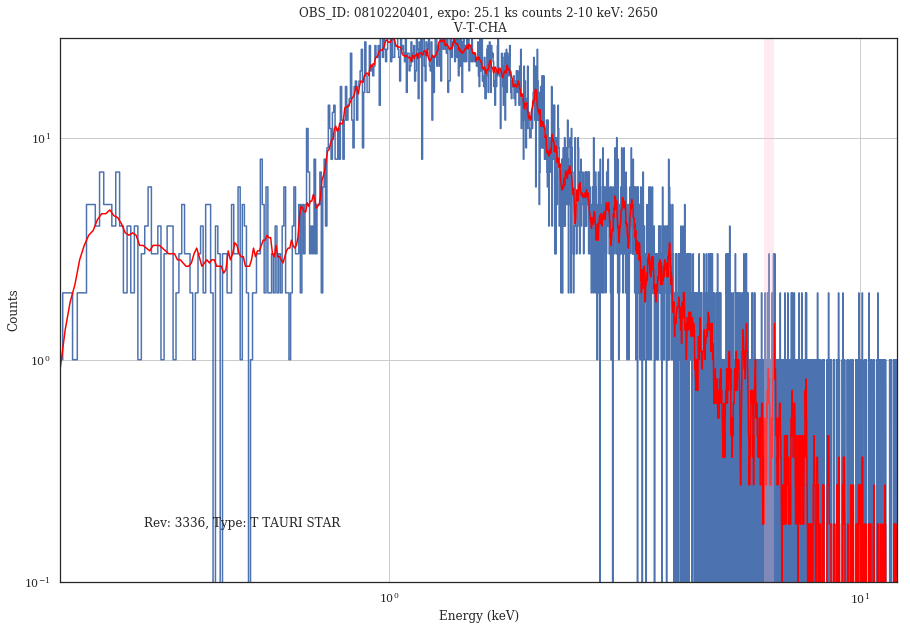

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810230601_PPS_nxsa.tar. Will reuse it.
Extracted 0810230601/pps/P0810230601PNS001SRSPEC0001.FTZ


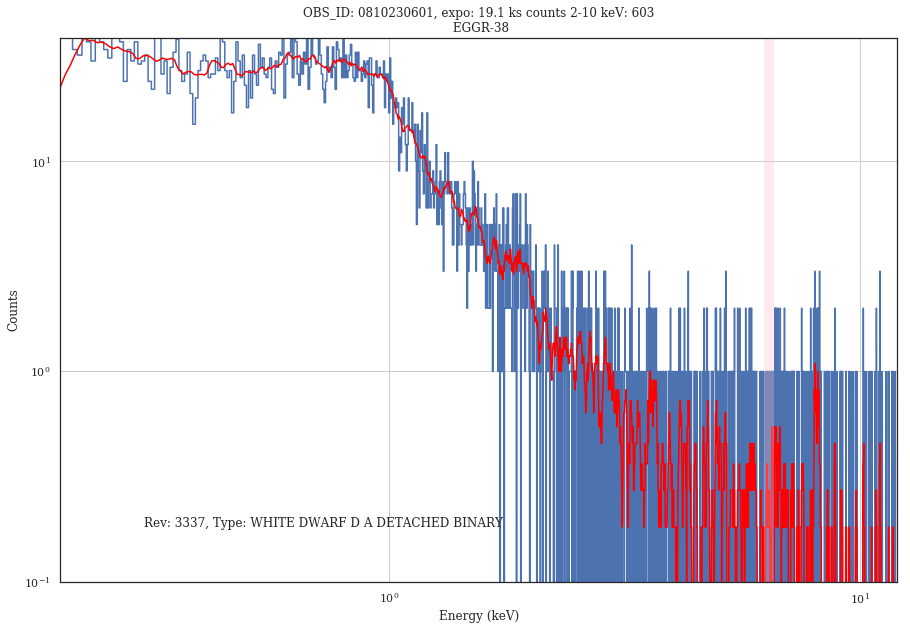

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810220501_PPS_nxsa.tar. Will reuse it.
Extracted 0810220501/pps/P0810220501PNS002SRSPEC0001.FTZ


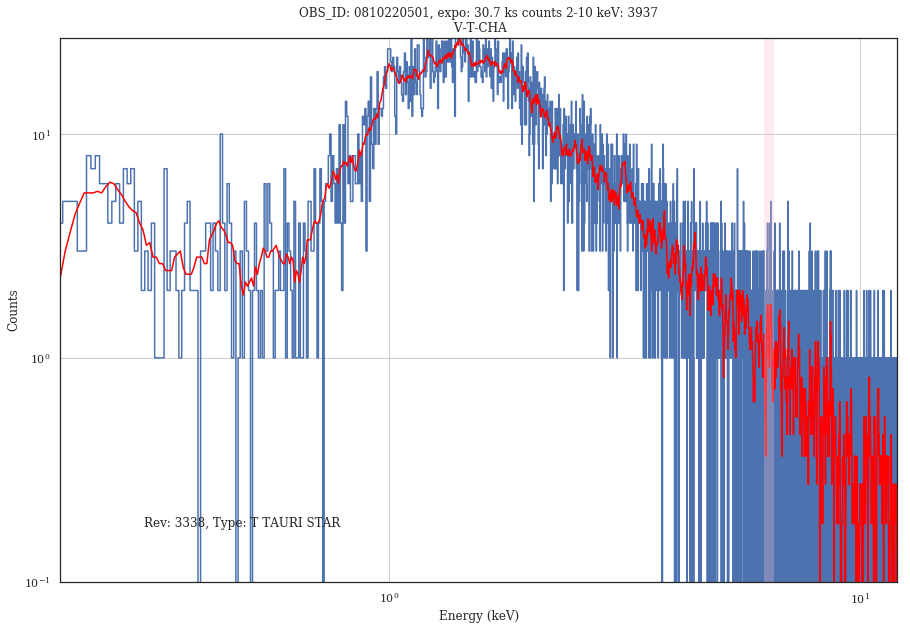

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804590701_PPS_nxsa.tar. Will reuse it.
Extracted 0804590701/pps/P0804590701PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0804520301_PPS_nxsa.tar. Will reuse it.
Extracted 0804520301/pps/P0804520301PNS003SRSPEC0001.FTZ


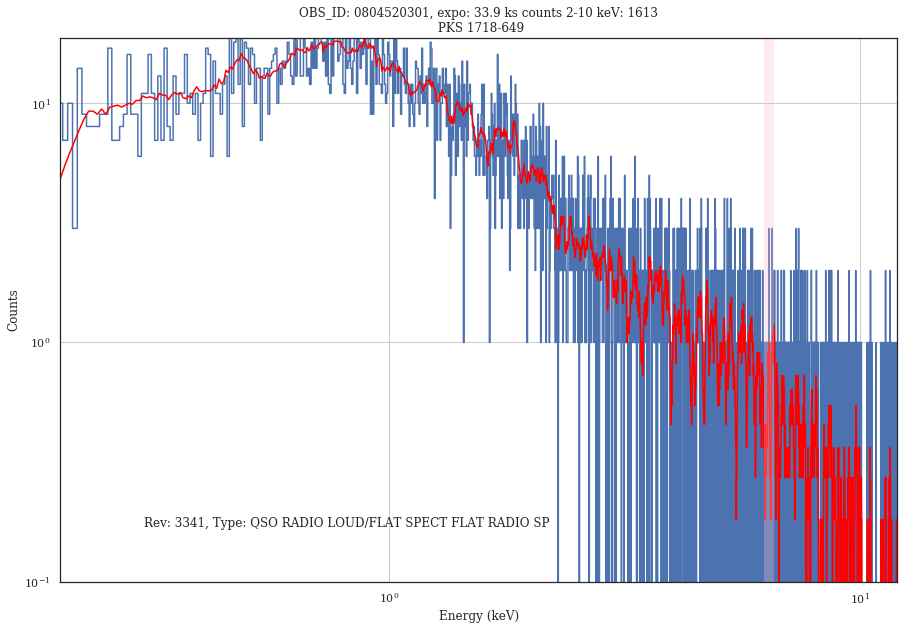

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0801880501_PPS_nxsa.tar. Will reuse it.
Extracted 0801880501/pps/P0801880501PNS003SRSPEC0001.FTZ


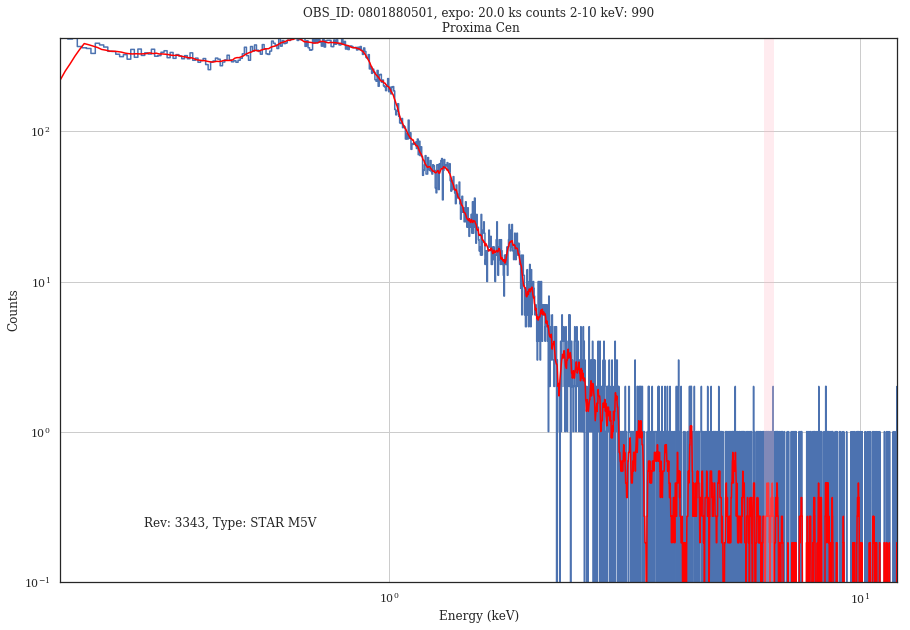

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0510391401_PPS_nxsa.tar. Will reuse it.
Extracted 0510391401/pps/P0510391401PNS005SRSPEC0001.FTZ


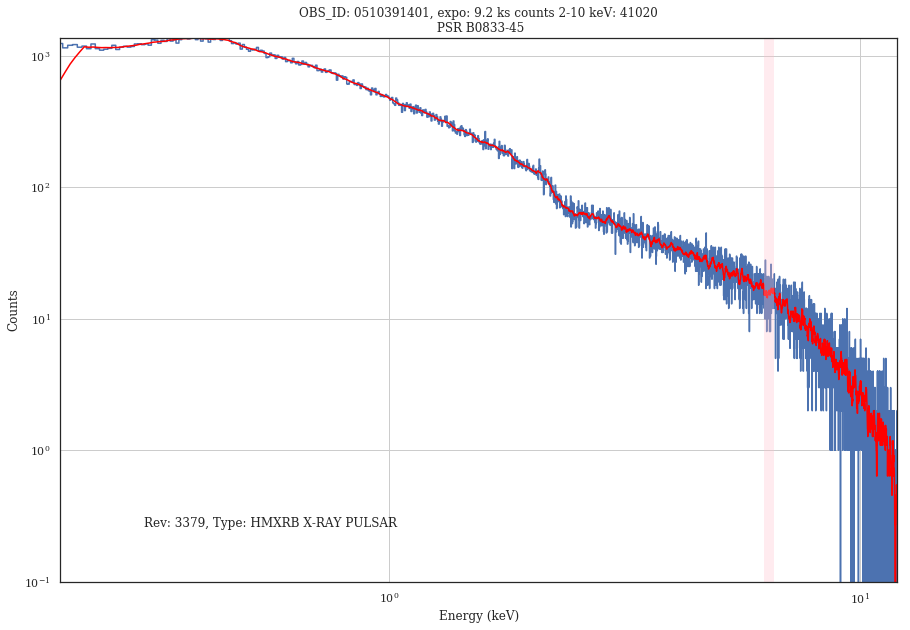

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0820080501_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0820080101_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810230801_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810230901_PPS_nxsa.tar. Will reuse it.
Extracted 0810230901/pps/P0810230901PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810230501_PPS_nxsa.tar. Will reuse it.
Extracted 0810230501/pps/P0810230501PNS001SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0810231301_PPS_nxsa.tar. Will reuse it.
Extracted 0810231301/pps/P0810231301PNS001SRSPEC0001.FTZ


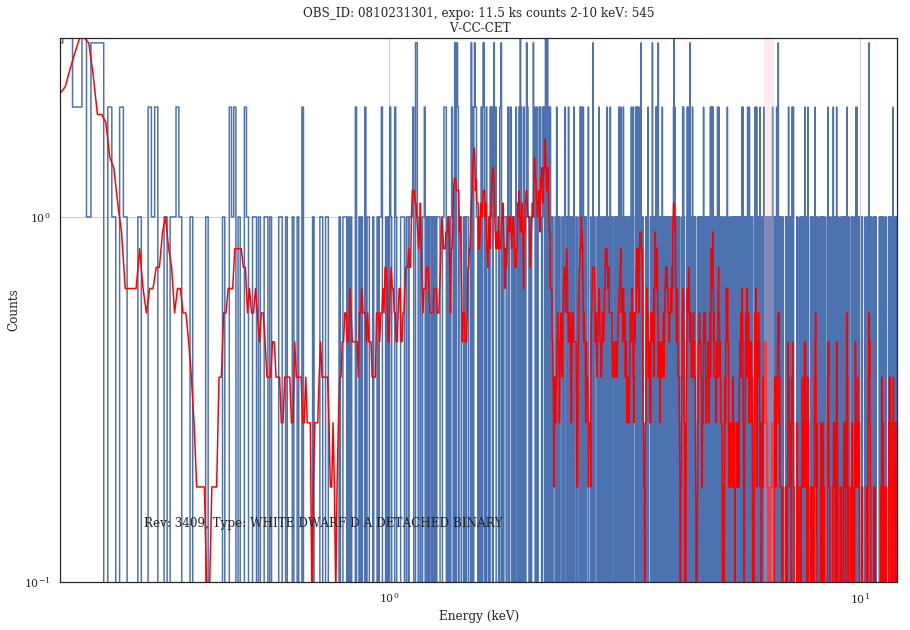

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0820080201_PPS_nxsa.tar. Will reuse it.
Extracted 0820080201/pps/P0820080201PNS006SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0823780201_PPS_nxsa.tar. Will reuse it.
Extracted 0823780201/pps/P0823780201PNS004SRSPEC0001.FTZ


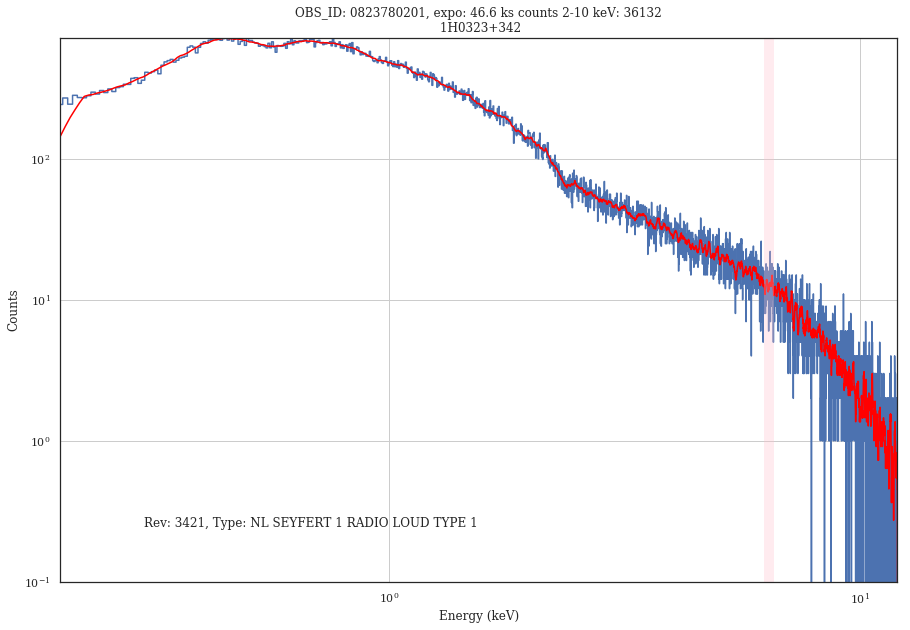

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0823780301_PPS_nxsa.tar. Will reuse it.
Extracted 0823780301/pps/P0823780301PNS004SRSPEC0001.FTZ


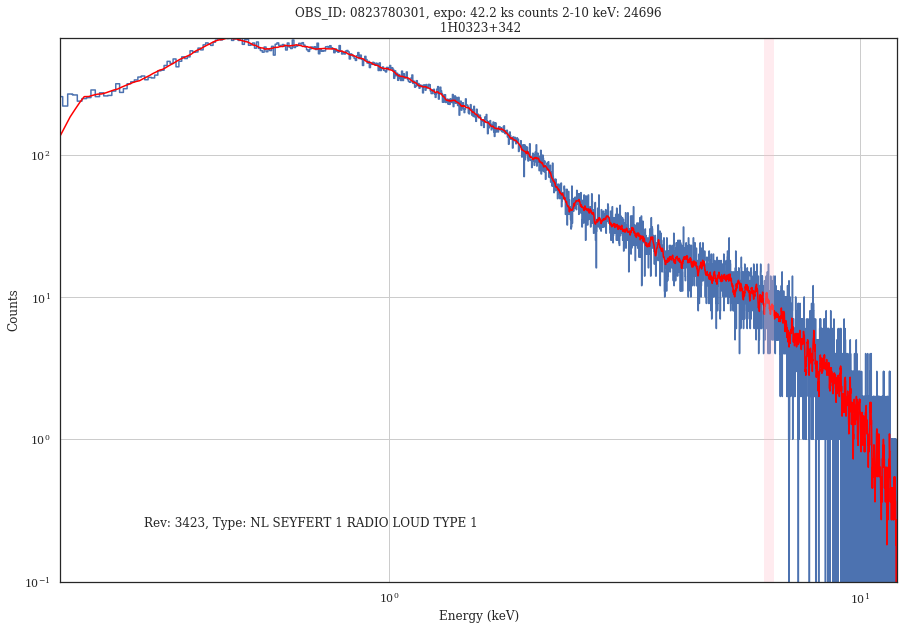

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0823780401_PPS_nxsa.tar. Will reuse it.
Extracted 0823780401/pps/P0823780401PNS004SRSPEC0001.FTZ


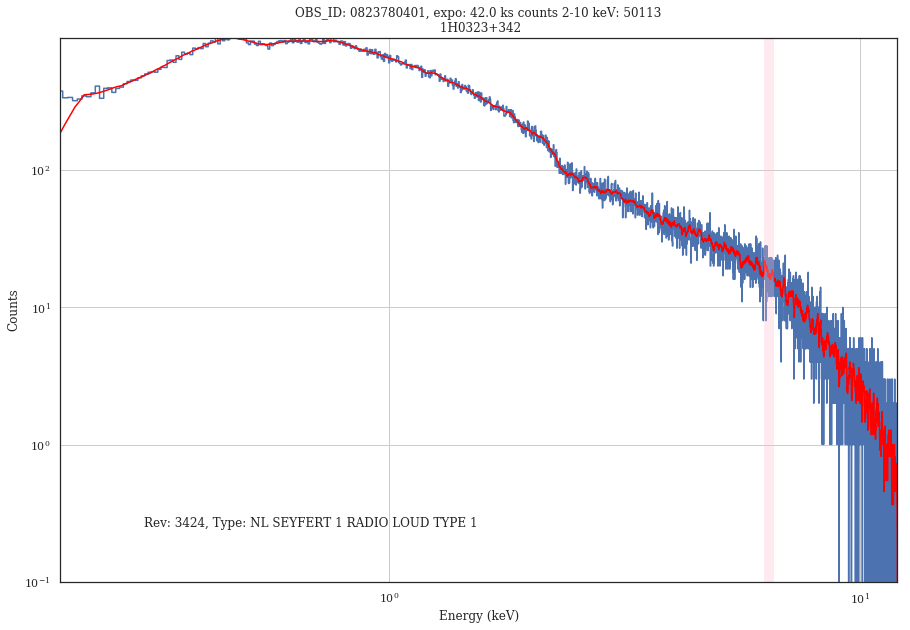

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0823780501_PPS_nxsa.tar. Will reuse it.
Extracted 0823780501/pps/P0823780501PNS004SRSPEC0001.FTZ


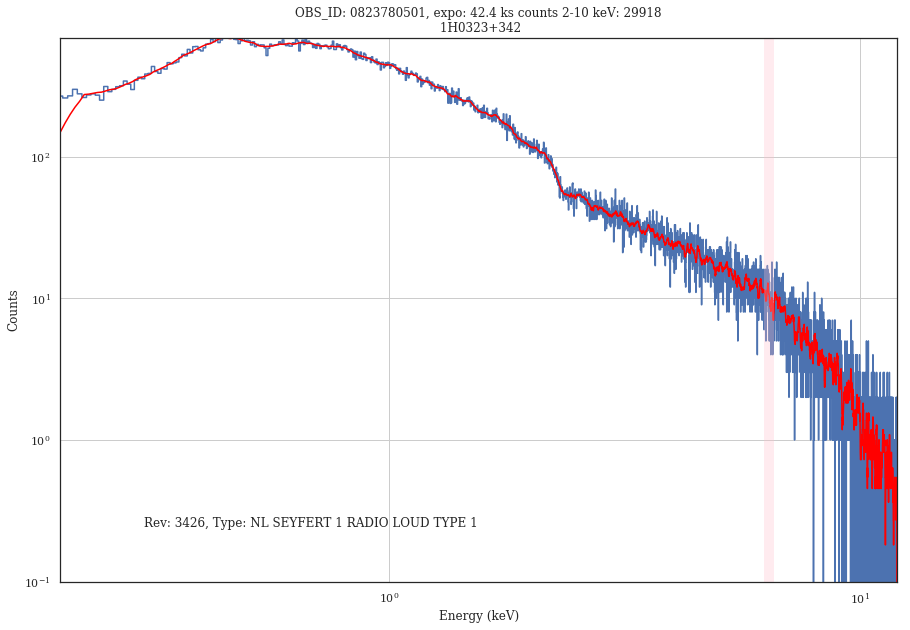

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0823780601_PPS_nxsa.tar. Will reuse it.
Extracted 0823780601/pps/P0823780601PNS004SRSPEC0001.FTZ


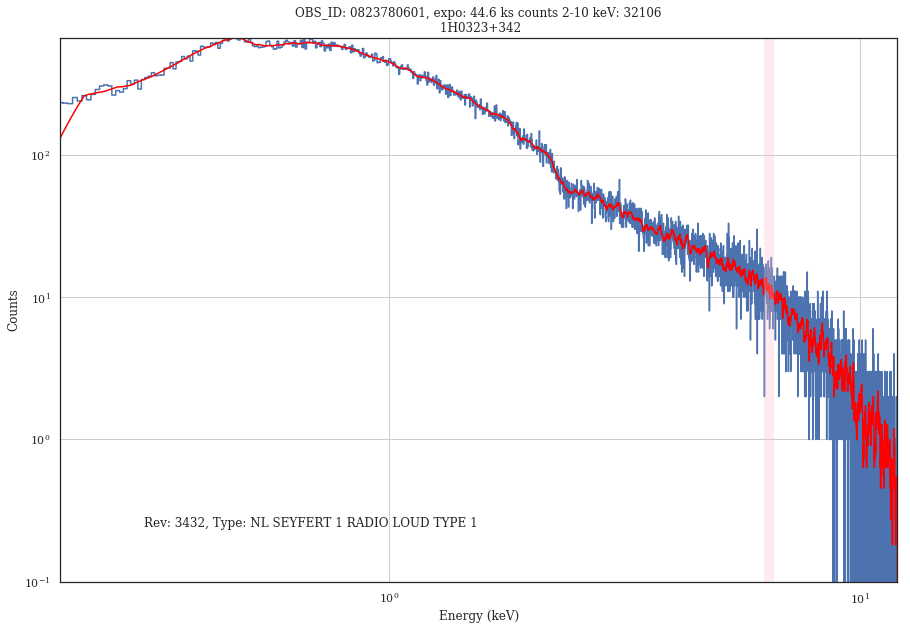

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0822070201_PPS_nxsa.tar. Will reuse it.
Extracted 0822070201/pps/P0822070201PNU002SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0823780701_PPS_nxsa.tar. Will reuse it.
Extracted 0823780701/pps/P0823780701PNS004SRSPEC0001.FTZ


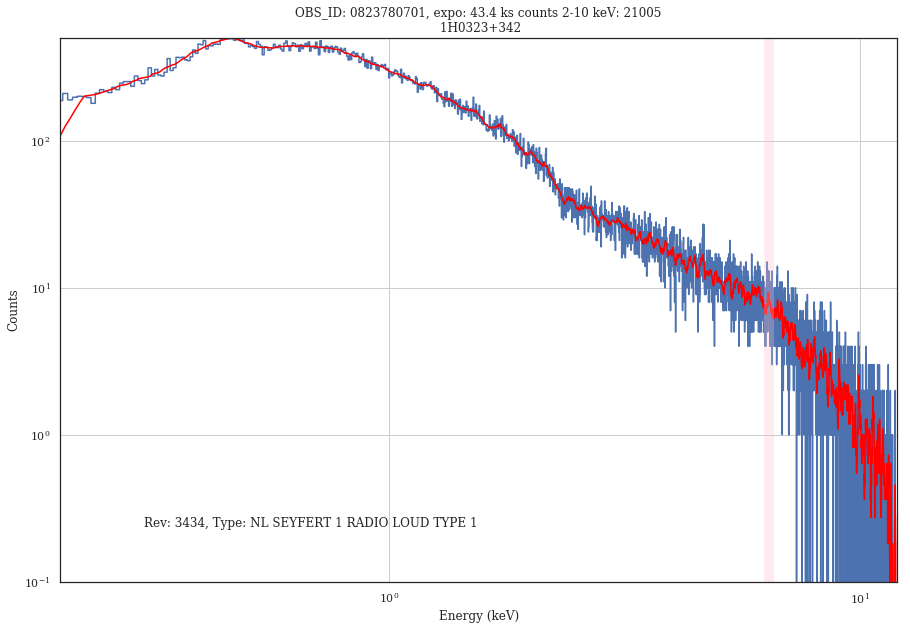

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0830390101_PPS_nxsa.tar. Will reuse it.
Extracted 0830390101/pps/P0830390101PNS003SRSPEC0001.FTZ


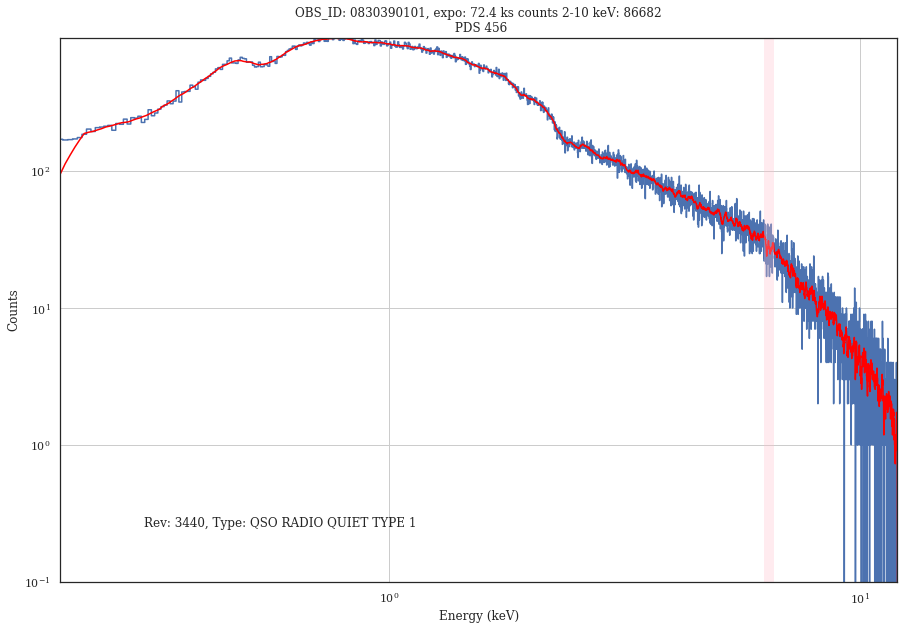

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0822070101_PPS_nxsa.tar. Will reuse it.
Extracted 0822070101/pps/P0822070101PNS003SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0824230201_PPS_nxsa.tar. Will reuse it.
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0831790201_PPS_nxsa.tar. Will reuse it.
Extracted 0831790201/pps/P0831790201PNS003SRSPEC0001.FTZ


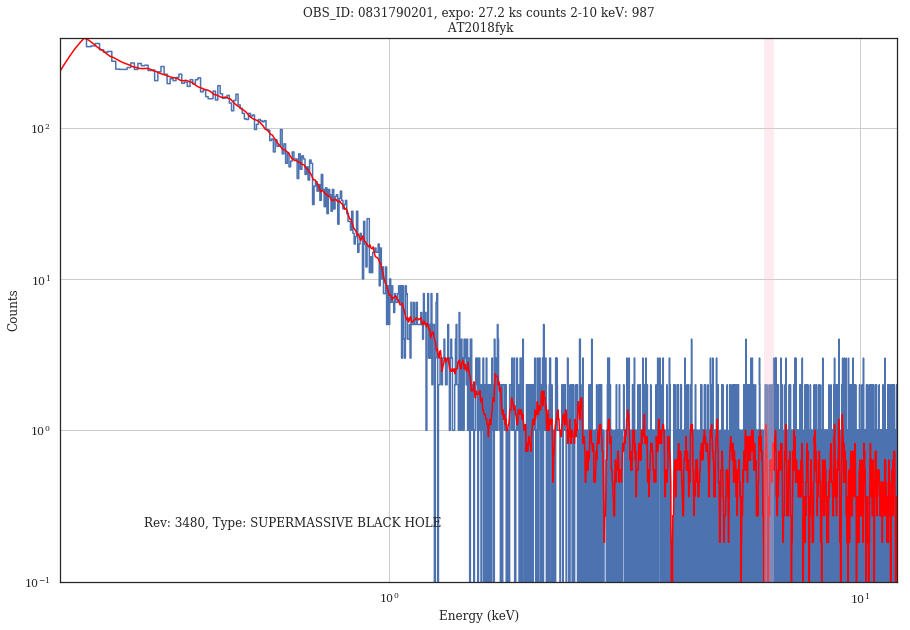

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0831790401_PPS_nxsa.tar. Will reuse it.
Extracted 0831790401/pps/P0831790401PNS003SRSPEC0001.FTZ


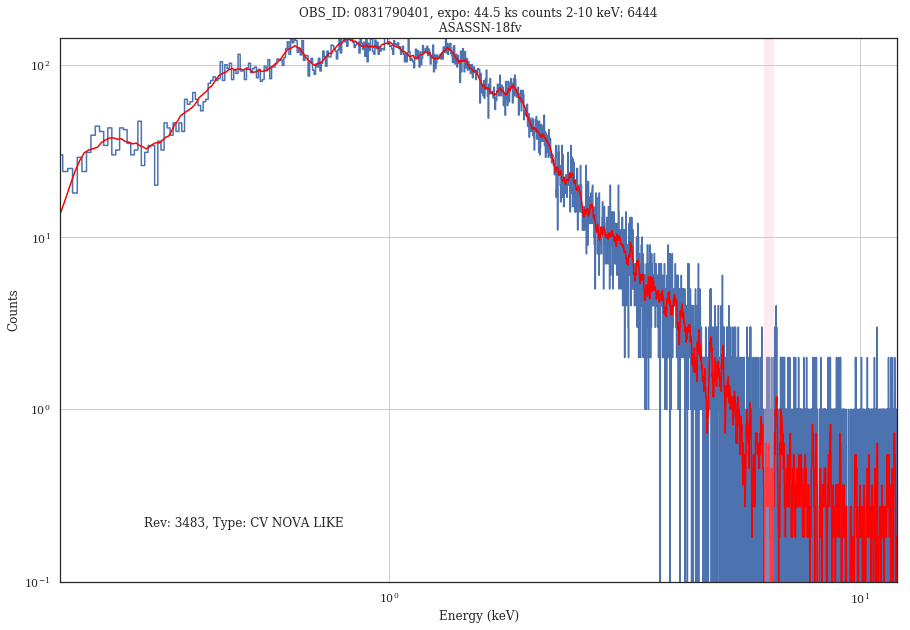

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0830470101_PPS_nxsa.tar. Will reuse it.
Extracted 0830470101/pps/P0830470101PNS003SRSPEC0001.FTZ


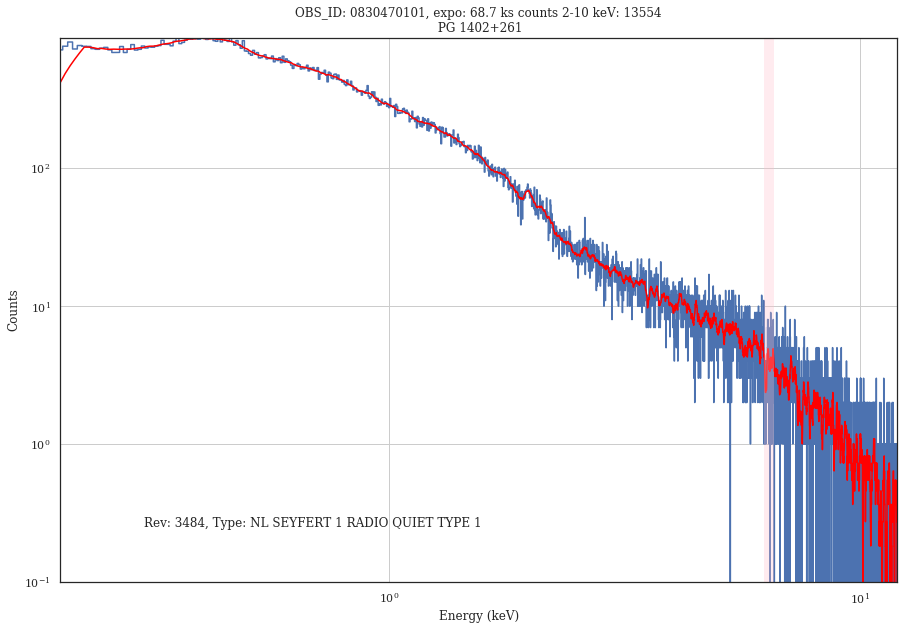

Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0820080401_PPS_nxsa.tar. Will reuse it.
Extracted 0820080401/pps/P0820080401PNS007SRSPEC0001.FTZ
Found an already existing PPS tar file: /lhome/ivaltchanov/XMM-data/cache/0822070301_PPS_nxsa.tar. Will reuse it.
Extracted 0822070301/pps/P0822070301PNS003SRSPEC0001.FTZ


In [186]:
for i,j in enumerate(obsid):
    out_hdu = get_pn_spectrum(j,cache_dir=tmpDir)
    if (out_hdu != None):
        plot_spectrum(out_hdu,smooth = 11,annotation=ann[i],loglog=True,sigma=None,
                      counts_lim = 500, pngName=f"{wdir}/spec_plots/{pngNames[i]}")

In [155]:
len(out_hdu['SPECTRUM'].data['GROUPING'])

4096

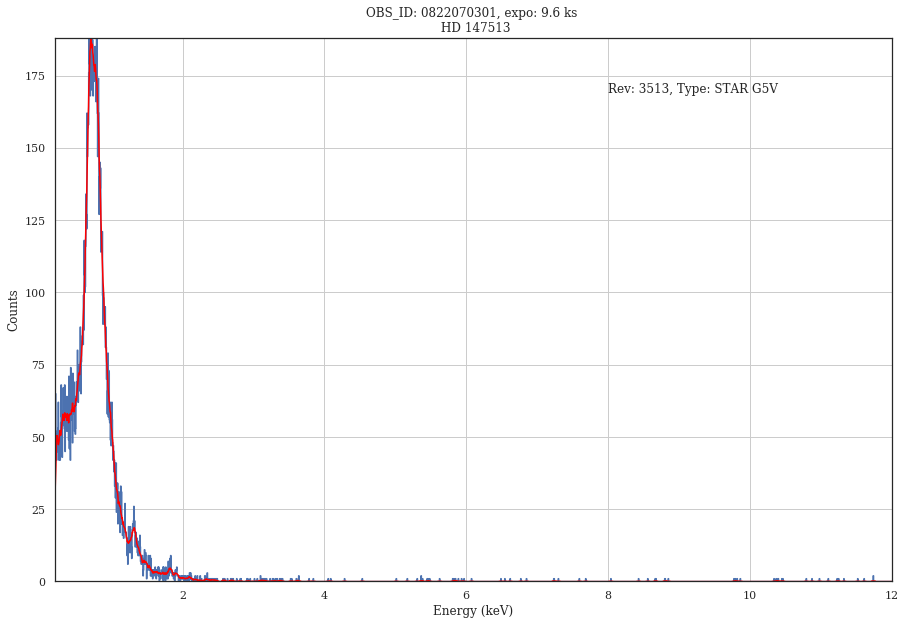

In [138]:
plot_spectrum(out_hdu,smooth = 11,annotation=ann[-1],loglog=False,pngName=f"{wdir}/spec_plots/{pngNames[-1]}")

<Table masked=True length=360>
              name               dtype n_bad
-------------------------------- ----- -----
      OBSERVATION.OBSERVATION_ID int64     0
              OBSERVATION.TARGET str20     0
              OBSERVATION.RA_NOM str14     0
             OBSERVATION.DEC_NOM str20     0
          OBSERVATION.REVOLUTION str23     0
           OBSERVATION.START_UTC str23     0
             OBSERVATION.END_UTC int64     0
            OBSERVATION.DURATION str43     0
         TARGET_TYPE.DESCRIPTION str20     0
             PROPOSAL.PI_SURNAME str18     0
                   PROPOSAL.TYPE str23     0
OBSERVATION.PROPRIETARY_END_DATE str14   236
           OBSERVATION.COORD_OBS int64   360
